In [2]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
import copy
import matplotlib.pyplot as plt
import glob
from pathlib import Path
import os
import plotly.express as px
from matplotlib import cm
import matplotlib as mpl
from sklearn import metrics
from sklearn.ensemble import RandomForestRegressor, RandomForestClassifier
from sklearn.inspection import PartialDependenceDisplay
from sklearn.inspection import partial_dependence
import matplotlib as mpl
from matplotlib import cm
import cartopy.crs as ccrs
import cartopy
import random
import xarray as xr
import itertools
import sklearn
from sklearn.linear_model import LinearRegression
from sklearn.feature_selection import SequentialFeatureSelector
from scipy.stats import gaussian_kde
import statsmodels.api as sm
from statsmodels.regression.linear_model import OLS
from statsmodels.tools import add_constant
from sklearn import tree
from sklearn.model_selection import cross_validate
import geopandas as gpd
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold
from sklearn.model_selection import train_test_split
from pathos.threading import ThreadPool as Pool
from sklearn import datasets, linear_model
from sklearn.inspection import permutation_importance
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error, mean_absolute_percentage_error
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from matplotlib.colors import ListedColormap, LinearSegmentedColormap
import matplotlib

In [3]:
work_dir=Path("/mnt/u/LSM root zone/global_sr")
fig_dir=Path('/mnt/c/Users/fransjevanoors/surfdrive - Fransje van Oorschot@surfdrive.surf.nl/Fransje/global_SR/global_sr_paper/figures')

In [4]:
data_sources = 'gswp-p_gleam-ep_gswp-t'

In [5]:
# performance metrics
def rmse(y,y_pred):
    rmse = np.sqrt(mean_squared_error(y,y_pred))
    return rmse

def r2_adj(y,y_pred,features):
    r2 = r2_score(y, y_pred)
    r2_adj = 1-(((1-r2)*(len(y)-1))/(len(y)-len(features)-1))
    return r2_adj

def llf_(y, X, pr):
    # return maximized log likelihood
    nobs = float(X.shape[0])
    nobs2 = nobs / 2.0
    nobs = float(nobs)
    resid = y - pr
    ssr = np.sum((resid)**2)
    llf = -nobs2*np.log(2*np.pi) - nobs2*np.log(ssr / nobs) - nobs2
    return llf

def aic(y, X, pr, p):
    # return aic metric
    llf = llf_(y, X, pr)
    return -2*llf+2*p

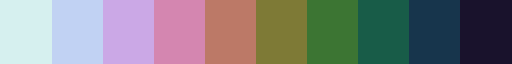

In [6]:
cmap = cm.get_cmap('cubehelix_r', 12)
color_list = [matplotlib.colors.rgb2hex(cmap(i)[:3]) for i in range(cmap.N)]
cmap_sr = ListedColormap(color_list[1:-1])
cmap_sr.set_over(color_list[-1])
cmap_sr.set_under(color_list[0])
cmap_sr.set_bad('lightgrey')
cmap_sr

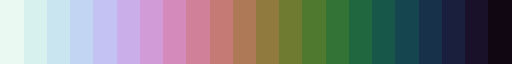

In [7]:
cmap = cm.get_cmap('cubehelix_r', 24)
color_list = [matplotlib.colors.rgb2hex(cmap(i)[:3]) for i in range(cmap.N)]
cmap_sr = ListedColormap(color_list[1:-1])
cmap_sr.set_over(color_list[-1])
cmap_sr.set_under(color_list[0])
cmap_sr.set_bad('lightgrey')
cmap_sr

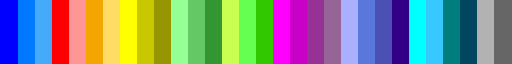

In [8]:
c1= [0/255,0/255,255/255]
c2= [0/255, 120/255,255/255]
c3= [70/255, 170/255, 250/255]
c4= [255/255,0/255,0/255]
c5= [255/255, 150/255, 150/255]
c6= [245/255, 165/255,0/255]
c7= [255/255, 220/255, 100/255]
c8= [255/255,255/255,0/255]
c9= [200/255, 200/255,0/255]
c10= [150/255, 150/255,0/255]
c11= [150/255,255/255, 150/255]
c12= [100/255, 200/255, 100/255]
c13= [50/255, 150/255 ,50/255]
c14= [200/255,255/255, 80/255]
c15= [100/255,255/255, 80/255]
c16= [50/255, 200/255,0/255]
c17= [255/255,0/255,255/255]
c18= [200/255,0/255 ,200/255]
c19= [150/255, 50/255 ,150/255]
c20= [150/255, 100/255 ,150/255]
c21= [170/255, 175/255 ,255/255]
c22= [90/255, 120/255 ,220/255]
c23= [75/255, 80/255, 180/255]
c24= [50/255 ,0/255, 135/255]
c25= [0/255 ,255/255,255/255]
c26= [55/255 ,200/255,255/255]
c27= [0/255 ,125/255, 125/255]
c28= [0/255, 70/255, 95/255]
c29= [178/255 ,178/255, 178/255]
c30= [102/255, 102/255, 102/255]

colors=[c1,c2,c3,c4,c5,c6,c7,c8,c9,c10,c11,c12,c13,c14,c15,c16,c17,c18,c19,c20,c21,c22,c23,c24,c25,c26,c27,c28,c29,c30]
cm_kg = ListedColormap(colors)
cm_kg

## 0. plot Sr

### make sure we use the correct catchments - final selection

3612


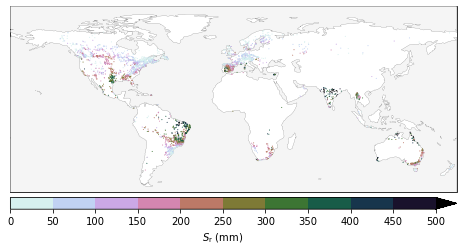

In [7]:
df = pd.read_csv(f'{work_dir}/output/catchment_characteristics/master_characteristics_{data_sources}_v2.csv',index_col=0)
df = df[df.p_mean-df.q_mean < df.ep_mean]
df = df[['p_mean','ep_mean', 't_mean','tdiff_mean','idu_mean', 'si_ep','si_p', 'asi','dtb','ia','slp_mean','el_mean','tc','ntc','nonveg','pclay','psand','lai_mean','lai_rsd','sc_mean','sc_rsd','sr_20','lat','lon']]
df = df.dropna()
df = df[['lat','lon','sr_20']]
cmap_vd2 = cmap_sr
print(len(df))

bounds = np.linspace(0,500,11)
bounds2 = np.linspace(0,500,11)
norm = mpl.colors.BoundaryNorm(bounds, cmap_vd2.N)

# no irrigation
fig = plt.figure(figsize=(8,8))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.coastlines(linewidth=0.001)
ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.12)
ax.set_global()
ax.set_xlim(-180,180)
ax.set_ylim(-60,90)
s = ax.scatter(df.lon,df.lat,s=0.8,c=df['sr_20'],cmap=cmap_vd2, norm=norm,edgecolors='face',marker='o',linewidths=0.1,zorder=101)
cbar = plt.colorbar(s, orientation='horizontal', label='',spacing='proportional',extend='max', pad=0.012,aspect=38, norm=norm,ticks=bounds2)
cbar.ax.tick_params(labelsize=10)
cbar.set_label(label='$S_\mathrm{r}$ (mm)', size=10)
ax.set_title('',size=14)
# fig.savefig(f'{fig_dir}/sr_map_t20.jpg',bbox_inches='tight',dpi=600)

## 1. CORRELATION MATRIX

In [146]:
f = f'{work_dir}/output/catchment_characteristics/master_characteristics_gswp-p_gleam-ep_gswp-t_v2.csv'
df = pd.read_csv(f,index_col=0)
df = df.drop(columns=['stext','start_year','end_year','years','kg','lat','lon'])
df = df.drop(columns=['idu_mean_l', 'idu_max_l', 'hpd_mean_l',
       'hpd_max_l', 'hpf_l', 'lpf_l', 'si_pl', 'phi_l', 'de_l', 'dp_l', 'dt_l',
       'sp_l', 'st_l', 'se_l', 'sd_l', 'sti_l', 'asi_l','ppd_l'])
df = df.drop(columns=['sti','area'])
df = df.drop(columns=['q_mean'])
df = df.dropna()
corr = df.corr()
# corr.style.background_gradient(cmap='coolwarm').set_precision(2)
corr.style.background_gradient(cmap='coolwarm').set_precision(2).to_excel(f'{work_dir}/output/regression/correlation_matrix.xlsx')

/tmp/ipykernel_252/392442107.py:12: FutureWarning: this method is deprecated in favour of `Styler.format(precision=..)`
  corr.style.background_gradient(cmap='coolwarm').set_precision(2).to_excel(f'{work_dir}/output/regression/correlation_matrix.xlsx')


In [145]:
df.columns

Index(['p_mean', 'ep_mean', 't_mean', 'ai', 'hai', 'tdiff_max', 'tdiff_mean',
       'idu_mean', 'idu_max', 'hpd_mean', 'hpd_max', 'hpf', 'lpf', 'si_p',
       'si_ep', 'phi', 'de', 'dp', 'dt', 'sp', 'st', 'se', 'sd', 'ftf', 'asi',
       'cvp', 'ppd', 'phi_sc', 'tc', 'ntc', 'nonveg', 'el_mean', 'el_min',
       'el_max', 'el_std', 'slp_mean', 'slp_max', 'slp_min', 'slp_std', 'iwu',
       'ia', 'bp', 'dtb', 'pclay', 'psand', 'pcarb', 'bulk', 'fc_mean',
       'lai_mean', 'lai_rsd', 'fc_rsd', 'sc_mean', 'sc_rsd', 'sr_20'],
      dtype='object')

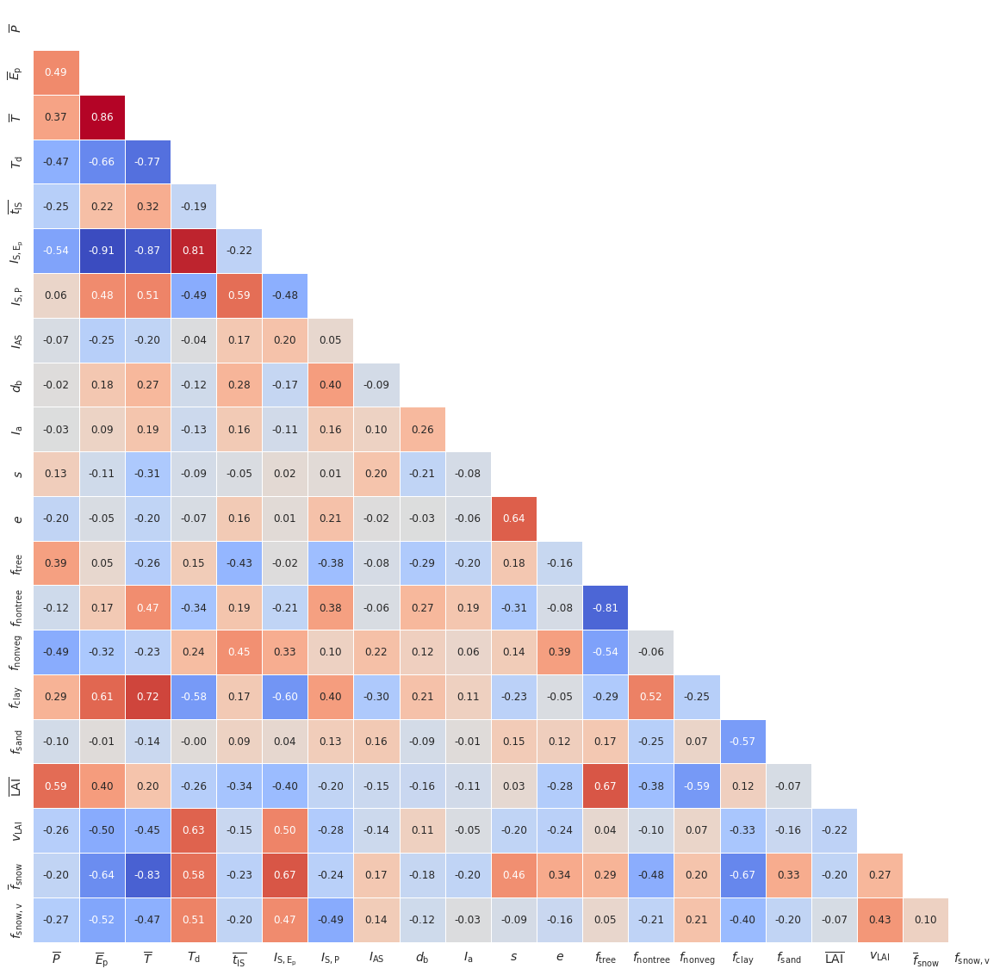

In [152]:
f = f'{work_dir}/output/catchment_characteristics/master_characteristics_gswp-p_gleam-ep_gswp-t.csv'
df = pd.read_csv(f,index_col=0)
features = ['p_mean','ep_mean', 't_mean','tdiff_mean','idu_mean', 'si_ep','si_p', 'asi','dtb','ia','slp_mean','el_mean','tc','ntc','nonveg','pclay','psand','lai_mean','lai_rsd','sc_mean','sc_rsd']
df = df[features]
df = df.dropna()
df = df.rename(columns={'idu_mean':'$\overline{t_\mathrm{IS}}$','tdiff_mean':'$T_{\mathrm{d}}$','t_mean':'$\overline{T}$', 'asi':'$I_{\mathrm{AS}}$','p_mean':'$\overline{P}$','si_p':'$I_{\mathrm{S,P}}$','ep_mean':'$\overline{E}_\mathrm{p}$',
                    'sc_mean':'$\overline{f}_{\mathrm{snow}}$','pclay':'$f_{\mathrm{clay}}$','slp_mean':'$s$','lai_mean':'$\overline{\mathrm{LAI}}$','ntc':'$f_{\mathrm{nontree}}$','dtb':'$d_{\mathrm{b}}$','si_ep':'$I_{\mathrm{S,E_p}}$',
                        'lai_rsd':'$v_\mathrm{LAI}$','nonveg':'$f_{\mathrm{nonveg}}$','el_mean':'$e$','psand':'$f_{\mathrm{sand}}$','sc_rsd':'$f_{\mathrm{snow,v}}$','tc':'$f_{\mathrm{tree}}$','ia':'$I_\mathrm{a}$'})
corr = df.corr()
mask = np.zeros_like(corr, dtype=bool)
mask[np.triu_indices_from(mask)] = True
corr[mask] = np.nan
import seaborn as sns
sns.set(style='white')  # Set the background style

# Create a heatmap
fig = plt.figure(figsize=(20,20))
h=sns.heatmap(corr, annot=True, cmap='coolwarm', fmt='.2f', linewidths=.5,cbar=False)
h.set_xticklabels(h.get_xticklabels(), size=14)
h.set_yticklabels(h.get_xticklabels(), size=14)
fig.savefig(f'{fig_dir}/corr_matrix.jpg',bbox_inches='tight',dpi=300)

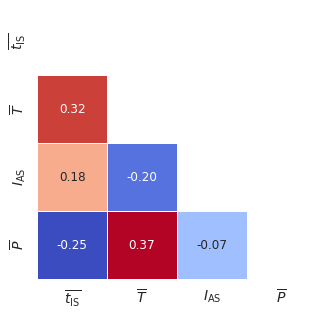

In [156]:
f = f'{work_dir}/output/catchment_characteristics/master_characteristics_gswp-p_gleam-ep_gswp-t.csv'
df = pd.read_csv(f,index_col=0)
features = ['idu_mean', 't_mean','asi','p_mean']
df = df[features]
df = df.dropna()
df = df.rename(columns={'idu_mean':'$\overline{t_\mathrm{IS}}$','t_mean':'$\overline{T}$', 'asi':'$I_{\mathrm{AS}}$','p_mean':'$\overline{P}$'})
corr = df.corr()
mask = np.zeros_like(corr, dtype=bool)
mask[np.triu_indices_from(mask)] = True
corr[mask] = np.nan
import seaborn as sns
sns.set(style='white')  # Set the background style

# Create a heatmap
fig = plt.figure(figsize=(5,5))
h=sns.heatmap(corr, annot=True, cmap='coolwarm', fmt='.2f', linewidths=.5,cbar=False)
h.set_xticklabels(h.get_xticklabels(), size=14)
h.set_yticklabels(h.get_xticklabels(), size=14)
fig.savefig(f'{fig_dir}/corr_matrix_4var.jpg',bbox_inches='tight',dpi=300)

## 2. PCA

In [6]:
f = f'{work_dir}/output/catchment_characteristics/master_characteristics_gswp-p_gleam-ep_gswp-t.csv'
df = pd.read_csv(f,index_col=0)
df = df.drop(columns=['stext','start_year','end_year','years','kg','lat','lon'])
df = df.drop(columns=['idu_mean_l', 'idu_max_l', 'hpd_mean_l',
       'hpd_max_l', 'hpf_l', 'lpf_l', 'si_pl', 'phi_l', 'de_l', 'dp_l', 'dt_l',
       'sp_l', 'st_l', 'se_l', 'sd_l', 'sti_l', 'asi_l','ppd_l'])
df = df.drop(columns=['q_mean'])
df = df.drop(columns=['slp_max','slp_min','slp_std','el_max','el_std','el_min','hand_max','hand_median','hand_min','sti'])
df = df.dropna()
# df.columns

In [7]:
features = df.columns
lf = len(features)
print('length of features:', lf)
X = df[features]
X = X.dropna()
X = StandardScaler().fit_transform(X) #standardize all values
X = pd.DataFrame(X,columns=features)

pca = PCA(n_components=lf)
components = pca.fit_transform(X)

loadings = pca.components_ #eigenvector, length represents variance var explains
 
# Create dataframe
pca_df = pd.DataFrame(data=components[:,0:2],columns=['PC1', 'PC2'])

pca_df_scaled = pca_df.copy()
 
scaler_df = pca_df[['PC1', 'PC2']]
scaler = 1 / (scaler_df.max() - scaler_df.min()) # WAAROM DIT?
 
for index in scaler.index:
    pca_df_scaled[index] *= scaler[index]

per_var  = np.round(pca.explained_variance_ratio_ * 100, decimals=1)
# per_var

length of features: 49


In [8]:
ld_df = pd.DataFrame(index=features, columns=['x-loading','y-loading'])
ld_df['x-loading'] = np.round(loadings[0],2)
ld_df['y-loading'] = np.round(loadings[1],2)
ld_df['length-loading'] = np.round(np.sqrt(loadings[0]**2+loadings[1]**2),2)
# ld_df

In [9]:
ld_sort = abs(ld_df).sort_values('x-loading',ascending=False)
ld_sort = ld_sort[0:25]
ld_sort['rank'] = np.arange(1,len(ld_sort)+1,1)
ld_sort = ld_sort.drop(columns=['length-loading','y-loading'])
ld_sort['var'] = ld_sort.index
ld_sort.index = ld_sort['rank']
ld_sort = ld_sort.drop(columns='rank')
ld_sort = ld_sort[['var','x-loading']]
# ld_sort

In [10]:
ld_sort = abs(ld_df).sort_values('y-loading',ascending=False)
ld_sort = ld_sort[0:25]
ld_sort['rank'] = np.arange(1,len(ld_sort)+1,1)
ld_sort = ld_sort.drop(columns=['length-loading','x-loading'])
ld_sort['var'] = ld_sort.index
ld_sort.index = ld_sort['rank']
ld_sort = ld_sort.drop(columns='rank')
ld_sort = ld_sort[['var','y-loading']]
# ld_sort

In [11]:
ld_sort = abs(ld_df).sort_values('length-loading',ascending=False)
ld_sort = ld_sort[0:25]
ld_sort['rank'] = np.arange(1,len(ld_sort)+1,1)
ld_sort = ld_sort.drop(columns=['x-loading','y-loading'])
ld_sort['var'] = ld_sort.index
ld_sort.index = ld_sort['rank']
ld_sort = ld_sort.drop(columns='rank')
ld_sort = ld_sort[['var','length-loading']]
# ld_sort

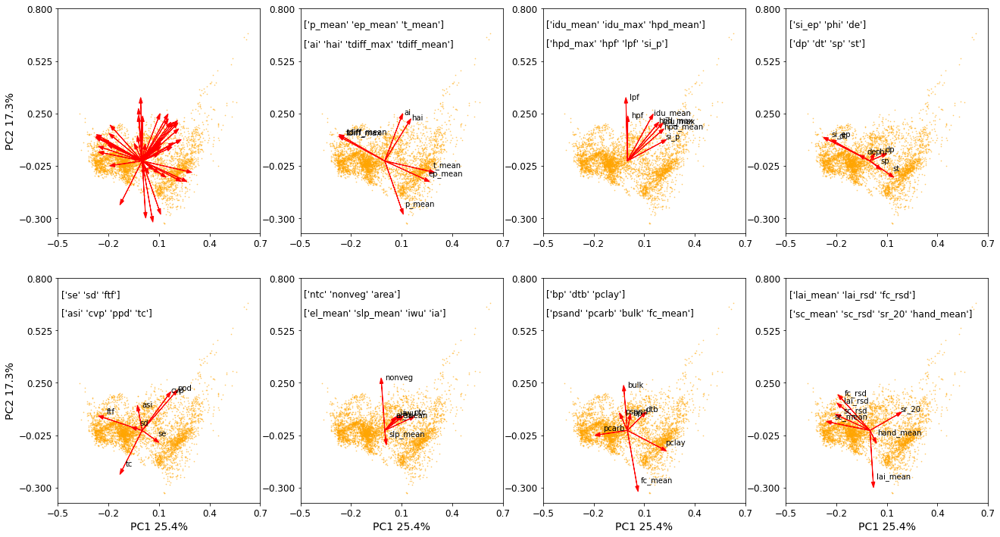

In [12]:
xs = loadings[0]
ys = loadings[1]

ld_df = pd.DataFrame(index=features, columns=['xs','ys'])
ld_df['xs'] = loadings[0]
ld_df['ys'] = loadings[1]
ld_df['len'] = np.sqrt(loadings[0]**2+loadings[1]**2)

# split features for visualization of PCA
p = int(np.round((lf/7),0))
features1=features[0:p]
features2=features[p:2*p]
features3=features[2*p:3*p]
features4=features[3*p:4*p]
features5=features[4*p:5*p]
features6=features[5*p:6*p]
features7=features[6*p:]

fig=plt.figure(figsize=(22,12))
ax = fig.add_subplot(241)
ax.scatter(pca_df_scaled.PC1,pca_df_scaled.PC2,s=0.5,alpha=0.5,color='orange')

for i, varnames in enumerate(features):
    ax.arrow(
        0, 0, # coordinates of arrow base
        ld_df.loc[features[i]]['xs'], # length of the arrow along x
        ld_df.loc[features[i]]['ys'], # length of the arrow along y
        color='r',
        head_width=0.02
        )
    # ax.text(ld_df.loc[features[i]]['xs']+0.02, ld_df.loc[features[i]]['ys']+0.02, varnames,size=10)
xticks = np.linspace(-0.5,0.7, num=5)
yticks = np.linspace(-0.3,0.8, num=5)
ax.set_xticks(xticks)
ax.set_yticks(yticks)
ax.tick_params(axis='both', which='major', labelsize=12)
# ax.set_xlabel(f'PC1 {per_var[0]}%')
ax.set_ylabel(f'PC2 {per_var[1]}%',size=14)

ax = fig.add_subplot(242)
ax.scatter(pca_df_scaled.PC1,pca_df_scaled.PC2,s=0.5,alpha=0.5,color='orange')
for i, varnames in enumerate(features1):
    ax.arrow(
        0, 0, # coordinates of arrow base
        ld_df.loc[features1[i]]['xs'], # length of the arrow along x
        ld_df.loc[features1[i]]['ys'], # length of the arrow along y
        color='r',
        head_width=0.02
        )
    ax.text(ld_df.loc[features1[i]]['xs']+0.02, ld_df.loc[features1[i]]['ys']+0.02, varnames,size=10)
xticks = np.linspace(-0.5,0.7, num=5)
yticks = np.linspace(-0.3,0.8, num=5)
ax.set_xticks(xticks)
ax.set_yticks(yticks)
ax.tick_params(axis='both', which='major', labelsize=12)
ax.text(-0.48,0.7,f'{features1[0:int(len(features1)/2)].values}',size=12)
ax.text(-0.48,0.6,f'{features1[int(len(features1)/2):].values}',size=12)

ax = fig.add_subplot(243)
ax.scatter(pca_df_scaled.PC1,pca_df_scaled.PC2,s=0.5,alpha=0.5,color='orange')
for i, varnames in enumerate(features2):
    ax.arrow(
        0, 0, # coordinates of arrow base
        ld_df.loc[features2[i]]['xs'], # length of the arrow along x
        ld_df.loc[features2[i]]['ys'], # length of the arrow along y
        color='r',
        head_width=0.02
        )
    ax.text(ld_df.loc[features2[i]]['xs']+0.02, ld_df.loc[features2[i]]['ys']+0.02, varnames,size=10)
xticks = np.linspace(-0.5,0.7, num=5)
yticks = np.linspace(-0.3,0.8, num=5)
ax.set_xticks(xticks)
ax.set_yticks(yticks)
ax.tick_params(axis='both', which='major', labelsize=12)
ax.text(-0.48,0.7,f'{features2[0:int(len(features2)/2)].values}',size=12)
ax.text(-0.48,0.6,f'{features2[int(len(features2)/2):].values}',size=12)

ax = fig.add_subplot(244)
ax.scatter(pca_df_scaled.PC1,pca_df_scaled.PC2,s=0.5,alpha=0.5,color='orange')
for i, varnames in enumerate(features3):
    ax.arrow(
        0, 0, # coordinates of arrow base
        ld_df.loc[features3[i]]['xs'], # length of the arrow along x
        ld_df.loc[features3[i]]['ys'], # length of the arrow along y
        color='r',
        head_width=0.02
        )
    ax.text(ld_df.loc[features3[i]]['xs']+0.02, ld_df.loc[features3[i]]['ys']+0.02, varnames,size=10)
xticks = np.linspace(-0.5,0.7, num=5)
yticks = np.linspace(-0.3,0.8, num=5)
ax.set_xticks(xticks)
ax.set_yticks(yticks)
ax.tick_params(axis='both', which='major', labelsize=12)
ax.text(-0.48,0.7,f'{features3[0:int(len(features3)/2)].values}',size=12)
ax.text(-0.48,0.6,f'{features3[int(len(features3)/2):].values}',size=12)

ax = fig.add_subplot(245)
ax.scatter(pca_df_scaled.PC1,pca_df_scaled.PC2,s=0.5,alpha=0.5,color='orange')
for i, varnames in enumerate(features4):
    ax.arrow(
        0, 0, # coordinates of arrow base
        ld_df.loc[features4[i]]['xs'], # length of the arrow along x
        ld_df.loc[features4[i]]['ys'], # length of the arrow along y
        color='r',
        head_width=0.02
        )
    ax.text(ld_df.loc[features4[i]]['xs']+0.02, ld_df.loc[features4[i]]['ys']+0.02, varnames,size=10)
xticks = np.linspace(-0.5,0.7, num=5)
yticks = np.linspace(-0.3,0.8, num=5)
ax.set_xticks(xticks)
ax.set_yticks(yticks)
ax.tick_params(axis='both', which='major', labelsize=12)
ax.set_xlabel(f'PC1 {per_var[0]}%',size=14)
ax.set_ylabel(f'PC2 {per_var[1]}%',size=14)
ax.text(-0.48,0.7,f'{features4[0:int(len(features4)/2)].values}',size=12)
ax.text(-0.48,0.6,f'{features4[int(len(features4)/2):].values}',size=12)

ax = fig.add_subplot(246)
ax.scatter(pca_df_scaled.PC1,pca_df_scaled.PC2,s=0.5,alpha=0.5,color='orange')
for i, varnames in enumerate(features5):
    ax.arrow(
        0, 0, # coordinates of arrow base
        ld_df.loc[features5[i]]['xs'], # length of the arrow along x
        ld_df.loc[features5[i]]['ys'], # length of the arrow along y
        color='r',
        head_width=0.02
        )
    ax.text(ld_df.loc[features5[i]]['xs']+0.02, ld_df.loc[features5[i]]['ys']+0.02, varnames,size=10) 
xticks = np.linspace(-0.5,0.7, num=5)
yticks = np.linspace(-0.3,0.8, num=5)
ax.set_xticks(xticks)
ax.set_yticks(yticks)
ax.tick_params(axis='both', which='major', labelsize=12)
ax.set_xlabel(f'PC1 {per_var[0]}%',size=14)
ax.text(-0.48,0.7,f'{features5[0:int(len(features5)/2)].values}',size=12)
ax.text(-0.48,0.6,f'{features5[int(len(features5)/2):].values}',size=12)

ax = fig.add_subplot(247)
ax.scatter(pca_df_scaled.PC1,pca_df_scaled.PC2,s=0.5,alpha=0.5,color='orange')
for i, varnames in enumerate(features6):
    ax.arrow(
        0, 0, # coordinates of arrow base
        ld_df.loc[features6[i]]['xs'], # length of the arrow along x
        ld_df.loc[features6[i]]['ys'], # length of the arrow along y
        color='r',
        head_width=0.02
        )
    ax.text(ld_df.loc[features6[i]]['xs']+0.02, ld_df.loc[features6[i]]['ys']+0.02, varnames,size=10)
xticks = np.linspace(-0.5,0.7, num=5)
yticks = np.linspace(-0.3,0.8, num=5)
ax.set_xticks(xticks)
ax.set_yticks(yticks)
ax.tick_params(axis='both', which='major', labelsize=12)
ax.set_xlabel(f'PC1 {per_var[0]}%',size=14)
ax.text(-0.48,0.7,f'{features6[0:int(len(features6)/2)].values}',size=12)
ax.text(-0.48,0.6,f'{features6[int(len(features6)/2):].values}',size=12)

ax = fig.add_subplot(248)
ax.scatter(pca_df_scaled.PC1,pca_df_scaled.PC2,s=0.5,alpha=0.5,color='orange')
for i, varnames in enumerate(features7):
    ax.arrow(
        0, 0, # coordinates of arrow base
        ld_df.loc[features7[i]]['xs'], # length of the arrow along x
        ld_df.loc[features7[i]]['ys'], # length of the arrow along y
        color='r',
        head_width=0.02
        )
    ax.text(ld_df.loc[features7[i]]['xs']+0.02, ld_df.loc[features7[i]]['ys']+0.02, varnames,size=10)
xticks = np.linspace(-0.5,0.7, num=5)
yticks = np.linspace(-0.3,0.8, num=5)
ax.set_xticks(xticks)
ax.set_yticks(yticks)
ax.tick_params(axis='both', which='major', labelsize=12)
ax.set_xlabel(f'PC1 {per_var[0]}%',size=14)
ax.text(-0.48,0.7,f'{features7[0:int(len(features7)/2)].values}',size=12)
ax.text(-0.48,0.6,f'{features7[int(len(features7)/2):].values}',size=12)
fig.savefig(f'{work_dir}/output/figures/prediction_figures/pca/pca_scatters.jpg',bbox_inches='tight',dpi=300)


## PCA WITH CLUSTERS

In [117]:
f = f'{work_dir}/output/catchment_characteristics/master_characteristics_gswp-p_gleam-ep_gswp-t.csv'
df = pd.read_csv(f,index_col=0)
df = df[df.p_mean-df.q_mean < df.ep_mean]
# features = ['p_mean','ep_mean', 't_mean','tdiff_mean','idu_mean', 'si_ep','si_p', 'asi','dtb','ia','slp_mean','el_mean','tc','ntc','nonveg','pclay','psand','lai_mean','lai_rsd','sc_mean','sc_rsd','sr_20']
features = ['p_mean','t_mean','idu_mean','asi','sr_20']
df = df[features]
df = df.dropna()
# df.columns

In [118]:
features = df.columns
lf = len(features)
print('length of features:', lf)
X = df[features]
X = X.dropna()
X = StandardScaler().fit_transform(X) #standardize all values
X = pd.DataFrame(X,columns=features)

kmeans =KMeans(n_clusters=5).fit(X)
df['cluster'] = pd.Categorical(kmeans.labels_)

pca = PCA(n_components=lf)
components = pca.fit_transform(X)

loadings = pca.components_ #eigenvector, length represents variance var explains
 
# Create dataframe
pca_df = pd.DataFrame(data=components[:,0:2],columns=['PC1', 'PC2'])

pca_df_scaled = pca_df.copy()
 
scaler_df = pca_df[['PC1', 'PC2']]
scaler = 1 / (scaler_df.max() - scaler_df.min()) # WAAROM DIT?
 
for index in scaler.index:
    pca_df_scaled[index] *= scaler[index]

per_var  = np.round(pca.explained_variance_ratio_ * 100, decimals=1)
# per_var

length of features: 5


In [119]:
ld_df = pd.DataFrame(index=features, columns=['x-loading','y-loading'])
ld_df['x-loading'] = np.round(loadings[0],2)
ld_df['y-loading'] = np.round(loadings[1],2)
ld_df['length-loading'] = np.round(np.sqrt(loadings[0]**2+loadings[1]**2),2)
# ld_df

In [120]:
ld_sort = abs(ld_df).sort_values('x-loading',ascending=False)
ld_sort = ld_sort[0:25]
ld_sort['rank'] = np.arange(1,len(ld_sort)+1,1)
ld_sort = ld_sort.drop(columns=['length-loading','y-loading'])
ld_sort['var'] = ld_sort.index
ld_sort.index = ld_sort['rank']
ld_sort = ld_sort.drop(columns='rank')
ld_sort = ld_sort[['var','x-loading']]
# ld_sort

In [121]:
ld_sort = abs(ld_df).sort_values('y-loading',ascending=False)
ld_sort = ld_sort[0:25]
ld_sort['rank'] = np.arange(1,len(ld_sort)+1,1)
ld_sort = ld_sort.drop(columns=['length-loading','x-loading'])
ld_sort['var'] = ld_sort.index
ld_sort.index = ld_sort['rank']
ld_sort = ld_sort.drop(columns='rank')
ld_sort = ld_sort[['var','y-loading']]
# ld_sort

In [122]:
ld_sort = abs(ld_df).sort_values('length-loading',ascending=False)
ld_sort = ld_sort[0:25]
ld_sort['rank'] = np.arange(1,len(ld_sort)+1,1)
ld_sort = ld_sort.drop(columns=['x-loading','y-loading'])
ld_sort['var'] = ld_sort.index
ld_sort.index = ld_sort['rank']
ld_sort = ld_sort.drop(columns='rank')
ld_sort = ld_sort[['var','length-loading']]
# ld_sort

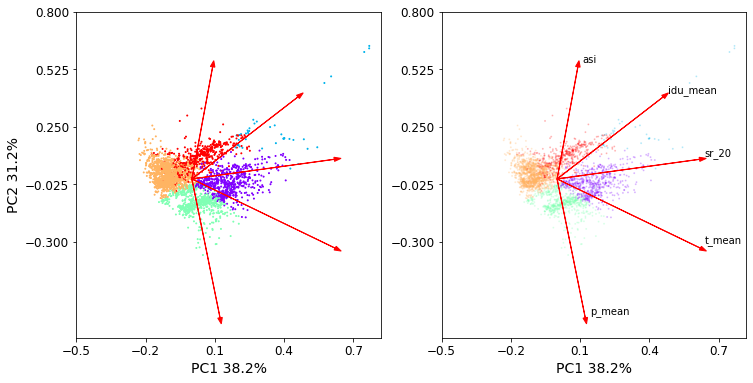

In [123]:
cmap_vd2 = cm.get_cmap('rainbow_r',5)
xs = loadings[0]
ys = loadings[1]

ld_df = pd.DataFrame(index=features, columns=['xs','ys'])
ld_df['xs'] = loadings[0]
ld_df['ys'] = loadings[1]
ld_df['len'] = np.sqrt(loadings[0]**2+loadings[1]**2)

# split features for visualization of PCA
p = int(np.round((lf/7),0))
features1=features[0:p]
features2=features[p:2*p]
features3=features[2*p:3*p]
features4=features[3*p:4*p]
features5=features[4*p:5*p]
features6=features[5*p:6*p]
features7=features[6*p:]

fig=plt.figure(figsize=(12,6))
ax = fig.add_subplot(121)
ax.scatter(pca_df_scaled.PC1,pca_df_scaled.PC2,s=1,c=df.cluster,cmap=cmap_vd2)

for i, varnames in enumerate(features):
    ax.arrow(
        0, 0, # coordinates of arrow base
        ld_df.loc[features[i]]['xs'], # length of the arrow along x
        ld_df.loc[features[i]]['ys'], # length of the arrow along y
        color='r',
        head_width=0.02
        )
    # ax.text(ld_df.loc[features[i]]['xs']+0.02, ld_df.loc[features[i]]['ys']+0.02, varnames,size=10)
xticks = np.linspace(-0.5,0.7, num=5)
yticks = np.linspace(-0.3,0.8, num=5)
ax.set_xticks(xticks)
ax.set_yticks(yticks)
ax.tick_params(axis='both', which='major', labelsize=12)
ax.set_xlabel(f'PC1 {per_var[0]}%',size=14)
ax.set_ylabel(f'PC2 {per_var[1]}%',size=14)

ax = fig.add_subplot(122)
ax.scatter(pca_df_scaled.PC1,pca_df_scaled.PC2,s=1,alpha=0.2,c=df.cluster,cmap=cmap_vd2)

for i, varnames in enumerate(features):
    ax.arrow(
        0, 0, # coordinates of arrow base
        ld_df.loc[features[i]]['xs'], # length of the arrow along x
        ld_df.loc[features[i]]['ys'], # length of the arrow along y
        color='r',
        head_width=0.02
        )
    ax.text(ld_df.loc[features[i]]['xs']+0.02, ld_df.loc[features[i]]['ys']+0.02, varnames,size=10)
xticks = np.linspace(-0.5,0.7, num=5)
yticks = np.linspace(-0.3,0.8, num=5)
ax.set_xticks(xticks)
ax.set_yticks(yticks)
ax.tick_params(axis='both', which='major', labelsize=12)
ax.set_xlabel(f'PC1 {per_var[0]}%',size=14)
# ax.set_ylabel(f'PC2 {per_var[1]}%',size=14)

fig.savefig(f'{work_dir}/output/figures/prediction_figures/pca/pca_scatters_clusters.jpg',bbox_inches='tight',dpi=300)


In [124]:
f = f'{work_dir}/output/catchment_characteristics/master_characteristics_gswp-p_gleam-ep_gswp-t.csv'
df2 = pd.read_csv(f,index_col=0)
df2 = df2[df2.p_mean-df2.q_mean < df2.ep_mean]
# features = ['p_mean','ep_mean', 't_mean','tdiff_mean','idu_mean', 'si_ep','si_p', 'asi','dtb','ia','slp_mean','el_mean','tc','ntc','nonveg','pclay','psand','lai_mean','lai_rsd','sc_mean','sc_rsd','sr_20','lat','lon']
features = ['p_mean','t_mean','idu_mean','asi','sr_20','lat','lon']
df2 = df2[features]
df2 = df2.dropna()
df2['cluster'] = df['cluster']

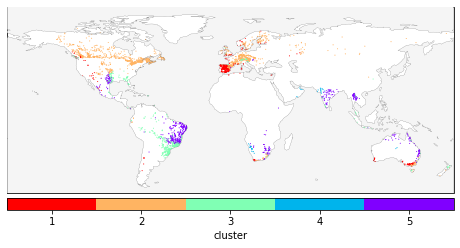

In [125]:
cmap_vd2 = cm.get_cmap('rainbow_r',5)
bounds = np.linspace(0,5,6)
bounds2 = np.linspace(0.5,4.5,5)
norm = mpl.colors.BoundaryNorm(bounds, cmap_vd2.N)

# no irrigation
fig = plt.figure(figsize=(8,8))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.coastlines(linewidth=0.001)
ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.12)
ax.set_global()
ax.set_xlim(-180,180)
ax.set_ylim(-60,90)
s = ax.scatter(df2.lon,df2.lat,s=0.8,c=df['cluster'],cmap=cmap_vd2, norm=norm,edgecolors='face',marker='o',linewidths=0.1)
cbar = plt.colorbar(s, orientation='horizontal', label='',spacing='proportional',extend='neither', pad=0.012,aspect=38, norm=norm,ticks=bounds2)
cbar.ax.tick_params(labelsize=10)
cbar.ax.set_xticklabels([1,2,3,4,5])
cbar.set_label(label='cluster', size=10)
ax.set_title('',size=14)
fig.savefig(f'{work_dir}/output/figures/prediction_figures/pca/map_clusters.jpg',bbox_inches='tight',dpi=300)

## 3. RANDOM FOREST

In [6]:
def rf_regression(df,features,n_estimators,max_features,min_samples_leaf,max_depth,random_state,plot,plot2):
    sr_rp = 'sr_20'
    df['catch_id'] = df.index

    ll = ['lat','lon','catch_id']
    f = features + ll
    dfx = df[f].values
    dfy = df[sr_rp].values

    X_train, X_test, y_train, y_test = train_test_split(dfx, dfy.reshape(-1, 1).ravel(), test_size=0.4, random_state=random_state)

    # add removed data in resampling to testset
    # ptx = pt[f].values
    # pty = pt[sr_rp].values
    # X_test = np.concatenate([X_test,ptx])
    # y_test = np.concatenate([y_test,pty.reshape(-1, 1).ravel()])

    # save lat lon columns
    lat_train = X_train[:,-3]
    lon_train = X_train[:,-2]
    lat_test = X_test[:,-3]
    lon_test = X_test[:,-2]
    catch_id_train = X_train[:,-1]
    catch_id_test = X_test[:,-1]
    # remove lat lon columns
    X_train = np.delete(X_train,-1,1)
    X_train = np.delete(X_train,-1,1)
    X_train = np.delete(X_train,-1,1)
    X_test = np.delete(X_test,-1,1)
    X_test = np.delete(X_test,-1,1)
    X_test = np.delete(X_test,-1,1)

    rf = RandomForestRegressor(criterion='absolute_error',n_estimators=n_estimators, max_features=max_features,min_samples_leaf=min_samples_leaf,max_depth=max_depth)
    rf = rf.fit(X_train, y_train)
    train_y_pred = rf.predict(X_train)
    test_y_pred = rf.predict(X_test)

    df_train = pd.DataFrame(index=catch_id_train,columns=['lat','lon','Sr_m','Sr_p','Sr_p-Sr_m','(Sr_p-Sr_m)/Sr_m'])
    df_train['lat'] = lat_train
    df_train['lon'] = lon_train
    df_train['Sr_m'] = y_train
    df_train['Sr_p'] = train_y_pred
    df_train['Sr_p-Sr_m'] = train_y_pred - y_train
    df_train['(Sr_p-Sr_m)/Sr_m'] = (train_y_pred - y_train)/train_y_pred

    df_test = pd.DataFrame(index=catch_id_test,columns=['lat','lon','Sr_m','Sr_p','Sr_p-Sr_m','(Sr_p-Sr_m)/Sr_m'])
    df_test['lat'] = lat_test
    df_test['lon'] = lon_test
    df_test['Sr_m'] = y_test
    df_test['Sr_p'] = test_y_pred
    df_test['Sr_p-Sr_m'] = test_y_pred - y_test
    df_test['(Sr_p-Sr_m)/Sr_m'] = (test_y_pred - y_test)/test_y_pred

    train_mse = int(mean_squared_error(y_train, train_y_pred))
    train_mae = int(mean_absolute_error(y_train, train_y_pred))
    train_r2 = np.round(r2_score(y_train, train_y_pred),2)
    train_r2_adj =  np.round(r2_adj(y_train, train_y_pred,features),2)
    train_rmse = int(rmse(y_train,train_y_pred))
    train_mape =  np.round(mean_absolute_percentage_error(y_train, train_y_pred),2)

    test_mse = int(mean_squared_error(y_test, test_y_pred))
    test_mae = int(mean_absolute_error(y_test, test_y_pred))
    test_r2 = np.round(r2_score(y_test, test_y_pred),2)
    test_r2_adj = np.round(r2_adj(y_test, test_y_pred,features),2)
    test_rmse = int(rmse(y_test,test_y_pred))
    test_mape = np.round(mean_absolute_percentage_error(y_test, test_y_pred),2)
    
    n_test = len(y_test)
    n_train = len(y_train)

    perm_importance = permutation_importance(rf, X_test, y_test,scoring='neg_mean_absolute_error',random_state=42)
    pi = perm_importance.importances_mean
    dd = pd.DataFrame(index=features,columns=['pi'])
    dd['pi'] = pi
    dd = dd.sort_values(by='pi')    
    sdf = pd.DataFrame(index=[0])
    sdf[features] = np.round(pi,4)
    # sdf[features] = np.round(rf.feature_importances_,2)
    sdf[['train_mse','train_rmse','train_mae','train_r2','train_r2_adj','train_mape']] = [train_mse,train_rmse,train_mae,train_r2,train_r2_adj,train_mape]
    sdf[['test_mse','test_rmse','test_mae','test_r2','test_r2_adj','test_mape']] = [test_mse,test_rmse,test_mae,test_r2,test_r2_adj,test_mape]
    sdf[['n_train','n_test']] = [n_train,n_test]
    
    if (plot==True):
        fig1 = plt.figure(figsize=(17,6))
        ax = fig1.add_subplot(131)
        ax.plot(y_train,train_y_pred,'o',markersize=1)
        ax.plot([0,800],[0,800],'k--')
        ax.set_title(f'Train, r2:{train_r2}, mae={train_mae}mm, n={n_train}')
        ax.set_xlim(-20,800)
        ax.set_ylim(-20,800)
        ax.set_xlabel('Sr memory method (mm)')
        ax.set_ylabel('Sr predicted (mm)')

        ax = fig1.add_subplot(132)
        ax.plot(y_test,test_y_pred,'o',markersize=1)
        ax.plot([0,800],[0,800],'k--')
        ax.set_title(f'Test, r2:{test_r2}, mae={test_mae}mm, n={n_test}')
        ax.set_xlim(-20,800)
        ax.set_ylim(-20,800)
        ax.set_xlabel('Sr memory method (mm)')
        ax.set_ylabel('Sr predicted (mm)')
        
        ax = fig1.add_subplot(133)
        ax.barh(dd.index,dd.pi)
        ax.set_xlabel('permutation feature importance - decrease in R2')
        
        # cmap_vd2 = cm.get_cmap('RdBu', 21)
        # cmap_rdbu = cm.get_cmap('coolwarm_r', 21)
        # cmap_vd2 = cm.get_cmap('RdBu', 21)
        # cmap_rdbu = cm.get_cmap('coolwarm_r', 21)
        cmap_rdbu = cm.get_cmap('RdYlBu', 20)
        cmap_rdbu = ListedColormap([cmap_rdbu(0),cmap_rdbu(1),cmap_rdbu(2),cmap_rdbu(3),cmap_rdbu(4),cmap_rdbu(5),cmap_rdbu(6),cmap_rdbu(7),cmap_rdbu(8),
                                    (144/255,238/255,144/255),(144/255,238/255,144/255),
                                   cmap_rdbu(11),cmap_rdbu(12),cmap_rdbu(13),cmap_rdbu(14),cmap_rdbu(15),cmap_rdbu(16),cmap_rdbu(17),cmap_rdbu(18),cmap_rdbu(19)])
        bounds = np.linspace(-100,100,21)
        bounds2 = np.linspace(-100,100,11)
        norm = mpl.colors.BoundaryNorm(bounds, cmap_rdbu.N)

        train_er = y_train - train_y_pred
        test_er = y_test- test_y_pred
        train_err = (y_train - train_y_pred)/y_train
        test_err = (y_test- test_y_pred)/y_test
        fig2 = plt.figure(figsize=(15,12))
        plt.subplots_adjust(wspace=0000.1,hspace=-0.4)
        ax = fig2.add_subplot(221,projection=ccrs.PlateCarree())
        ax.coastlines(linewidth=0.1)
        ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
        ax.set_global()
        ax.set_xlim(-180,180)
        ax.set_ylim(-60,90)
        s = ax.scatter(lon_train,lat_train,s=1,c=train_er,norm=norm,cmap=cmap_rdbu,edgecolors='face',marker='o',linewidths=0.1)
        cbar = plt.colorbar(s, orientation='horizontal', label='',spacing='proportional',extend='both', pad=0.02,aspect=30, norm=norm,ticks=bounds2)
        ax.set_title('train abs error [sr-mm - sr-pred] (mm)')

        iax = inset_axes(ax, width="22%", height="35%",loc=3)
        iax.hist(train_er,bins=bounds,width=(bounds[0]-bounds[1])*0.85)
        iax.invert_yaxis()
        iax.yaxis.tick_right()
        iax.xaxis.tick_top()

        ax = fig2.add_subplot(222,projection=ccrs.PlateCarree())
        ax.coastlines(linewidth=0.1)
        ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
        ax.set_global()
        ax.set_xlim(-180,180)
        ax.set_ylim(-60,90)
        s = ax.scatter(lon_test,lat_test,s=1,c=test_er,cmap=cmap_rdbu, norm=norm,edgecolors='face',marker='o',linewidths=0.1)
        cbar = plt.colorbar(s, orientation='horizontal', label='',spacing='proportional',extend='both', pad=0.02,aspect=30, norm=norm,ticks=bounds2)
        ax.set_title('test abs error [sr-mm - sr-pred] (mm)')

        iax = inset_axes(ax, width="22%", height="35%",loc=3)
        iax.hist(test_er,bins=bounds,width=(bounds[0]-bounds[1])*0.85)
        iax.invert_yaxis()
        iax.yaxis.tick_right()
        iax.xaxis.tick_top()

        bounds = np.linspace(-1,1,21)
        bounds2 = np.linspace(-1,1,11)
        norm = mpl.colors.BoundaryNorm(bounds, cmap_rdbu.N)

        ax = fig2.add_subplot(223,projection=ccrs.PlateCarree())
        ax.coastlines(linewidth=0.1)
        ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
        ax.set_global()
        ax.set_xlim(-180,180)
        ax.set_ylim(-60,90)
        s = ax.scatter(lon_train,lat_train,s=1,c=train_err,norm=norm,cmap=cmap_rdbu,edgecolors='face',marker='o',linewidths=0.1)
        cbar = plt.colorbar(s, orientation='horizontal', label='',spacing='proportional',extend='both', pad=0.02,aspect=30, norm=norm,ticks=bounds2)
        ax.set_title('train rel error [sr-mm - sr-pred]/sr-mm (-)')

        iax = inset_axes(ax, width="22%", height="35%",loc=3)
        iax.hist(train_err,bins=bounds,width=(bounds[0]-bounds[1])*0.85)
        iax.invert_yaxis()
        iax.yaxis.tick_right()
        iax.xaxis.tick_top()

        ax = fig2.add_subplot(224,projection=ccrs.PlateCarree())
        ax.coastlines(linewidth=0.1)
        ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
        ax.set_global()
        ax.set_xlim(-180,180)
        ax.set_ylim(-60,90)
        s = ax.scatter(lon_test,lat_test,s=1,c=test_err,cmap=cmap_rdbu, norm=norm,edgecolors='face',marker='o',linewidths=0.1)
        cbar = plt.colorbar(s, orientation='horizontal', label='',spacing='proportional',extend='both', pad=0.02,aspect=30, norm=norm,ticks=bounds2)
        ax.set_title('test rel error [sr-mm - sr-pred]/sr-mm (-)')

        iax = inset_axes(ax, width="22%", height="35%",loc=3)
        iax.hist(test_err,bins=bounds,width=(bounds[0]-bounds[1])*0.85)
        iax.invert_yaxis()
        iax.yaxis.tick_right()
        iax.xaxis.tick_top()
  
        if (plot2==True):
            fig3, ax = plt.subplots(2,5, figsize=(16,7),gridspec_kw={'height_ratios': [3, 1]})
            tree_disp = PartialDependenceDisplay.from_estimator(rf, X_train, range(len(features)),feature_names=features,kind='both', ax=ax[0][0:5],
                                                                ice_lines_kw ={'color':'grey'}, line_kw={'color':'orange','linewidth':'3'})
            plt.setp(tree_disp.deciles_vlines_, visible=False)
            ax[0,0].set_ylabel('Sr (mm)')
            ax[0,1].set_ylabel('')
            ax[0,2].set_ylabel('')
            ax[0,3].set_ylabel('')
            ax[0,4].set_ylabel('')
            ax[0,0].set_ylim(0,600)
            ax[0,1].set_ylim(0,600)
            ax[0,2].set_ylim(0,600)
            ax[0,3].set_ylim(0,600)
            ax[0,4].set_ylim(0,600)
            ax[0,0].set_xlim(np.quantile(X_train[:,0],0.05),np.quantile(X_train[:,0],0.95))
            ax[0,1].set_xlim(np.quantile(X_train[:,1],0.05),np.quantile(X_train[:,1],0.95))
            ax[0,2].set_xlim(np.quantile(X_train[:,2],0.05),np.quantile(X_train[:,2],0.95))
            ax[0,3].set_xlim(np.quantile(X_train[:,3],0.05),np.quantile(X_train[:,3],0.95))
            ax[0,4].set_xlim(np.quantile(X_train[:,4],0.05),np.quantile(X_train[:,4],0.95))
            fig3.suptitle('Train',y=0.92,fontsize=16)

            for i in range(len(features)):
                bins = np.linspace(np.quantile(X_train[:,i],0.05),np.quantile(X_train[:,i],0.95),20)
                ax[1,i].hist(X_train[:,i],bins=bins)
                ax[1,i].invert_yaxis()
                ax[1,i].xaxis.tick_top()
                ax[1,i].set_xlim(np.quantile(X_train[:,i],0.05),np.quantile(X_train[:,i],0.95))
                ax[1,i].axes.get_xaxis().set_ticklabels([])
            ax[1,0].set_ylabel('#catchments')
            
            fig4, ax = plt.subplots(2,5, figsize=(16,7),gridspec_kw={'height_ratios': [3, 1]})
            tree_disp = PartialDependenceDisplay.from_estimator(rf, X_test, range(len(features)),feature_names=features,kind='both', ax=ax[0][0:5],
                                                                ice_lines_kw ={'color':'grey'}, line_kw={'color':'orange','linewidth':'3'})
            plt.setp(tree_disp.deciles_vlines_, visible=False)
            ax[0,0].set_ylabel('Sr (mm)')
            ax[0,1].set_ylabel('')
            ax[0,2].set_ylabel('')
            ax[0,3].set_ylabel('')
            ax[0,4].set_ylabel('')
            ax[0,0].set_ylim(0,600)
            ax[0,1].set_ylim(0,600)
            ax[0,2].set_ylim(0,600)
            ax[0,3].set_ylim(0,600)
            ax[0,4].set_ylim(0,600)
            ax[0,0].set_xlim(np.quantile(X_test[:,0],0.05),np.quantile(X_test[:,0],0.95))
            ax[0,1].set_xlim(np.quantile(X_test[:,1],0.05),np.quantile(X_test[:,1],0.95))
            ax[0,2].set_xlim(np.quantile(X_test[:,2],0.05),np.quantile(X_test[:,2],0.95))
            ax[0,3].set_xlim(np.quantile(X_test[:,3],0.05),np.quantile(X_test[:,3],0.95))
            ax[0,4].set_xlim(np.quantile(X_test[:,4],0.05),np.quantile(X_test[:,4],0.95))
            fig4.suptitle('Test',y=0.92,fontsize=16)

            for i in range(len(features)):
                bins = np.linspace(np.quantile(X_test[:,i],0.05),np.quantile(X_test[:,i],0.95),20)
                ax[1,i].hist(X_test[:,i],bins=bins)
                ax[1,i].invert_yaxis()
                ax[1,i].xaxis.tick_top()
                ax[1,i].set_xlim(np.quantile(X_test[:,i],0.05),np.quantile(X_test[:,i],0.95))
                ax[1,i].axes.get_xaxis().set_ticklabels([])
            ax[1,0].set_ylabel('#catchments')
            
            return sdf,df_train,df_test,fig1,fig2,fig3,fig4
        else:
            return sdf,df_train,df_test,fig1,fig2
    else:
        return sdf,df_train,df_test

### Hyperparameter tuning

## sequential feature selection

In [ ]:
min_samples_leaf=1
max_depth=16
n_estimators=100
max_features=0.5
random_states=[12,22,32,38,41]
df = pd.read_csv(f'{work_dir}/output/catchment_characteristics/master_characteristics_{data_sources}.csv',index_col=0)
df = df.drop(columns=['ppd_l'])
df = df.dropna()
df = df[df.p_mean-df.q_mean < df.ep_mean]
features = ['p_mean','ep_mean', 't_mean','tdiff_mean','idu_mean', 'lpf','si_ep','si_p', 'asi','dtb','ia','slp_mean','el_mean','tc','ntc','nonveg','pclay','psand','lai_mean','lai_rsd','sc_mean','sc_rsd']
sr_rp = 'sr_20'
f = features 
dfx = df[f].values
dfy = df[sr_rp].values

X, X_test, y, y_test = train_test_split(dfx, dfy.reshape(-1, 1).ravel(), test_size=0.4,random_state=21)
estimator=RandomForestRegressor(criterion='absolute_error',random_state=42)
sfs = SequentialFeatureSelector(estimator, n_features_to_select=4,direction="forward")
sfs.fit(X, y)

In [ ]:
sfs.get_support()

In [ ]:
sfs.transform(X).shape

In [ ]:
df = pd.DataFrame(index=f,columns=['rank'])
df['rank'] = sfs.ranking_
df.sort_values('rank')

## manual feature elimination using permutation feature importance

In [7]:
# ALL CATCHMENTS ALL VARIABLES
min_samples_leaf=1
max_depth=None
n_estimators=100
max_features=1
random_states=[12,22,32,38,41,13,23,33,39,42]
df = pd.read_csv(f'{work_dir}/output/catchment_characteristics/master_characteristics_{data_sources}.csv',index_col=0)
df = df.drop(columns=['ppd_l'])
df = df.dropna()
df = df[df.p_mean-df.q_mean < df.ep_mean]
pp = []
for k in range(len(random_states)):
    random_state = random_states[k]
    features = ['p_mean','ep_mean', 't_mean','tdiff_mean','idu_mean','lpf','si_ep','si_p', 'asi','dtb','ia','slp_mean','el_mean','tc','ntc','nonveg','pclay','psand','lai_mean','lai_rsd','sc_mean','sc_rsd']
    ll = []
    for i in range(len(features)):
        sdf = rf_regression(df,features,n_estimators,max_features,min_samples_leaf,max_depth,random_state,plot=False,plot2=False)[0]
        sdff = sdf[features]
        minx = sdff.values.argmin()
        dr = features[minx]
        ll.append(dr)
        features.remove(dr)
        # print(len(features))
    ll.reverse()
    # d  = pd.DataFrame(index=range(len(ll)),columns=['rank','features'])
    # d.loc[:,'features'] = ll
    # d.loc[:,'rank'] = np.arange(0,22,1)
    d  = pd.DataFrame(index=ll,columns=['rank'])
    d.loc[:,'rank'] = np.arange(0,len(ll),1)
    pp.append(d)

In [8]:
d = pd.concat(pp,axis=1)
dm = pd.DataFrame(d.mean(axis=1))
dm = dm.sort_values(by=0)
dm

,0
idu_mean,0.1
sc_mean,1.2
t_mean,1.9
p_mean,3.1
lpf,4.2
si_p,5.0
tdiff_mean,6.2
ep_mean,7.8
slp_mean,8.6
asi,8.7


### spatial resampling

3194


Text(0.5, 0, 'Sr (mm)')

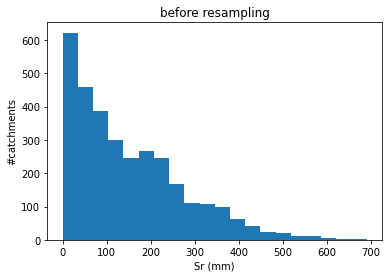

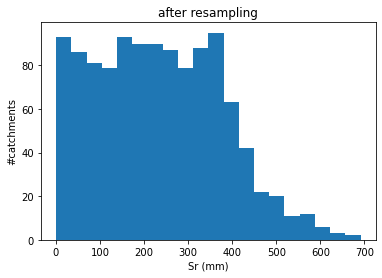

In [23]:
# sample equally for each sr bin
df = pd.read_csv(f'{work_dir}/output/catchment_characteristics/master_characteristics_{data_sources}.csv',index_col=0)
df = df.drop(columns=['ppd_l'])
df = df.dropna()
df = df[df.p_mean-df.q_mean < df.ep_mean]
print(len(df))
dfs = df.sort_values(by='sr_20')
gr = np.arange(0,950,50)
gr = [  0,  50, 100, 150, 200, 250, 300, 350, 400]#, 900]
gr2 = [  0,  50, 100, 150, 200, 250, 300, 350, 400]#, 900]
l=[]
p=[]
for i in range(len(gr)-1):
    s = dfs[(dfs.sr_20>gr[i])&(dfs.sr_20<gr[i+1])]
    # print(len(s))
    ix = random.sample(np.arange(0,len(s)).tolist(),125)
    p.append(s.iloc[ix])
    l.append(len(s))
#sr larger than 400: use all
s = dfs[(dfs.sr_20>400)]
p.append(s)
pp = pd.concat(p)

plt.figure()
plt.hist(dfs.sr_20,bins=20)
plt.title('before resampling')
plt.ylabel('#catchments')
plt.xlabel('Sr (mm)')

plt.figure()
plt.hist(pp.sr_20,bins=20)
plt.title('after resampling')
plt.ylabel('#catchments')
plt.xlabel('Sr (mm)')

## Crossvalidation model to test robustness

## Manual feature elimination with cross validation

In [75]:
df = pd.read_csv(f'{work_dir}/output/catchment_characteristics/master_characteristics_{data_sources}.csv',index_col=0)
df = df.drop(columns=['ppd_l'])
df = df[df.p_mean-df.q_mean < df.ep_mean]
df = df.dropna()
# features = ['t_mean','p_mean','idu_mean','asi']
features = ['p_mean','ep_mean', 't_mean','tdiff_mean','idu_mean', 'si_ep','si_p', 'asi','dtb','ia','slp_mean','el_mean','tc','ntc','nonveg','pclay','psand','lai_mean','lai_rsd','sc_mean','sc_rsd']
sr_rp = 'sr_20'
f = features 
dfx = df[f].values
dfy = df[sr_rp].values
cv_outer = 4 # the number of outer cross validations
l = []
pp = []
kf = KFold(n_splits=cv_outer,shuffle=True,random_state=0)
i=0
for train_ix, test_ix in kf.split(dfx):
    features = ['p_mean','ep_mean', 't_mean','tdiff_mean','idu_mean','si_ep','si_p', 'asi','dtb','ia','slp_mean','el_mean','tc','ntc','nonveg','pclay','psand','lai_mean','lai_rsd','sc_mean','sc_rsd']
    f = features
    ll = []
    for i in range(len(f)):
        dfx = df[features].values
        dfy = df[sr_rp].values
        X = dfx[train_ix]
        y = dfy[train_ix]
        X_test = dfx[test_ix]
        y_test = dfy[test_ix]
        
        rf = RandomForestRegressor(criterion='absolute_error',random_state=42)
        rf.fit(X,y)
        test_y_pred = rf.predict(X_test)
        train_y_pred = rf.predict(X)
        n_train,n_test = len(y),len(y_test)

        train_mae = np.round(mean_absolute_error(y, train_y_pred),2)
        train_r2_adj =  np.round(r2_adj(y, train_y_pred,features),2)

        test_mae = np.round(mean_absolute_error(y_test, test_y_pred),2)
        test_r2_adj = np.round(r2_adj(y_test, test_y_pred,features),2)
        
        perm_importance = permutation_importance(rf, X_test, y_test,scoring='neg_mean_absolute_error',random_state=42)
        # perm_importance = permutation_importance(rf, X_train, y_test,scoring='neg_mean_absolute_error',random_state=42)
        pi = perm_importance.importances_mean
        dd = pd.DataFrame(index=features,columns=['pi'])
        dd['pi'] = pi
        dd = dd.sort_values(by='pi')    
        sdf = pd.DataFrame(index=[0])
        sdf[features] = np.round(pi,4)
    
        sdff = sdf[features]
        minx = sdff.values.argmin()
        dr = features[minx]
        ll.append(dr)
        features.remove(dr)   
    
    ll.reverse()
    d  = pd.DataFrame(index=ll,columns=['rank'])
    d.loc[:,'rank'] = np.arange(0,len(ll),1)
    pp.append(d)    


In [76]:
d = pd.concat(pp,axis=1)
dm = pd.DataFrame(d.mean(axis=1))
ds = d.std(axis=1)
dm = dm.sort_values(by=0)
dm['mean'] = dm[0]
dm['std'] = ds
dm = dm.drop(columns=0)
dm

,mean,std
idu_mean,0.00,0.000000
t_mean,1.00,0.000000
tdiff_mean,2.25,0.500000
p_mean,2.75,0.500000
sc_mean,4.00,0.000000
asi,5.00,0.000000
ep_mean,6.50,0.577350
slp_mean,6.50,0.577350
si_p,8.25,0.500000
pclay,8.75,0.500000


In [ ]:
# backward feature elimination
from sklearn.feature_selection import SequentialFeatureSelector

X, y = load_iris(return_X_y=True)
knn = KNeighborsClassifier(n_neighbors=3)
sfs = SequentialFeatureSelector(knn, n_features_to_select=3)
sfs.fit(X, y)
SequentialFeatureSelector(estimator=KNeighborsClassifier(n_neighbors=3),
                          n_features_to_select=3)


In [ ]:
sfs.get_support()
array([ True, False,  True,  True])
sfs.transform(X).shape
(150, 3)

In [111]:
df = pd.read_csv(f'{work_dir}/output/catchment_characteristics/master_characteristics_{data_sources}.csv',index_col=0)
df = df.drop(columns=['ppd_l'])
df = df[df.p_mean-df.q_mean < df.ep_mean]
df = df.dropna()
df['catch_id'] = df.index
# features = ['t_mean','p_mean','idu_mean','asi']
features = ['p_mean','ep_mean', 't_mean','tdiff_mean','idu_mean', 'si_ep','si_p', 'asi','dtb','ia','slp_mean','el_mean','tc','ntc','nonveg','pclay','psand','lai_mean','lai_rsd','sc_mean','sc_rsd']
sr_rp = 'sr_20'
ll = ['lat','lon','catch_id']
f = features 
dfx = df[f].values
dfy = df[sr_rp].values

# here split dataset into 'temp' and 'test'
cv_outer = 1 # the number of outer cross validations
sdf = pd.DataFrame(index=range(cv_outer), columns=['n_estimators','max_depth','min_samples_leaf','max_features','train_mae','train_r2_adj','test_mae','test_r2_adj','n_train','n_test','fold'])
l = []
train_dfs=[]
test_dfs=[]

# kf = KFold(n_splits=cv_outer,shuffle=True,random_state=0)
df = dfy.reshape(-1, 1).ravel()
i=0
cv_train_ix = []
cv_test_ix = []
ddl = []

X = dfx
y = dfy
rf = RandomForestRegressor(criterion='absolute_error',random_state=42,min_samples_leaf=min_samples_leaf,max_depth=max_depth)
sfs = SequentialFeatureSelector(rf, n_features_to_select=4,direction='backward',cv=3,scoring='neg_mean_absolute_error')
sfs.fit(X, y)
print(sfs.get_support())


[ True False False  True False False  True False False False False False
 False False False False False False False  True False]


In [112]:
df = pd.DataFrame(index=f,columns=['selection'])
df['selection'] = sfs.get_support()
df

,selection
p_mean,True
ep_mean,False
t_mean,False
tdiff_mean,True
idu_mean,False
si_ep,False
si_p,True
asi,False
dtb,False
ia,False


In [ ]:
# with backward selection 4 variables: pmean, tdiffmean, sip and scmean

# MODEL A

In [121]:
mod = 'modela'

In [122]:
#Europe
lat_min_e, lat_max_e = 35,72 # 36,46 only spain cluster
lon_min_e, lon_max_e = -12,29 # -10,5 only spain cluster

#Asia
lat_min_a, lat_max_a = 8,26
lon_min_a, lon_max_a = 68,105

#us
lat_min_u, lat_max_u = 22,62
lon_min_u, lon_max_u = -132,-55

#south america
lat_min_s, lat_max_s = -32,-4
lon_min_s, lon_max_s = -60,-32

#south africa
lat_min_f, lat_max_f = -36,-17
lon_min_f, lon_max_f = 12,36

#australia
lat_min_t, lat_max_t = -40,-25
lon_min_t, lon_max_t = 140,155

### cross validation

In [123]:
max_depth=None
min_samples_leaf=1

In [124]:
df = pd.read_csv(f'{work_dir}/output/catchment_characteristics/master_characteristics_{data_sources}_v2.csv',index_col=0)
df = df[df.p_mean-df.q_mean < df.ep_mean]
df = df[['p_mean','ep_mean', 't_mean','tdiff_mean','idu_mean', 'si_ep','si_p', 'asi','dtb','ia','slp_mean','el_mean','tc','ntc','nonveg','pclay','psand','lai_mean','lai_rsd','sc_mean','sc_rsd','sr_20','lat','lon']]
df = df.dropna()
df['catch_id'] = df.index
features = ['p_mean','ep_mean', 't_mean','tdiff_mean','idu_mean', 'si_ep','si_p', 'asi','dtb','ia','slp_mean','el_mean','tc','ntc','nonveg','pclay','psand','lai_mean','lai_rsd','sc_mean','sc_rsd']
sr_rp = 'sr_20'
ll = ['lat','lon','catch_id']
f = features + ll
dfx = df[f].values
dfy = df[sr_rp].values

# here split dataset into 'temp' and 'test'
cv_outer = 5 # the number of outer cross validations
sdf = pd.DataFrame(index=range(cv_outer), columns=['n_estimators','max_depth','min_samples_leaf','max_features','train_mae','train_r2_adj','test_mae','test_r2_adj','n_train','n_test','fold'])
l = []
train_dfs=[]
test_dfs=[]

kf = KFold(n_splits=cv_outer,shuffle=True,random_state=0)
df = dfy.reshape(-1, 1).ravel()
i=0
cv_train_ix = []
cv_test_ix = []
ddl = []
for train_ix, test_ix in kf.split(dfx):
    cv_train_ix.append(train_ix)
    cv_test_ix.append(test_ix)
    X = dfx[train_ix]
    y = dfy[train_ix]
    X_test = dfx[test_ix]
    y_test = dfy[test_ix] 
    
    # save lat lon columns
    lat_train = X[:,-3]
    lon_train = X[:,-2]
    lat_test = X_test[:,-3]
    lon_test = X_test[:,-2]
    catch_id_train = X[:,-1]
    catch_id_test = X_test[:,-1]

    # remove lat lon catchid columns
    X = np.delete(X,-1,1)
    X = np.delete(X,-1,1)
    X = np.delete(X,-1,1)
    X_test = np.delete(X_test,-1,1)
    X_test = np.delete(X_test,-1,1)
    X_test = np.delete(X_test,-1,1)  
    
    # run rf model with full 'temp' set and test set using the best inner cross validation
    rf = RandomForestRegressor(criterion='absolute_error',random_state=42,min_samples_leaf=min_samples_leaf,max_depth=max_depth)
    rf.fit(X,y)
    test_y_pred = rf.predict(X_test)
    train_y_pred = rf.predict(X)
    n_train,n_test = len(y),len(y_test)

    train_mae = np.round(mean_absolute_error(y, train_y_pred),2)
    train_r2_adj =  np.round(r2_adj(y, train_y_pred,features),2)

    test_mae = np.round(mean_absolute_error(y_test, test_y_pred),2)
    test_r2_adj = np.round(r2_adj(y_test, test_y_pred,features),2)
    
    perm_importance = permutation_importance(rf, X_test, y_test,scoring='neg_mean_absolute_error',random_state=42)
    # perm_importance = permutation_importance(rf, X_train, y_test,scoring='neg_mean_absolute_error',random_state=42)
    pi = perm_importance.importances_mean
    dd = pd.DataFrame(index=features,columns=['pi'])
    dd.pi = pi
    ddl.append(dd)
    
    df_train = pd.DataFrame(index=catch_id_train,columns=['lat','lon','Sr_m','Sr_p','Sr_p-Sr_m','(Sr_p-Sr_m)/Sr_m'])
    df_train['lat'] = lat_train
    df_train['lon'] = lon_train
    df_train['Sr_m'] = y
    df_train['Sr_p'] = train_y_pred
    df_train['Sr_p-Sr_m'] = train_y_pred - y
    df_train['(Sr_p-Sr_m)/Sr_m'] = (train_y_pred - y)/train_y_pred
    train_dfs.append(df_train)

    df_test = pd.DataFrame(index=catch_id_test,columns=['lat','lon','Sr_m','Sr_p','Sr_p-Sr_m','(Sr_p-Sr_m)/Sr_m'])
    df_test['lat'] = lat_test
    df_test['lon'] = lon_test
    df_test['Sr_m'] = y_test
    df_test['Sr_p'] = test_y_pred
    df_test['Sr_p-Sr_m'] = test_y_pred - y_test
    df_test['(Sr_p-Sr_m)/Sr_m'] = (test_y_pred - y_test)/test_y_pred
    test_dfs.append(df_test)

    # save scores in dataframe
    # sdf.loc[i][['n_estimators','max_depth','min_samples_leaf','max_features']] = [n_estimators,max_depth,min_samples_leaf,max_features]
    sdf.loc[i]['fold'] = i
    sdf.loc[i][['train_mae','train_r2_adj']] = [train_mae,train_r2_adj]
    sdf.loc[i][['test_mae','test_r2_adj']] = [test_mae,test_r2_adj]
    sdf.loc[i][['n_train','n_test']] = [n_train,n_test]
    print(i)

    i+=1

# sdf.to_csv(f'{work_dir}/cross_validation/output/sdf_kinner{cv_inner}_kouter{cv_outer}_var{len(features)}_v2.csv')

0
1
2
3
4


In [125]:
sdf

,n_estimators,max_depth,min_samples_leaf,max_features,train_mae,train_r2_adj,test_mae,test_r2_adj,n_train,n_test,fold
0,NaN,NaN,NaN,NaN,13.25,0.97,33.92,0.85,2889,723,0
1,NaN,NaN,NaN,NaN,12.92,0.98,37.04,0.76,2889,723,1
2,NaN,NaN,NaN,NaN,12.98,0.97,36.3,0.79,2890,722,2
3,NaN,NaN,NaN,NaN,13.01,0.98,35.91,0.79,2890,722,3
4,NaN,NaN,NaN,NaN,13.34,0.97,32.99,0.84,2890,722,4


In [126]:
mae_train_mean = (sdf.train_mae.mean(axis=0))
mae_train_std = (sdf.train_mae.std(axis=0))
mae_test_mean = (sdf.test_mae.mean(axis=0))
mae_test_std = (sdf.test_mae.std(axis=0))
print(mae_train_mean, mae_train_std)
print(mae_test_mean, mae_test_std)

13.1 0.18371173070873828
35.232000000000006 1.7041918906038702


In [127]:
# permutation importances for each cv fold
ddd = pd.DataFrame(index=ddl[0].index, columns=['pi0','pi1','pi2','pi3'])
ddd.pi0 = ddl[0].pi
ddd.pi1 = ddl[1].pi
ddd.pi2 = ddl[2].pi
ddd.pi3 = ddl[3].pi
ddd['mean'] = ddd.mean(axis=1)
ddd['std'] = ddd[['pi0','pi1','pi2','pi3']].std(axis=1)
ddd = ddd.sort_values(by='mean',ascending=False)
ddd['features2'] = ['$\overline{t_\mathrm{IS}}$','$T_{\mathrm{d}}$','$\overline{T}$', '$I_{\mathrm{AS}}$','$\overline{P}$','$I_{\mathrm{S,P}}$','$\overline{E}_\mathrm{p}$',
                    '$\overline{f}_{\mathrm{snow}}$','$f_{\mathrm{clay}}$','$s$','$\overline{\mathrm{LAI}}$','$f_{\mathrm{nontree}}$','$d_{\mathrm{b}}$','$I_{\mathrm{S,E_p}}$','$v_\mathrm{LAI}$',
                    '$f_{\mathrm{nonveg}}$','$e$','$f_{\mathrm{sand}}$','$f_{\mathrm{snow,v}}$','$f_{\mathrm{tree}}$','$I_\mathrm{a}$']
# rb = cm.get_cmap('tab10', 10)
rb = cm.get_cmap('terrain', 10)
c1,c2,c3 = rb(1),rb(3),rb(6)
ddd['colors'] = [c1,c1,c1,c1,c1,c1,c1,c1,c3,c3,c2,c2,c3,c1,c2,c2,c3,c3,c1,c2,c2]
ddd

,pi0,pi1,pi2,pi3,mean,std,features2,colors
idu_mean,29.926250,26.296957,24.164439,22.704820,25.773116,3.137154,$\overline{t_\mathrm{IS}}$,"(0.05185185185185184, 0.4962962962962963, 0.89..."
sc_mean,10.656227,11.231710,12.393541,21.896687,14.044541,5.284401,$T_{\mathrm{d}}$,"(0.05185185185185184, 0.4962962962962963, 0.89..."
t_mean,17.882348,15.786152,15.150975,4.679637,13.374778,5.913072,$\overline{T}$,"(0.05185185185185184, 0.4962962962962963, 0.89..."
p_mean,6.263114,6.985873,5.298531,7.637227,6.546186,1.003405,$I_{\mathrm{AS}}$,"(0.05185185185185184, 0.4962962962962963, 0.89..."
slp_mean,5.668788,4.442038,5.086447,4.924926,5.030550,0.505956,$\overline{P}$,"(0.05185185185185184, 0.4962962962962963, 0.89..."
si_p,5.592163,2.946310,4.183029,4.256438,4.244485,1.080958,"$I_{\mathrm{S,P}}$","(0.05185185185185184, 0.4962962962962963, 0.89..."
el_mean,3.797257,3.394548,3.619267,5.569154,4.095056,0.996450,$\overline{E}_\mathrm{p}$,"(0.05185185185185184, 0.4962962962962963, 0.89..."
dtb,1.527206,2.022361,1.327668,2.433053,1.827572,0.498221,$\overline{f}_{\mathrm{snow}}$,"(0.05185185185185184, 0.4962962962962963, 0.89..."
sc_rsd,1.619428,1.443967,2.069465,2.120268,1.813282,0.333589,$f_{\mathrm{clay}}$,"(0.6666666666666667, 0.5733333333333334, 0.420..."
lai_mean,2.048039,1.837618,1.535412,1.732277,1.788336,0.213688,$s$,"(0.6666666666666667, 0.5733333333333334, 0.420..."


In [128]:
# get mae for different regions
ll_e = lat_max_e, lat_min_e, lon_max_e, lon_min_e
ll_a = lat_max_a, lat_min_a, lon_max_a, lon_min_a
ll_u = lat_max_u, lat_min_u, lon_max_u, lon_min_u
ll_s = lat_max_s, lat_min_s, lon_max_s, lon_min_s
ll_f = lat_max_f, lat_min_f, lon_max_f, lon_min_f
ll_t = lat_max_t, lat_min_t, lon_max_t, lon_min_t
ll = [ll_e,ll_a,ll_u,ll_s,ll_f,ll_t]

dfr = pd.DataFrame(index=[0,1,2,3,4], columns=['mad_europe','mad_asia','mad_northamerica','mad_southamerica','mad_southafrica','mad_australia'])
for i in range(len(train_dfs)):
    df = train_dfs[i]
    for j in range(len(ll)):
        k = ll[j]
        lat_max,lat_min,lon_max,lon_min = k[0],k[1],k[2],k[3]
        dfs = df[(df.lat<lat_max)&(df.lat>lat_min)&(df.lon<lon_max)&(df.lon>lon_min)]
        mae = abs(dfs['Sr_p-Sr_m']).mean()
        dfr.iloc[i,j] = mae
dfrr = pd.DataFrame(index=['mean','std'], columns=['mad_europe','mad_asia','mad_northamerica','mad_southamerica','mad_southafrica','mad_australia'])
dfrr.loc['mean',:] = np.round(dfr.mean(axis=0),0)
dfrr.loc['std',:] = np.round(dfr.std(axis=0),2)

dfr = pd.DataFrame(index=[0,1,2,3,4], columns=['mad_europe','mad_asia','mad_northamerica','mad_southamerica','mad_southafrica','mad_australia'])
for i in range(len(train_dfs)):
    df = test_dfs[i]
    for j in range(len(ll)):
        k = ll[j]
        lat_max,lat_min,lon_max,lon_min = k[0],k[1],k[2],k[3]
        dfs = df[(df.lat<lat_max)&(df.lat>lat_min)&(df.lon<lon_max)&(df.lon>lon_min)]
        mae = abs(dfs['Sr_p-Sr_m']).mean()
        dfr.iloc[i,j] = mae
dfrrt = pd.DataFrame(index=['mean','std'], columns=['mad_europe','mad_asia','mad_northamerica','mad_southamerica','mad_southafrica','mad_australia'])
dfrrt.loc['mean',:] = np.round(dfr.mean(axis=0),0)
dfrrt.loc['std',:] = np.round(dfr.std(axis=0),2)

In [129]:
#train
dfrr

,mad_europe,mad_asia,mad_northamerica,mad_southamerica,mad_southafrica,mad_australia
mean,13.0,30.0,9.0,14.0,15.0,16.0
std,0.19,1.24,0.2,0.2,0.65,1.06


In [130]:
#test
dfrrt

,mad_europe,mad_asia,mad_northamerica,mad_southamerica,mad_southafrica,mad_australia
mean,34.0,87.0,24.0,37.0,39.0,44.0
std,1.52,11.55,1.64,2.69,7.7,12.19


In [131]:
df = pd.read_csv(f'{work_dir}/output/catchment_characteristics/master_characteristics_{data_sources}_v2.csv',index_col=0)
df = df.drop(columns=['ppd_l'])
df = df[df.p_mean-df.q_mean < df.ep_mean]
df = df[['p_mean','ep_mean', 't_mean','tdiff_mean','idu_mean', 'si_ep','si_p', 'asi','dtb','ia','slp_mean','el_mean','tc','ntc','nonveg','pclay','psand','lai_mean','lai_rsd','sc_mean','sc_rsd','sr_20','lat','lon']]
df = df.dropna()
features = ['p_mean','ep_mean', 't_mean','tdiff_mean','idu_mean', 'si_ep','si_p', 'asi','dtb','ia','slp_mean','el_mean','tc','ntc','nonveg','pclay','psand','lai_mean','lai_rsd','sc_mean','sc_rsd']

In [132]:
df

,p_mean,ep_mean,t_mean,tdiff_mean,idu_mean,si_ep,si_p,asi,dtb,ia,...,nonveg,pclay,psand,lai_mean,lai_rsd,sc_mean,sc_rsd,sr_20,lat,lon
ca_0002351,1.590253,1.401269,0.643260,25.221876,5.05,0.704030,0.464383,0.000000,19.41,0.003286,...,0.294740,17.094944,45.838508,0.950806,0.641162,41.416667,0.833385,86.691569,51.01460,-114.08960
cz_0000019,2.285853,1.484881,7.528472,22.165638,3.81,0.554593,0.213216,0.024284,18.85,0.000002,...,0.180999,16.322265,42.762079,1.885474,0.753561,25.416667,1.311083,51.681945,49.76040,16.97290
br_0001191,4.152597,3.260944,24.602384,4.562576,2.67,0.138040,0.173603,0.121069,25.74,0.003675,...,0.073967,36.166791,44.203801,2.808409,0.113255,0.000000,0.000000,173.824040,-13.36460,-39.08130
br_0000469,4.944120,3.258352,26.827793,2.495693,6.62,0.049197,0.609147,0.114847,25.93,0.000325,...,0.248321,28.315328,54.128498,1.862262,0.252759,0.000000,0.000000,333.062414,-6.67290,-48.46880
bw_0000006,1.358820,2.669859,20.623299,10.890681,12.46,0.245236,0.838107,0.037922,10.34,0.000000,...,0.241470,21.254629,69.722858,0.581395,0.657466,0.000000,0.000000,221.777925,-21.08960,27.51460
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2342933,3.745021,2.813956,18.574819,20.548962,4.03,0.321256,0.142954,0.115187,13.33,0.002393,...,0.112886,26.071614,49.831392,2.687272,0.570877,0.083333,3.464102,264.588102,32.01766,-85.29577
8155200,2.443305,2.539987,19.716896,20.792007,5.18,0.401462,0.217222,0.057260,8.45,0.000323,...,0.154220,32.240327,38.662520,1.062247,0.224592,0.000000,0.000000,295.776515,30.29632,-97.92557
2472000,4.120200,2.897947,18.336339,20.451761,3.89,0.320265,0.123824,0.156997,18.81,0.000853,...,0.140715,28.204969,32.187203,2.862665,0.514875,0.000000,0.000000,236.554537,31.70694,-89.40694
6784000,1.772299,1.731829,9.414148,29.647746,4.86,0.627384,0.512336,0.000000,140.87,0.235538,...,0.276233,18.066044,51.319892,0.738392,0.884287,9.000000,1.464890,190.322812,41.03244,-98.74053


In [133]:
sr_rp = 'sr_20'
df['catch_id'] = df.index
ll = ['lat','lon','catch_id']
f = features + ll
dfx = df[f].values
dfy = df[sr_rp].values

train_ix = cv_train_ix[0]
test_ix = cv_test_ix[0]

# X_train, X_test, y_train, y_test = train_test_split(dfx, dfy.reshape(-1, 1).ravel(), test_size=0.3, random_state=42)
X_train = dfx[train_ix]
y_train = dfy[train_ix]
X_test = dfx[test_ix]
y_test = dfy[test_ix]

# save lat lon columns
lat_train = X_train[:,-3]
lon_train = X_train[:,-2]
lat_test = X_test[:,-3]
lon_test = X_test[:,-2]
catch_id_train = X_train[:,-1]
catch_id_test = X_test[:,-1]
# remove lat lon columns
X_train = np.delete(X_train,-1,1)
X_train = np.delete(X_train,-1,1)
X_train = np.delete(X_train,-1,1)
X_test = np.delete(X_test,-1,1)
X_test = np.delete(X_test,-1,1)
X_test = np.delete(X_test,-1,1)

rf = RandomForestRegressor(criterion='absolute_error',random_state=42,min_samples_leaf=min_samples_leaf,max_depth=max_depth)
# rf = RandomForestRegressor(criterion='squared_error',random_state=42,min_samples_leaf=min_samples_leaf,max_depth=max_depth,oob_score=True)
rf = rf.fit(X_train, y_train)
train_y_pred = rf.predict(X_train)
test_y_pred = rf.predict(X_test)

df_train = pd.DataFrame(index=catch_id_train,columns=['lat','lon','Sr_m','Sr_p','Sr_p-Sr_m','(Sr_p-Sr_m)/Sr_m'])
df_train['lat'] = lat_train
df_train['lon'] = lon_train
df_train['Sr_m'] = y_train
df_train['Sr_p'] = train_y_pred
df_train['Sr_p-Sr_m'] = train_y_pred - y_train
df_train['(Sr_p-Sr_m)/Sr_m'] = (train_y_pred - y_train)/train_y_pred

df_test = pd.DataFrame(index=catch_id_test,columns=['lat','lon','Sr_m','Sr_p','Sr_p-Sr_m','(Sr_p-Sr_m)/Sr_m'])
df_test['lat'] = lat_test
df_test['lon'] = lon_test
df_test['Sr_m'] = y_test
df_test['Sr_p'] = test_y_pred
df_test['Sr_p-Sr_m'] = test_y_pred - y_test
df_test['(Sr_p-Sr_m)/Sr_m'] = (test_y_pred - y_test)/test_y_pred

train_mse = int(mean_squared_error(y_train, train_y_pred))
train_mae = int(np.round(mean_absolute_error(y_train, train_y_pred),0))
train_r2 = np.round(r2_score(y_train, train_y_pred),2)
train_r2_adj =  np.round(r2_adj(y_train, train_y_pred,features),2)
train_rmse = int(rmse(y_train,train_y_pred))
train_mape =  np.round(mean_absolute_percentage_error(y_train, train_y_pred),2)

test_mse = int(mean_squared_error(y_test, test_y_pred))
test_mae = int(np.round(mean_absolute_error(y_test, test_y_pred),0))
test_r2 = np.round(r2_score(y_test, test_y_pred),2)
test_r2_adj = np.round(r2_adj(y_test, test_y_pred,features),2)
test_rmse = int(rmse(y_test,test_y_pred))
test_mape = np.round(mean_absolute_percentage_error(y_test, test_y_pred),2)

n_test = len(y_test)
n_train = len(y_train)

perm_importance = permutation_importance(rf, X_test, y_test,scoring='neg_mean_absolute_error',n_repeats=10,random_state=42)
pi = perm_importance.importances_mean
dd = pd.DataFrame(index=features,columns=['pi_mean','pi_std'])
dd['pi_mean'] = pi
dd['pi_std'] = perm_importance.importances_std
dd = dd.sort_values(by='pi_mean') 

perm_importance = permutation_importance(rf, X_train, y_train,scoring='neg_mean_absolute_error',n_repeats=10,random_state=42)
pi = perm_importance.importances_mean
ddtr = pd.DataFrame(index=features,columns=['pi_mean','pi_std'])
ddtr['pi_mean'] = pi
ddtr['pi_std'] = perm_importance.importances_std
ddtr = ddtr.sort_values(by='pi_mean')    

sdf = pd.DataFrame(index=[0])
sdf[features] = np.round(pi,4)
# sdf[features] = np.round(rf.feature_importances_,2)
sdf[['train_mse','train_rmse','train_mae','train_r2','train_r2_adj','train_mape']] = [train_mse,train_rmse,train_mae,train_r2,train_r2_adj,train_mape]
sdf[['test_mse','test_rmse','test_mae','test_r2','test_r2_adj','test_mape']] = [test_mse,test_rmse,test_mae,test_r2,test_r2_adj,test_mape]
sdf[['n_train','n_test']] = [n_train,n_test]


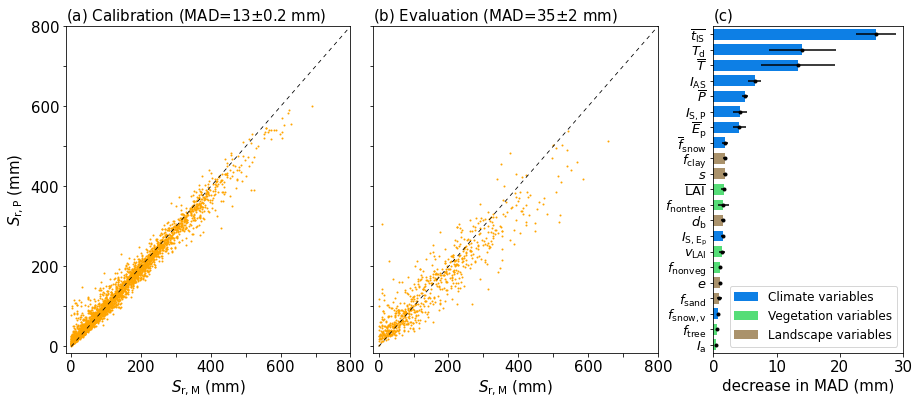

In [134]:
# scatter plots
x = np.linspace(0,800,100)
y = x
cmap_rdbu = cm.get_cmap('bwr_r', 4)
cmap_rdbu = ListedColormap([cmap_rdbu(0),cmap_rdbu(1),cmap_rdbu(2),cmap_rdbu(3)])
bounds = np.linspace(0, 4, 5)
bounds2 = bounds
norm = mpl.colors.BoundaryNorm(bounds, cmap_rdbu.N)

# color catchments in scatter plot based on error and use same colors on a map
df_train['group'] = np.nan
ix2 = df_train[(df_train['Sr_p-Sr_m']<train_mae)&(df_train['Sr_p-Sr_m']>0)].index
ix1 = df_train[(df_train['Sr_p-Sr_m']>train_mae)].index
ix3 = df_train[(df_train['Sr_p-Sr_m']>-train_mae)&(df_train['Sr_p-Sr_m']<0)].index
ix4 = df_train[(df_train['Sr_p-Sr_m']<-train_mae)].index
df_train.loc[ix1,'group'] = 0
df_train.loc[ix2,'group'] = 1
df_train.loc[ix3,'group'] = 2
df_train.loc[ix4,'group'] = 3

df_test['group'] = np.nan
ix2 = df_test[(df_test['Sr_p-Sr_m']<test_mae)&(df_test['Sr_p-Sr_m']>0)].index
ix1 = df_test[(df_test['Sr_p-Sr_m']>test_mae)].index
ix3 = df_test[(df_test['Sr_p-Sr_m']>-test_mae)&(df_test['Sr_p-Sr_m']<0)].index
ix4 = df_test[(df_test['Sr_p-Sr_m']<-test_mae)].index
df_test.loc[ix1,'group'] = 0
df_test.loc[ix2,'group'] = 1
df_test.loc[ix3,'group'] = 2
df_test.loc[ix4,'group'] = 3

fig1, ax = plt.subplots(1,4, figsize=(15,6),gridspec_kw={'width_ratios': [3,3,0.1,2]})
ax[2].axis('off')
plt.subplots_adjust(wspace=0.12)
# s=ax[0].scatter(df_train.Sr_m,df_train.Sr_p,c=df_train.group,s=1.5,cmap=cmap_rdbu,norm=norm,zorder=10)
s=ax[0].scatter(df_train.Sr_m,df_train.Sr_p,c='orange',s=1,cmap=cmap_rdbu,norm=norm,zorder=10)
# ax.plot(y_train,train_y_pred,'o',color='tab:blue',markersize=0.8)
ax[0].plot(x,y,color='k',linestyle=(0, (5, 5)),linewidth=0.8,zorder=11)
# ax[0].fill_between(x, y-train_mae, y+train_mae, alpha=0.25, edgecolor='k', facecolor='grey')
# ax.set_title(f'Train, MAD={train_mae} mm, $n$={n_train}',size=15)
# ax[0].text(15,750,f'MAD={train_mae} mm ',fontsize=15)#mad of this specific run
# ax[0].text(390,15,f'MAD={int(mae_train_mean)}$\pm${np.round(mae_train_std,1)} mm',fontsize=15)#mad mean and std of cv
ax[0].set_xlim(-15,800)
ax[0].set_ylim(-15,800)
ax[0].set_yticks([0,100,200,300,400,500,600,700,800])
ax[0].set_xticks([0,100,200,300,400,500,600,700,800])
ax[0].set_yticklabels([0,'',200,'',400,'',600,'',800])
ax[0].set_xticklabels([0,'',200,'',400,'',600,'',800])
ax[0].set_xlabel('$S_\mathrm{r,M}$ (mm)',size=15)
ax[0].set_ylabel('$S_\mathrm{r,P}$ (mm)',size=15)
ax[0].tick_params(axis='both', labelsize=15)
ax[0].set_title(f'(a) Calibration (MAD={int(mae_train_mean)}$\pm${np.round(mae_train_std,1)} mm)', loc='left',size=15)
# fig1.savefig(f'{work_dir}/output/regression/figures/interpretation/scatter_train.jpg',bbox_inches='tight',dpi=300)


# fig1 = plt.figure(figsize=(6,6))
# ax = fig1.add_subplot(132)
# ax.plot(y_test,test_y_pred,'o',color='tab:orange',markersize=1)
# s=ax[1].scatter(df_test.Sr_m,df_test.Sr_p,c=df_test.group,s=2,cmap=cmap_rdbu,norm=norm,zorder=10)
s=ax[1].scatter(df_test.Sr_m,df_test.Sr_p,c='orange',s=1,cmap=cmap_rdbu,norm=norm,zorder=10)
ax[1].plot(x,y,color='k',linestyle=(0, (5, 5)),linewidth=0.8,zorder=11)
# ax[1].fill_between(x, y-test_mae, y+test_mae, alpha=0.25, edgecolor='k', facecolor='grey')
# ax.set_title(f'Test, MAD={test_mae} mm, $n$={n_test}',size=15)
# ax[1].text(15,750,f'MAD={test_mae} mm',fontsize=15)#mad of this specific run
# ax[1].text(390,15,f'MAD={int(mae_test_mean)}$\pm${np.round(mae_test_std,1)} mm',fontsize=15)#mad mean and std of cv
ax[1].set_xlim(-15,800)
ax[1].set_ylim(-15,800)
ax[1].set_yticks([0,100,200,300,400,500,600,700,800])
ax[1].set_xticks([0,100,200,300,400,500,600,700,800])
ax[1].set_yticklabels(['','','','','','','','',''])
ax[1].set_xticklabels([0,'',200,'',400,'',600,'',800])
ax[1].set_xlabel('$S_\mathrm{r,M}$ (mm)',size=15)
ax[1].tick_params(axis='both', labelsize=15)
ax[1].set_title(f'(b) Evaluation (MAD={int(mae_test_mean)}$\pm${int(np.round(mae_test_std,0))} mm)', loc='left',size=15)

# feature importances
# ax = fig1.add_subplot(133)
ddd = ddd.sort_values(by='mean')
ax[3].barh(ddd.features2,ddd['mean'],height=0.7,color=ddd.colors)
ax[3].barh(0,-5,height=0.7,color=ddd.colors[2],label='Climate variables')
ax[3].barh(0,-5,height=0.7,color=ddd.colors[1],label='Vegetation variables')
ax[3].barh(0,-5,height=0.7,color=ddd.colors[4],label='Landscape variables')
ax[3].errorbar(ddd['mean'],ddd.features2, xerr=ddd['std'], fmt=".", color="black")
ax[3].set_xlabel('decrease in MAD (mm)',size=15)
ax[3].tick_params(axis='x', labelsize=15)
ax[3].tick_params(axis='y', labelsize=13)
ax[3].set_ylim(-0.5,20.5)
ax[3].set_xlim(0,30)
ax[3].set_title('(c)', loc='left',size=15)
ax[3].legend(loc='lower right',fontsize=12)
fig1.savefig(f'{work_dir}/output/regression/figures/interpretation/scatter_{mod}.jpg',bbox_inches='tight',dpi=300)


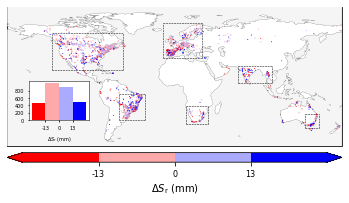

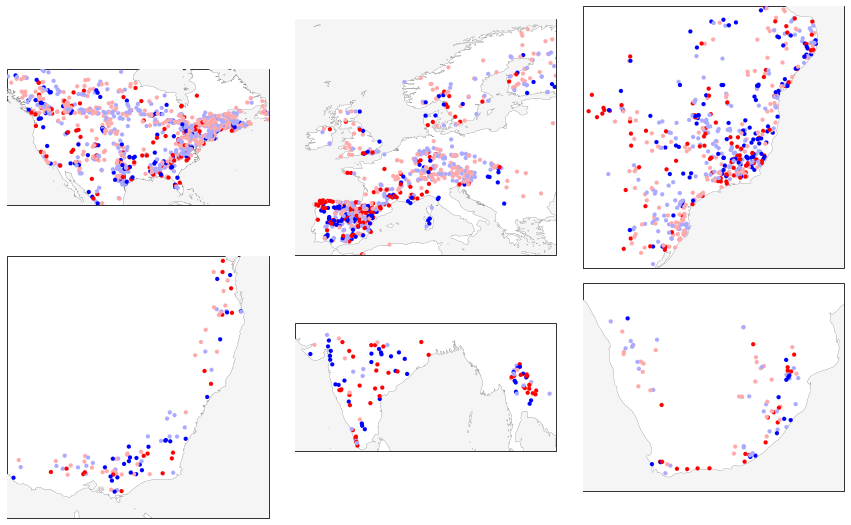

In [25]:
# TRAIN
fig2 = plt.figure(figsize=(6,6))
# plt.subplots_adjust(wspace=0000.1,hspace=-0.4)
ax = fig2.add_subplot(111,projection=ccrs.PlateCarree())
ax.coastlines(linewidth=0.1)
ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
ax.set_global()
ax.set_xlim(-180,180)
ax.set_ylim(-60,90)
s=ax.scatter(lon_train,lat_train,s=0.7,c=df_train.group,edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu,norm=norm,zorder=102)
# cbar = plt.colorbar(s, orientation='vertical',spacing='proportional',extend='both', pad=0.02,aspect=15, norm=norm,shrink=0.35)
cbar = plt.colorbar(s, orientation='horizontal',spacing='proportional',extend='both', pad=0.02,aspect=35, norm=norm)
cbar.set_label('$\Delta$$S_\mathrm{r}$ (mm)')
cbar.set_ticks([1,2,3])
cbar.set_ticklabels([f'-{train_mae}','0',f'{train_mae}'],size=8)
# for j, lab in enumerate([f'$n$={len(df_train[df_train.group==0])}',f'$n$={len(df_train[df_train.group==1])}',f'$n$={len(df_train[df_train.group==2])}',f'$n$={len(df_train[df_train.group==3])}']):
#     cbar.ax.text((j + 0.5), 0.5, lab, ha='center', va='center')
# for j, lab in enumerate([f'$n$={len(df_train[df_train.group==0])}',f'$n$={len(df_train[df_train.group==1])}',f'$n$={len(df_train[df_train.group==2])}',f'$n$={len(df_train[df_train.group==3])}']):
#     cbar.ax.text(0.5,(j + 0.5), lab, ha='center', va='center',rotation=90,size=6)
ax.plot([lon_min_a,lon_max_a],[lat_max_a,lat_max_a],'k--',zorder=101,linewidth=0.5)
ax.plot([lon_min_a,lon_max_a],[lat_min_a,lat_min_a],'k--',zorder=101,linewidth=0.5)
ax.plot([lon_min_a,lon_min_a],[lat_min_a,lat_max_a],'k--',zorder=101,linewidth=0.5)
ax.plot([lon_max_a,lon_max_a],[lat_min_a,lat_max_a],'k--',zorder=101,linewidth=0.5)

ax.plot([lon_min_e,lon_max_e],[lat_max_e,lat_max_e],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_min_e,lon_max_e],[lat_min_e,lat_min_e],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_min_e,lon_min_e],[lat_min_e,lat_max_e],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_max_e,lon_max_e],[lat_min_e,lat_max_e],'k--',linewidth=0.5,zorder=101)

ax.plot([lon_min_u,lon_max_u],[lat_max_u,lat_max_u],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_min_u,lon_max_u],[lat_min_u,lat_min_u],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_min_u,lon_min_u],[lat_min_u,lat_max_u],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_max_u,lon_max_u],[lat_min_u,lat_max_u],'k--',linewidth=0.5,zorder=101)

ax.plot([lon_min_s,lon_max_s],[lat_max_s,lat_max_s],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_min_s,lon_max_s],[lat_min_s,lat_min_s],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_min_s,lon_min_s],[lat_min_s,lat_max_s],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_max_s,lon_max_s],[lat_min_s,lat_max_s],'k--',linewidth=0.5,zorder=101)

ax.plot([lon_min_t,lon_max_t],[lat_max_t,lat_max_t],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_min_t,lon_max_t],[lat_min_t,lat_min_t],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_min_t,lon_min_t],[lat_min_t,lat_max_t],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_max_t,lon_max_t],[lat_min_t,lat_max_t],'k--',linewidth=0.5,zorder=101)

ax.plot([lon_min_f,lon_max_f],[lat_max_f,lat_max_f],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_min_f,lon_max_f],[lat_min_f,lat_min_f],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_min_f,lon_min_f],[lat_min_f,lat_max_f],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_max_f,lon_max_f],[lat_min_f,lat_max_f],'k--',linewidth=0.5,zorder=101)

iax = inset_axes(ax, width="18%", height="28%",loc=3,bbox_transform=ax.transAxes,bbox_to_anchor=(0.05,0.15,1,1))
plt.setp(list(iax.spines.values()),linewidth=0.5)
bins = [df_train['Sr_p-Sr_m'].quantile(0.01),-train_mae,0,train_mae,df_train['Sr_p-Sr_m'].quantile(0.99)]
n = [len(df_train[df_train.group==0]['Sr_p-Sr_m']),len(df_train[df_train.group==1]['Sr_p-Sr_m']),len(df_train[df_train.group==2]['Sr_p-Sr_m']),len(df_train[df_train.group==3]['Sr_p-Sr_m'])]
iax.bar([0,1,2,3],n,width=1,color=[cmap_rdbu(0),cmap_rdbu(1),cmap_rdbu(2),cmap_rdbu(3)])
iax.set_xticks([0.5,1.5,2.5])
iax.set_yticks([0,200,400,600,800])
iax.set_xticklabels([f'-{train_mae}','0',f'{train_mae}'])
iax.set_xlabel('$\Delta$$S_\mathrm{r}$ (mm)',size=5)
# iax.invert_yaxis()
# iax.yaxis.tick_right()
# iax.set_ylabel('$n$',size=6)
# iax.yaxis.set_label_position("right")
# iax.xaxis.tick_top()
iax.tick_params(axis='both',length=1.5, labelsize=5)

# ax.set_title('train abs error [sr-mm - sr-pred] (mm)')
fig2.savefig(f'{work_dir}/output/regression/figures/interpretation/train_maps_{mod}.jpg',bbox_inches='tight',dpi=300)

fig2 = plt.figure(figsize=(15,10))
ax = fig2.add_subplot(231,projection=ccrs.PlateCarree())
plt.subplots_adjust(wspace=0.1,hspace=-0.15)
ax.coastlines(linewidth=0.1)
ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
ax.set_global()
ax.set_ylim(lat_min_u,lat_max_u)
ax.set_xlim(lon_min_u,lon_max_u)
s=ax.scatter(lon_train,lat_train,s=17,c=df_train.group,edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu,norm=norm,zorder=101)

# fig2 = plt.figure(figsize=(6,6))
ax = fig2.add_subplot(232,projection=ccrs.PlateCarree())
ax.coastlines(linewidth=0.1)
ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
ax.set_global()
ax.set_ylim(lat_min_e,lat_max_e)
ax.set_xlim(lon_min_e,lon_max_e)
s=ax.scatter(lon_train,lat_train,s=17,c=df_train.group,edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu,norm=norm,zorder=101)

# fig2 = plt.figure(figsize=(6,6))
ax = fig2.add_subplot(233,projection=ccrs.PlateCarree())
ax.coastlines(linewidth=0.1)
ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
ax.set_global()
ax.set_ylim(lat_min_s,lat_max_s)
ax.set_xlim(lon_min_s,lon_max_s)
s=ax.scatter(lon_train,lat_train,s=17,c=df_train.group,edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu,norm=norm,zorder=101)

# fig2 = plt.figure(figsize=(6,6))
ax = fig2.add_subplot(234,projection=ccrs.PlateCarree())
ax.coastlines(linewidth=0.1)
ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
ax.set_global()
ax.set_ylim(lat_min_t,lat_max_t)
ax.set_xlim(lon_min_t,lon_max_t)
s=ax.scatter(lon_train,lat_train,s=17,c=df_train.group,edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu,norm=norm,zorder=101)

# fig2 = plt.figure(figsize=(6,6))
ax = fig2.add_subplot(235,projection=ccrs.PlateCarree())
ax.coastlines(linewidth=0.1)
ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
ax.set_global()
ax.set_ylim(lat_min_a,lat_max_a)
ax.set_xlim(lon_min_a,lon_max_a)
s=ax.scatter(lon_train,lat_train,s=17,c=df_train.group,edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu,norm=norm,zorder=101)

# fig2 = plt.figure(figsize=(6,6))
ax = fig2.add_subplot(236,projection=ccrs.PlateCarree())
ax.coastlines(linewidth=0.1)
ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
ax.set_global()
ax.set_ylim(lat_min_f,lat_max_f)
ax.set_xlim(lon_min_f,lon_max_f)
s=ax.scatter(lon_train,lat_train,s=17,c=df_train.group,edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu,norm=norm,zorder=101)
fig2.savefig(f'{work_dir}/output/regression/figures/interpretation/train_maps_zoomed_{mod}.jpg',bbox_inches='tight',dpi=300)

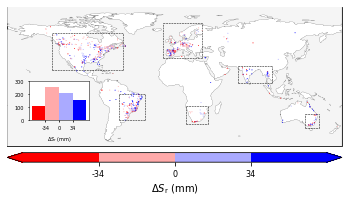

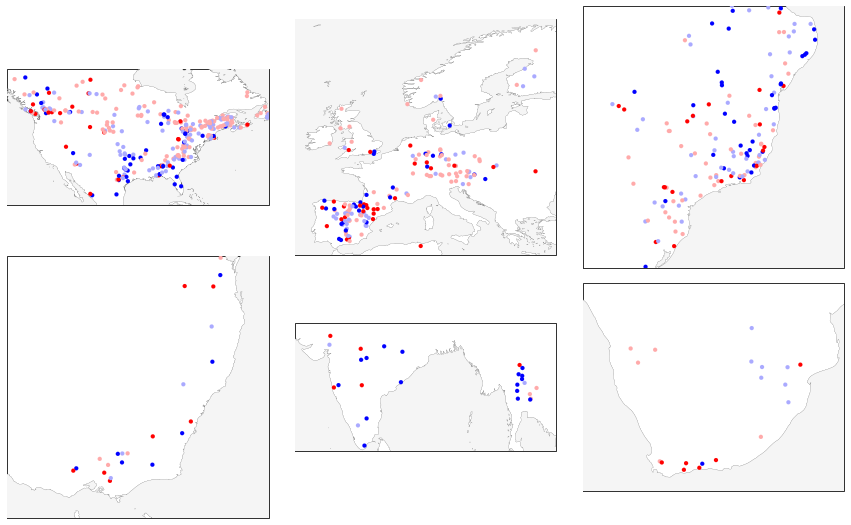

In [26]:
# TEST
fig2 = plt.figure(figsize=(6,6))
# plt.subplots_adjust(wspace=0000.1,hspace=-0.4)
ax = fig2.add_subplot(111,projection=ccrs.PlateCarree())
ax.coastlines(linewidth=0.1)
ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
ax.set_global()
ax.set_xlim(-180,180)
ax.set_ylim(-60,90)
s=ax.scatter(lon_test,lat_test,s=0.7,c=df_test.group,edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu,norm=norm,zorder=102)
# cbar = plt.colorbar(s, orientation='vertical',spacing='proportional',extend='both', pad=0.02,aspect=15, norm=norm,shrink=0.35)
cbar = plt.colorbar(s, orientation='horizontal',spacing='proportional',extend='both', pad=0.02,aspect=35, norm=norm)
cbar.set_label('$\Delta$$S_\mathrm{r}$ (mm)')
cbar.set_ticks([1,2,3])
cbar.set_ticklabels([f'-{test_mae}','0',f'{test_mae}'],size=8)
# for j, lab in enumerate([f'$n$={len(df_test[df_test.group==0])}',f'$n$={len(df_test[df_test.group==1])}',f'$n$={len(df_test[df_test.group==2])}',f'$n$={len(df_test[df_test.group==3])}']):
#     cbar.ax.text((j + 0.5), 0.5, lab, ha='center', va='center')
# for j, lab in enumerate([f'$n$={len(df_test[df_test.group==0])}',f'$n$={len(df_test[df_test.group==1])}',f'$n$={len(df_test[df_test.group==2])}',f'$n$={len(df_test[df_test.group==3])}']):
#     cbar.ax.text(0.5,(j + 0.5), lab, ha='center', va='center',rotation=90,size=6)
ax.plot([lon_min_a,lon_max_a],[lat_max_a,lat_max_a],'k--',zorder=101,linewidth=0.5)
ax.plot([lon_min_a,lon_max_a],[lat_min_a,lat_min_a],'k--',zorder=101,linewidth=0.5)
ax.plot([lon_min_a,lon_min_a],[lat_min_a,lat_max_a],'k--',zorder=101,linewidth=0.5)
ax.plot([lon_max_a,lon_max_a],[lat_min_a,lat_max_a],'k--',zorder=101,linewidth=0.5)

ax.plot([lon_min_e,lon_max_e],[lat_max_e,lat_max_e],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_min_e,lon_max_e],[lat_min_e,lat_min_e],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_min_e,lon_min_e],[lat_min_e,lat_max_e],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_max_e,lon_max_e],[lat_min_e,lat_max_e],'k--',linewidth=0.5,zorder=101)

ax.plot([lon_min_u,lon_max_u],[lat_max_u,lat_max_u],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_min_u,lon_max_u],[lat_min_u,lat_min_u],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_min_u,lon_min_u],[lat_min_u,lat_max_u],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_max_u,lon_max_u],[lat_min_u,lat_max_u],'k--',linewidth=0.5,zorder=101)

ax.plot([lon_min_s,lon_max_s],[lat_max_s,lat_max_s],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_min_s,lon_max_s],[lat_min_s,lat_min_s],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_min_s,lon_min_s],[lat_min_s,lat_max_s],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_max_s,lon_max_s],[lat_min_s,lat_max_s],'k--',linewidth=0.5,zorder=101)

ax.plot([lon_min_t,lon_max_t],[lat_max_t,lat_max_t],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_min_t,lon_max_t],[lat_min_t,lat_min_t],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_min_t,lon_min_t],[lat_min_t,lat_max_t],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_max_t,lon_max_t],[lat_min_t,lat_max_t],'k--',linewidth=0.5,zorder=101)

ax.plot([lon_min_f,lon_max_f],[lat_max_f,lat_max_f],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_min_f,lon_max_f],[lat_min_f,lat_min_f],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_min_f,lon_min_f],[lat_min_f,lat_max_f],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_max_f,lon_max_f],[lat_min_f,lat_max_f],'k--',linewidth=0.5,zorder=101)

iax = inset_axes(ax, width="18%", height="28%",loc=3,bbox_transform=ax.transAxes,bbox_to_anchor=(0.05,0.15,1,1))
plt.setp(list(iax.spines.values()),linewidth=0.5)
bins = [df_test['Sr_p-Sr_m'].quantile(0.01),-test_mae,0,test_mae,df_test['Sr_p-Sr_m'].quantile(0.99)]
n = [len(df_test[df_test.group==0]['Sr_p-Sr_m']),len(df_test[df_test.group==1]['Sr_p-Sr_m']),len(df_test[df_test.group==2]['Sr_p-Sr_m']),len(df_test[df_test.group==3]['Sr_p-Sr_m'])]
iax.bar([0,1,2,3],n,width=1,color=[cmap_rdbu(0),cmap_rdbu(1),cmap_rdbu(2),cmap_rdbu(3)])
iax.set_xticks([0.5,1.5,2.5])
iax.set_yticks([0,100,200,300])
iax.set_xticklabels([f'-{test_mae}','0',f'{test_mae}'])
iax.set_xlabel('$\Delta$$S_\mathrm{r}$ (mm)',size=5)
# iax.invert_yaxis()
# iax.yaxis.tick_right()
# iax.set_ylabel('$n$',size=6)
# iax.yaxis.set_label_position("right")
# iax.xaxis.tick_top()
iax.tick_params(axis='both',length=1.5, labelsize=5)

# ax.set_title('test abs error [sr-mm - sr-pred] (mm)')
fig2.savefig(f'{work_dir}/output/regression/figures/interpretation/test_maps_{mod}.jpg',bbox_inches='tight',dpi=300)

fig2 = plt.figure(figsize=(15,10))
ax = fig2.add_subplot(231,projection=ccrs.PlateCarree())
plt.subplots_adjust(wspace=0.1,hspace=-0.15)
ax.coastlines(linewidth=0.1)
ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
ax.set_global()
ax.set_ylim(lat_min_u,lat_max_u)
ax.set_xlim(lon_min_u,lon_max_u)
s=ax.scatter(lon_test,lat_test,s=17,c=df_test.group,edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu,norm=norm,zorder=101)

# fig2 = plt.figure(figsize=(6,6))
ax = fig2.add_subplot(232,projection=ccrs.PlateCarree())
ax.coastlines(linewidth=0.1)
ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
ax.set_global()
ax.set_ylim(lat_min_e,lat_max_e)
ax.set_xlim(lon_min_e,lon_max_e)
s=ax.scatter(lon_test,lat_test,s=17,c=df_test.group,edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu,norm=norm,zorder=101)

# fig2 = plt.figure(figsize=(6,6))
ax = fig2.add_subplot(233,projection=ccrs.PlateCarree())
ax.coastlines(linewidth=0.1)
ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
ax.set_global()
ax.set_ylim(lat_min_s,lat_max_s)
ax.set_xlim(lon_min_s,lon_max_s)
s=ax.scatter(lon_test,lat_test,s=17,c=df_test.group,edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu,norm=norm,zorder=101)

# fig2 = plt.figure(figsize=(6,6))
ax = fig2.add_subplot(234,projection=ccrs.PlateCarree())
ax.coastlines(linewidth=0.1)
ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
ax.set_global()
ax.set_ylim(lat_min_t,lat_max_t)
ax.set_xlim(lon_min_t,lon_max_t)
s=ax.scatter(lon_test,lat_test,s=17,c=df_test.group,edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu,norm=norm,zorder=101)

# fig2 = plt.figure(figsize=(6,6))
ax = fig2.add_subplot(235,projection=ccrs.PlateCarree())
ax.coastlines(linewidth=0.1)
ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
ax.set_global()
ax.set_ylim(lat_min_a,lat_max_a)
ax.set_xlim(lon_min_a,lon_max_a)
s=ax.scatter(lon_test,lat_test,s=17,c=df_test.group,edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu,norm=norm,zorder=101)

# fig2 = plt.figure(figsize=(6,6))
ax = fig2.add_subplot(236,projection=ccrs.PlateCarree())
ax.coastlines(linewidth=0.1)
ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
ax.set_global()
ax.set_ylim(lat_min_f,lat_max_f)
ax.set_xlim(lon_min_f,lon_max_f)
s=ax.scatter(lon_test,lat_test,s=17,c=df_test.group,edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu,norm=norm,zorder=101)
fig2.savefig(f'{work_dir}/output/regression/figures/interpretation/test_maps_zoomed_{mod}.jpg',bbox_inches='tight',dpi=300)


In [27]:
# combine all cv's train and test results
test_dfs=[]
train_dfs=[]
for i in range(5):
    train_ix = cv_train_ix[i]
    test_ix = cv_test_ix[i]

    # X_train, X_test, y_train, y_test = train_test_split(dfx, dfy.reshape(-1, 1).ravel(), test_size=0.3, random_state=42)
    X_train = dfx[train_ix]
    y_train = dfy[train_ix]
    X_test = dfx[test_ix]
    y_test = dfy[test_ix]

    # save lat lon columns
    lat_train = X_train[:,-3]
    lon_train = X_train[:,-2]
    lat_test = X_test[:,-3]
    lon_test = X_test[:,-2]
    catch_id_train = X_train[:,-1]
    catch_id_test = X_test[:,-1]
    # remove lat lon columns
    X_train = np.delete(X_train,-1,1)
    X_train = np.delete(X_train,-1,1)
    X_train = np.delete(X_train,-1,1)
    X_test = np.delete(X_test,-1,1)
    X_test = np.delete(X_test,-1,1)
    X_test = np.delete(X_test,-1,1)

    rf = RandomForestRegressor(criterion='absolute_error',random_state=42,min_samples_leaf=min_samples_leaf,max_depth=max_depth)
    # rf = RandomForestRegressor(criterion='squared_error',random_state=42,min_samples_leaf=min_samples_leaf,max_depth=max_depth,oob_score=True)
    rf = rf.fit(X_train, y_train)
    train_y_pred = rf.predict(X_train)
    test_y_pred = rf.predict(X_test)

    df_train = pd.DataFrame(index=catch_id_train,columns=['lat','lon','Sr_m','Sr_p','Sr_p-Sr_m','(Sr_p-Sr_m)/Sr_m'])
    df_train['lat'] = lat_train
    df_train['lon'] = lon_train
    df_train['Sr_m'] = y_train
    df_train['Sr_p'] = train_y_pred
    df_train['Sr_p-Sr_m'] = train_y_pred - y_train
    df_train['(Sr_p-Sr_m)/Sr_m'] = (train_y_pred - y_train)/train_y_pred
    train_dfs.append(df_train)

    df_test = pd.DataFrame(index=catch_id_test,columns=['lat','lon','Sr_m','Sr_p','Sr_p-Sr_m','(Sr_p-Sr_m)/Sr_m'])
    df_test['lat'] = lat_test
    df_test['lon'] = lon_test
    df_test['Sr_m'] = y_test
    df_test['Sr_p'] = test_y_pred
    df_test['Sr_p-Sr_m'] = test_y_pred - y_test
    df_test['(Sr_p-Sr_m)/Sr_m'] = (test_y_pred - y_test)/test_y_pred
    test_dfs.append(df_test)

test_dfs = pd.concat(test_dfs)
train_dfs = pd.concat(train_dfs)

# color catchments in scatter plot based on error and use same colors on a map
train_dfs['group'] = np.nan
ix2 = train_dfs[(train_dfs['Sr_p-Sr_m']<mae_train_mean)&(train_dfs['Sr_p-Sr_m']>0)].index
ix1 = train_dfs[(train_dfs['Sr_p-Sr_m']>mae_train_mean)].index
ix3 = train_dfs[(train_dfs['Sr_p-Sr_m']>-mae_train_mean)&(train_dfs['Sr_p-Sr_m']<0)].index
ix4 = train_dfs[(train_dfs['Sr_p-Sr_m']<-mae_train_mean)].index
train_dfs.loc[ix1,'group'] = 0
train_dfs.loc[ix2,'group'] = 1
train_dfs.loc[ix3,'group'] = 2
train_dfs.loc[ix4,'group'] = 3

test_dfs['group'] = np.nan
ix2 = test_dfs[(test_dfs['Sr_p-Sr_m']<mae_test_mean)&(test_dfs['Sr_p-Sr_m']>0)].index
ix1 = test_dfs[(test_dfs['Sr_p-Sr_m']>mae_test_mean)].index
ix3 = test_dfs[(test_dfs['Sr_p-Sr_m']>-mae_test_mean)&(test_dfs['Sr_p-Sr_m']<0)].index
ix4 = test_dfs[(test_dfs['Sr_p-Sr_m']<-mae_test_mean)].index
test_dfs.loc[ix1,'group'] = 0
test_dfs.loc[ix2,'group'] = 1
test_dfs.loc[ix3,'group'] = 2
test_dfs.loc[ix4,'group'] = 3

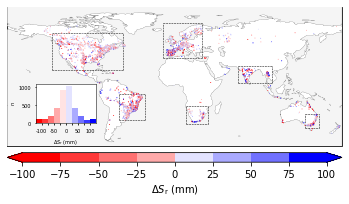

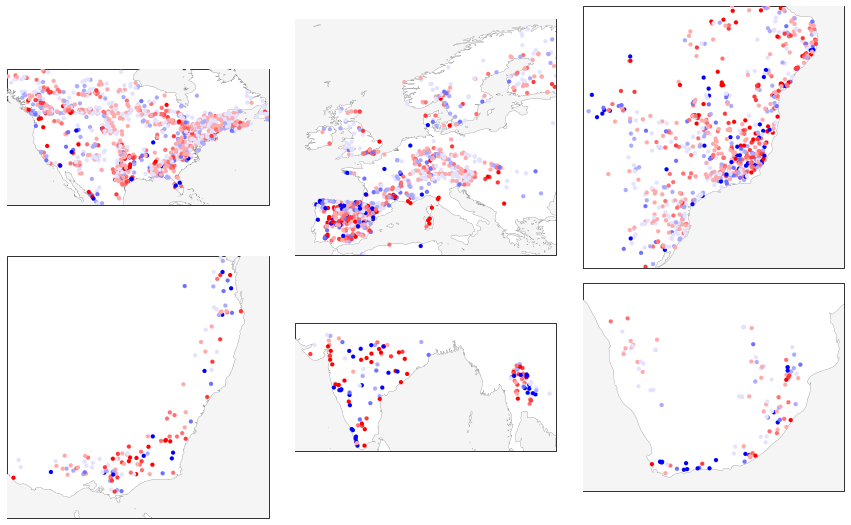

In [28]:
df_test = test_dfs

cmap_rdbu = cm.get_cmap('bwr_r',10)
# cmap_rdbu = ListedColormap([cmap_rdbu(0),cmap_rdbu(1),cmap_rdbu(2),cmap_rdbu(3)])
bounds = np.linspace(-100,100,9)
bounds2 = bounds
norm = mpl.colors.BoundaryNorm(bounds, cmap_rdbu.N)

# all test results from cross validation on map
fig2 = plt.figure(figsize=(6,6))
# plt.subplots_adjust(wspace=0000.1,hspace=-0.4)
ax = fig2.add_subplot(111,projection=ccrs.PlateCarree())
ax.coastlines(linewidth=0.1)
ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
ax.set_global()
ax.set_xlim(-180,180)
ax.set_ylim(-60,90)
# s=ax.scatter(df_test.lon,df_test.lat,s=0.7,c=df_test.group,edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu,norm=norm,zorder=102)
s=ax.scatter(df_test.lon,df_test.lat,s=0.7,c=df_test['Sr_p-Sr_m'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu,norm=norm,zorder=102)
# cbar = plt.colorbar(s, orientation='vertical',spacing='proportional',extend='both', pad=0.02,aspect=15, norm=norm,shrink=0.35)
cbar = plt.colorbar(s, orientation='horizontal',spacing='proportional',extend='both', pad=0.02,aspect=35, norm=norm)
cbar.set_label('$\Delta$$S_\mathrm{r}$ (mm)')
# cbar.set_ticks([1,2,3])
# cbar.set_ticklabels([f'-{int(mae_test_mean)}','0',f'{int(mae_test_mean)}'],size=8)

ax.plot([lon_min_a,lon_max_a],[lat_max_a,lat_max_a],'k--',zorder=101,linewidth=0.5)
ax.plot([lon_min_a,lon_max_a],[lat_min_a,lat_min_a],'k--',zorder=101,linewidth=0.5)
ax.plot([lon_min_a,lon_min_a],[lat_min_a,lat_max_a],'k--',zorder=101,linewidth=0.5)
ax.plot([lon_max_a,lon_max_a],[lat_min_a,lat_max_a],'k--',zorder=101,linewidth=0.5)

ax.plot([lon_min_e,lon_max_e],[lat_max_e,lat_max_e],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_min_e,lon_max_e],[lat_min_e,lat_min_e],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_min_e,lon_min_e],[lat_min_e,lat_max_e],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_max_e,lon_max_e],[lat_min_e,lat_max_e],'k--',linewidth=0.5,zorder=101)

ax.plot([lon_min_u,lon_max_u],[lat_max_u,lat_max_u],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_min_u,lon_max_u],[lat_min_u,lat_min_u],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_min_u,lon_min_u],[lat_min_u,lat_max_u],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_max_u,lon_max_u],[lat_min_u,lat_max_u],'k--',linewidth=0.5,zorder=101)

ax.plot([lon_min_s,lon_max_s],[lat_max_s,lat_max_s],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_min_s,lon_max_s],[lat_min_s,lat_min_s],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_min_s,lon_min_s],[lat_min_s,lat_max_s],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_max_s,lon_max_s],[lat_min_s,lat_max_s],'k--',linewidth=0.5,zorder=101)

ax.plot([lon_min_t,lon_max_t],[lat_max_t,lat_max_t],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_min_t,lon_max_t],[lat_min_t,lat_min_t],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_min_t,lon_min_t],[lat_min_t,lat_max_t],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_max_t,lon_max_t],[lat_min_t,lat_max_t],'k--',linewidth=0.5,zorder=101)

ax.plot([lon_min_f,lon_max_f],[lat_max_f,lat_max_f],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_min_f,lon_max_f],[lat_min_f,lat_min_f],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_min_f,lon_min_f],[lat_min_f,lat_max_f],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_max_f,lon_max_f],[lat_min_f,lat_max_f],'k--',linewidth=0.5,zorder=101)

iax = inset_axes(ax, width="18%", height="28%",loc=3,bbox_transform=ax.transAxes,bbox_to_anchor=(0.07,0.13,1,1))
n0=len(df_test[df_test['Sr_p-Sr_m']<bounds[0]])
n1=len(df_test[(df_test['Sr_p-Sr_m']<bounds[1])&(df_test['Sr_p-Sr_m']>bounds[0])])
n2=len(df_test[(df_test['Sr_p-Sr_m']<bounds[2])&(df_test['Sr_p-Sr_m']>bounds[1])])
n3=len(df_test[(df_test['Sr_p-Sr_m']<bounds[3])&(df_test['Sr_p-Sr_m']>bounds[2])])
n4=len(df_test[(df_test['Sr_p-Sr_m']<bounds[4])&(df_test['Sr_p-Sr_m']>bounds[3])])
n5=len(df_test[(df_test['Sr_p-Sr_m']<bounds[5])&(df_test['Sr_p-Sr_m']>bounds[4])])
n6=len(df_test[(df_test['Sr_p-Sr_m']<bounds[6])&(df_test['Sr_p-Sr_m']>bounds[5])])
n7=len(df_test[(df_test['Sr_p-Sr_m']<bounds[7])&(df_test['Sr_p-Sr_m']>bounds[6])])
n8=len(df_test[(df_test['Sr_p-Sr_m']<bounds[8])&(df_test['Sr_p-Sr_m']>bounds[7])])
n9=len(df_test[(df_test['Sr_p-Sr_m']>bounds[8])])
n = [n0,n1,n2,n3,n4,n5,n6,n7,n8,n9]
plt.setp(list(iax.spines.values()),linewidth=0.5)
bins=bounds
iax.bar([0,1,2,3,4,5,6,7,8,9],n,width=1,color=[cmap_rdbu(0),cmap_rdbu(1),cmap_rdbu(2),cmap_rdbu(3),cmap_rdbu(4),cmap_rdbu(5),cmap_rdbu(6),cmap_rdbu(7),cmap_rdbu(8),cmap_rdbu(9)])
iax.set_xticks([0.5,1.5,2.5,3.5,4.5,5.5,6.5,7.5,8.5])
iax.set_xticklabels(['-100','','-50','','0','','50','','100'])
iax.set_xlim(-0.5,9.5)
iax.set_xlabel('$\Delta$$S_\mathrm{r}$ (mm)',size=5)
iax.set_ylabel('$n$',size=5,labelpad=1)
iax.tick_params(axis='both',length=1.5, labelsize=5)

# ax.set_title('test abs error [sr-mm - sr-pred] (mm)')
fig2.savefig(f'{work_dir}/output/regression/figures/interpretation/test_maps2_{mod}.jpg',bbox_inches='tight',dpi=300)

fig2 = plt.figure(figsize=(15,10))
ax = fig2.add_subplot(231,projection=ccrs.PlateCarree())
plt.subplots_adjust(wspace=0.1,hspace=-0.15)
ax.coastlines(linewidth=0.1)
ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
ax.set_global()
ax.set_ylim(lat_min_u,lat_max_u)
ax.set_xlim(lon_min_u,lon_max_u)
s=ax.scatter(df_test.lon,df_test.lat,s=17,c=df_test['Sr_p-Sr_m'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu,norm=norm,zorder=101)

# fig2 = plt.figure(figsize=(6,6))
ax = fig2.add_subplot(232,projection=ccrs.PlateCarree())
ax.coastlines(linewidth=0.1)
ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
ax.set_global()
ax.set_ylim(lat_min_e,lat_max_e)
ax.set_xlim(lon_min_e,lon_max_e)
s=ax.scatter(df_test.lon,df_test.lat,s=17,c=df_test['Sr_p-Sr_m'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu,norm=norm,zorder=101)

# fig2 = plt.figure(figsize=(6,6))
ax = fig2.add_subplot(233,projection=ccrs.PlateCarree())
ax.coastlines(linewidth=0.1)
ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
ax.set_global()
ax.set_ylim(lat_min_s,lat_max_s)
ax.set_xlim(lon_min_s,lon_max_s)
s=ax.scatter(df_test.lon,df_test.lat,s=17,c=df_test['Sr_p-Sr_m'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu,norm=norm,zorder=101)

# fig2 = plt.figure(figsize=(6,6))
ax = fig2.add_subplot(234,projection=ccrs.PlateCarree())
ax.coastlines(linewidth=0.1)
ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
ax.set_global()
ax.set_ylim(lat_min_t,lat_max_t)
ax.set_xlim(lon_min_t,lon_max_t)
s=ax.scatter(df_test.lon,df_test.lat,s=17,c=df_test['Sr_p-Sr_m'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu,norm=norm,zorder=101)

# fig2 = plt.figure(figsize=(6,6))
ax = fig2.add_subplot(235,projection=ccrs.PlateCarree())
ax.coastlines(linewidth=0.1)
ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
ax.set_global()
ax.set_ylim(lat_min_a,lat_max_a)
ax.set_xlim(lon_min_a,lon_max_a)
s=ax.scatter(df_test.lon,df_test.lat,s=17,c=df_test['Sr_p-Sr_m'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu,norm=norm,zorder=101)

# fig2 = plt.figure(figsize=(6,6))
ax = fig2.add_subplot(236,projection=ccrs.PlateCarree())
ax.coastlines(linewidth=0.1)
ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
ax.set_global()
ax.set_ylim(lat_min_f,lat_max_f)
ax.set_xlim(lon_min_f,lon_max_f)
s=ax.scatter(df_test.lon,df_test.lat,s=17,c=df_test['Sr_p-Sr_m'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu,norm=norm,zorder=101)
fig2.savefig(f'{work_dir}/output/regression/figures/interpretation/test_maps_zoomed2_{mod}.jpg',bbox_inches='tight',dpi=300)


# MODEL B

In [9]:
mod = 'modelb'

In [10]:
#Europe
lat_min_e, lat_max_e = 35,75 # 36,46 only spain cluster
lon_min_e, lon_max_e = -12,29 # -10,5 only spain cluster

#Asia
lat_min_a, lat_max_a = 1,26
lon_min_a, lon_max_a = 68,105

#us
lat_min_u, lat_max_u = 12,65
lon_min_u, lon_max_u = -132,-52

#south america
lat_min_s, lat_max_s = -31,-3
lon_min_s, lon_max_s = -60,-32

#south africa
lat_min_f, lat_max_f = -35.3,-19.3
lon_min_f, lon_max_f = 12,36

#australia
lat_min_t, lat_max_t = -40,-25
lon_min_t, lon_max_t = 140,155

In [11]:
min_samples_leaf=1
max_depth=None
# n_estimators=100
# max_features=1

In [12]:
# sahara
p = xr.open_dataset(f'{work_dir}/output/gridded_sr/p_mean_gswp3_land.nc')
t = xr.open_dataset(f'{work_dir}/output/gridded_sr/t_mean_gswp3_land.nc')
idu = xr.open_dataset(f'{work_dir}/output/gridded_sr/idu_mean_land.nc')
asi = xr.open_dataset(f'{work_dir}/output/gridded_sr/asi_land.nc')

lat_min,lat_max=17,28
lon_min,lon_max=-5,12
i_s = idu.idu_mean[(idu.lat<lat_max)&(idu.lat>lat_min)]
i_s = i_s[:,250:415]

p_s = p.pr[0][(p.lat<lat_max)&(p.lat>lat_min)]
p_s = p_s[:,250:415]

t_s = t.tas[0][(t.lat<lat_max)&(t.lat>lat_min)]
t_s = t_s[:,250:415]

a_s = asi.asi[(asi.lat<lat_max)&(asi.lat>lat_min)]
a_s = a_s[:,250:415]

# cru T20 Lan
l = xr.open_dataset(f'{work_dir}/data/reference_sr/lan/sr_cru_20yrs.nc')
l_s = l.sr_cru_20yrs[0][(l.lat<lat_max)&(l.lat>lat_min)]
l_s = l_s[:,250:415]

x=100
lat_random = np.random.choice(np.arange(0,len(l_s.lat),1), x, replace=True)
lon_random = np.random.choice(np.arange(0,len(l_s.lon),1), x, replace=True)

ldf = pd.DataFrame(index = np.arange(0,x,1),columns=['lat','lon','sr_20','p_mean','idu_mean','t_mean','asi','catch_id'])#
for i in range(x):
    ldf['lon'][i] = l_s[lat_random[i],lon_random[i]].lon.values.astype(float).item()
    ldf['lat'][i] = l_s[lat_random[i],lon_random[i]].lat.values.astype(float).item()
    # ldf['sr_20'][i] = l_s[lat_random[i],lon_random[i]].values.astype(float).item()
    ldf['sr_20'][i] = 0.001
    if (ldf['sr_20'][i] == 0.0):
        ldf['sr_20'][i] = 0.001
    ldf['idu_mean'][i] = i_s[lat_random[i],lon_random[i]].values.astype(float).item()
    ldf['p_mean'][i] = p_s[lat_random[i],lon_random[i]].values.astype(float).item()
    ldf['t_mean'][i] = t_s[lat_random[i],lon_random[i]].values.astype(float).item()
    ldf['asi'][i] = a_s[lat_random[i],lon_random[i]].values.astype(float).item()
    ldf['catch_id'][i] = i
ldf = ldf.dropna()
# ldf

### cross validation

In [13]:
df = pd.read_csv(f'{work_dir}/output/catchment_characteristics/master_characteristics_{data_sources}_v2.csv',index_col=0)
df = df.drop(columns=['ppd_l'])
df = df[df.p_mean-df.q_mean < df.ep_mean]
df = df[['p_mean','ep_mean', 't_mean','tdiff_mean','idu_mean', 'si_ep','si_p', 'asi','dtb','ia','slp_mean','el_mean','tc','ntc','nonveg','pclay','psand','lai_mean','lai_rsd','sc_mean','sc_rsd','sr_20','lat','lon']]
df = df.dropna()
df['catch_id'] = df.index
features = ['t_mean','idu_mean','p_mean','asi']
# features = ['p_mean','ep_mean', 't_mean','tdiff_mean','idu_mean', 'si_ep','si_p', 'asi','dtb','ia','slp_mean','el_mean','tc','ntc','nonveg','pclay','psand','lai_mean','lai_rsd','sc_mean','sc_rsd']
sr_rp = 'sr_20'
ll = ['lat','lon','catch_id']

# add artificial sahara points
# adf = pd.DataFrame(columns=df.columns)
# for i in range(50):
#     adf.loc[i]= df.loc['om_0000002'] # copy this catchment 50x to represent better dry catchments
# for i in range(50):
#     adf.loc[i+50]= df.loc['na_0000048']
# df = pd.concat([df,adf])
# df = pd.concat([ldf,df])

f = features + ll
dfx = df[f].values
dfy = df[sr_rp].values

# here split dataset into 'temp' and 'test'
cv_outer = 5 # the number of outer cross validations
sdf = pd.DataFrame(index=range(cv_outer), columns=['n_estimators','max_depth','min_samples_leaf','max_features','train_mae','train_r2_adj','test_mae','test_r2_adj','n_train','n_test','fold'])
l = []
train_dfs=[]
test_dfs=[]

kf = KFold(n_splits=cv_outer,shuffle=True,random_state=0)
df = dfy.reshape(-1, 1).ravel()
i=0
cv_train_ix = []
cv_test_ix = []
ddl = []
for train_ix, test_ix in kf.split(dfx):
    cv_train_ix.append(train_ix)
    cv_test_ix.append(test_ix)
    X = dfx[train_ix]
    y = dfy[train_ix]
    X_test = dfx[test_ix]
    y_test = dfy[test_ix] 
    
    # save lat lon columns
    lat_train = X[:,-3]
    lon_train = X[:,-2]
    lat_test = X_test[:,-3]
    lon_test = X_test[:,-2]
    catch_id_train = X[:,-1]
    catch_id_test = X_test[:,-1]

    # remove lat lon catchid columns
    X = np.delete(X,-1,1)
    X = np.delete(X,-1,1)
    X = np.delete(X,-1,1)
    X_test = np.delete(X_test,-1,1)
    X_test = np.delete(X_test,-1,1)
    X_test = np.delete(X_test,-1,1)  
    
    # run rf model with full 'temp' set and test set using the best inner cross validation
    rf = RandomForestRegressor(criterion='absolute_error',random_state=42,max_depth=max_depth,min_samples_leaf=min_samples_leaf,oob_score=True)
    rf.fit(X,y)
    test_y_pred = rf.predict(X_test)
    train_y_pred = rf.predict(X)
    n_train,n_test = len(y),len(y_test)

    train_mae = np.round(mean_absolute_error(y, train_y_pred),2)
    train_r2_adj =  np.round(r2_adj(y, train_y_pred,features),2)

    test_mae = np.round(mean_absolute_error(y_test, test_y_pred),2)
    test_r2_adj = np.round(r2_adj(y_test, test_y_pred,features),2)
    
    perm_importance = permutation_importance(rf, X_test, y_test,scoring='neg_mean_absolute_error',random_state=42)
    # perm_importance = permutation_importance(rf, X_train, y_test,scoring='neg_mean_absolute_error',random_state=42)
    pi = perm_importance.importances_mean
    dd = pd.DataFrame(index=features,columns=['pi'])
    dd.pi = pi
    ddl.append(dd)
    
    df_train = pd.DataFrame(index=catch_id_train,columns=['lat','lon','Sr_m','Sr_p','Sr_p-Sr_m','(Sr_p-Sr_m)/Sr_m'])
    df_train['lat'] = lat_train
    df_train['lon'] = lon_train
    df_train['Sr_m'] = y
    df_train['Sr_p'] = train_y_pred
    df_train['Sr_p-Sr_m'] = train_y_pred - y
    df_train['(Sr_p-Sr_m)/Sr_m'] = (train_y_pred - y)/train_y_pred
    train_dfs.append(df_train)

    df_test = pd.DataFrame(index=catch_id_test,columns=['lat','lon','Sr_m','Sr_p','Sr_p-Sr_m','(Sr_p-Sr_m)/Sr_m'])
    df_test['lat'] = lat_test
    df_test['lon'] = lon_test
    df_test['Sr_m'] = y_test
    df_test['Sr_p'] = test_y_pred
    df_test['Sr_p-Sr_m'] = test_y_pred - y_test
    df_test['(Sr_p-Sr_m)/Sr_m'] = (test_y_pred - y_test)/test_y_pred
    test_dfs.append(df_test)

    # save scores in dataframe
    # sdf.loc[i][['n_estimators','max_depth','min_samples_leaf','max_features']] = [n_estimators,max_depth,min_samples_leaf,max_features]
    sdf.loc[i]['fold'] = i
    sdf.loc[i][['train_mae','train_r2_adj']] = [train_mae,train_r2_adj]
    sdf.loc[i][['test_mae','test_r2_adj']] = [test_mae,test_r2_adj]
    sdf.loc[i][['n_train','n_test']] = [n_train,n_test]
    print(i)

    i+=1

# sdf.to_csv(f'{work_dir}/cross_validation/output/sdf_kinner{cv_inner}_kouter{cv_outer}_var{len(features)}_v2.csv')

0
1
2
3
4


In [14]:
sdf

,n_estimators,max_depth,min_samples_leaf,max_features,train_mae,train_r2_adj,test_mae,test_r2_adj,n_train,n_test,fold
0,NaN,NaN,NaN,NaN,15.55,0.96,39.34,0.82,2889,723,0
1,NaN,NaN,NaN,NaN,15.14,0.97,42.15,0.71,2889,723,1
2,NaN,NaN,NaN,NaN,15.32,0.97,41.06,0.76,2890,722,2
3,NaN,NaN,NaN,NaN,15.39,0.97,40.87,0.75,2890,722,3
4,NaN,NaN,NaN,NaN,15.66,0.96,38.19,0.81,2890,722,4


In [15]:
mae_train_mean = (sdf.train_mae.mean(axis=0))
mae_train_std = (sdf.train_mae.std(axis=0))
mae_test_mean = (sdf.test_mae.mean(axis=0))
mae_test_std = (sdf.test_mae.std(axis=0))
print(mae_train_mean, mae_train_std)
print(mae_test_mean, mae_test_std)

15.412 0.202163300329214
40.322 1.5569425166010464


In [16]:
len(df)

3612

In [17]:
# permutation importances for each cv fold
ddd = pd.DataFrame(index=ddl[0].index, columns=['pi0','pi1','pi2','pi3'])
ddd.pi0 = ddl[0].pi
ddd.pi1 = ddl[1].pi
ddd.pi2 = ddl[2].pi
ddd.pi3 = ddl[3].pi
ddd['mean'] = ddd.mean(axis=1)
ddd['std'] = ddd[['pi0','pi1','pi2','pi3']].std(axis=1)
ddd = ddd.sort_values(by='mean',ascending=False)
ddd['features2'] = ['$\overline{T}$','$\overline{t_\mathrm{IS}}$','$\overline{P}$','$I_{\mathrm{AS}}$']
# rb = cm.get_cmap('tab10', 9)
# c1,c2,c3,c4,c5,c6,c7,c8,c9 = rb(0),rb(1),rb(2),rb(3),rb(4),rb(5),rb(6),rb(7),rb(8)
# ddd['colors'] = [c1,c2,c2,c8,c4,c4,c2,c2,c6,c3,c9,c9,c5,c2,c9,c9,c3,c6,c2,c9,c7]
ddd

,pi0,pi1,pi2,pi3,mean,std,features2
t_mean,51.956141,50.641538,49.384936,44.695443,49.169515,3.162060,$\overline{T}$
idu_mean,35.500343,35.492194,31.435367,35.855984,34.570972,2.097273,$\overline{t_\mathrm{IS}}$
p_mean,19.613537,19.429842,18.905121,21.020029,19.742132,0.903266,$\overline{P}$
asi,9.279899,10.927423,9.703778,8.960401,9.717875,0.861935,$I_{\mathrm{AS}}$


In [18]:
# get mae for different regions
ll_e = lat_max_e, lat_min_e, lon_max_e, lon_min_e
ll_a = lat_max_a, lat_min_a, lon_max_a, lon_min_a
ll_u = lat_max_u, lat_min_u, lon_max_u, lon_min_u
ll_s = lat_max_s, lat_min_s, lon_max_s, lon_min_s
ll_f = lat_max_f, lat_min_f, lon_max_f, lon_min_f
ll_t = lat_max_t, lat_min_t, lon_max_t, lon_min_t
ll = [ll_e,ll_a,ll_u,ll_s,ll_f,ll_t]

dfr = pd.DataFrame(index=[0,1,2,3,4], columns=['mad_europe','mad_asia','mad_northamerica','mad_southamerica','mad_southafrica','mad_australia'])
for i in range(len(train_dfs)):
    df = train_dfs[i]
    for j in range(len(ll)):
        k = ll[j]
        lat_max,lat_min,lon_max,lon_min = k[0],k[1],k[2],k[3]
        dfs = df[(df.lat<lat_max)&(df.lat>lat_min)&(df.lon<lon_max)&(df.lon>lon_min)]
        mae = abs(dfs['Sr_p-Sr_m']).mean()
        dfr.iloc[i,j] = mae
dfrr = pd.DataFrame(index=['mean','std'], columns=['mad_europe','mad_asia','mad_northamerica','mad_southamerica','mad_southafrica','mad_australia'])
dfrr.loc['mean',:] = np.round(dfr.mean(axis=0),0)
dfrr.loc['median',:] = np.round(dfr.mean(axis=0),0)
dfrr.loc['std',:] = np.round(dfr.std(axis=0),0)

dfr = pd.DataFrame(index=[0,1,2,3,4], columns=['mad_europe','mad_asia','mad_northamerica','mad_southamerica','mad_southafrica','mad_australia'])
for i in range(len(train_dfs)):
    df = test_dfs[i]
    for j in range(len(ll)):
        k = ll[j]
        lat_max,lat_min,lon_max,lon_min = k[0],k[1],k[2],k[3]
        dfs = df[(df.lat<lat_max)&(df.lat>lat_min)&(df.lon<lon_max)&(df.lon>lon_min)]
        mae = abs(dfs['Sr_p-Sr_m']).mean()
        dfr.iloc[i,j] = mae
dfrrt = pd.DataFrame(index=['mean','std'], columns=['mad_europe','mad_asia','mad_northamerica','mad_southamerica','mad_southafrica','mad_australia'])
dfrrt.loc['mean',:] = np.round(dfr.mean(axis=0),0)
dfrrt.loc['median',:] = np.round(dfr.mean(axis=0),0)
dfrrt.loc['std',:] = np.round(dfr.std(axis=0),0)

# relative
dfr = pd.DataFrame(index=[0,1,2,3,4], columns=['mad_europe','mad_asia','mad_northamerica','mad_southamerica','mad_southafrica','mad_australia'])
for i in range(len(train_dfs)):
    df = train_dfs[i]
    for j in range(len(ll)):
        k = ll[j]
        lat_max,lat_min,lon_max,lon_min = k[0],k[1],k[2],k[3]
        dfs = df[(df.lat<lat_max)&(df.lat>lat_min)&(df.lon<lon_max)&(df.lon>lon_min)]
        mae = abs(dfs['(Sr_p-Sr_m)/Sr_m']).mean()
        dfr.iloc[i,j] = mae
dfrr_rel = pd.DataFrame(index=['mean','std'], columns=['mad_europe','mad_asia','mad_northamerica','mad_southamerica','mad_southafrica','mad_australia'])
dfrr_rel.loc['mean',:] = np.round(dfr.mean(axis=0),2)
dfrr_rel.loc['median',:] = np.round(dfr.median(axis=0),2)
dfrr_rel.loc['std',:] = np.round(dfr.std(axis=0),2)

dfr = pd.DataFrame(index=[0,1,2,3,4], columns=['mad_europe','mad_asia','mad_northamerica','mad_southamerica','mad_southafrica','mad_australia'])
for i in range(len(train_dfs)):
    df = test_dfs[i]
    for j in range(len(ll)):
        k = ll[j]
        lat_max,lat_min,lon_max,lon_min = k[0],k[1],k[2],k[3]
        dfs = df[(df.lat<lat_max)&(df.lat>lat_min)&(df.lon<lon_max)&(df.lon>lon_min)]
        mae = abs(dfs['(Sr_p-Sr_m)/Sr_m']).mean()
        dfr.iloc[i,j] = mae
dfrrt_rel = pd.DataFrame(index=['mean','std'], columns=['mad_europe','mad_asia','mad_northamerica','mad_southamerica','mad_southafrica','mad_australia'])
dfrrt_rel.loc['mean',:] = np.round(dfr.mean(axis=0),2)
dfrrt_rel.loc['median',:] = np.round(dfr.median(axis=0),2)
dfrrt_rel.loc['std',:] = np.round(dfr.std(axis=0),2)

In [19]:
#test
dfrrt

,mad_europe,mad_asia,mad_northamerica,mad_southamerica,mad_southafrica,mad_australia
mean,39.0,87.0,31.0,42.0,46.0,51.0
std,2.0,18.0,2.0,3.0,9.0,13.0
median,39.0,87.0,31.0,42.0,46.0,51.0


In [20]:
#test rel
dfrrt_rel = dfrrt_rel*100
dfrrt_rel

,mad_europe,mad_asia,mad_northamerica,mad_southamerica,mad_southafrica,mad_australia
mean,44.0,27.0,36.0,26.0,24.0,35.0
std,4.0,4.0,2.0,3.0,5.0,14.0
median,44.0,28.0,36.0,26.0,22.0,28.0


In [21]:
# get mae for different regions
ll_e = lat_max_e, lat_min_e, lon_max_e, lon_min_e
ll_a = lat_max_a, lat_min_a, lon_max_a, lon_min_a
ll_u = lat_max_u, lat_min_u, lon_max_u, lon_min_u
ll_s = lat_max_s, lat_min_s, lon_max_s, lon_min_s
ll_f = lat_max_f, lat_min_f, lon_max_f, lon_min_f
ll_t = lat_max_t, lat_min_t, lon_max_t, lon_min_t
ll = [ll_e,ll_a,ll_u,ll_s,ll_f,ll_t]

dfr = pd.DataFrame(index=[0,1,2,3,4], columns=['mad_europe','mad_asia','mad_northamerica','mad_southamerica','mad_southafrica','mad_australia'])
for i in range(len(train_dfs)):
    df = train_dfs[i]
    for j in range(len(ll)):
        k = ll[j]
        lat_max,lat_min,lon_max,lon_min = k[0],k[1],k[2],k[3]
        dfs = df[(df.lat<lat_max)&(df.lat>lat_min)&(df.lon<lon_max)&(df.lon>lon_min)]
        mae = abs(dfs['Sr_p-Sr_m']).median()
        dfr.iloc[i,j] = mae
mdfrr = pd.DataFrame(index=['median','std'], columns=['mad_europe','mad_asia','mad_northamerica','mad_southamerica','mad_southafrica','mad_australia'])
mdfrr.loc['median',:] = np.round(dfr.median(axis=0),0)
mdfrr.loc['median',:] = np.round(dfr.median(axis=0),0)
mdfrr.loc['std',:] = np.round(dfr.std(axis=0),0)

dfr = pd.DataFrame(index=[0,1,2,3,4], columns=['mad_europe','mad_asia','mad_northamerica','mad_southamerica','mad_southafrica','mad_australia'])
for i in range(len(train_dfs)):
    df = test_dfs[i]
    for j in range(len(ll)):
        k = ll[j]
        lat_max,lat_min,lon_max,lon_min = k[0],k[1],k[2],k[3]
        dfs = df[(df.lat<lat_max)&(df.lat>lat_min)&(df.lon<lon_max)&(df.lon>lon_min)]
        mae = abs(dfs['Sr_p-Sr_m']).median()
        dfr.iloc[i,j] = mae
mdfrrt = pd.DataFrame(index=['median','std'], columns=['mad_europe','mad_asia','mad_northamerica','mad_southamerica','mad_southafrica','mad_australia'])
mdfrrt.loc['median',:] = np.round(dfr.median(axis=0),0)
mdfrrt.loc['median',:] = np.round(dfr.median(axis=0),0)
mdfrrt.loc['std',:] = np.round(dfr.std(axis=0),0)

# relative
dfr = pd.DataFrame(index=[0,1,2,3,4], columns=['mad_europe','mad_asia','mad_northamerica','mad_southamerica','mad_southafrica','mad_australia'])
for i in range(len(train_dfs)):
    df = train_dfs[i]
    for j in range(len(ll)):
        k = ll[j]
        lat_max,lat_min,lon_max,lon_min = k[0],k[1],k[2],k[3]
        dfs = df[(df.lat<lat_max)&(df.lat>lat_min)&(df.lon<lon_max)&(df.lon>lon_min)]
        mae = abs(dfs['(Sr_p-Sr_m)/Sr_m']).median()
        dfr.iloc[i,j] = mae
mdfrr_rel = pd.DataFrame(index=['median','std'], columns=['mad_europe','mad_asia','mad_northamerica','mad_southamerica','mad_southafrica','mad_australia'])
mdfrr_rel.loc['median',:] = np.round(dfr.median(axis=0),2)
mdfrr_rel.loc['median',:] = np.round(dfr.median(axis=0),2)
mdfrr_rel.loc['std',:] = np.round(dfr.std(axis=0),2)

dfr = pd.DataFrame(index=[0,1,2,3,4], columns=['mad_europe','mad_asia','mad_northamerica','mad_southamerica','mad_southafrica','mad_australia'])
for i in range(len(train_dfs)):
    df = test_dfs[i]
    for j in range(len(ll)):
        k = ll[j]
        lat_max,lat_min,lon_max,lon_min = k[0],k[1],k[2],k[3]
        dfs = df[(df.lat<lat_max)&(df.lat>lat_min)&(df.lon<lon_max)&(df.lon>lon_min)]
        mae = abs(dfs['(Sr_p-Sr_m)/Sr_m']).median()
        dfr.iloc[i,j] = mae
mdfrrt_rel = pd.DataFrame(index=['median','std'], columns=['mad_europe','mad_asia','mad_northamerica','mad_southamerica','mad_southafrica','mad_australia'])
mdfrrt_rel.loc['median',:] = np.round(dfr.median(axis=0),2)
mdfrrt_rel.loc['median',:] = np.round(dfr.median(axis=0),2)
mdfrrt_rel.loc['std',:] = np.round(dfr.std(axis=0),2)

In [22]:
#test
mdfrrt

,mad_europe,mad_asia,mad_northamerica,mad_southamerica,mad_southafrica,mad_australia
median,26.0,75.0,22.0,28.0,31.0,42.0
std,2.0,16.0,2.0,2.0,5.0,10.0


In [23]:
#test rel
mdfrrt_rel = mdfrrt_rel*100
mdfrrt_rel

,mad_europe,mad_asia,mad_northamerica,mad_southamerica,mad_southafrica,mad_australia
median,37.0,21.0,25.0,17.0,13.0,19.0
std,3.0,4.0,3.0,2.0,4.0,5.0


In [24]:
df = pd.read_csv(f'{work_dir}/output/catchment_characteristics/master_characteristics_{data_sources}_v2.csv',index_col=0)
df = df.drop(columns=['ppd_l'])
df = df[df.p_mean-df.q_mean < df.ep_mean]
df = df[['p_mean','ep_mean', 't_mean','tdiff_mean','idu_mean', 'si_ep','si_p', 'asi','dtb','ia','slp_mean','el_mean','tc','ntc','nonveg','pclay','psand','lai_mean','lai_rsd','sc_mean','sc_rsd','sr_20','lat','lon']]
df = df.dropna()
features = ['t_mean','idu_mean','p_mean','asi']
# features = ['p_mean','ep_mean', 't_mean','tdiff_mean','idu_mean', 'si_ep','si_p', 'asi','dtb','ia','slp_mean','el_mean','tc','ntc','nonveg','pclay','psand','lai_mean','lai_rsd','sc_mean','sc_rsd']

# adf = pd.DataFrame(columns=df.columns)
# for i in range(50):
#     adf.loc[i]= df.loc['om_0000002'] # copy this catchment 50x to represent better dry catchments
# for i in range(50):
#     adf.loc[i+50]= df.loc['na_0000048']
# df = pd.concat([df,adf])

# df = pd.concat([ldf,df])

In [25]:
df

,p_mean,ep_mean,t_mean,tdiff_mean,idu_mean,si_ep,si_p,asi,dtb,ia,...,nonveg,pclay,psand,lai_mean,lai_rsd,sc_mean,sc_rsd,sr_20,lat,lon
ca_0002351,1.590253,1.401269,0.643260,25.221876,5.05,0.704030,0.464383,0.000000,19.41,0.003286,...,0.294740,17.094944,45.838508,0.950806,0.641162,41.416667,0.833385,86.691569,51.01460,-114.08960
cz_0000019,2.285853,1.484881,7.528472,22.165638,3.81,0.554593,0.213216,0.024284,18.85,0.000002,...,0.180999,16.322265,42.762079,1.885474,0.753561,25.416667,1.311083,51.681945,49.76040,16.97290
br_0001191,4.152597,3.260944,24.602384,4.562576,2.67,0.138040,0.173603,0.121069,25.74,0.003675,...,0.073967,36.166791,44.203801,2.808409,0.113255,0.000000,0.000000,173.824040,-13.36460,-39.08130
br_0000469,4.944120,3.258352,26.827793,2.495693,6.62,0.049197,0.609147,0.114847,25.93,0.000325,...,0.248321,28.315328,54.128498,1.862262,0.252759,0.000000,0.000000,333.062414,-6.67290,-48.46880
bw_0000006,1.358820,2.669859,20.623299,10.890681,12.46,0.245236,0.838107,0.037922,10.34,0.000000,...,0.241470,21.254629,69.722858,0.581395,0.657466,0.000000,0.000000,221.777925,-21.08960,27.51460
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2342933,3.745021,2.813956,18.574819,20.548962,4.03,0.321256,0.142954,0.115187,13.33,0.002393,...,0.112886,26.071614,49.831392,2.687272,0.570877,0.083333,3.464102,264.588102,32.01766,-85.29577
8155200,2.443305,2.539987,19.716896,20.792007,5.18,0.401462,0.217222,0.057260,8.45,0.000323,...,0.154220,32.240327,38.662520,1.062247,0.224592,0.000000,0.000000,295.776515,30.29632,-97.92557
2472000,4.120200,2.897947,18.336339,20.451761,3.89,0.320265,0.123824,0.156997,18.81,0.000853,...,0.140715,28.204969,32.187203,2.862665,0.514875,0.000000,0.000000,236.554537,31.70694,-89.40694
6784000,1.772299,1.731829,9.414148,29.647746,4.86,0.627384,0.512336,0.000000,140.87,0.235538,...,0.276233,18.066044,51.319892,0.738392,0.884287,9.000000,1.464890,190.322812,41.03244,-98.74053


In [26]:
sr_rp = 'sr_20'
df['catch_id'] = df.index
ll = ['lat','lon','catch_id']
f = features + ll
dfx = df[f].values
dfy = df[sr_rp].values

train_ix = cv_train_ix[1]
test_ix = cv_test_ix[1]

# X_train, X_test, y_train, y_test = train_test_split(dfx, dfy.reshape(-1, 1).ravel(), test_size=0.3, random_state=42)
X_train = dfx[train_ix]
y_train = dfy[train_ix]
X_test = dfx[test_ix]
y_test = dfy[test_ix]

# X_train, X_test, y_train, y_test = train_test_split(dfx, dfy.reshape(-1, 1).ravel(), test_size=0.3, random_state=42)

# save lat lon columns
lat_train = X_train[:,-3]
lon_train = X_train[:,-2]
lat_test = X_test[:,-3]
lon_test = X_test[:,-2]
catch_id_train = X_train[:,-1]
catch_id_test = X_test[:,-1]
# remove lat lon columns
X_train = np.delete(X_train,-1,1)
X_train = np.delete(X_train,-1,1)
X_train = np.delete(X_train,-1,1)
X_test = np.delete(X_test,-1,1)
X_test = np.delete(X_test,-1,1)
X_test = np.delete(X_test,-1,1)

rf = RandomForestRegressor(criterion='absolute_error',random_state=42,max_depth=max_depth,min_samples_leaf=min_samples_leaf,oob_score=True)
# rf = RandomForestRegressor(criterion='squared_error',random_state=42,min_samples_leaf=min_samples_leaf,max_depth=max_depth,oob_score=True)
rf = rf.fit(X_train, y_train)
train_y_pred = rf.predict(X_train)
test_y_pred = rf.predict(X_test)
individual_tree_predictions = np.array([tree.predict(X_test) for tree in rf.estimators_]).T
std_test = np.std(individual_tree_predictions,axis=1)
individual_tree_predictions = np.array([tree.predict(X_train) for tree in rf.estimators_]).T
std_train = np.std(individual_tree_predictions,axis=1)

df_train = pd.DataFrame(index=catch_id_train,columns=['lat','lon','Sr_m','Sr_p','Sr_p-Sr_m','(Sr_p-Sr_m)/Sr_m','std_train'])
df_train['lat'] = lat_train
df_train['lon'] = lon_train
df_train['Sr_m'] = y_train
df_train['Sr_p'] = train_y_pred
df_train['Sr_p-Sr_m'] = train_y_pred - y_train
df_train['(Sr_p-Sr_m)/Sr_m'] = (train_y_pred - y_train)/train_y_pred
df_train['std'] = std_train

df_test = pd.DataFrame(index=catch_id_test,columns=['lat','lon','Sr_m','Sr_p','Sr_p-Sr_m','(Sr_p-Sr_m)/Sr_m','std_test'])
df_test['lat'] = lat_test
df_test['lon'] = lon_test
df_test['Sr_m'] = y_test
df_test['Sr_p'] = test_y_pred
df_test['Sr_p-Sr_m'] = test_y_pred - y_test
df_test['(Sr_p-Sr_m)/Sr_m'] = (test_y_pred - y_test)/test_y_pred
df_test['std'] = std_test

train_mse = int(mean_squared_error(y_train, train_y_pred))
train_mae = int(np.round(mean_absolute_error(y_train, train_y_pred),0))
train_r2 = np.round(r2_score(y_train, train_y_pred),2)
train_r2_adj =  np.round(r2_adj(y_train, train_y_pred,features),2)
train_rmse = int(rmse(y_train,train_y_pred))
train_mape =  np.round(mean_absolute_percentage_error(y_train, train_y_pred),2)

test_mse = int(mean_squared_error(y_test, test_y_pred))
test_mae = int(np.round(mean_absolute_error(y_test, test_y_pred),0))
test_r2 = np.round(r2_score(y_test, test_y_pred),2)
test_r2_adj = np.round(r2_adj(y_test, test_y_pred,features),2)
test_rmse = int(rmse(y_test,test_y_pred))
test_mape = np.round(mean_absolute_percentage_error(y_test, test_y_pred),2)

n_test = len(y_test)
n_train = len(y_train)

perm_importance = permutation_importance(rf, X_test, y_test,scoring='neg_mean_absolute_error',n_repeats=10,random_state=42)
pi = perm_importance.importances_mean
dd = pd.DataFrame(index=features,columns=['pi_mean','pi_std'])
dd['pi_mean'] = pi
dd['pi_std'] = perm_importance.importances_std
dd = dd.sort_values(by='pi_mean') 

perm_importance = permutation_importance(rf, X_train, y_train,scoring='neg_mean_absolute_error',n_repeats=10,random_state=42)
pi = perm_importance.importances_mean
ddtr = pd.DataFrame(index=features,columns=['pi_mean','pi_std'])
ddtr['pi_mean'] = pi
ddtr['pi_std'] = perm_importance.importances_std
ddtr = ddtr.sort_values(by='pi_mean')    

sdf = pd.DataFrame(index=[0])
sdf[features] = np.round(pi,4)
# sdf[features] = np.round(rf.feature_importances_,2)
sdf[['train_mse','train_rmse','train_mae','train_r2','train_r2_adj','train_mape']] = [train_mse,train_rmse,train_mae,train_r2,train_r2_adj,train_mape]
sdf[['test_mse','test_rmse','test_mae','test_r2','test_r2_adj','test_mape']] = [test_mse,test_rmse,test_mae,test_r2,test_r2_adj,test_mape]
sdf[['n_train','n_test']] = [n_train,n_test]


In [27]:
df_test

,lat,lon,Sr_m,Sr_p,Sr_p-Sr_m,(Sr_p-Sr_m)/Sr_m,std_test,std
br_0001191,-13.3646,-39.0813,173.824040,192.505340,18.681300,0.097043,NaN,94.052453
ca_0005679,49.0937,-120.6729,108.511781,56.580926,-51.930855,-0.917816,NaN,58.528559
us_0002162,32.9771,-85.7396,186.107329,201.936110,15.828781,0.078385,NaN,28.268154
fr_0000453,45.2646,1.3771,130.998251,128.813271,-2.184980,-0.016962,NaN,61.803500
ca_0004570,51.1396,-120.1187,26.879852,94.728468,67.848617,0.716243,NaN,47.148057
...,...,...,...,...,...,...,...,...
3182500,38.18595,-80.13062,38.715440,48.398225,9.682785,0.200065,NaN,36.378789
8101000,31.28489,-97.88502,325.049120,322.366128,-2.682992,-0.008323,NaN,45.262161
7180500,38.19645,-96.82458,202.793262,96.266724,-106.526537,-1.106577,NaN,68.656942
9497980,33.82783,-110.85623,213.232311,200.875891,-12.356420,-0.061513,NaN,51.921794


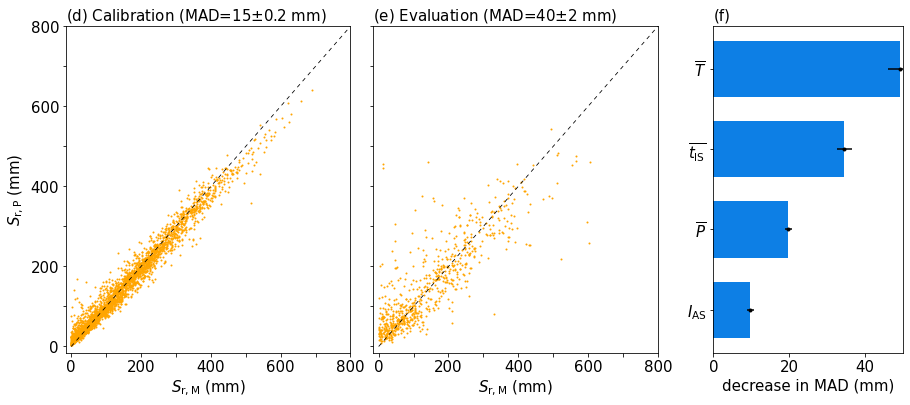

In [28]:
# scatter plots
x = np.linspace(0,800,100)
y = x
cmap_rdbu = cm.get_cmap('bwr_r', 4)
cmap_rdbu = ListedColormap([cmap_rdbu(0),cmap_rdbu(1),cmap_rdbu(2),cmap_rdbu(3)])
# cmap_rdbu = ListedColormap([cmap_rdbu(1),cmap_rdbu(0),cmap_rdbu(3),cmap_rdbu(2)])

bounds = np.linspace(0, 4, 5)
bounds2 = bounds
norm = mpl.colors.BoundaryNorm(bounds, cmap_rdbu.N)

# color catchments in scatter plot based on error and use same colors on a map
df_train['group'] = np.nan
ix2 = df_train[(df_train['Sr_p-Sr_m']<train_mae)&(df_train['Sr_p-Sr_m']>0)].index
ix1 = df_train[(df_train['Sr_p-Sr_m']>train_mae)].index
ix3 = df_train[(df_train['Sr_p-Sr_m']>-train_mae)&(df_train['Sr_p-Sr_m']<0)].index
ix4 = df_train[(df_train['Sr_p-Sr_m']<-train_mae)].index
df_train.loc[ix1,'group'] = 0
df_train.loc[ix2,'group'] = 1
df_train.loc[ix3,'group'] = 2
df_train.loc[ix4,'group'] = 3

df_test['group'] = np.nan
ix2 = df_test[(df_test['Sr_p-Sr_m']<test_mae)&(df_test['Sr_p-Sr_m']>0)].index
ix1 = df_test[(df_test['Sr_p-Sr_m']>test_mae)].index
ix3 = df_test[(df_test['Sr_p-Sr_m']>-test_mae)&(df_test['Sr_p-Sr_m']<0)].index
ix4 = df_test[(df_test['Sr_p-Sr_m']<-test_mae)].index
df_test.loc[ix1,'group'] = 0
df_test.loc[ix2,'group'] = 1
df_test.loc[ix3,'group'] = 2
df_test.loc[ix4,'group'] = 3

fig1, ax = plt.subplots(1,4, figsize=(15,6),gridspec_kw={'width_ratios': [3,3,0.1,2]})
ax[2].axis('off')
# ax[3].axis('off')
plt.subplots_adjust(wspace=0.12)
# s=ax[0].scatter(df_train.Sr_m,df_train.Sr_p,c=df_train.group,s=1.5,cmap=cmap_rdbu,norm=norm,zorder=10)
s=ax[0].scatter(df_train.Sr_m,df_train.Sr_p,c='orange',s=1,cmap=cmap_rdbu,norm=norm,zorder=10)
ax[0].plot(x,y,color='k',linestyle=(0, (5, 5)),linewidth=0.8,zorder=11)
# ax[0].fill_between(x, y-train_mae, y+train_mae, alpha=0.25, edgecolor='k', facecolor='grey')
# ax.set_title(f'Train, MAD={train_mae} mm, $n$={n_train}',size=15)
# ax[0].text(15,750,f'MAD={train_mae} mm ',fontsize=15)#mad of this specific run
# ax[0].text(390,15,f'MAD={int(mae_train_mean)}$\pm${np.round(mae_train_std,1)} mm',fontsize=15)#mad mean and std of cv
ax[0].set_xlim(-15,800)
ax[0].set_ylim(-15,800)
ax[0].set_yticks([0,100,200,300,400,500,600,700,800])
ax[0].set_xticks([0,100,200,300,400,500,600,700,800])
ax[0].set_yticklabels([0,'',200,'',400,'',600,'',800])
ax[0].set_xticklabels([0,'',200,'',400,'',600,'',800])
ax[0].set_xlabel('$S_\mathrm{r,M}$ (mm)',size=15)
ax[0].set_ylabel('$S_\mathrm{r,P}$ (mm)',size=15)
ax[0].tick_params(axis='both', labelsize=15)
ax[0].set_title(f'(d) Calibration (MAD={int(mae_train_mean)}$\pm${np.round(mae_train_std,1)} mm)', loc='left',size=15)


# fig1 = plt.figure(figsize=(6,6))
# ax = fig1.add_subplot(132)
# ax.plot(y_test,test_y_pred,'o',color='tab:orange',markersize=1)
# s=ax[1].scatter(df_test.Sr_m,df_test.Sr_p,c=df_test.group,s=2,cmap=cmap_rdbu,norm=norm,zorder=10)
s=ax[1].scatter(df_test.Sr_m,df_test.Sr_p,c='orange',s=1,cmap=cmap_rdbu,norm=norm,zorder=10)
ax[1].plot(x,y,color='k',linestyle=(0, (5, 5)),linewidth=0.8,zorder=11)
# ax[1].fill_between(x, y-test_mae, y+test_mae, alpha=0.25, edgecolor='k', facecolor='grey')
# ax.set_title(f'Test, MAD={test_mae} mm, $n$={n_test}',size=15)
# ax[1].text(15,750,f'MAD={test_mae} mm',fontsize=15)#mad of this specific run
# ax[1].text(390,15,f'MAD={int(mae_test_mean)}$\pm${np.round(mae_test_std,1)} mm',fontsize=15)#mad mean and std of cv
ax[1].set_xlim(-15,800)
ax[1].set_ylim(-15,800)
ax[1].set_yticks([0,100,200,300,400,500,600,700,800])
ax[1].set_xticks([0,100,200,300,400,500,600,700,800])
ax[1].set_yticklabels(['','','','','','','','',''])
ax[1].set_xticklabels([0,'',200,'',400,'',600,'',800])
ax[1].set_xlabel('$S_\mathrm{r,M}$ (mm)',size=15)
ax[1].tick_params(axis='both', labelsize=15)
ax[1].set_title(f'(e) Evaluation (MAD={int(mae_test_mean)}$\pm${int(np.round(mae_test_std,0))} mm)', loc='left',size=15)
# fig1.savefig(f'{work_dir}/output/regression/figures/interpretation/scatter_{mod}.jpg',bbox_inches='tight',dpi=300)

# feature importances
# ax = fig1.add_subplot(133)
rb = cm.get_cmap('terrain', 10)
c1,c2,c3 = rb(1),rb(3),rb(6)
ddd = ddd.sort_values(by='mean')
ax[3].barh(ddd.features2,ddd['mean'],height=0.7,color=c1)
# ax[3].barh(0,-5,height=0.7,color=ddd.colors[2],label='Climate variables')
# ax[3].barh(0,-5,height=0.7,color=ddd.colors[1],label='Vegetation variables')
# ax[3].barh(0,-5,height=0.7,color=ddd.colors[4],label='Landscape variables')
ax[3].errorbar(ddd['mean'],ddd.features2, xerr=ddd['std'], fmt=".", color="black")
ax[3].set_xlabel('decrease in MAD (mm)',size=15)
ax[3].tick_params(axis='x', labelsize=15)
ax[3].tick_params(axis='y', labelsize=15)
# ax[3].set_ylim(-0.5,20.5)
ax[3].set_xlim(0,50)
ax[3].set_title('(f)', loc='left',size=15)
# ax[3].legend(loc='lower right',fontsize=12)
fig1.savefig(f'{work_dir}/output/regression/figures/interpretation/scatter_{mod}.jpg',bbox_inches='tight',dpi=300)


Text(0.0, 1.0, '(f)')

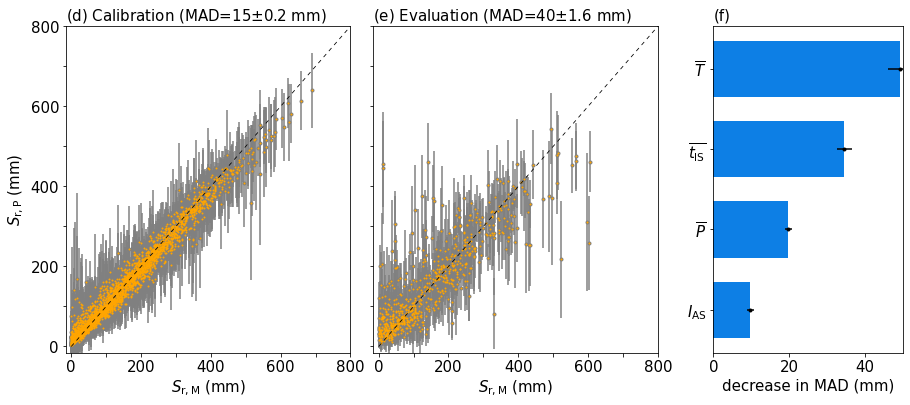

In [29]:
# scatter plots with uncertainty bars
x = np.linspace(0,800,100)
y = x
cmap_rdbu = cm.get_cmap('bwr_r', 4)
cmap_rdbu = ListedColormap([cmap_rdbu(0),cmap_rdbu(1),cmap_rdbu(2),cmap_rdbu(3)])
# cmap_rdbu = ListedColormap([cmap_rdbu(1),cmap_rdbu(0),cmap_rdbu(3),cmap_rdbu(2)])

bounds = np.linspace(0, 4, 5)
bounds2 = bounds
norm = mpl.colors.BoundaryNorm(bounds, cmap_rdbu.N)

# color catchments in scatter plot based on error and use same colors on a map
df_train['group'] = np.nan
ix2 = df_train[(df_train['Sr_p-Sr_m']<train_mae)&(df_train['Sr_p-Sr_m']>0)].index
ix1 = df_train[(df_train['Sr_p-Sr_m']>train_mae)].index
ix3 = df_train[(df_train['Sr_p-Sr_m']>-train_mae)&(df_train['Sr_p-Sr_m']<0)].index
ix4 = df_train[(df_train['Sr_p-Sr_m']<-train_mae)].index
df_train.loc[ix1,'group'] = 0
df_train.loc[ix2,'group'] = 1
df_train.loc[ix3,'group'] = 2
df_train.loc[ix4,'group'] = 3

df_test['group'] = np.nan
ix2 = df_test[(df_test['Sr_p-Sr_m']<test_mae)&(df_test['Sr_p-Sr_m']>0)].index
ix1 = df_test[(df_test['Sr_p-Sr_m']>test_mae)].index
ix3 = df_test[(df_test['Sr_p-Sr_m']>-test_mae)&(df_test['Sr_p-Sr_m']<0)].index
ix4 = df_test[(df_test['Sr_p-Sr_m']<-test_mae)].index
df_test.loc[ix1,'group'] = 0
df_test.loc[ix2,'group'] = 1
df_test.loc[ix3,'group'] = 2
df_test.loc[ix4,'group'] = 3

fig1, ax = plt.subplots(1,4, figsize=(15,6),gridspec_kw={'width_ratios': [3,3,0.1,2]})
ax[2].axis('off')
# ax[3].axis('off')
plt.subplots_adjust(wspace=0.12)
# s=ax[0].scatter(df_train.Sr_m,df_train.Sr_p,c=df_train.group,s=1.5,cmap=cmap_rdbu,norm=norm,zorder=10)
s=ax[0].scatter(df_train.Sr_m,df_train.Sr_p,c='orange',s=1,cmap=cmap_rdbu,norm=norm,zorder=10)
ax[0].errorbar(df_train.Sr_m,df_train.Sr_p, yerr=df_train['std'], fmt=".", color="grey")
ax[0].plot(x,y,color='k',linestyle=(0, (5, 5)),linewidth=0.8,zorder=11)
# ax[0].fill_between(x, y-train_mae, y+train_mae, alpha=0.25, edgecolor='k', facecolor='grey')
# ax.set_title(f'Train, MAD={train_mae} mm, $n$={n_train}',size=15)
# ax[0].text(15,750,f'MAD={train_mae} mm ',fontsize=15)#mad of this specific run
# ax[0].text(390,15,f'MAD={int(mae_train_mean)}$\pm${np.round(mae_train_std,1)} mm',fontsize=15)#mad mean and std of cv
ax[0].set_xlim(-15,800)
ax[0].set_ylim(-15,800)
ax[0].set_yticks([0,100,200,300,400,500,600,700,800])
ax[0].set_xticks([0,100,200,300,400,500,600,700,800])
ax[0].set_yticklabels([0,'',200,'',400,'',600,'',800])
ax[0].set_xticklabels([0,'',200,'',400,'',600,'',800])
ax[0].set_xlabel('$S_\mathrm{r,M}$ (mm)',size=15)
ax[0].set_ylabel('$S_\mathrm{r,P}$ (mm)',size=15)
ax[0].tick_params(axis='both', labelsize=15)
ax[0].set_title(f'(d) Calibration (MAD={int(mae_train_mean)}$\pm${np.round(mae_train_std,1)} mm)', loc='left',size=15)


# fig1 = plt.figure(figsize=(6,6))
# ax = fig1.add_subplot(132)
# ax.plot(y_test,test_y_pred,'o',color='tab:orange',markersize=1)
# s=ax[1].scatter(df_test.Sr_m,df_test.Sr_p,c=df_test.group,s=2,cmap=cmap_rdbu,norm=norm,zorder=10)
s=ax[1].scatter(df_test.Sr_m,df_test.Sr_p,c='orange',s=1,cmap=cmap_rdbu,norm=norm,zorder=10)
ax[1].plot(x,y,color='k',linestyle=(0, (5, 5)),linewidth=0.8,zorder=11)
ax[1].errorbar(df_test.Sr_m,df_test.Sr_p, yerr=df_test['std'], fmt=".", color="grey")
ax[1].set_xlim(-15,800)
ax[1].set_ylim(-15,800)
ax[1].set_yticks([0,100,200,300,400,500,600,700,800])
ax[1].set_xticks([0,100,200,300,400,500,600,700,800])
ax[1].set_yticklabels(['','','','','','','','',''])
ax[1].set_xticklabels([0,'',200,'',400,'',600,'',800])
ax[1].set_xlabel('$S_\mathrm{r,M}$ (mm)',size=15)
ax[1].tick_params(axis='both', labelsize=15)
ax[1].set_title(f'(e) Evaluation (MAD={int(mae_test_mean)}$\pm${np.round(mae_test_std,1)} mm)', loc='left',size=15)
# fig1.savefig(f'{work_dir}/output/regression/figures/interpretation/scatter_{mod}.jpg',bbox_inches='tight',dpi=300)

# feature importances
# ax = fig1.add_subplot(133)
rb = cm.get_cmap('terrain', 10)
c1,c2,c3 = rb(1),rb(3),rb(6)
ddd = ddd.sort_values(by='mean')
ax[3].barh(ddd.features2,ddd['mean'],height=0.7,color=c1)
# ax[3].barh(0,-5,height=0.7,color=ddd.colors[2],label='Climate variables')
# ax[3].barh(0,-5,height=0.7,color=ddd.colors[1],label='Vegetation variables')
# ax[3].barh(0,-5,height=0.7,color=ddd.colors[4],label='Landscape variables')
ax[3].errorbar(ddd['mean'],ddd.features2, xerr=ddd['std'], fmt=".", color="black")
ax[3].set_xlabel('decrease in MAD (mm)',size=15)
ax[3].tick_params(axis='x', labelsize=15)
ax[3].tick_params(axis='y', labelsize=15)
# ax[3].set_ylim(-0.5,20.5)
ax[3].set_xlim(0,50)
ax[3].set_title('(f)', loc='left',size=15)
# ax[3].legend(loc='lower right',fontsize=12)
# fig1.savefig(f'{work_dir}/output/regression/figures/interpretation/scatter_{mod}.jpg',bbox_inches='tight',dpi=300)


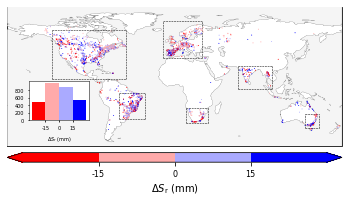

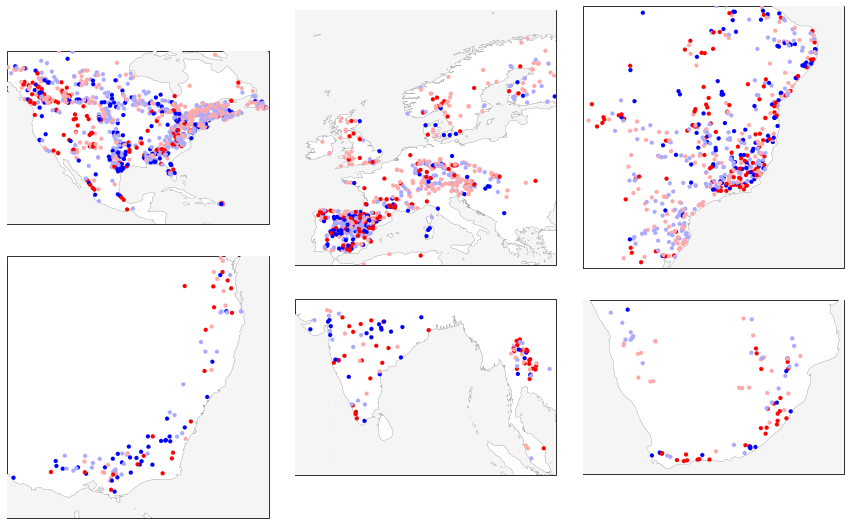

In [30]:
# TRAIN
fig2 = plt.figure(figsize=(6,6))
# plt.subplots_adjust(wspace=0000.1,hspace=-0.4)
ax = fig2.add_subplot(111,projection=ccrs.PlateCarree())
ax.coastlines(linewidth=0.1)
ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
ax.set_global()
ax.set_xlim(-180,180)
ax.set_ylim(-60,90)
s=ax.scatter(lon_train,lat_train,s=0.7,c=df_train.group,edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu,norm=norm,zorder=102)
# cbar = plt.colorbar(s, orientation='vertical',spacing='proportional',extend='both', pad=0.02,aspect=15, norm=norm,shrink=0.35)
cbar = plt.colorbar(s, orientation='horizontal',spacing='proportional',extend='both', pad=0.02,aspect=35, norm=norm)
cbar.set_label('$\Delta$$S_\mathrm{r}$ (mm)')
cbar.set_ticks([1,2,3])
cbar.set_ticklabels([f'-{train_mae}','0',f'{train_mae}'],size=8)
# for j, lab in enumerate([f'$n$={len(df_train[df_train.group==0])}',f'$n$={len(df_train[df_train.group==1])}',f'$n$={len(df_train[df_train.group==2])}',f'$n$={len(df_train[df_train.group==3])}']):
#     cbar.ax.text((j + 0.5), 0.5, lab, ha='center', va='center')
# for j, lab in enumerate([f'$n$={len(df_train[df_train.group==0])}',f'$n$={len(df_train[df_train.group==1])}',f'$n$={len(df_train[df_train.group==2])}',f'$n$={len(df_train[df_train.group==3])}']):
#     cbar.ax.text(0.5,(j + 0.5), lab, ha='center', va='center',rotation=90,size=6)
ax.plot([lon_min_a,lon_max_a],[lat_max_a,lat_max_a],'k--',zorder=101,linewidth=0.5)
ax.plot([lon_min_a,lon_max_a],[lat_min_a,lat_min_a],'k--',zorder=101,linewidth=0.5)
ax.plot([lon_min_a,lon_min_a],[lat_min_a,lat_max_a],'k--',zorder=101,linewidth=0.5)
ax.plot([lon_max_a,lon_max_a],[lat_min_a,lat_max_a],'k--',zorder=101,linewidth=0.5)

ax.plot([lon_min_e,lon_max_e],[lat_max_e,lat_max_e],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_min_e,lon_max_e],[lat_min_e,lat_min_e],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_min_e,lon_min_e],[lat_min_e,lat_max_e],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_max_e,lon_max_e],[lat_min_e,lat_max_e],'k--',linewidth=0.5,zorder=101)

ax.plot([lon_min_u,lon_max_u],[lat_max_u,lat_max_u],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_min_u,lon_max_u],[lat_min_u,lat_min_u],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_min_u,lon_min_u],[lat_min_u,lat_max_u],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_max_u,lon_max_u],[lat_min_u,lat_max_u],'k--',linewidth=0.5,zorder=101)

ax.plot([lon_min_s,lon_max_s],[lat_max_s,lat_max_s],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_min_s,lon_max_s],[lat_min_s,lat_min_s],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_min_s,lon_min_s],[lat_min_s,lat_max_s],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_max_s,lon_max_s],[lat_min_s,lat_max_s],'k--',linewidth=0.5,zorder=101)

ax.plot([lon_min_t,lon_max_t],[lat_max_t,lat_max_t],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_min_t,lon_max_t],[lat_min_t,lat_min_t],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_min_t,lon_min_t],[lat_min_t,lat_max_t],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_max_t,lon_max_t],[lat_min_t,lat_max_t],'k--',linewidth=0.5,zorder=101)

ax.plot([lon_min_f,lon_max_f],[lat_max_f,lat_max_f],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_min_f,lon_max_f],[lat_min_f,lat_min_f],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_min_f,lon_min_f],[lat_min_f,lat_max_f],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_max_f,lon_max_f],[lat_min_f,lat_max_f],'k--',linewidth=0.5,zorder=101)

iax = inset_axes(ax, width="18%", height="28%",loc=3,bbox_transform=ax.transAxes,bbox_to_anchor=(0.05,0.15,1,1))
plt.setp(list(iax.spines.values()),linewidth=0.5)
bins = [df_train['Sr_p-Sr_m'].quantile(0.01),-train_mae,0,train_mae,df_train['Sr_p-Sr_m'].quantile(0.99)]
n = [len(df_train[df_train.group==0]['Sr_p-Sr_m']),len(df_train[df_train.group==1]['Sr_p-Sr_m']),len(df_train[df_train.group==2]['Sr_p-Sr_m']),len(df_train[df_train.group==3]['Sr_p-Sr_m'])]
iax.bar([0,1,2,3],n,width=1,color=[cmap_rdbu(0),cmap_rdbu(1),cmap_rdbu(2),cmap_rdbu(3)])
iax.set_xticks([0.5,1.5,2.5])
iax.set_yticks([0,200,400,600,800])
iax.set_xticklabels([f'-{train_mae}','0',f'{train_mae}'])
iax.set_xlabel('$\Delta$$S_\mathrm{r}$ (mm)',size=5)
# iax.invert_yaxis()
# iax.yaxis.tick_right()
# iax.set_ylabel('$n$',size=6)
# iax.yaxis.set_label_position("right")
# iax.xaxis.tick_top()
iax.tick_params(axis='both',length=1.5, labelsize=5)

# ax.set_title('train abs error [sr-mm - sr-pred] (mm)')
fig2.savefig(f'{work_dir}/output/regression/figures/interpretation/train_maps_{mod}.jpg',bbox_inches='tight',dpi=300)

fig2 = plt.figure(figsize=(15,10))
ax = fig2.add_subplot(231,projection=ccrs.PlateCarree())
plt.subplots_adjust(wspace=0.1,hspace=-0.15)
ax.coastlines(linewidth=0.1)
ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
ax.set_global()
ax.set_ylim(lat_min_u,lat_max_u)
ax.set_xlim(lon_min_u,lon_max_u)
s=ax.scatter(lon_train,lat_train,s=17,c=df_train.group,edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu,norm=norm,zorder=101)

# fig2 = plt.figure(figsize=(6,6))
ax = fig2.add_subplot(232,projection=ccrs.PlateCarree())
ax.coastlines(linewidth=0.1)
ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
ax.set_global()
ax.set_ylim(lat_min_e,lat_max_e)
ax.set_xlim(lon_min_e,lon_max_e)
s=ax.scatter(lon_train,lat_train,s=17,c=df_train.group,edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu,norm=norm,zorder=101)

# fig2 = plt.figure(figsize=(6,6))
ax = fig2.add_subplot(233,projection=ccrs.PlateCarree())
ax.coastlines(linewidth=0.1)
ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
ax.set_global()
ax.set_ylim(lat_min_s,lat_max_s)
ax.set_xlim(lon_min_s,lon_max_s)
s=ax.scatter(lon_train,lat_train,s=17,c=df_train.group,edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu,norm=norm,zorder=101)

# fig2 = plt.figure(figsize=(6,6))
ax = fig2.add_subplot(234,projection=ccrs.PlateCarree())
ax.coastlines(linewidth=0.1)
ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
ax.set_global()
ax.set_ylim(lat_min_t,lat_max_t)
ax.set_xlim(lon_min_t,lon_max_t)
s=ax.scatter(lon_train,lat_train,s=17,c=df_train.group,edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu,norm=norm,zorder=101)

# fig2 = plt.figure(figsize=(6,6))
ax = fig2.add_subplot(235,projection=ccrs.PlateCarree())
ax.coastlines(linewidth=0.1)
ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
ax.set_global()
ax.set_ylim(lat_min_a,lat_max_a)
ax.set_xlim(lon_min_a,lon_max_a)
s=ax.scatter(lon_train,lat_train,s=17,c=df_train.group,edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu,norm=norm,zorder=101)

# fig2 = plt.figure(figsize=(6,6))
ax = fig2.add_subplot(236,projection=ccrs.PlateCarree())
ax.coastlines(linewidth=0.1)
ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
ax.set_global()
ax.set_ylim(lat_min_f,lat_max_f)
ax.set_xlim(lon_min_f,lon_max_f)
s=ax.scatter(lon_train,lat_train,s=17,c=df_train.group,edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu,norm=norm,zorder=101)
fig2.savefig(f'{work_dir}/output/regression/figures/interpretation/train_maps_zoomed_{mod}.jpg',bbox_inches='tight',dpi=300)

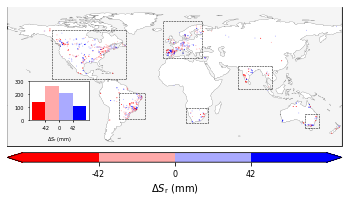

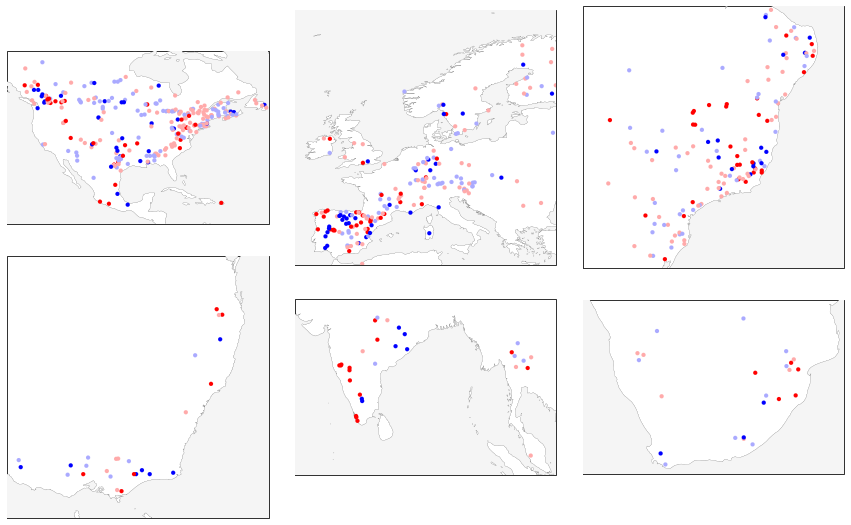

In [31]:
# TEST
fig2 = plt.figure(figsize=(6,6))
# plt.subplots_adjust(wspace=0000.1,hspace=-0.4)
ax = fig2.add_subplot(111,projection=ccrs.PlateCarree())
ax.coastlines(linewidth=0.1)
ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
ax.set_global()
ax.set_xlim(-180,180)
ax.set_ylim(-60,90)
s=ax.scatter(lon_test,lat_test,s=0.7,c=df_test.group,edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu,norm=norm,zorder=102)
# cbar = plt.colorbar(s, orientation='vertical',spacing='proportional',extend='both', pad=0.02,aspect=15, norm=norm,shrink=0.35)
cbar = plt.colorbar(s, orientation='horizontal',spacing='proportional',extend='both', pad=0.02,aspect=35, norm=norm)
cbar.set_label('$\Delta$$S_\mathrm{r}$ (mm)')
cbar.set_ticks([1,2,3])
cbar.set_ticklabels([f'-{test_mae}','0',f'{test_mae}'],size=8)
# for j, lab in enumerate([f'$n$={len(df_test[df_test.group==0])}',f'$n$={len(df_test[df_test.group==1])}',f'$n$={len(df_test[df_test.group==2])}',f'$n$={len(df_test[df_test.group==3])}']):
#     cbar.ax.text((j + 0.5), 0.5, lab, ha='center', va='center')
# for j, lab in enumerate([f'$n$={len(df_test[df_test.group==0])}',f'$n$={len(df_test[df_test.group==1])}',f'$n$={len(df_test[df_test.group==2])}',f'$n$={len(df_test[df_test.group==3])}']):
#     cbar.ax.text(0.5,(j + 0.5), lab, ha='center', va='center',rotation=90,size=6)
ax.plot([lon_min_a,lon_max_a],[lat_max_a,lat_max_a],'k--',zorder=101,linewidth=0.5)
ax.plot([lon_min_a,lon_max_a],[lat_min_a,lat_min_a],'k--',zorder=101,linewidth=0.5)
ax.plot([lon_min_a,lon_min_a],[lat_min_a,lat_max_a],'k--',zorder=101,linewidth=0.5)
ax.plot([lon_max_a,lon_max_a],[lat_min_a,lat_max_a],'k--',zorder=101,linewidth=0.5)

ax.plot([lon_min_e,lon_max_e],[lat_max_e,lat_max_e],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_min_e,lon_max_e],[lat_min_e,lat_min_e],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_min_e,lon_min_e],[lat_min_e,lat_max_e],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_max_e,lon_max_e],[lat_min_e,lat_max_e],'k--',linewidth=0.5,zorder=101)

ax.plot([lon_min_u,lon_max_u],[lat_max_u,lat_max_u],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_min_u,lon_max_u],[lat_min_u,lat_min_u],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_min_u,lon_min_u],[lat_min_u,lat_max_u],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_max_u,lon_max_u],[lat_min_u,lat_max_u],'k--',linewidth=0.5,zorder=101)

ax.plot([lon_min_s,lon_max_s],[lat_max_s,lat_max_s],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_min_s,lon_max_s],[lat_min_s,lat_min_s],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_min_s,lon_min_s],[lat_min_s,lat_max_s],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_max_s,lon_max_s],[lat_min_s,lat_max_s],'k--',linewidth=0.5,zorder=101)

ax.plot([lon_min_t,lon_max_t],[lat_max_t,lat_max_t],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_min_t,lon_max_t],[lat_min_t,lat_min_t],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_min_t,lon_min_t],[lat_min_t,lat_max_t],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_max_t,lon_max_t],[lat_min_t,lat_max_t],'k--',linewidth=0.5,zorder=101)

ax.plot([lon_min_f,lon_max_f],[lat_max_f,lat_max_f],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_min_f,lon_max_f],[lat_min_f,lat_min_f],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_min_f,lon_min_f],[lat_min_f,lat_max_f],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_max_f,lon_max_f],[lat_min_f,lat_max_f],'k--',linewidth=0.5,zorder=101)

iax = inset_axes(ax, width="18%", height="28%",loc=3,bbox_transform=ax.transAxes,bbox_to_anchor=(0.05,0.15,1,1))
plt.setp(list(iax.spines.values()),linewidth=0.5)
bins = [df_test['Sr_p-Sr_m'].quantile(0.01),-test_mae,0,test_mae,df_test['Sr_p-Sr_m'].quantile(0.99)]
n = [len(df_test[df_test.group==0]['Sr_p-Sr_m']),len(df_test[df_test.group==1]['Sr_p-Sr_m']),len(df_test[df_test.group==2]['Sr_p-Sr_m']),len(df_test[df_test.group==3]['Sr_p-Sr_m'])]
iax.bar([0,1,2,3],n,width=1,color=[cmap_rdbu(0),cmap_rdbu(1),cmap_rdbu(2),cmap_rdbu(3)])
iax.set_xticks([0.5,1.5,2.5])
iax.set_yticks([0,100,200,300])
iax.set_xticklabels([f'-{test_mae}','0',f'{test_mae}'])
iax.set_xlabel('$\Delta$$S_\mathrm{r}$ (mm)',size=5)
# iax.invert_yaxis()
# iax.yaxis.tick_right()
# iax.set_ylabel('$n$',size=6)
# iax.yaxis.set_label_position("right")
# iax.xaxis.tick_top()
iax.tick_params(axis='both',length=1.5, labelsize=5)

# ax.set_title('test abs error [sr-mm - sr-pred] (mm)')
fig2.savefig(f'{work_dir}/output/regression/figures/interpretation/test_maps_{mod}.jpg',bbox_inches='tight',dpi=300)

fig2 = plt.figure(figsize=(15,10))
ax = fig2.add_subplot(231,projection=ccrs.PlateCarree())
plt.subplots_adjust(wspace=0.1,hspace=-0.15)
ax.coastlines(linewidth=0.1)
ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
ax.set_global()
ax.set_ylim(lat_min_u,lat_max_u)
ax.set_xlim(lon_min_u,lon_max_u)
s=ax.scatter(lon_test,lat_test,s=17,c=df_test.group,edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu,norm=norm,zorder=101)

# fig2 = plt.figure(figsize=(6,6))
ax = fig2.add_subplot(232,projection=ccrs.PlateCarree())
ax.coastlines(linewidth=0.1)
ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
ax.set_global()
ax.set_ylim(lat_min_e,lat_max_e)
ax.set_xlim(lon_min_e,lon_max_e)
s=ax.scatter(lon_test,lat_test,s=17,c=df_test.group,edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu,norm=norm,zorder=101)

# fig2 = plt.figure(figsize=(6,6))
ax = fig2.add_subplot(233,projection=ccrs.PlateCarree())
ax.coastlines(linewidth=0.1)
ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
ax.set_global()
ax.set_ylim(lat_min_s,lat_max_s)
ax.set_xlim(lon_min_s,lon_max_s)
s=ax.scatter(lon_test,lat_test,s=17,c=df_test.group,edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu,norm=norm,zorder=101)

# fig2 = plt.figure(figsize=(6,6))
ax = fig2.add_subplot(234,projection=ccrs.PlateCarree())
ax.coastlines(linewidth=0.1)
ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
ax.set_global()
ax.set_ylim(lat_min_t,lat_max_t)
ax.set_xlim(lon_min_t,lon_max_t)
s=ax.scatter(lon_test,lat_test,s=17,c=df_test.group,edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu,norm=norm,zorder=101)

# fig2 = plt.figure(figsize=(6,6))
ax = fig2.add_subplot(235,projection=ccrs.PlateCarree())
ax.coastlines(linewidth=0.1)
ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
ax.set_global()
ax.set_ylim(lat_min_a,lat_max_a)
ax.set_xlim(lon_min_a,lon_max_a)
s=ax.scatter(lon_test,lat_test,s=17,c=df_test.group,edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu,norm=norm,zorder=101)

# fig2 = plt.figure(figsize=(6,6))
ax = fig2.add_subplot(236,projection=ccrs.PlateCarree())
ax.coastlines(linewidth=0.1)
ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
ax.set_global()
ax.set_ylim(lat_min_f,lat_max_f)
ax.set_xlim(lon_min_f,lon_max_f)
s=ax.scatter(lon_test,lat_test,s=17,c=df_test.group,edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu,norm=norm,zorder=101)
fig2.savefig(f'{work_dir}/output/regression/figures/interpretation/test_maps_zoomed_{mod}.jpg',bbox_inches='tight',dpi=300)


In [32]:
# combine all cv's train and test results
test_dfs=[]
train_dfs=[]
for i in range(5):
    train_ix = cv_train_ix[i]
    test_ix = cv_test_ix[i]

    # X_train, X_test, y_train, y_test = train_test_split(dfx, dfy.reshape(-1, 1).ravel(), test_size=0.3, random_state=42)
    X_train = dfx[train_ix]
    y_train = dfy[train_ix]
    X_test = dfx[test_ix]
    y_test = dfy[test_ix]

    # save lat lon columns
    lat_train = X_train[:,-3]
    lon_train = X_train[:,-2]
    lat_test = X_test[:,-3]
    lon_test = X_test[:,-2]
    catch_id_train = X_train[:,-1]
    catch_id_test = X_test[:,-1]
    # remove lat lon columns
    X_train = np.delete(X_train,-1,1)
    X_train = np.delete(X_train,-1,1)
    X_train = np.delete(X_train,-1,1)
    X_test = np.delete(X_test,-1,1)
    X_test = np.delete(X_test,-1,1)
    X_test = np.delete(X_test,-1,1)

    rf = RandomForestRegressor(criterion='absolute_error',random_state=42,min_samples_leaf=min_samples_leaf,max_depth=max_depth)
    # rf = RandomForestRegressor(criterion='squared_error',random_state=42,min_samples_leaf=min_samples_leaf,max_depth=max_depth,oob_score=True)
    rf = rf.fit(X_train, y_train)
    train_y_pred = rf.predict(X_train)
    test_y_pred = rf.predict(X_test)
    individual_tree_predictions = np.array([tree.predict(X_test) for tree in rf.estimators_]).T
    std_test = np.std(individual_tree_predictions,axis=1)
    individual_tree_predictions = np.array([tree.predict(X_train) for tree in rf.estimators_]).T
    std_train = np.std(individual_tree_predictions,axis=1)

    df_train = pd.DataFrame(index=catch_id_train,columns=['lat','lon','Sr_m','Sr_p','Sr_p-Sr_m','(Sr_p-Sr_m)/Sr_m','std'])
    df_train['lat'] = lat_train
    df_train['lon'] = lon_train
    df_train['Sr_m'] = y_train
    df_train['Sr_p'] = train_y_pred
    df_train['Sr_p-Sr_m'] = train_y_pred - y_train
    df_train['(Sr_p-Sr_m)/Sr_m'] = (train_y_pred - y_train)/train_y_pred
    df_train['std'] = std_train
    train_dfs.append(df_train)

    df_test = pd.DataFrame(index=catch_id_test,columns=['lat','lon','Sr_m','Sr_p','Sr_p-Sr_m','(Sr_p-Sr_m)/Sr_m','std'])
    df_test['lat'] = lat_test
    df_test['lon'] = lon_test
    df_test['Sr_m'] = y_test
    df_test['Sr_p'] = test_y_pred
    df_test['Sr_p-Sr_m'] = test_y_pred - y_test
    df_test['(Sr_p-Sr_m)/Sr_m'] = (test_y_pred - y_test)/test_y_pred
    df_test['std'] = std_test
    test_dfs.append(df_test)

test_dfs = pd.concat(test_dfs)
train_dfs = pd.concat(train_dfs)

# color catchments in scatter plot based on error and use same colors on a map
train_dfs['group'] = np.nan
ix2 = train_dfs[(train_dfs['Sr_p-Sr_m']<mae_train_mean)&(train_dfs['Sr_p-Sr_m']>0)].index
ix1 = train_dfs[(train_dfs['Sr_p-Sr_m']>mae_train_mean)].index
ix3 = train_dfs[(train_dfs['Sr_p-Sr_m']>-mae_train_mean)&(train_dfs['Sr_p-Sr_m']<0)].index
ix4 = train_dfs[(train_dfs['Sr_p-Sr_m']<-mae_train_mean)].index
train_dfs.loc[ix1,'group'] = 0
train_dfs.loc[ix2,'group'] = 1
train_dfs.loc[ix3,'group'] = 2
train_dfs.loc[ix4,'group'] = 3

test_dfs['group'] = np.nan
ix2 = test_dfs[(test_dfs['Sr_p-Sr_m']<mae_test_mean)&(test_dfs['Sr_p-Sr_m']>0)].index
ix1 = test_dfs[(test_dfs['Sr_p-Sr_m']>mae_test_mean)].index
ix3 = test_dfs[(test_dfs['Sr_p-Sr_m']>-mae_test_mean)&(test_dfs['Sr_p-Sr_m']<0)].index
ix4 = test_dfs[(test_dfs['Sr_p-Sr_m']<-mae_test_mean)].index
test_dfs.loc[ix1,'group'] = 0
test_dfs.loc[ix2,'group'] = 1
test_dfs.loc[ix3,'group'] = 2
test_dfs.loc[ix4,'group'] = 3

test_dfs.to_csv(f'{work_dir}/output/regression/rf_results_{mod}_combined_test.csv')

In [33]:
def cmap_map(function, cmap):
    """ Applies function (which should operate on vectors of shape 3: [r, g, b]), on colormap cmap.
    This routine will break any discontinuous points in a colormap.
    """
    cdict = cmap._segmentdata
    step_dict = {}
    # Firt get the list of points where the segments start or end
    for key in ('red', 'green', 'blue'):
        step_dict[key] = list(map(lambda x: x[0], cdict[key]))
    step_list = sum(step_dict.values(), [])
    step_list = np.array(list(set(step_list)))
    # Then compute the LUT, and apply the function to the LUT
    reduced_cmap = lambda step : np.array(cmap(step)[0:3])
    old_LUT = np.array(list(map(reduced_cmap, step_list)))
    new_LUT = np.array(list(map(function, old_LUT)))
    # Now try to make a minimal segment definition of the new LUT
    cdict = {}
    for i, key in enumerate(['red','green','blue']):
        this_cdict = {}
        for j, step in enumerate(step_list):
            if step in step_dict[key]:
                this_cdict[step] = new_LUT[j, i]
            elif new_LUT[j,i] != old_LUT[j, i]:
                this_cdict[step] = new_LUT[j, i]
        colorvector = list(map(lambda x: x + (x[1], ), this_cdict.items()))
        colorvector.sort()
        cdict[key] = colorvector

    return matplotlib.colors.LinearSegmentedColormap('colormap',cdict,1024)

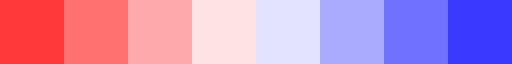

In [34]:
import matplotlib
cmap = cm.get_cmap('bwr_r', 10)
color_list = [matplotlib.colors.rgb2hex(cmap(i)[:3]) for i in range(cmap.N)]
cmap_rdbu = ListedColormap(color_list[1:-1])
cmap_rdbu.set_over(color_list[-1])
cmap_rdbu.set_under(color_list[0])
cmap_rdbu

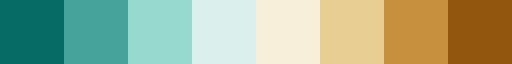

In [35]:
import matplotlib
cmap = cm.get_cmap('BrBG_r', 10)
color_list = [matplotlib.colors.rgb2hex(cmap(i)[:3]) for i in range(cmap.N)]
cmap_rdbu = ListedColormap(color_list[1:-1])
cmap_rdbu.set_over(color_list[-1])
cmap_rdbu.set_under(color_list[0])
cmap_rdbu

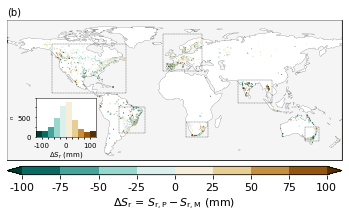

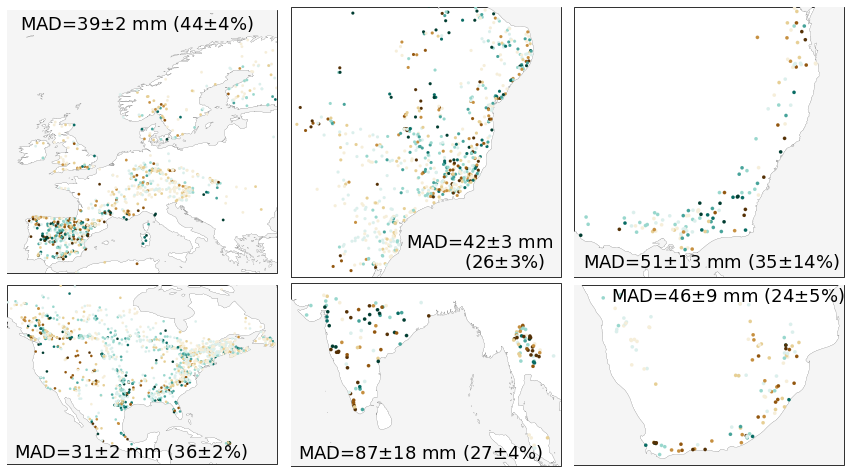

In [36]:
# all test results from cross validation on map - ABSDIFF
cmap_rdbu1 = cm.get_cmap('BrBG_r',10)
bounds = np.linspace(-100,100,9)
bounds2 = bounds
norm = mpl.colors.BoundaryNorm(bounds, cmap_rdbu.N)

x=test_dfs['lat'].astype(float)
y=test_dfs['lon'].astype(float)
kde = gaussian_kde(np.vstack([x, y]))
density1 = kde(np.vstack([x, y]))*1000
density2 = (np.clip(density1, 0.06, 0.23))
test_dfs['density'] = 1/(density2*10)

# test_dfs1 = test_dfs[(test_dfs['Sr_p-Sr_m']<25)&(test_dfs['Sr_p-Sr_m']>-25)]
# test_dfs2 = test_dfs[((test_dfs['Sr_p-Sr_m']>25)&(test_dfs['Sr_p-Sr_m']<50))|((test_dfs['Sr_p-Sr_m']<-25)&(test_dfs['Sr_p-Sr_m']>-50))]
# test_dfs3 = test_dfs[((test_dfs['Sr_p-Sr_m']>50)&(test_dfs['Sr_p-Sr_m']<75))|((test_dfs['Sr_p-Sr_m']<-50)&(test_dfs['Sr_p-Sr_m']>-75))]
# test_dfs4 = test_dfs[((test_dfs['Sr_p-Sr_m']>75))|((test_dfs['Sr_p-Sr_m']<-75))]

# test_dfs1_e = test_dfs1[(test_dfs['lat']<lat_max_e)&(test_dfs['lat']>lat_min_e)&(test_dfs['lon']<lon_max_e)&(test_dfs['lon']>lon_min_e)]
# test_dfs2_e = test_dfs2[(test_dfs['lat']<lat_max_e)&(test_dfs['lat']>lat_min_e)&(test_dfs['lon']<lon_max_e)&(test_dfs['lon']>lon_min_e)]
# test_dfs3_e = test_dfs3[(test_dfs['lat']<lat_max_e)&(test_dfs['lat']>lat_min_e)&(test_dfs['lon']<lon_max_e)&(test_dfs['lon']>lon_min_e)]
# test_dfs4_e = test_dfs4[(test_dfs['lat']<lat_max_e)&(test_dfs['lat']>lat_min_e)&(test_dfs['lon']<lon_max_e)&(test_dfs['lon']>lon_min_e)]

fig2 = plt.figure(figsize=(6,6))
# plt.subplots_adjust(wspace=0000.1,hspace=-0.4)
ax = fig2.add_subplot(111,projection=ccrs.PlateCarree())
ax.coastlines(linewidth=0.1)
ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
ax.set_global()
ax.set_xlim(-180,180)
ax.set_ylim(-60,90)
s=ax.scatter(test_dfs.lon,test_dfs.lat,s=0.4*test_dfs['density'],c=test_dfs['Sr_p-Sr_m'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu,norm=norm,zorder=105)
# s=ax.scatter(test_dfs1.lon,test_dfs1.lat,s=0.4*test_dfs1['density'],c=test_dfs1['Sr_p-Sr_m'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu,norm=norm,zorder=105)
# s=ax.scatter(test_dfs2.lon,test_dfs2.lat,s=0.4*test_dfs2['density'],c=test_dfs2['Sr_p-Sr_m'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu,norm=norm,zorder=104)
# s=ax.scatter(test_dfs3.lon,test_dfs3.lat,s=0.4*test_dfs3['density'],c=test_dfs3['Sr_p-Sr_m'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu,norm=norm,zorder=103)
# s=ax.scatter(test_dfs4.lon,test_dfs4.lat,s=0.4*test_dfs4['density'],c=test_dfs4['Sr_p-Sr_m'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu,norm=norm,zorder=102)
# cbar = plt.colorbar(s, orientation='vertical',spacing='proportional',extend='both', pad=0.02,aspect=15, norm=norm,shrink=0.35)
cbar = plt.colorbar(s, orientation='horizontal',spacing='proportional',extend='both', pad=0.02,aspect=40,norm=norm)
cbar.set_label('$\Delta$$S_\mathrm{r}$ = $S_\mathrm{r,P}-S_\mathrm{r,M}$ (mm)',size=11)
cbar.set_ticklabels(['-100','-75','-50','-25','0','25','50','75','100'],size=11)
ax.set_title('(b)',size=10,loc='left')
# cbar.set_ticks([1,2,3])
# cbar.set_ticklabels([f'-{int(mae_test_mean)}','0',f'{int(mae_test_mean)}'],size=7)

ax.plot([lon_min_a,lon_max_a],[lat_max_a,lat_max_a],'k--',zorder=101,linewidth=0.3)
ax.plot([lon_min_a,lon_max_a],[lat_min_a,lat_min_a],'k--',zorder=101,linewidth=0.3)
ax.plot([lon_min_a,lon_min_a],[lat_min_a,lat_max_a],'k--',zorder=101,linewidth=0.3)
ax.plot([lon_max_a,lon_max_a],[lat_min_a,lat_max_a],'k--',zorder=101,linewidth=0.3)

ax.plot([lon_min_e,lon_max_e],[lat_max_e,lat_max_e],'k--',linewidth=0.3,zorder=101)
ax.plot([lon_min_e,lon_max_e],[lat_min_e,lat_min_e],'k--',linewidth=0.3,zorder=101)
ax.plot([lon_min_e,lon_min_e],[lat_min_e,lat_max_e],'k--',linewidth=0.3,zorder=101)
ax.plot([lon_max_e,lon_max_e],[lat_min_e,lat_max_e],'k--',linewidth=0.3,zorder=101)

ax.plot([lon_min_u,lon_max_u],[lat_max_u,lat_max_u],'k--',linewidth=0.3,zorder=101)
ax.plot([lon_min_u,lon_max_u],[lat_min_u,lat_min_u],'k--',linewidth=0.3,zorder=101)
ax.plot([lon_min_u,lon_min_u],[lat_min_u,lat_max_u],'k--',linewidth=0.3,zorder=101)
ax.plot([lon_max_u,lon_max_u],[lat_min_u,lat_max_u],'k--',linewidth=0.3,zorder=101)

ax.plot([lon_min_s,lon_max_s],[lat_max_s,lat_max_s],'k--',linewidth=0.3,zorder=101)
ax.plot([lon_min_s,lon_max_s],[lat_min_s,lat_min_s],'k--',linewidth=0.3,zorder=101)
ax.plot([lon_min_s,lon_min_s],[lat_min_s,lat_max_s],'k--',linewidth=0.3,zorder=101)
ax.plot([lon_max_s,lon_max_s],[lat_min_s,lat_max_s],'k--',linewidth=0.3,zorder=101)

ax.plot([lon_min_t,lon_max_t],[lat_max_t,lat_max_t],'k--',linewidth=0.3,zorder=101)
ax.plot([lon_min_t,lon_max_t],[lat_min_t,lat_min_t],'k--',linewidth=0.3,zorder=101)
ax.plot([lon_min_t,lon_min_t],[lat_min_t,lat_max_t],'k--',linewidth=0.3,zorder=101)
ax.plot([lon_max_t,lon_max_t],[lat_min_t,lat_max_t],'k--',linewidth=0.3,zorder=101)

ax.plot([lon_min_f,lon_max_f],[lat_max_f,lat_max_f],'k--',linewidth=0.3,zorder=101)
ax.plot([lon_min_f,lon_max_f],[lat_min_f,lat_min_f],'k--',linewidth=0.3,zorder=101)
ax.plot([lon_min_f,lon_min_f],[lat_min_f,lat_max_f],'k--',linewidth=0.3,zorder=101)
ax.plot([lon_max_f,lon_max_f],[lat_min_f,lat_max_f],'k--',linewidth=0.3,zorder=101)

iax = inset_axes(ax, width="18%", height="28%",loc=3,bbox_transform=ax.transAxes,bbox_to_anchor=(0.07,0.13,1,1))
n0=len(test_dfs[test_dfs['Sr_p-Sr_m']<bounds[0]])
n1=len(test_dfs[(test_dfs['Sr_p-Sr_m']<bounds[1])&(test_dfs['Sr_p-Sr_m']>bounds[0])])
n2=len(test_dfs[(test_dfs['Sr_p-Sr_m']<bounds[2])&(test_dfs['Sr_p-Sr_m']>bounds[1])])
n3=len(test_dfs[(test_dfs['Sr_p-Sr_m']<bounds[3])&(test_dfs['Sr_p-Sr_m']>bounds[2])])
n4=len(test_dfs[(test_dfs['Sr_p-Sr_m']<bounds[4])&(test_dfs['Sr_p-Sr_m']>bounds[3])])
n5=len(test_dfs[(test_dfs['Sr_p-Sr_m']<bounds[5])&(test_dfs['Sr_p-Sr_m']>bounds[4])])
n6=len(test_dfs[(test_dfs['Sr_p-Sr_m']<bounds[6])&(test_dfs['Sr_p-Sr_m']>bounds[5])])
n7=len(test_dfs[(test_dfs['Sr_p-Sr_m']<bounds[7])&(test_dfs['Sr_p-Sr_m']>bounds[6])])
n8=len(test_dfs[(test_dfs['Sr_p-Sr_m']<bounds[8])&(test_dfs['Sr_p-Sr_m']>bounds[7])])
n9=len(test_dfs[(test_dfs['Sr_p-Sr_m']>bounds[8])])
n = [n0,n1,n2,n3,n4,n5,n6,n7,n8,n9]
plt.setp(list(iax.spines.values()),linewidth=0.5)
bins=bounds
iax.bar([0,1,2,3,4,5,6,7,8,9],n,width=1,color=[cmap_rdbu1(0),cmap_rdbu1(1),cmap_rdbu1(2),cmap_rdbu1(3),cmap_rdbu1(4),cmap_rdbu1(5),cmap_rdbu1(6),cmap_rdbu1(7),cmap_rdbu1(8),cmap_rdbu1(9)])
iax.set_xticks([0.5,1.5,2.5,3.5,4.5,5.5,6.5,7.5,8.5])
iax.set_yticks([0,250,500,750,1000])
iax.set_yticklabels(['0','','500','',''])
iax.set_xticklabels(['-100','','','','0','','','','100'])
iax.set_xlim(-0.5,9.5)
iax.set_xlabel('$\Delta$$S_\mathrm{r}$ (mm)',size=7, labelpad=1)
iax.set_ylabel('$n$',size=5,labelpad=1)
iax.tick_params(axis='both',length=1.5, labelsize=7)

fig2.savefig(f'{work_dir}/output/regression/figures/interpretation/test_maps2_{mod}.jpg',bbox_inches='tight',dpi=900)

fig2 = plt.figure(figsize=(15,10))
ax = fig2.add_subplot(231,projection=ccrs.PlateCarree())
plt.subplots_adjust(wspace=0.05,hspace=-0.25)
ax.coastlines(linewidth=0.1)
ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
ax.set_global()
ax.set_ylim(lat_min_e,lat_max_e)
ax.set_xlim(lon_min_e,lon_max_e)
# ax.text(lon_min_e+2,lat_max_e-3,f'MAD={int(dfrrt.mad_europe[0])}$\pm${np.round(dfrrt.mad_europe[1],1)} mm',size=16,zorder=101)
ax.text(lon_min_e+2,lat_max_e-3,f'MAD={int(dfrrt.mad_europe[0])}$\pm${int(np.round(dfrrt.mad_europe[1],0))} mm ({int(dfrrt_rel.mad_europe[0])}$\pm${int(np.round(dfrrt_rel.mad_europe[1],0))}%)',size=18,zorder=106)
# s=ax.scatter(test_dfs1.lon,test_dfs1.lat,s=7,c=test_dfs1['Sr_p-Sr_m'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu,norm=norm,zorder=105)
# s=ax.scatter(test_dfs2.lon,test_dfs2.lat,s=7,c=test_dfs2['Sr_p-Sr_m'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu,norm=norm,zorder=104)
# s=ax.scatter(test_dfs3.lon,test_dfs3.lat,s=7,c=test_dfs3['Sr_p-Sr_m'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu,norm=norm,zorder=103)
# s=ax.scatter(test_dfs4.lon,test_dfs4.lat,s=7,c=test_dfs4['Sr_p-Sr_m'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu,norm=norm,zorder=102)
s=ax.scatter(test_dfs.lon,test_dfs.lat,s=7,c=test_dfs['Sr_p-Sr_m'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu,norm=norm,zorder=102)


ax = fig2.add_subplot(232,projection=ccrs.PlateCarree())
ax.coastlines(linewidth=0.1)
ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
ax.set_global()
ax.set_ylim(lat_min_s,lat_max_s)
ax.set_xlim(lon_min_s,lon_max_s)
# ax.text(lon_max_s-16,lat_min_s+1,f'MAD={int(dfrrt.mad_southamerica[0])}$\pm${np.round(dfrrt.mad_southamerica[1],1)} mm',size=16,zorder=101)
# ax.text(lon_max_s-26,lat_min_s+1,f'MAD={int(dfrrt.mad_southamerica[0])}$\pm${int(np.round(dfrrt.mad_southamerica[1],0))} mm ({int(dfrrt_rel.mad_southamerica[0])}$\pm${int(np.round(dfrrt_rel.mad_southamerica[1],0))}%)',size=16,zorder=106)
ax.text(lon_max_s-16,lat_min_s+3,f'MAD={int(dfrrt.mad_southamerica[0])}$\pm${int(np.round(dfrrt.mad_southamerica[1],0))} mm',size=18,zorder=106) 
ax.text(lon_max_s-10,lat_min_s+1,f'({int(dfrrt_rel.mad_southamerica[0])}$\pm${int(np.round(dfrrt_rel.mad_southamerica[1],0))}%)',size=18,zorder=106)
s=ax.scatter(test_dfs.lon,test_dfs.lat,s=9,c=test_dfs['Sr_p-Sr_m'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu,norm=norm,zorder=102)
# s=ax.scatter(test_dfs1.lon,test_dfs1.lat,s=9,c=test_dfs1['Sr_p-Sr_m'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu,norm=norm,zorder=105)
# s=ax.scatter(test_dfs2.lon,test_dfs2.lat,s=9,c=test_dfs2['Sr_p-Sr_m'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu,norm=norm,zorder=104)
# s=ax.scatter(test_dfs3.lon,test_dfs3.lat,s=9,c=test_dfs3['Sr_p-Sr_m'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu,norm=norm,zorder=103)
# s=ax.scatter(test_dfs4.lon,test_dfs4.lat,s=9,c=test_dfs4['Sr_p-Sr_m'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu,norm=norm,zorder=102)

ax = fig2.add_subplot(233,projection=ccrs.PlateCarree())
ax.coastlines(linewidth=0.1)
ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
ax.set_global()
ax.set_ylim(lat_min_t,lat_max_t)
ax.set_xlim(lon_min_t,lon_max_t)
# ax.text(lon_min_t+0.5,lat_max_t-1,f'MAD={int(dfrrt.mad_australia[0])}$\pm${np.round(dfrrt.mad_australia[1],1)} mm',size=16,zorder=101)
ax.text(lon_min_t+0.5,lat_min_t+0.5,f'MAD={int(dfrrt.mad_australia[0])}$\pm${int(np.round(dfrrt.mad_australia[1],0))} mm ({int(dfrrt_rel.mad_australia[0])}$\pm${int(np.round(dfrrt_rel.mad_australia[1],0))}%)',size=18,zorder=106)
# s=ax.scatter(test_dfs1.lon,test_dfs1.lat,s=12,c=test_dfs1['Sr_p-Sr_m'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu,norm=norm,zorder=105)
# s=ax.scatter(test_dfs2.lon,test_dfs2.lat,s=12,c=test_dfs2['Sr_p-Sr_m'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu,norm=norm,zorder=104)
# s=ax.scatter(test_dfs3.lon,test_dfs3.lat,s=12,c=test_dfs3['Sr_p-Sr_m'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu,norm=norm,zorder=103)
# s=ax.scatter(test_dfs4.lon,test_dfs4.lat,s=12,c=test_dfs4['Sr_p-Sr_m'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu,norm=norm,zorder=102)
s=ax.scatter(test_dfs.lon,test_dfs.lat,s=12,c=test_dfs['Sr_p-Sr_m'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu,norm=norm,zorder=102)

ax = fig2.add_subplot(234,projection=ccrs.PlateCarree())
ax.coastlines(linewidth=0.1)
ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
ax.set_global()
ax.set_ylim(lat_min_u,lat_max_u)
ax.set_xlim(lon_min_u,lon_max_u)
# ax.text(lon_min_u+2,lat_min_u+2,f'MAD={int(dfrrt.mad_northamerica[0])}$\pm${np.round(dfrrt.mad_northamerica[1],1)} mm',size=16,zorder=101)
ax.text(lon_min_u+2,lat_min_u+2,f'MAD={int(dfrrt.mad_northamerica[0])}$\pm${int(np.round(dfrrt.mad_northamerica[1],0))} mm ({int(dfrrt_rel.mad_northamerica[0])}$\pm${int(np.round(dfrrt_rel.mad_northamerica[1],0))}%)',size=18,zorder=106)
# s=ax.scatter(test_dfs1.lon,test_dfs1.lat,s=6,c=test_dfs1['Sr_p-Sr_m'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu,norm=norm,zorder=105)
# s=ax.scatter(test_dfs2.lon,test_dfs2.lat,s=6,c=test_dfs2['Sr_p-Sr_m'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu,norm=norm,zorder=104)
# s=ax.scatter(test_dfs3.lon,test_dfs3.lat,s=6,c=test_dfs3['Sr_p-Sr_m'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu,norm=norm,zorder=103)
# s=ax.scatter(test_dfs4.lon,test_dfs4.lat,s=6,c=test_dfs4['Sr_p-Sr_m'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu,norm=norm,zorder=102)
s=ax.scatter(test_dfs.lon,test_dfs.lat,s=6,c=test_dfs['Sr_p-Sr_m'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu,norm=norm,zorder=102)

ax = fig2.add_subplot(235,projection=ccrs.PlateCarree())
ax.coastlines(linewidth=0.1)
ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
ax.set_global()
ax.set_ylim(lat_min_a,lat_max_a)
ax.set_xlim(lon_min_a,lon_max_a)
# ax.text(lon_min_a+1,lat_min_a+1,f'MAD={int(dfrrt.mad_asia[0])}$\pm${np.round(dfrrt.mad_asia[1],1)} mm',size=16,zorder=101)
ax.text(lon_min_a+1,lat_min_a+1,f'MAD={int(dfrrt.mad_asia[0])}$\pm${int(np.round(dfrrt.mad_asia[1],0))} mm ({int(dfrrt_rel.mad_asia[0])}$\pm${int(np.round(dfrrt_rel.mad_asia[1],0))}%)',size=18,zorder=106)
# s=ax.scatter(test_dfs1.lon,test_dfs1.lat,s=12,c=test_dfs1['Sr_p-Sr_m'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu,norm=norm,zorder=105)
# s=ax.scatter(test_dfs2.lon,test_dfs2.lat,s=12,c=test_dfs2['Sr_p-Sr_m'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu,norm=norm,zorder=104)
# s=ax.scatter(test_dfs3.lon,test_dfs3.lat,s=12,c=test_dfs3['Sr_p-Sr_m'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu,norm=norm,zorder=103)
# s=ax.scatter(test_dfs4.lon,test_dfs4.lat,s=12,c=test_dfs4['Sr_p-Sr_m'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu,norm=norm,zorder=102)
s=ax.scatter(test_dfs.lon,test_dfs.lat,s=12,c=test_dfs['Sr_p-Sr_m'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu,norm=norm,zorder=102)

ax = fig2.add_subplot(236,projection=ccrs.PlateCarree())
ax.coastlines(linewidth=0.1)
ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
ax.set_global()
ax.set_ylim(lat_min_f,lat_max_f)
ax.set_xlim(lon_min_f,lon_max_f)
# ax.text(lon_max_f-14,lat_max_f-1.5,f'MAD={int(dfrrt.mad_southafrica[0])}$\pm${np.round(dfrrt.mad_southafrica[1],1)} mm',size=16,zorder=101)
ax.text(lon_max_f-20.7,lat_max_f-1.5,f'MAD={int(dfrrt.mad_southafrica[0])}$\pm${int(np.round(dfrrt.mad_southafrica[1],0))} mm ({int(dfrrt_rel.mad_southafrica[0])}$\pm${int(np.round(dfrrt_rel.mad_southafrica[1],0))}%)',size=18,zorder=106)
# s=ax.scatter(test_dfs1.lon,test_dfs1.lat,s=12,c=test_dfs1['Sr_p-Sr_m'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu,norm=norm,zorder=105)
# s=ax.scatter(test_dfs2.lon,test_dfs2.lat,s=12,c=test_dfs2['Sr_p-Sr_m'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu,norm=norm,zorder=104)
# s=ax.scatter(test_dfs3.lon,test_dfs3.lat,s=12,c=test_dfs3['Sr_p-Sr_m'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu,norm=norm,zorder=103)
# s=ax.scatter(test_dfs4.lon,test_dfs4.lat,s=12,c=test_dfs4['Sr_p-Sr_m'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu,norm=norm,zorder=102)
s=ax.scatter(test_dfs.lon,test_dfs.lat,s=12,c=test_dfs['Sr_p-Sr_m'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu,norm=norm,zorder=102)

fig2.savefig(f'{work_dir}/output/regression/figures/interpretation/test_maps_zoomed2_{mod}.jpg',bbox_inches='tight',dpi=600)


In [37]:
#Europe
lat_min_e, lat_max_e = 35,62 # 36,46 only spain cluster
lon_min_e, lon_max_e = -12,29 # -10,5 only spain cluster

#Asia
lat_min_a, lat_max_a = 1,26
lon_min_a, lon_max_a = 68,105

#us
lat_min_u, lat_max_u = 12,65
lon_min_u, lon_max_u = -132,-52

#south america
lat_min_s, lat_max_s = -31,-3
lon_min_s, lon_max_s = -60,-32

#south africa
lat_min_f, lat_max_f = -35.3,-19.3
lon_min_f, lon_max_f = 12,36

#australia
lat_min_t, lat_max_t = -40,-25
lon_min_t, lon_max_t = 140,155

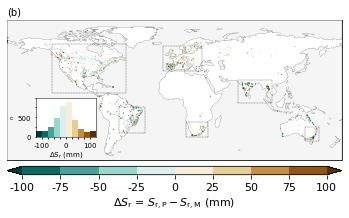

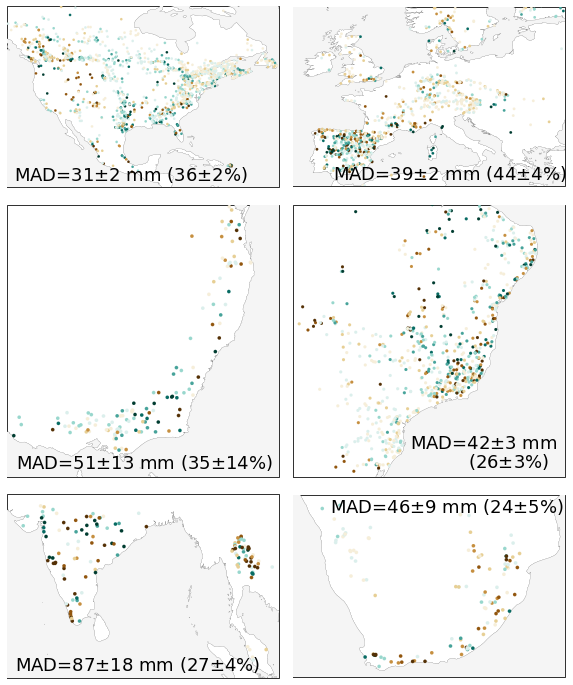

In [38]:
# all test results from cross validation on map - ABSDIFF
cmap_rdbu1 = cm.get_cmap('BrBG_r',10)
bounds = np.linspace(-100,100,9)
bounds2 = bounds
norm = mpl.colors.BoundaryNorm(bounds, cmap_rdbu.N)

x=test_dfs['lat'].astype(float)
y=test_dfs['lon'].astype(float)
kde = gaussian_kde(np.vstack([x, y]))
density1 = kde(np.vstack([x, y]))*1000
density2 = (np.clip(density1, 0.06, 0.23))
test_dfs['density'] = 1/(density2*10)

# test_dfs1 = test_dfs[(test_dfs['Sr_p-Sr_m']<25)&(test_dfs['Sr_p-Sr_m']>-25)]
# test_dfs2 = test_dfs[((test_dfs['Sr_p-Sr_m']>25)&(test_dfs['Sr_p-Sr_m']<50))|((test_dfs['Sr_p-Sr_m']<-25)&(test_dfs['Sr_p-Sr_m']>-50))]
# test_dfs3 = test_dfs[((test_dfs['Sr_p-Sr_m']>50)&(test_dfs['Sr_p-Sr_m']<75))|((test_dfs['Sr_p-Sr_m']<-50)&(test_dfs['Sr_p-Sr_m']>-75))]
# test_dfs4 = test_dfs[((test_dfs['Sr_p-Sr_m']>75))|((test_dfs['Sr_p-Sr_m']<-75))]

# test_dfs1_e = test_dfs1[(test_dfs['lat']<lat_max_e)&(test_dfs['lat']>lat_min_e)&(test_dfs['lon']<lon_max_e)&(test_dfs['lon']>lon_min_e)]
# test_dfs2_e = test_dfs2[(test_dfs['lat']<lat_max_e)&(test_dfs['lat']>lat_min_e)&(test_dfs['lon']<lon_max_e)&(test_dfs['lon']>lon_min_e)]
# test_dfs3_e = test_dfs3[(test_dfs['lat']<lat_max_e)&(test_dfs['lat']>lat_min_e)&(test_dfs['lon']<lon_max_e)&(test_dfs['lon']>lon_min_e)]
# test_dfs4_e = test_dfs4[(test_dfs['lat']<lat_max_e)&(test_dfs['lat']>lat_min_e)&(test_dfs['lon']<lon_max_e)&(test_dfs['lon']>lon_min_e)]

fig2 = plt.figure(figsize=(6,6))
# plt.subplots_adjust(wspace=0000.1,hspace=-0.4)
ax = fig2.add_subplot(111,projection=ccrs.PlateCarree())
ax.coastlines(linewidth=0.1)
ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
ax.set_global()
ax.set_xlim(-180,180)
ax.set_ylim(-60,90)
s=ax.scatter(test_dfs.lon,test_dfs.lat,s=0.4*test_dfs['density'],c=test_dfs['Sr_p-Sr_m'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu,norm=norm,zorder=105)
# s=ax.scatter(test_dfs1.lon,test_dfs1.lat,s=0.4*test_dfs1['density'],c=test_dfs1['Sr_p-Sr_m'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu,norm=norm,zorder=105)
# s=ax.scatter(test_dfs2.lon,test_dfs2.lat,s=0.4*test_dfs2['density'],c=test_dfs2['Sr_p-Sr_m'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu,norm=norm,zorder=104)
# s=ax.scatter(test_dfs3.lon,test_dfs3.lat,s=0.4*test_dfs3['density'],c=test_dfs3['Sr_p-Sr_m'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu,norm=norm,zorder=103)
# s=ax.scatter(test_dfs4.lon,test_dfs4.lat,s=0.4*test_dfs4['density'],c=test_dfs4['Sr_p-Sr_m'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu,norm=norm,zorder=102)
# cbar = plt.colorbar(s, orientation='vertical',spacing='proportional',extend='both', pad=0.02,aspect=15, norm=norm,shrink=0.35)
cbar = plt.colorbar(s, orientation='horizontal',spacing='proportional',extend='both', pad=0.02,aspect=40,norm=norm)
cbar.set_label('$\Delta$$S_\mathrm{r}$ = $S_\mathrm{r,P}-S_\mathrm{r,M}$ (mm)',size=11)
cbar.set_ticklabels(['-100','-75','-50','-25','0','25','50','75','100'],size=11)
ax.set_title('(b)',size=10,loc='left')
# cbar.set_ticks([1,2,3])
# cbar.set_ticklabels([f'-{int(mae_test_mean)}','0',f'{int(mae_test_mean)}'],size=7)

ax.plot([lon_min_a,lon_max_a],[lat_max_a,lat_max_a],'k--',zorder=101,linewidth=0.3)
ax.plot([lon_min_a,lon_max_a],[lat_min_a,lat_min_a],'k--',zorder=101,linewidth=0.3)
ax.plot([lon_min_a,lon_min_a],[lat_min_a,lat_max_a],'k--',zorder=101,linewidth=0.3)
ax.plot([lon_max_a,lon_max_a],[lat_min_a,lat_max_a],'k--',zorder=101,linewidth=0.3)

ax.plot([lon_min_e,lon_max_e],[lat_max_e,lat_max_e],'k--',linewidth=0.3,zorder=101)
ax.plot([lon_min_e,lon_max_e],[lat_min_e,lat_min_e],'k--',linewidth=0.3,zorder=101)
ax.plot([lon_min_e,lon_min_e],[lat_min_e,lat_max_e],'k--',linewidth=0.3,zorder=101)
ax.plot([lon_max_e,lon_max_e],[lat_min_e,lat_max_e],'k--',linewidth=0.3,zorder=101)

ax.plot([lon_min_u,lon_max_u],[lat_max_u,lat_max_u],'k--',linewidth=0.3,zorder=101)
ax.plot([lon_min_u,lon_max_u],[lat_min_u,lat_min_u],'k--',linewidth=0.3,zorder=101)
ax.plot([lon_min_u,lon_min_u],[lat_min_u,lat_max_u],'k--',linewidth=0.3,zorder=101)
ax.plot([lon_max_u,lon_max_u],[lat_min_u,lat_max_u],'k--',linewidth=0.3,zorder=101)

ax.plot([lon_min_s,lon_max_s],[lat_max_s,lat_max_s],'k--',linewidth=0.3,zorder=101)
ax.plot([lon_min_s,lon_max_s],[lat_min_s,lat_min_s],'k--',linewidth=0.3,zorder=101)
ax.plot([lon_min_s,lon_min_s],[lat_min_s,lat_max_s],'k--',linewidth=0.3,zorder=101)
ax.plot([lon_max_s,lon_max_s],[lat_min_s,lat_max_s],'k--',linewidth=0.3,zorder=101)

ax.plot([lon_min_t,lon_max_t],[lat_max_t,lat_max_t],'k--',linewidth=0.3,zorder=101)
ax.plot([lon_min_t,lon_max_t],[lat_min_t,lat_min_t],'k--',linewidth=0.3,zorder=101)
ax.plot([lon_min_t,lon_min_t],[lat_min_t,lat_max_t],'k--',linewidth=0.3,zorder=101)
ax.plot([lon_max_t,lon_max_t],[lat_min_t,lat_max_t],'k--',linewidth=0.3,zorder=101)

ax.plot([lon_min_f,lon_max_f],[lat_max_f,lat_max_f],'k--',linewidth=0.3,zorder=101)
ax.plot([lon_min_f,lon_max_f],[lat_min_f,lat_min_f],'k--',linewidth=0.3,zorder=101)
ax.plot([lon_min_f,lon_min_f],[lat_min_f,lat_max_f],'k--',linewidth=0.3,zorder=101)
ax.plot([lon_max_f,lon_max_f],[lat_min_f,lat_max_f],'k--',linewidth=0.3,zorder=101)

iax = inset_axes(ax, width="18%", height="28%",loc=3,bbox_transform=ax.transAxes,bbox_to_anchor=(0.07,0.13,1,1))
n0=len(test_dfs[test_dfs['Sr_p-Sr_m']<bounds[0]])
n1=len(test_dfs[(test_dfs['Sr_p-Sr_m']<bounds[1])&(test_dfs['Sr_p-Sr_m']>bounds[0])])
n2=len(test_dfs[(test_dfs['Sr_p-Sr_m']<bounds[2])&(test_dfs['Sr_p-Sr_m']>bounds[1])])
n3=len(test_dfs[(test_dfs['Sr_p-Sr_m']<bounds[3])&(test_dfs['Sr_p-Sr_m']>bounds[2])])
n4=len(test_dfs[(test_dfs['Sr_p-Sr_m']<bounds[4])&(test_dfs['Sr_p-Sr_m']>bounds[3])])
n5=len(test_dfs[(test_dfs['Sr_p-Sr_m']<bounds[5])&(test_dfs['Sr_p-Sr_m']>bounds[4])])
n6=len(test_dfs[(test_dfs['Sr_p-Sr_m']<bounds[6])&(test_dfs['Sr_p-Sr_m']>bounds[5])])
n7=len(test_dfs[(test_dfs['Sr_p-Sr_m']<bounds[7])&(test_dfs['Sr_p-Sr_m']>bounds[6])])
n8=len(test_dfs[(test_dfs['Sr_p-Sr_m']<bounds[8])&(test_dfs['Sr_p-Sr_m']>bounds[7])])
n9=len(test_dfs[(test_dfs['Sr_p-Sr_m']>bounds[8])])
n = [n0,n1,n2,n3,n4,n5,n6,n7,n8,n9]
plt.setp(list(iax.spines.values()),linewidth=0.5)
bins=bounds
iax.bar([0,1,2,3,4,5,6,7,8,9],n,width=1,color=[cmap_rdbu1(0),cmap_rdbu1(1),cmap_rdbu1(2),cmap_rdbu1(3),cmap_rdbu1(4),cmap_rdbu1(5),cmap_rdbu1(6),cmap_rdbu1(7),cmap_rdbu1(8),cmap_rdbu1(9)])
iax.set_xticks([0.5,1.5,2.5,3.5,4.5,5.5,6.5,7.5,8.5])
iax.set_yticks([0,250,500,750,1000])
iax.set_yticklabels(['0','','500','',''])
iax.set_xticklabels(['-100','','','','0','','','','100'])
iax.set_xlim(-0.5,9.5)
iax.set_xlabel('$\Delta$$S_\mathrm{r}$ (mm)',size=7, labelpad=1)
iax.set_ylabel('$n$',size=5,labelpad=1)
iax.tick_params(axis='both',length=1.5, labelsize=7)

fig2.savefig(f'{work_dir}/output/regression/figures/interpretation/test_maps2_{mod}.jpg',bbox_inches='tight',dpi=900)

fig2 = plt.figure(figsize=(10,15))
ax = fig2.add_subplot(321,projection=ccrs.PlateCarree())
plt.subplots_adjust(wspace=0.05,hspace=-0.25)
ax.coastlines(linewidth=0.1)
ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
ax.set_global()
ax.set_ylim(lat_min_u,lat_max_u)
ax.set_xlim(lon_min_u,lon_max_u)
# ax.text(lon_min_u+2,lat_min_u+2,f'MAD={int(dfrrt.mad_northamerica[0])}$\pm${np.round(dfrrt.mad_northamerica[1],1)} mm',size=16,zorder=101)
ax.text(lon_min_u+2,lat_min_u+2,f'MAD={int(dfrrt.mad_northamerica[0])}$\pm${int(np.round(dfrrt.mad_northamerica[1],0))} mm ({int(dfrrt_rel.mad_northamerica[0])}$\pm${int(np.round(dfrrt_rel.mad_northamerica[1],0))}%)',size=18,zorder=106)
# s=ax.scatter(test_dfs1.lon,test_dfs1.lat,s=6,c=test_dfs1['Sr_p-Sr_m'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu,norm=norm,zorder=105)
# s=ax.scatter(test_dfs2.lon,test_dfs2.lat,s=6,c=test_dfs2['Sr_p-Sr_m'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu,norm=norm,zorder=104)
# s=ax.scatter(test_dfs3.lon,test_dfs3.lat,s=6,c=test_dfs3['Sr_p-Sr_m'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu,norm=norm,zorder=103)
# s=ax.scatter(test_dfs4.lon,test_dfs4.lat,s=6,c=test_dfs4['Sr_p-Sr_m'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu,norm=norm,zorder=102)
s=ax.scatter(test_dfs.lon,test_dfs.lat,s=6,c=test_dfs['Sr_p-Sr_m'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu,norm=norm,zorder=102)

ax = fig2.add_subplot(322,projection=ccrs.PlateCarree())
ax.coastlines(linewidth=0.1)
ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
ax.set_global()
ax.set_ylim(lat_min_e,lat_max_e)
ax.set_xlim(lon_min_e,lon_max_e)
# ax.text(lon_min_e+2,lat_max_e-3,f'MAD={int(dfrrt.mad_europe[0])}$\pm${np.round(dfrrt.mad_europe[1],1)} mm',size=16,zorder=101)
ax.text(lon_min_e+6,lat_min_e+1,f'MAD={int(dfrrt.mad_europe[0])}$\pm${int(np.round(dfrrt.mad_europe[1],0))} mm ({int(dfrrt_rel.mad_europe[0])}$\pm${int(np.round(dfrrt_rel.mad_europe[1],0))}%)',size=18,zorder=106)
# s=ax.scatter(test_dfs1.lon,test_dfs1.lat,s=7,c=test_dfs1['Sr_p-Sr_m'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu,norm=norm,zorder=105)
# s=ax.scatter(test_dfs2.lon,test_dfs2.lat,s=7,c=test_dfs2['Sr_p-Sr_m'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu,norm=norm,zorder=104)
# s=ax.scatter(test_dfs3.lon,test_dfs3.lat,s=7,c=test_dfs3['Sr_p-Sr_m'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu,norm=norm,zorder=103)
# s=ax.scatter(test_dfs4.lon,test_dfs4.lat,s=7,c=test_dfs4['Sr_p-Sr_m'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu,norm=norm,zorder=102)
s=ax.scatter(test_dfs.lon,test_dfs.lat,s=7,c=test_dfs['Sr_p-Sr_m'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu,norm=norm,zorder=102)


ax = fig2.add_subplot(323,projection=ccrs.PlateCarree())
ax.coastlines(linewidth=0.1)
ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
ax.set_global()
ax.set_ylim(lat_min_t,lat_max_t)
ax.set_xlim(lon_min_t,lon_max_t)
# ax.text(lon_min_t+0.5,lat_max_t-1,f'MAD={int(dfrrt.mad_australia[0])}$\pm${np.round(dfrrt.mad_australia[1],1)} mm',size=16,zorder=101)
ax.text(lon_min_t+0.5,lat_min_t+0.5,f'MAD={int(dfrrt.mad_australia[0])}$\pm${int(np.round(dfrrt.mad_australia[1],0))} mm ({int(dfrrt_rel.mad_australia[0])}$\pm${int(np.round(dfrrt_rel.mad_australia[1],0))}%)',size=18,zorder=106)
# s=ax.scatter(test_dfs1.lon,test_dfs1.lat,s=12,c=test_dfs1['Sr_p-Sr_m'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu,norm=norm,zorder=105)
# s=ax.scatter(test_dfs2.lon,test_dfs2.lat,s=12,c=test_dfs2['Sr_p-Sr_m'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu,norm=norm,zorder=104)
# s=ax.scatter(test_dfs3.lon,test_dfs3.lat,s=12,c=test_dfs3['Sr_p-Sr_m'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu,norm=norm,zorder=103)
# s=ax.scatter(test_dfs4.lon,test_dfs4.lat,s=12,c=test_dfs4['Sr_p-Sr_m'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu,norm=norm,zorder=102)
s=ax.scatter(test_dfs.lon,test_dfs.lat,s=12,c=test_dfs['Sr_p-Sr_m'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu,norm=norm,zorder=102)

ax = fig2.add_subplot(324,projection=ccrs.PlateCarree())
ax.coastlines(linewidth=0.1)
ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
ax.set_global()
ax.set_ylim(lat_min_s,lat_max_s)
ax.set_xlim(lon_min_s,lon_max_s)
# ax.text(lon_max_s-16,lat_min_s+1,f'MAD={int(dfrrt.mad_southamerica[0])}$\pm${np.round(dfrrt.mad_southamerica[1],1)} mm',size=16,zorder=101)
# ax.text(lon_max_s-26,lat_min_s+1,f'MAD={int(dfrrt.mad_southamerica[0])}$\pm${int(np.round(dfrrt.mad_southamerica[1],0))} mm ({int(dfrrt_rel.mad_southamerica[0])}$\pm${int(np.round(dfrrt_rel.mad_southamerica[1],0))}%)',size=16,zorder=106)
ax.text(lon_max_s-16,lat_min_s+3,f'MAD={int(dfrrt.mad_southamerica[0])}$\pm${int(np.round(dfrrt.mad_southamerica[1],0))} mm',size=18,zorder=106) 
ax.text(lon_max_s-10,lat_min_s+1,f'({int(dfrrt_rel.mad_southamerica[0])}$\pm${int(np.round(dfrrt_rel.mad_southamerica[1],0))}%)',size=18,zorder=106)
s=ax.scatter(test_dfs.lon,test_dfs.lat,s=9,c=test_dfs['Sr_p-Sr_m'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu,norm=norm,zorder=102)
# s=ax.scatter(test_dfs1.lon,test_dfs1.lat,s=9,c=test_dfs1['Sr_p-Sr_m'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu,norm=norm,zorder=105)
# s=ax.scatter(test_dfs2.lon,test_dfs2.lat,s=9,c=test_dfs2['Sr_p-Sr_m'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu,norm=norm,zorder=104)
# s=ax.scatter(test_dfs3.lon,test_dfs3.lat,s=9,c=test_dfs3['Sr_p-Sr_m'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu,norm=norm,zorder=103)
# s=ax.scatter(test_dfs4.lon,test_dfs4.lat,s=9,c=test_dfs4['Sr_p-Sr_m'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu,norm=norm,zorder=102)

ax = fig2.add_subplot(325,projection=ccrs.PlateCarree())
ax.coastlines(linewidth=0.1)
ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
ax.set_global()
ax.set_ylim(lat_min_a,lat_max_a)
ax.set_xlim(lon_min_a,lon_max_a)
# ax.text(lon_min_a+1,lat_min_a+1,f'MAD={int(dfrrt.mad_asia[0])}$\pm${np.round(dfrrt.mad_asia[1],1)} mm',size=16,zorder=101)
ax.text(lon_min_a+1,lat_min_a+1,f'MAD={int(dfrrt.mad_asia[0])}$\pm${int(np.round(dfrrt.mad_asia[1],0))} mm ({int(dfrrt_rel.mad_asia[0])}$\pm${int(np.round(dfrrt_rel.mad_asia[1],0))}%)',size=18,zorder=106)
# s=ax.scatter(test_dfs1.lon,test_dfs1.lat,s=12,c=test_dfs1['Sr_p-Sr_m'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu,norm=norm,zorder=105)
# s=ax.scatter(test_dfs2.lon,test_dfs2.lat,s=12,c=test_dfs2['Sr_p-Sr_m'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu,norm=norm,zorder=104)
# s=ax.scatter(test_dfs3.lon,test_dfs3.lat,s=12,c=test_dfs3['Sr_p-Sr_m'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu,norm=norm,zorder=103)
# s=ax.scatter(test_dfs4.lon,test_dfs4.lat,s=12,c=test_dfs4['Sr_p-Sr_m'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu,norm=norm,zorder=102)
s=ax.scatter(test_dfs.lon,test_dfs.lat,s=12,c=test_dfs['Sr_p-Sr_m'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu,norm=norm,zorder=102)

ax = fig2.add_subplot(326,projection=ccrs.PlateCarree())
ax.coastlines(linewidth=0.1)
ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
ax.set_global()
ax.set_ylim(lat_min_f,lat_max_f)
ax.set_xlim(lon_min_f,lon_max_f)
# ax.text(lon_max_f-14,lat_max_f-1.5,f'MAD={int(dfrrt.mad_southafrica[0])}$\pm${np.round(dfrrt.mad_southafrica[1],1)} mm',size=16,zorder=101)
ax.text(lon_max_f-20.7,lat_max_f-1.5,f'MAD={int(dfrrt.mad_southafrica[0])}$\pm${int(np.round(dfrrt.mad_southafrica[1],0))} mm ({int(dfrrt_rel.mad_southafrica[0])}$\pm${int(np.round(dfrrt_rel.mad_southafrica[1],0))}%)',size=18,zorder=106)
# s=ax.scatter(test_dfs1.lon,test_dfs1.lat,s=12,c=test_dfs1['Sr_p-Sr_m'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu,norm=norm,zorder=105)
# s=ax.scatter(test_dfs2.lon,test_dfs2.lat,s=12,c=test_dfs2['Sr_p-Sr_m'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu,norm=norm,zorder=104)
# s=ax.scatter(test_dfs3.lon,test_dfs3.lat,s=12,c=test_dfs3['Sr_p-Sr_m'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu,norm=norm,zorder=103)
# s=ax.scatter(test_dfs4.lon,test_dfs4.lat,s=12,c=test_dfs4['Sr_p-Sr_m'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu,norm=norm,zorder=102)
s=ax.scatter(test_dfs.lon,test_dfs.lat,s=12,c=test_dfs['Sr_p-Sr_m'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu,norm=norm,zorder=102)

fig2.savefig(f'{work_dir}/output/regression/figures/interpretation/test_maps_zoomed2_{mod}.jpg',bbox_inches='tight',dpi=600)


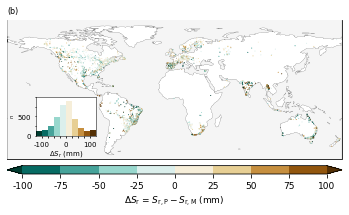

In [39]:
# all test results from cross validation on map - ABSDIFF
cmap_rdbu1 = cm.get_cmap('BrBG_r',10)
bounds = np.linspace(-100,100,9)
bounds2 = bounds
norm = mpl.colors.BoundaryNorm(bounds, cmap_rdbu.N)

x=test_dfs['lat'].astype(float)
y=test_dfs['lon'].astype(float)
kde = gaussian_kde(np.vstack([x, y]))
density1 = kde(np.vstack([x, y]))*1000
density2 = (np.clip(density1, 0.06, 0.23))
test_dfs['density'] = 1/(density2*10)

# test_dfs1 = test_dfs[(test_dfs['Sr_p-Sr_m']<25)&(test_dfs['Sr_p-Sr_m']>-25)]
# test_dfs2 = test_dfs[((test_dfs['Sr_p-Sr_m']>25)&(test_dfs['Sr_p-Sr_m']<50))|((test_dfs['Sr_p-Sr_m']<-25)&(test_dfs['Sr_p-Sr_m']>-50))]
# test_dfs3 = test_dfs[((test_dfs['Sr_p-Sr_m']>50)&(test_dfs['Sr_p-Sr_m']<75))|((test_dfs['Sr_p-Sr_m']<-50)&(test_dfs['Sr_p-Sr_m']>-75))]
# test_dfs4 = test_dfs[((test_dfs['Sr_p-Sr_m']>75))|((test_dfs['Sr_p-Sr_m']<-75))]

# test_dfs1_e = test_dfs1[(test_dfs['lat']<lat_max_e)&(test_dfs['lat']>lat_min_e)&(test_dfs['lon']<lon_max_e)&(test_dfs['lon']>lon_min_e)]
# test_dfs2_e = test_dfs2[(test_dfs['lat']<lat_max_e)&(test_dfs['lat']>lat_min_e)&(test_dfs['lon']<lon_max_e)&(test_dfs['lon']>lon_min_e)]
# test_dfs3_e = test_dfs3[(test_dfs['lat']<lat_max_e)&(test_dfs['lat']>lat_min_e)&(test_dfs['lon']<lon_max_e)&(test_dfs['lon']>lon_min_e)]
# test_dfs4_e = test_dfs4[(test_dfs['lat']<lat_max_e)&(test_dfs['lat']>lat_min_e)&(test_dfs['lon']<lon_max_e)&(test_dfs['lon']>lon_min_e)]

fig2 = plt.figure(figsize=(6,6))
# plt.subplots_adjust(wspace=0000.1,hspace=-0.4)
ax = fig2.add_subplot(111,projection=ccrs.PlateCarree())
ax.coastlines(linewidth=0.1)
ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
ax.set_global()
ax.set_xlim(-180,180)
ax.set_ylim(-60,90)
s=ax.scatter(test_dfs.lon,test_dfs.lat,s=0.5*test_dfs['density'],c=test_dfs['Sr_p-Sr_m'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu,norm=norm,zorder=105)
# s=ax.scatter(test_dfs1.lon,test_dfs1.lat,s=0.4*test_dfs1['density'],c=test_dfs1['Sr_p-Sr_m'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu,norm=norm,zorder=105)
# s=ax.scatter(test_dfs2.lon,test_dfs2.lat,s=0.4*test_dfs2['density'],c=test_dfs2['Sr_p-Sr_m'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu,norm=norm,zorder=104)
# s=ax.scatter(test_dfs3.lon,test_dfs3.lat,s=0.4*test_dfs3['density'],c=test_dfs3['Sr_p-Sr_m'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu,norm=norm,zorder=103)
# s=ax.scatter(test_dfs4.lon,test_dfs4.lat,s=0.4*test_dfs4['density'],c=test_dfs4['Sr_p-Sr_m'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu,norm=norm,zorder=102)
# cbar = plt.colorbar(s, orientation='vertical',spacing='proportional',extend='both', pad=0.02,aspect=15, norm=norm,shrink=0.35)
cbar = plt.colorbar(s, orientation='horizontal',spacing='proportional',extend='both', pad=0.02,aspect=40,norm=norm)
cbar.set_label('$\Delta$$S_\mathrm{r}$ = $S_\mathrm{r,P}-S_\mathrm{r,M}$ (mm)',size=9)
cbar.set_ticklabels(['-100','-75','-50','-25','0','25','50','75','100'],size=9)
ax.set_title('(b)',size=8,loc='left')
# cbar.set_ticks([1,2,3])
# cbar.set_ticklabels([f'-{int(mae_test_mean)}','0',f'{int(mae_test_mean)}'],size=7)

iax = inset_axes(ax, width="18%", height="28%",loc=3,bbox_transform=ax.transAxes,bbox_to_anchor=(0.07,0.13,1,1))
n0=len(test_dfs[test_dfs['Sr_p-Sr_m']<bounds[0]])
n1=len(test_dfs[(test_dfs['Sr_p-Sr_m']<bounds[1])&(test_dfs['Sr_p-Sr_m']>bounds[0])])
n2=len(test_dfs[(test_dfs['Sr_p-Sr_m']<bounds[2])&(test_dfs['Sr_p-Sr_m']>bounds[1])])
n3=len(test_dfs[(test_dfs['Sr_p-Sr_m']<bounds[3])&(test_dfs['Sr_p-Sr_m']>bounds[2])])
n4=len(test_dfs[(test_dfs['Sr_p-Sr_m']<bounds[4])&(test_dfs['Sr_p-Sr_m']>bounds[3])])
n5=len(test_dfs[(test_dfs['Sr_p-Sr_m']<bounds[5])&(test_dfs['Sr_p-Sr_m']>bounds[4])])
n6=len(test_dfs[(test_dfs['Sr_p-Sr_m']<bounds[6])&(test_dfs['Sr_p-Sr_m']>bounds[5])])
n7=len(test_dfs[(test_dfs['Sr_p-Sr_m']<bounds[7])&(test_dfs['Sr_p-Sr_m']>bounds[6])])
n8=len(test_dfs[(test_dfs['Sr_p-Sr_m']<bounds[8])&(test_dfs['Sr_p-Sr_m']>bounds[7])])
n9=len(test_dfs[(test_dfs['Sr_p-Sr_m']>bounds[8])])
n = [n0,n1,n2,n3,n4,n5,n6,n7,n8,n9]
plt.setp(list(iax.spines.values()),linewidth=0.5)
bins=bounds
iax.bar([0,1,2,3,4,5,6,7,8,9],n,width=1,color=[cmap_rdbu1(0),cmap_rdbu1(1),cmap_rdbu1(2),cmap_rdbu1(3),cmap_rdbu1(4),cmap_rdbu1(5),cmap_rdbu1(6),cmap_rdbu1(7),cmap_rdbu1(8),cmap_rdbu1(9)])
iax.set_xticks([0.5,1.5,2.5,3.5,4.5,5.5,6.5,7.5,8.5])
iax.set_yticks([0,250,500,750,1000])
iax.set_yticklabels(['0','','500','',''])
iax.set_xticklabels(['-100','','','','0','','','','100'])
iax.set_xlim(-0.5,9.5)
iax.set_xlabel('$\Delta$$S_\mathrm{r}$ (mm)',size=7, labelpad=1)
iax.set_ylabel('$n$',size=5,labelpad=1)
iax.tick_params(axis='both',length=1.5, labelsize=7)

fig2.savefig(f'{work_dir}/output/regression/figures/interpretation/test_maps2_{mod}.jpg',bbox_inches='tight',dpi=900)


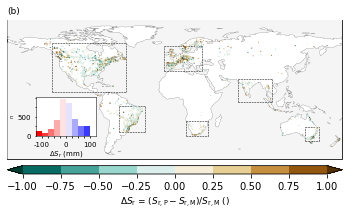

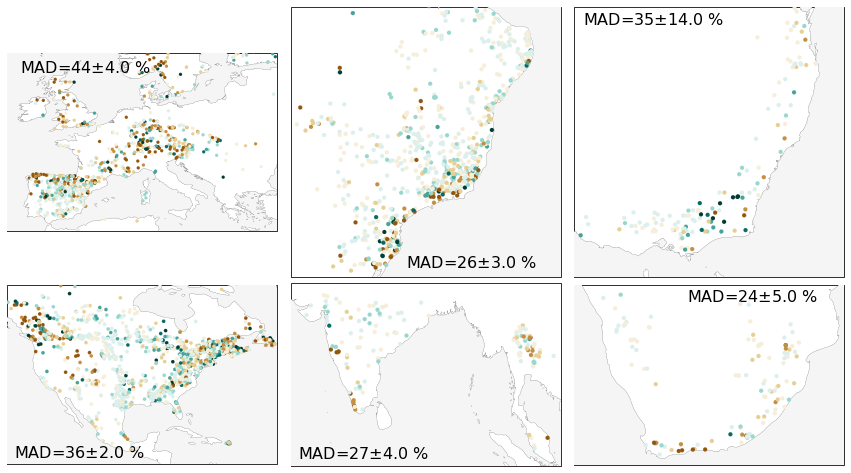

In [40]:
# all test results from cross validation on map - RELDIFF
cmap_rdbu1 = cm.get_cmap('bwr_r',10)
bounds = np.linspace(-1,1,9)
bounds2 = bounds
norm = mpl.colors.BoundaryNorm(bounds, cmap_rdbu.N)

fig2 = plt.figure(figsize=(6,6))
# plt.subplots_adjust(wspace=0000.1,hspace=-0.4)
ax = fig2.add_subplot(111,projection=ccrs.PlateCarree())
ax.coastlines(linewidth=0.1)
ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
ax.set_global()
ax.set_xlim(-180,180)
ax.set_ylim(-60,90)
s=ax.scatter(test_dfs.lon,test_dfs.lat,s=0.7,c=test_dfs['(Sr_p-Sr_m)/Sr_m'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu,norm=norm,zorder=102)
# cbar = plt.colorbar(s, orientation='vertical',spacing='proportional',extend='both', pad=0.02,aspect=15, norm=norm,shrink=0.35)
cbar = plt.colorbar(s, orientation='horizontal',spacing='proportional',extend='both', pad=0.02,aspect=40,norm=norm)
cbar.set_label('$\Delta$$S_\mathrm{r}$ = ($S_\mathrm{r,P}-S_\mathrm{r,M})/S_\mathrm{r,M}$ ()',size=9)
# cbar.set_ticklabels(['-100','-75','-50','-25','0','25','50','75','100'],size=9)
ax.set_title('(b)',size=9,loc='left')
# cbar.set_ticks([1,2,3])
# cbar.set_ticklabels([f'-{int(mae_test_mean)}','0',f'{int(mae_test_mean)}'],size=7)

ax.plot([lon_min_a,lon_max_a],[lat_max_a,lat_max_a],'k--',zorder=101,linewidth=0.5)
ax.plot([lon_min_a,lon_max_a],[lat_min_a,lat_min_a],'k--',zorder=101,linewidth=0.5)
ax.plot([lon_min_a,lon_min_a],[lat_min_a,lat_max_a],'k--',zorder=101,linewidth=0.5)
ax.plot([lon_max_a,lon_max_a],[lat_min_a,lat_max_a],'k--',zorder=101,linewidth=0.5)

ax.plot([lon_min_e,lon_max_e],[lat_max_e,lat_max_e],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_min_e,lon_max_e],[lat_min_e,lat_min_e],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_min_e,lon_min_e],[lat_min_e,lat_max_e],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_max_e,lon_max_e],[lat_min_e,lat_max_e],'k--',linewidth=0.5,zorder=101)

ax.plot([lon_min_u,lon_max_u],[lat_max_u,lat_max_u],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_min_u,lon_max_u],[lat_min_u,lat_min_u],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_min_u,lon_min_u],[lat_min_u,lat_max_u],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_max_u,lon_max_u],[lat_min_u,lat_max_u],'k--',linewidth=0.5,zorder=101)

ax.plot([lon_min_s,lon_max_s],[lat_max_s,lat_max_s],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_min_s,lon_max_s],[lat_min_s,lat_min_s],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_min_s,lon_min_s],[lat_min_s,lat_max_s],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_max_s,lon_max_s],[lat_min_s,lat_max_s],'k--',linewidth=0.5,zorder=101)

ax.plot([lon_min_t,lon_max_t],[lat_max_t,lat_max_t],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_min_t,lon_max_t],[lat_min_t,lat_min_t],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_min_t,lon_min_t],[lat_min_t,lat_max_t],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_max_t,lon_max_t],[lat_min_t,lat_max_t],'k--',linewidth=0.5,zorder=101)

ax.plot([lon_min_f,lon_max_f],[lat_max_f,lat_max_f],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_min_f,lon_max_f],[lat_min_f,lat_min_f],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_min_f,lon_min_f],[lat_min_f,lat_max_f],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_max_f,lon_max_f],[lat_min_f,lat_max_f],'k--',linewidth=0.5,zorder=101)

iax = inset_axes(ax, width="18%", height="28%",loc=3,bbox_transform=ax.transAxes,bbox_to_anchor=(0.07,0.13,1,1))
n0=len(test_dfs[test_dfs['(Sr_p-Sr_m)/Sr_m']<bounds[0]])
n1=len(test_dfs[(test_dfs['(Sr_p-Sr_m)/Sr_m']<bounds[1])&(test_dfs['(Sr_p-Sr_m)/Sr_m']>bounds[0])])
n2=len(test_dfs[(test_dfs['(Sr_p-Sr_m)/Sr_m']<bounds[2])&(test_dfs['(Sr_p-Sr_m)/Sr_m']>bounds[1])])
n3=len(test_dfs[(test_dfs['(Sr_p-Sr_m)/Sr_m']<bounds[3])&(test_dfs['(Sr_p-Sr_m)/Sr_m']>bounds[2])])
n4=len(test_dfs[(test_dfs['(Sr_p-Sr_m)/Sr_m']<bounds[4])&(test_dfs['(Sr_p-Sr_m)/Sr_m']>bounds[3])])
n5=len(test_dfs[(test_dfs['(Sr_p-Sr_m)/Sr_m']<bounds[5])&(test_dfs['(Sr_p-Sr_m)/Sr_m']>bounds[4])])
n6=len(test_dfs[(test_dfs['(Sr_p-Sr_m)/Sr_m']<bounds[6])&(test_dfs['(Sr_p-Sr_m)/Sr_m']>bounds[5])])
n7=len(test_dfs[(test_dfs['(Sr_p-Sr_m)/Sr_m']<bounds[7])&(test_dfs['(Sr_p-Sr_m)/Sr_m']>bounds[6])])
n8=len(test_dfs[(test_dfs['(Sr_p-Sr_m)/Sr_m']<bounds[8])&(test_dfs['(Sr_p-Sr_m)/Sr_m']>bounds[7])])
n9=len(test_dfs[(test_dfs['(Sr_p-Sr_m)/Sr_m']>bounds[8])])
n = [n0,n1,n2,n3,n4,n5,n6,n7,n8,n9]
plt.setp(list(iax.spines.values()),linewidth=0.5)
bins=bounds
iax.bar([0,1,2,3,4,5,6,7,8,9],n,width=1,color=[cmap_rdbu1(0),cmap_rdbu1(1),cmap_rdbu1(2),cmap_rdbu1(3),cmap_rdbu1(4),cmap_rdbu1(5),cmap_rdbu1(6),cmap_rdbu1(7),cmap_rdbu1(8),cmap_rdbu1(9)])
iax.set_xticks([0.5,1.5,2.5,3.5,4.5,5.5,6.5,7.5,8.5])
iax.set_yticks([0,250,500,750,1000])
iax.set_yticklabels(['0','','500','',''])
iax.set_xticklabels(['-100','','','','0','','','','100'])
iax.set_xlim(-0.5,9.5)
iax.set_xlabel('$\Delta$$S_\mathrm{r}$ (mm)',size=7, labelpad=1)
iax.set_ylabel('$n$',size=5,labelpad=1)
iax.tick_params(axis='both',length=1.5, labelsize=7)

fig2.savefig(f'{work_dir}/output/regression/figures/interpretation/test_maps2_{mod}_rel.jpg',bbox_inches='tight',dpi=300)

fig2 = plt.figure(figsize=(15,10))
ax = fig2.add_subplot(231,projection=ccrs.PlateCarree())
plt.subplots_adjust(wspace=0.05,hspace=-0.25)
ax.coastlines(linewidth=0.1)
ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
ax.set_global()
ax.set_ylim(lat_min_e,lat_max_e)
ax.set_xlim(lon_min_e,lon_max_e)
ax.text(lon_min_e+2,lat_max_e-3,f'MAD={int(dfrrt_rel.mad_europe[0])}$\pm${np.round(dfrrt_rel.mad_europe[1],1)} %',size=16,zorder=101)
s=ax.scatter(test_dfs.lon,test_dfs.lat,s=10,c=test_dfs['(Sr_p-Sr_m)/Sr_m'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu,norm=norm,zorder=101)
# ax.set_title('(b)',size=14,loc='left')

# fig2 = plt.figure(figsize=(6,6))
ax = fig2.add_subplot(232,projection=ccrs.PlateCarree())
ax.coastlines(linewidth=0.1)
ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
ax.set_global()
ax.set_ylim(lat_min_s,lat_max_s)
ax.set_xlim(lon_min_s,lon_max_s)
ax.text(lon_max_s-16,lat_min_s+1,f'MAD={int(dfrrt_rel.mad_southamerica[0])}$\pm${np.round(dfrrt_rel.mad_southamerica[1],1)} %',size=16,zorder=101)
s=ax.scatter(test_dfs.lon,test_dfs.lat,s=17,c=test_dfs['(Sr_p-Sr_m)/Sr_m'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu,norm=norm,zorder=101)
# ax.set_title('(c)',size=14,loc='left')

# fig2 = plt.figure(figsize=(6,6))
ax = fig2.add_subplot(233,projection=ccrs.PlateCarree())
ax.coastlines(linewidth=0.1)
ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
ax.set_global()
ax.set_ylim(lat_min_t,lat_max_t)
ax.set_xlim(lon_min_t,lon_max_t)
ax.text(lon_min_t+0.5,lat_max_t-1,f'MAD={int(dfrrt_rel.mad_australia[0])}$\pm${np.round(dfrrt_rel.mad_australia[1],1)} %',size=16,zorder=101)
s=ax.scatter(test_dfs.lon,test_dfs.lat,s=17,c=test_dfs['(Sr_p-Sr_m)/Sr_m'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu,norm=norm,zorder=101)
# ax.set_title('(d)',size=14,loc='left')

# fig2 = plt.figure(figsize=(6,6))
ax = fig2.add_subplot(234,projection=ccrs.PlateCarree())
ax.coastlines(linewidth=0.1)
ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
ax.set_global()
ax.set_ylim(lat_min_u,lat_max_u)
ax.set_xlim(lon_min_u,lon_max_u)
ax.text(lon_min_u+2,lat_min_u+2,f'MAD={int(dfrrt_rel.mad_northamerica[0])}$\pm${np.round(dfrrt_rel.mad_northamerica[1],1)} %',size=16,zorder=101)
s=ax.scatter(test_dfs.lon,test_dfs.lat,s=12,c=test_dfs['(Sr_p-Sr_m)/Sr_m'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu,norm=norm,zorder=101)
# ax.set_title('(e)',size=14,loc='left')

# fig2 = plt.figure(figsize=(6,6))
ax = fig2.add_subplot(235,projection=ccrs.PlateCarree())
ax.coastlines(linewidth=0.1)
ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
ax.set_global()
ax.set_ylim(lat_min_a,lat_max_a)
ax.set_xlim(lon_min_a,lon_max_a)
ax.text(lon_min_a+1,lat_min_a+1,f'MAD={int(dfrrt_rel.mad_asia[0])}$\pm${np.round(dfrrt_rel.mad_asia[1],1)} %',size=16,zorder=101)
s=ax.scatter(test_dfs.lon,test_dfs.lat,s=17,c=test_dfs['(Sr_p-Sr_m)/Sr_m'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu,norm=norm,zorder=101)
# ax.set_title('(f)',size=14,loc='left')

# fig2 = plt.figure(figsize=(6,6))
ax = fig2.add_subplot(236,projection=ccrs.PlateCarree())
ax.coastlines(linewidth=0.1)
ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
ax.set_global()
ax.set_ylim(lat_min_f,lat_max_f)
ax.set_xlim(lon_min_f,lon_max_f)
ax.text(lon_max_f-14,lat_max_f-1.5,f'MAD={int(dfrrt_rel.mad_southafrica[0])}$\pm${np.round(dfrrt_rel.mad_southafrica[1],1)} %',size=16,zorder=101)
s=ax.scatter(test_dfs.lon,test_dfs.lat,s=17,c=test_dfs['(Sr_p-Sr_m)/Sr_m'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu,norm=norm,zorder=101)
# ax.set_title('(g)',size=14,loc='left')

fig2.savefig(f'{work_dir}/output/regression/figures/interpretation/test_maps_zoomed2_{mod}_rel.jpg',bbox_inches='tight',dpi=300)


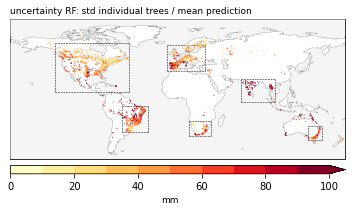

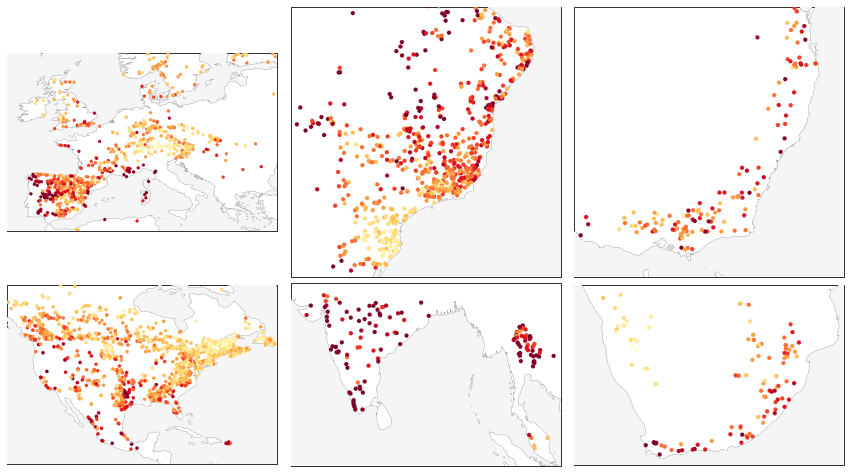

In [41]:
# all test results from cross validation on map - UNCERTAINTY OF ESTIMATES ABS
cmap_rdbu = cm.get_cmap('YlOrRd',10)
bounds = np.linspace(0,100,11)
bounds2 = bounds
norm = mpl.colors.BoundaryNorm(bounds, cmap_rdbu.N)

fig2 = plt.figure(figsize=(6,6))
# plt.subplots_adjust(wspace=0000.1,hspace=-0.4)
ax = fig2.add_subplot(111,projection=ccrs.PlateCarree())
ax.coastlines(linewidth=0.1)
ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
ax.set_global()
ax.set_xlim(-180,180)
ax.set_ylim(-60,90)
s=ax.scatter(test_dfs.lon,test_dfs.lat,s=0.7,c=test_dfs['std'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu,norm=norm,zorder=102)
# cbar = plt.colorbar(s, orientation='vertical',spacing='proportional',extend='both', pad=0.02,aspect=15, norm=norm,shrink=0.35)
cbar = plt.colorbar(s, orientation='horizontal',spacing='proportional',extend='max', pad=0.02,aspect=40,norm=norm)
cbar.set_label('mm',size=9)
# cbar.set_ticklabels(['-100','-75','-50','-25','0','25','50','75','100'],size=9)
ax.set_title('uncertainty RF: std individual trees / mean prediction',size=9,loc='left')
# cbar.set_ticks([1,2,3])
# cbar.set_ticklabels([f'-{int(mae_test_mean)}','0',f'{int(mae_test_mean)}'],size=7)

ax.plot([lon_min_a,lon_max_a],[lat_max_a,lat_max_a],'k--',zorder=101,linewidth=0.5)
ax.plot([lon_min_a,lon_max_a],[lat_min_a,lat_min_a],'k--',zorder=101,linewidth=0.5)
ax.plot([lon_min_a,lon_min_a],[lat_min_a,lat_max_a],'k--',zorder=101,linewidth=0.5)
ax.plot([lon_max_a,lon_max_a],[lat_min_a,lat_max_a],'k--',zorder=101,linewidth=0.5)

ax.plot([lon_min_e,lon_max_e],[lat_max_e,lat_max_e],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_min_e,lon_max_e],[lat_min_e,lat_min_e],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_min_e,lon_min_e],[lat_min_e,lat_max_e],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_max_e,lon_max_e],[lat_min_e,lat_max_e],'k--',linewidth=0.5,zorder=101)

ax.plot([lon_min_u,lon_max_u],[lat_max_u,lat_max_u],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_min_u,lon_max_u],[lat_min_u,lat_min_u],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_min_u,lon_min_u],[lat_min_u,lat_max_u],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_max_u,lon_max_u],[lat_min_u,lat_max_u],'k--',linewidth=0.5,zorder=101)

ax.plot([lon_min_s,lon_max_s],[lat_max_s,lat_max_s],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_min_s,lon_max_s],[lat_min_s,lat_min_s],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_min_s,lon_min_s],[lat_min_s,lat_max_s],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_max_s,lon_max_s],[lat_min_s,lat_max_s],'k--',linewidth=0.5,zorder=101)

ax.plot([lon_min_t,lon_max_t],[lat_max_t,lat_max_t],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_min_t,lon_max_t],[lat_min_t,lat_min_t],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_min_t,lon_min_t],[lat_min_t,lat_max_t],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_max_t,lon_max_t],[lat_min_t,lat_max_t],'k--',linewidth=0.5,zorder=101)

ax.plot([lon_min_f,lon_max_f],[lat_max_f,lat_max_f],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_min_f,lon_max_f],[lat_min_f,lat_min_f],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_min_f,lon_min_f],[lat_min_f,lat_max_f],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_max_f,lon_max_f],[lat_min_f,lat_max_f],'k--',linewidth=0.5,zorder=101)

# iax = inset_axes(ax, width="18%", height="28%",loc=3,bbox_transform=ax.transAxes,bbox_to_anchor=(0.07,0.13,1,1))
# n0=len(test_dfs[test_dfs['Sr_p-Sr_m']<bounds[0]])
# n1=len(test_dfs[(test_dfs['Sr_p-Sr_m']<bounds[1])&(test_dfs['Sr_p-Sr_m']>bounds[0])])
# n2=len(test_dfs[(test_dfs['Sr_p-Sr_m']<bounds[2])&(test_dfs['Sr_p-Sr_m']>bounds[1])])
# n3=len(test_dfs[(test_dfs['Sr_p-Sr_m']<bounds[3])&(test_dfs['Sr_p-Sr_m']>bounds[2])])
# n4=len(test_dfs[(test_dfs['Sr_p-Sr_m']<bounds[4])&(test_dfs['Sr_p-Sr_m']>bounds[3])])
# n5=len(test_dfs[(test_dfs['Sr_p-Sr_m']<bounds[5])&(test_dfs['Sr_p-Sr_m']>bounds[4])])
# n6=len(test_dfs[(test_dfs['Sr_p-Sr_m']<bounds[6])&(test_dfs['Sr_p-Sr_m']>bounds[5])])
# n7=len(test_dfs[(test_dfs['Sr_p-Sr_m']<bounds[7])&(test_dfs['Sr_p-Sr_m']>bounds[6])])
# n8=len(test_dfs[(test_dfs['Sr_p-Sr_m']<bounds[8])&(test_dfs['Sr_p-Sr_m']>bounds[7])])
# n9=len(test_dfs[(test_dfs['Sr_p-Sr_m']>bounds[8])])
# n = [n0,n1,n2,n3,n4,n5,n6,n7,n8,n9]
# plt.setp(list(iax.spines.values()),linewidth=0.5)
# bins=bounds
# iax.bar([0,1,2,3,4,5,6,7,8,9],n,width=1,color=[cmap_rdbu1(0),cmap_rdbu1(1),cmap_rdbu1(2),cmap_rdbu1(3),cmap_rdbu1(4),cmap_rdbu1(5),cmap_rdbu1(6),cmap_rdbu1(7),cmap_rdbu1(8),cmap_rdbu1(9)])
# iax.set_xticks([0.5,1.5,2.5,3.5,4.5,5.5,6.5,7.5,8.5])
# iax.set_yticks([0,250,500,750,1000])
# iax.set_yticklabels(['0','','500','',''])
# iax.set_xticklabels(['-100','','','','0','','','','100'])
# iax.set_xlim(-0.5,9.5)
# iax.set_xlabel('$\Delta$$S_\mathrm{r}$ (mm)',size=7, labelpad=1)
# iax.set_ylabel('$n$',size=5,labelpad=1)
# iax.tick_params(axis='both',length=1.5, labelsize=7)

# fig2.savefig(f'{work_dir}/output/regression/figures/interpretation/test_maps2_{mod}.jpg',bbox_inches='tight',dpi=300)

fig2 = plt.figure(figsize=(15,10))
ax = fig2.add_subplot(231,projection=ccrs.PlateCarree())
plt.subplots_adjust(wspace=0.05,hspace=-0.25)
ax.coastlines(linewidth=0.1)
ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
ax.set_global()
ax.set_ylim(lat_min_e,lat_max_e)
ax.set_xlim(lon_min_e,lon_max_e)
# ax.text(lon_min_e+2,lat_max_e-3,f'MAD={int(dfrrt.mad_europe[0])}$\pm${np.round(dfrrt.mad_europe[1],1)} mm',size=16,zorder=101)
s=ax.scatter(test_dfs.lon,test_dfs.lat,s=10,c=test_dfs['std'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu,norm=norm,zorder=101)
# ax.set_title('(b)',size=14,loc='left')

# fig2 = plt.figure(figsize=(6,6))
ax = fig2.add_subplot(232,projection=ccrs.PlateCarree())
ax.coastlines(linewidth=0.1)
ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
ax.set_global()
ax.set_ylim(lat_min_s,lat_max_s)
ax.set_xlim(lon_min_s,lon_max_s)
# ax.text(lon_max_s-16,lat_min_s+1,f'MAD={int(dfrrt.mad_southamerica[0])}$\pm${np.round(dfrrt.mad_southamerica[1],1)} mm',size=16,zorder=101)
s=ax.scatter(test_dfs.lon,test_dfs.lat,s=17,c=test_dfs['std'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu,norm=norm,zorder=101)
# ax.set_title('(c)',size=14,loc='left')

# fig2 = plt.figure(figsize=(6,6))
ax = fig2.add_subplot(233,projection=ccrs.PlateCarree())
ax.coastlines(linewidth=0.1)
ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
ax.set_global()
ax.set_ylim(lat_min_t,lat_max_t)
ax.set_xlim(lon_min_t,lon_max_t)
# ax.text(lon_min_t+0.5,lat_max_t-1,f'MAD={int(dfrrt.mad_australia[0])}$\pm${np.round(dfrrt.mad_australia[1],1)} mm',size=16,zorder=101)
s=ax.scatter(test_dfs.lon,test_dfs.lat,s=17,c=test_dfs['std'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu,norm=norm,zorder=101)
# ax.set_title('(d)',size=14,loc='left')

# fig2 = plt.figure(figsize=(6,6))
ax = fig2.add_subplot(234,projection=ccrs.PlateCarree())
ax.coastlines(linewidth=0.1)
ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
ax.set_global()
ax.set_ylim(lat_min_u,lat_max_u)
ax.set_xlim(lon_min_u,lon_max_u)
# ax.text(lon_min_u+2,lat_min_u+2,f'MAD={int(dfrrt.mad_northamerica[0])}$\pm${np.round(dfrrt.mad_northamerica[1],1)} mm',size=16,zorder=101)
s=ax.scatter(test_dfs.lon,test_dfs.lat,s=12,c=test_dfs['std'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu,norm=norm,zorder=101)
# ax.set_title('(e)',size=14,loc='left')

# fig2 = plt.figure(figsize=(6,6))
ax = fig2.add_subplot(235,projection=ccrs.PlateCarree())
ax.coastlines(linewidth=0.1)
ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
ax.set_global()
ax.set_ylim(lat_min_a,lat_max_a)
ax.set_xlim(lon_min_a,lon_max_a)
# ax.text(lon_min_a+1,lat_min_a+1,f'MAD={int(dfrrt.mad_asia[0])}$\pm${np.round(dfrrt.mad_asia[1],1)} mm',size=16,zorder=101)
s=ax.scatter(test_dfs.lon,test_dfs.lat,s=17,c=test_dfs['std'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu,norm=norm,zorder=101)
# ax.set_title('(f)',size=14,loc='left')

# fig2 = plt.figure(figsize=(6,6))
ax = fig2.add_subplot(236,projection=ccrs.PlateCarree())
ax.coastlines(linewidth=0.1)
ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
ax.set_global()
ax.set_ylim(lat_min_f,lat_max_f)
ax.set_xlim(lon_min_f,lon_max_f)
# ax.text(lon_max_f-14,lat_max_f-1.5,f'MAD={int(dfrrt.mad_southafrica[0])}$\pm${np.round(dfrrt.mad_southafrica[1],1)} mm',size=16,zorder=101)
s=ax.scatter(test_dfs.lon,test_dfs.lat,s=17,c=test_dfs['std'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu,norm=norm,zorder=101)
# ax.set_title('(g)',size=14,loc='left')

# fig2.savefig(f'{work_dir}/output/regression/figures/interpretation/test_maps_zoomed2_{mod}.jpg',bbox_inches='tight',dpi=300)


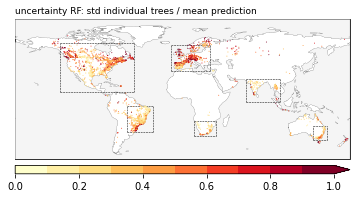

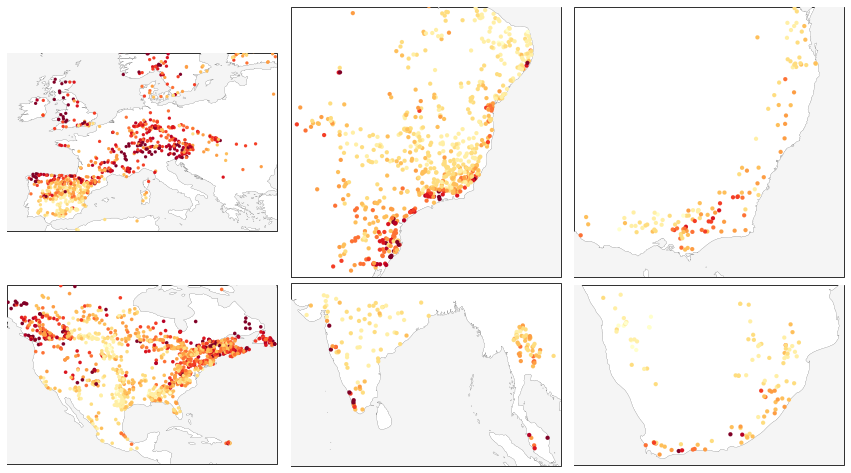

In [41]:
# all test results from cross validation on map - UNCERTAINTY OF ESTIMATES
cmap_rdbu = cm.get_cmap('YlOrRd',10)
bounds = np.linspace(0,1,11)
bounds2 = bounds
norm = mpl.colors.BoundaryNorm(bounds, cmap_rdbu.N)

test_dfs['stds'] = test_dfs['std']/test_dfs['Sr_p']

fig2 = plt.figure(figsize=(6,6))
# plt.subplots_adjust(wspace=0000.1,hspace=-0.4)
ax = fig2.add_subplot(111,projection=ccrs.PlateCarree())
ax.coastlines(linewidth=0.1)
ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
ax.set_global()
ax.set_xlim(-180,180)
ax.set_ylim(-60,90)
s=ax.scatter(test_dfs.lon,test_dfs.lat,s=0.7,c=test_dfs['stds'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu,norm=norm,zorder=102)
# cbar = plt.colorbar(s, orientation='vertical',spacing='proportional',extend='both', pad=0.02,aspect=15, norm=norm,shrink=0.35)
cbar = plt.colorbar(s, orientation='horizontal',spacing='proportional',extend='max', pad=0.02,aspect=40,norm=norm)
cbar.set_label('',size=9)
# cbar.set_ticklabels(['-100','-75','-50','-25','0','25','50','75','100'],size=9)
ax.set_title('uncertainty RF: std individual trees / mean prediction',size=9,loc='left')
# cbar.set_ticks([1,2,3])
# cbar.set_ticklabels([f'-{int(mae_test_mean)}','0',f'{int(mae_test_mean)}'],size=7)

ax.plot([lon_min_a,lon_max_a],[lat_max_a,lat_max_a],'k--',zorder=101,linewidth=0.5)
ax.plot([lon_min_a,lon_max_a],[lat_min_a,lat_min_a],'k--',zorder=101,linewidth=0.5)
ax.plot([lon_min_a,lon_min_a],[lat_min_a,lat_max_a],'k--',zorder=101,linewidth=0.5)
ax.plot([lon_max_a,lon_max_a],[lat_min_a,lat_max_a],'k--',zorder=101,linewidth=0.5)

ax.plot([lon_min_e,lon_max_e],[lat_max_e,lat_max_e],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_min_e,lon_max_e],[lat_min_e,lat_min_e],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_min_e,lon_min_e],[lat_min_e,lat_max_e],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_max_e,lon_max_e],[lat_min_e,lat_max_e],'k--',linewidth=0.5,zorder=101)

ax.plot([lon_min_u,lon_max_u],[lat_max_u,lat_max_u],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_min_u,lon_max_u],[lat_min_u,lat_min_u],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_min_u,lon_min_u],[lat_min_u,lat_max_u],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_max_u,lon_max_u],[lat_min_u,lat_max_u],'k--',linewidth=0.5,zorder=101)

ax.plot([lon_min_s,lon_max_s],[lat_max_s,lat_max_s],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_min_s,lon_max_s],[lat_min_s,lat_min_s],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_min_s,lon_min_s],[lat_min_s,lat_max_s],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_max_s,lon_max_s],[lat_min_s,lat_max_s],'k--',linewidth=0.5,zorder=101)

ax.plot([lon_min_t,lon_max_t],[lat_max_t,lat_max_t],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_min_t,lon_max_t],[lat_min_t,lat_min_t],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_min_t,lon_min_t],[lat_min_t,lat_max_t],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_max_t,lon_max_t],[lat_min_t,lat_max_t],'k--',linewidth=0.5,zorder=101)

ax.plot([lon_min_f,lon_max_f],[lat_max_f,lat_max_f],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_min_f,lon_max_f],[lat_min_f,lat_min_f],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_min_f,lon_min_f],[lat_min_f,lat_max_f],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_max_f,lon_max_f],[lat_min_f,lat_max_f],'k--',linewidth=0.5,zorder=101)

# iax = inset_axes(ax, width="18%", height="28%",loc=3,bbox_transform=ax.transAxes,bbox_to_anchor=(0.07,0.13,1,1))
# n0=len(test_dfs[test_dfs['Sr_p-Sr_m']<bounds[0]])
# n1=len(test_dfs[(test_dfs['Sr_p-Sr_m']<bounds[1])&(test_dfs['Sr_p-Sr_m']>bounds[0])])
# n2=len(test_dfs[(test_dfs['Sr_p-Sr_m']<bounds[2])&(test_dfs['Sr_p-Sr_m']>bounds[1])])
# n3=len(test_dfs[(test_dfs['Sr_p-Sr_m']<bounds[3])&(test_dfs['Sr_p-Sr_m']>bounds[2])])
# n4=len(test_dfs[(test_dfs['Sr_p-Sr_m']<bounds[4])&(test_dfs['Sr_p-Sr_m']>bounds[3])])
# n5=len(test_dfs[(test_dfs['Sr_p-Sr_m']<bounds[5])&(test_dfs['Sr_p-Sr_m']>bounds[4])])
# n6=len(test_dfs[(test_dfs['Sr_p-Sr_m']<bounds[6])&(test_dfs['Sr_p-Sr_m']>bounds[5])])
# n7=len(test_dfs[(test_dfs['Sr_p-Sr_m']<bounds[7])&(test_dfs['Sr_p-Sr_m']>bounds[6])])
# n8=len(test_dfs[(test_dfs['Sr_p-Sr_m']<bounds[8])&(test_dfs['Sr_p-Sr_m']>bounds[7])])
# n9=len(test_dfs[(test_dfs['Sr_p-Sr_m']>bounds[8])])
# n = [n0,n1,n2,n3,n4,n5,n6,n7,n8,n9]
# plt.setp(list(iax.spines.values()),linewidth=0.5)
# bins=bounds
# iax.bar([0,1,2,3,4,5,6,7,8,9],n,width=1,color=[cmap_rdbu1(0),cmap_rdbu1(1),cmap_rdbu1(2),cmap_rdbu1(3),cmap_rdbu1(4),cmap_rdbu1(5),cmap_rdbu1(6),cmap_rdbu1(7),cmap_rdbu1(8),cmap_rdbu1(9)])
# iax.set_xticks([0.5,1.5,2.5,3.5,4.5,5.5,6.5,7.5,8.5])
# iax.set_yticks([0,250,500,750,1000])
# iax.set_yticklabels(['0','','500','',''])
# iax.set_xticklabels(['-100','','','','0','','','','100'])
# iax.set_xlim(-0.5,9.5)
# iax.set_xlabel('$\Delta$$S_\mathrm{r}$ (mm)',size=7, labelpad=1)
# iax.set_ylabel('$n$',size=5,labelpad=1)
# iax.tick_params(axis='both',length=1.5, labelsize=7)

# fig2.savefig(f'{work_dir}/output/regression/figures/interpretation/test_maps2_{mod}.jpg',bbox_inches='tight',dpi=300)

fig2 = plt.figure(figsize=(15,10))
ax = fig2.add_subplot(231,projection=ccrs.PlateCarree())
plt.subplots_adjust(wspace=0.05,hspace=-0.25)
ax.coastlines(linewidth=0.1)
ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
ax.set_global()
ax.set_ylim(lat_min_e,lat_max_e)
ax.set_xlim(lon_min_e,lon_max_e)
# ax.text(lon_min_e+2,lat_max_e-3,f'MAD={int(dfrrt.mad_europe[0])}$\pm${np.round(dfrrt.mad_europe[1],1)} mm',size=16,zorder=101)
s=ax.scatter(test_dfs.lon,test_dfs.lat,s=10,c=test_dfs['stds'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu,norm=norm,zorder=101)
# ax.set_title('(b)',size=14,loc='left')

# fig2 = plt.figure(figsize=(6,6))
ax = fig2.add_subplot(232,projection=ccrs.PlateCarree())
ax.coastlines(linewidth=0.1)
ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
ax.set_global()
ax.set_ylim(lat_min_s,lat_max_s)
ax.set_xlim(lon_min_s,lon_max_s)
# ax.text(lon_max_s-16,lat_min_s+1,f'MAD={int(dfrrt.mad_southamerica[0])}$\pm${np.round(dfrrt.mad_southamerica[1],1)} mm',size=16,zorder=101)
s=ax.scatter(test_dfs.lon,test_dfs.lat,s=17,c=test_dfs['stds'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu,norm=norm,zorder=101)
# ax.set_title('(c)',size=14,loc='left')

# fig2 = plt.figure(figsize=(6,6))
ax = fig2.add_subplot(233,projection=ccrs.PlateCarree())
ax.coastlines(linewidth=0.1)
ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
ax.set_global()
ax.set_ylim(lat_min_t,lat_max_t)
ax.set_xlim(lon_min_t,lon_max_t)
# ax.text(lon_min_t+0.5,lat_max_t-1,f'MAD={int(dfrrt.mad_australia[0])}$\pm${np.round(dfrrt.mad_australia[1],1)} mm',size=16,zorder=101)
s=ax.scatter(test_dfs.lon,test_dfs.lat,s=17,c=test_dfs['stds'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu,norm=norm,zorder=101)
# ax.set_title('(d)',size=14,loc='left')

# fig2 = plt.figure(figsize=(6,6))
ax = fig2.add_subplot(234,projection=ccrs.PlateCarree())
ax.coastlines(linewidth=0.1)
ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
ax.set_global()
ax.set_ylim(lat_min_u,lat_max_u)
ax.set_xlim(lon_min_u,lon_max_u)
# ax.text(lon_min_u+2,lat_min_u+2,f'MAD={int(dfrrt.mad_northamerica[0])}$\pm${np.round(dfrrt.mad_northamerica[1],1)} mm',size=16,zorder=101)
s=ax.scatter(test_dfs.lon,test_dfs.lat,s=12,c=test_dfs['stds'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu,norm=norm,zorder=101)
# ax.set_title('(e)',size=14,loc='left')

# fig2 = plt.figure(figsize=(6,6))
ax = fig2.add_subplot(235,projection=ccrs.PlateCarree())
ax.coastlines(linewidth=0.1)
ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
ax.set_global()
ax.set_ylim(lat_min_a,lat_max_a)
ax.set_xlim(lon_min_a,lon_max_a)
# ax.text(lon_min_a+1,lat_min_a+1,f'MAD={int(dfrrt.mad_asia[0])}$\pm${np.round(dfrrt.mad_asia[1],1)} mm',size=16,zorder=101)
s=ax.scatter(test_dfs.lon,test_dfs.lat,s=17,c=test_dfs['stds'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu,norm=norm,zorder=101)
# ax.set_title('(f)',size=14,loc='left')

# fig2 = plt.figure(figsize=(6,6))
ax = fig2.add_subplot(236,projection=ccrs.PlateCarree())
ax.coastlines(linewidth=0.1)
ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
ax.set_global()
ax.set_ylim(lat_min_f,lat_max_f)
ax.set_xlim(lon_min_f,lon_max_f)
# ax.text(lon_max_f-14,lat_max_f-1.5,f'MAD={int(dfrrt.mad_southafrica[0])}$\pm${np.round(dfrrt.mad_southafrica[1],1)} mm',size=16,zorder=101)
s=ax.scatter(test_dfs.lon,test_dfs.lat,s=17,c=test_dfs['stds'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu,norm=norm,zorder=101)
# ax.set_title('(g)',size=14,loc='left')

# fig2.savefig(f'{work_dir}/output/regression/figures/interpretation/test_maps_zoomed2_{mod}.jpg',bbox_inches='tight',dpi=300)


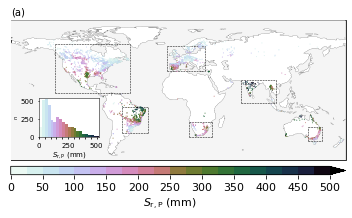

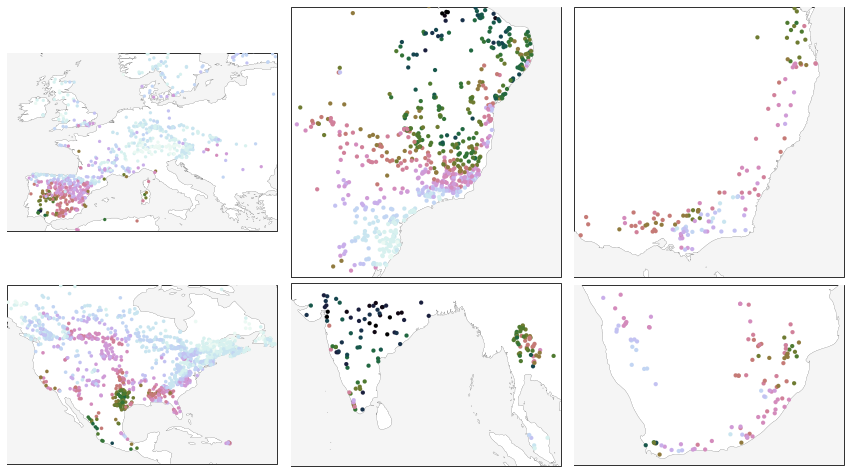

In [42]:
import matplotlib
cmap = cm.get_cmap('cubehelix_r',24)
color_list = [matplotlib.colors.rgb2hex(cmap(i)[:3]) for i in range(cmap.N)]
cmap_rdbu = ListedColormap(color_list[1:-1])
cmap_rdbu.set_over(color_list[-1])
cmap_rdbu.set_under(color_list[0])
cmap_rdbu

# sr predicted maps
cmap_rdbu1 = cm.get_cmap('cubehelix_r', 13)
cmap_rdbu1 = cmap_rdbu
bounds = np.linspace(0,500,21)
bounds2 = np.linspace(0,500,11)
norm = mpl.colors.BoundaryNorm(bounds, cmap_rdbu1.N)

fig2 = plt.figure(figsize=(6,6))
# plt.subplots_adjust(wspace=0000.1,hspace=-0.4)
ax = fig2.add_subplot(111,projection=ccrs.PlateCarree())
ax.coastlines(linewidth=0.1)
ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
ax.set_global()
ax.set_xlim(-180,180)
ax.set_ylim(-60,90)
s=ax.scatter(test_dfs.lon,test_dfs.lat,s=0.7,c=test_dfs['Sr_p'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu1,norm=norm,zorder=102)
# cbar = plt.colorbar(s, orientation='vertical',spacing='proportional',extend='both', pad=0.02,aspect=15, norm=norm,shrink=0.35)
cbar = plt.colorbar(s, orientation='horizontal',spacing='proportional',extend='max', pad=0.02,aspect=40,norm=norm)
cbar.set_label('$S_\mathrm{r,P}$ (mm)',size=11)
cbar.set_ticks(bounds2)
cbar.set_ticklabels(['0','50','100','150','200','250','300','350','400','450','500'],size=11)
ax.set_title('(a)',size=10,loc='left')
# cbar.set_ticklabels([f'-{int(mae_test_mean)}','0',f'{int(mae_test_mean)}'],size=7)

ax.plot([lon_min_a,lon_max_a],[lat_max_a,lat_max_a],'k--',zorder=101,linewidth=0.5)
ax.plot([lon_min_a,lon_max_a],[lat_min_a,lat_min_a],'k--',zorder=101,linewidth=0.5)
ax.plot([lon_min_a,lon_min_a],[lat_min_a,lat_max_a],'k--',zorder=101,linewidth=0.5)
ax.plot([lon_max_a,lon_max_a],[lat_min_a,lat_max_a],'k--',zorder=101,linewidth=0.5)

ax.plot([lon_min_e,lon_max_e],[lat_max_e,lat_max_e],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_min_e,lon_max_e],[lat_min_e,lat_min_e],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_min_e,lon_min_e],[lat_min_e,lat_max_e],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_max_e,lon_max_e],[lat_min_e,lat_max_e],'k--',linewidth=0.5,zorder=101)

ax.plot([lon_min_u,lon_max_u],[lat_max_u,lat_max_u],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_min_u,lon_max_u],[lat_min_u,lat_min_u],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_min_u,lon_min_u],[lat_min_u,lat_max_u],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_max_u,lon_max_u],[lat_min_u,lat_max_u],'k--',linewidth=0.5,zorder=101)

ax.plot([lon_min_s,lon_max_s],[lat_max_s,lat_max_s],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_min_s,lon_max_s],[lat_min_s,lat_min_s],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_min_s,lon_min_s],[lat_min_s,lat_max_s],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_max_s,lon_max_s],[lat_min_s,lat_max_s],'k--',linewidth=0.5,zorder=101)

ax.plot([lon_min_t,lon_max_t],[lat_max_t,lat_max_t],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_min_t,lon_max_t],[lat_min_t,lat_min_t],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_min_t,lon_min_t],[lat_min_t,lat_max_t],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_max_t,lon_max_t],[lat_min_t,lat_max_t],'k--',linewidth=0.5,zorder=101)

ax.plot([lon_min_f,lon_max_f],[lat_max_f,lat_max_f],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_min_f,lon_max_f],[lat_min_f,lat_min_f],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_min_f,lon_min_f],[lat_min_f,lat_max_f],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_max_f,lon_max_f],[lat_min_f,lat_max_f],'k--',linewidth=0.5,zorder=101)

iax = inset_axes(ax, width="18%", height="28%",loc=3,bbox_transform=ax.transAxes,bbox_to_anchor=(0.07,0.13,1,1))
n=[]
for i in range(len(bounds)):
    if (i<len(bounds)-1):
        nn = len(test_dfs[(test_dfs['Sr_p']<bounds[i+1])&(test_dfs['Sr_p']>=bounds[i])])
    else:
        nn=len(test_dfs[(test_dfs['Sr_p']>=bounds[i])])
    n.append(nn)
plt.setp(list(iax.spines.values()),linewidth=0.5)
bins=bounds
iax.bar([0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20],n,width=1,
        color=[cmap_rdbu1(0),cmap_rdbu1(1),cmap_rdbu1(2),cmap_rdbu1(3),cmap_rdbu1(4),cmap_rdbu1(5),cmap_rdbu1(6),cmap_rdbu1(7),cmap_rdbu1(8),cmap_rdbu1(9),cmap_rdbu1(10),
              cmap_rdbu1(11),cmap_rdbu1(12),cmap_rdbu1(13),cmap_rdbu1(14),cmap_rdbu1(15),cmap_rdbu1(16),cmap_rdbu1(17),cmap_rdbu1(18),cmap_rdbu1(19),cmap_rdbu1(20)])
iax.set_xticks(np.arange(-0.5,20,2))
iax.set_xticklabels(['0','','','','','250','','','','','500'])
iax.set_xlim(-0.5,20.5)
iax.set_yticks([0,250,500])
iax.set_yticklabels(['0','250','500'])
iax.set_xlabel('$S_\mathrm{r,P}$ (mm)',size=7,labelpad=1)
iax.set_ylabel('$n$',size=5,labelpad=1)
iax.tick_params(axis='both',length=1.5, labelsize=7)

fig2.savefig(f'{work_dir}/output/regression/figures/interpretation/sr_p_maps_{mod}.jpg',bbox_inches='tight',dpi=600)

fig2 = plt.figure(figsize=(15,10))
ax = fig2.add_subplot(231,projection=ccrs.PlateCarree())
plt.subplots_adjust(wspace=0.05,hspace=-0.25)
ax.coastlines(linewidth=0.1)
ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
ax.set_global()
ax.set_ylim(lat_min_e,lat_max_e)
ax.set_xlim(lon_min_e,lon_max_e)
# ax.text(lon_min_e+2,lat_max_e-3,f'MAD={int(dfrrt.mad_europe[0])}$\pm${np.round(dfrrt.mad_europe[1],1)} mm',size=14,zorder=101)
s=ax.scatter(test_dfs.lon,test_dfs.lat,s=10,c=test_dfs['Sr_p'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu1,norm=norm,zorder=101)
# ax.set_title('(b)',size=14,loc='left')

# fig2 = plt.figure(figsize=(6,6))
ax = fig2.add_subplot(232,projection=ccrs.PlateCarree())
ax.coastlines(linewidth=0.1)
ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
ax.set_global()
ax.set_ylim(lat_min_s,lat_max_s)
ax.set_xlim(lon_min_s,lon_max_s)
# ax.text(lon_max_s-14,lat_min_s+1,f'MAD={int(dfrrt.mad_southamerica[0])}$\pm${np.round(dfrrt.mad_southamerica[1],1)} mm',size=14,zorder=101)
s=ax.scatter(test_dfs.lon,test_dfs.lat,s=17,c=test_dfs['Sr_p'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu1,norm=norm,zorder=101)
# ax.set_title('(c)',size=14,loc='left')

# fig2 = plt.figure(figsize=(6,6))
ax = fig2.add_subplot(233,projection=ccrs.PlateCarree())
ax.coastlines(linewidth=0.1)
ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
ax.set_global()
ax.set_ylim(lat_min_t,lat_max_t)
ax.set_xlim(lon_min_t,lon_max_t)
# ax.text(lon_min_t+1,lat_max_t-1,f'MAD={int(dfrrt.mad_australia[0])}$\pm${np.round(dfrrt.mad_australia[1],1)} mm',size=14,zorder=101)
s=ax.scatter(test_dfs.lon,test_dfs.lat,s=17,c=test_dfs['Sr_p'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu1,norm=norm,zorder=101)
# ax.set_title('(d)',size=14,loc='left')

# fig2 = plt.figure(figsize=(6,6))
ax = fig2.add_subplot(234,projection=ccrs.PlateCarree())
ax.coastlines(linewidth=0.1)
ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
ax.set_global()
ax.set_ylim(lat_min_u,lat_max_u)
ax.set_xlim(lon_min_u,lon_max_u)
# ax.text(lon_min_u+2,lat_min_u+3,f'MAD={int(dfrrt.mad_northamerica[0])}$\pm${np.round(dfrrt.mad_northamerica[1],1)} mm',size=14,zorder=101)
s=ax.scatter(test_dfs.lon,test_dfs.lat,s=12,c=test_dfs['Sr_p'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu1,norm=norm,zorder=101)
# ax.set_title('(e)',size=14,loc='left')

# fig2 = plt.figure(figsize=(6,6))
ax = fig2.add_subplot(235,projection=ccrs.PlateCarree())
ax.coastlines(linewidth=0.1)
ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
ax.set_global()
ax.set_ylim(lat_min_a,lat_max_a)
ax.set_xlim(lon_min_a,lon_max_a)
# ax.text(lon_min_a+3,lat_min_a+2,f'MAD={int(dfrrt.mad_asia[0])}$\pm${np.round(dfrrt.mad_asia[1],1)} mm',size=14,zorder=101)
s=ax.scatter(test_dfs.lon,test_dfs.lat,s=17,c=test_dfs['Sr_p'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu1,norm=norm,zorder=101)
# ax.set_title('(f)',size=14,loc='left')

# fig2 = plt.figure(figsize=(6,6))
ax = fig2.add_subplot(236,projection=ccrs.PlateCarree())
ax.coastlines(linewidth=0.1)
ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
ax.set_global()
ax.set_ylim(lat_min_f,lat_max_f)
ax.set_xlim(lon_min_f,lon_max_f)
# ax.text(lon_max_f-13,lat_min_f+0.5,f'MAD={int(dfrrt.mad_southafrica[0])}$\pm${np.round(dfrrt.mad_southafrica[1],1)} mm',size=14,zorder=101)
s=ax.scatter(test_dfs.lon,test_dfs.lat,s=17,c=test_dfs['Sr_p'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu1,norm=norm,zorder=101)
# ax.set_title('(g)',size=14,loc='left')

fig2.savefig(f'{work_dir}/output/regression/figures/interpretation/sr_p_maps_zoomed2_{mod}.jpg',bbox_inches='tight',dpi=600)


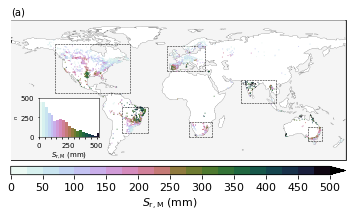

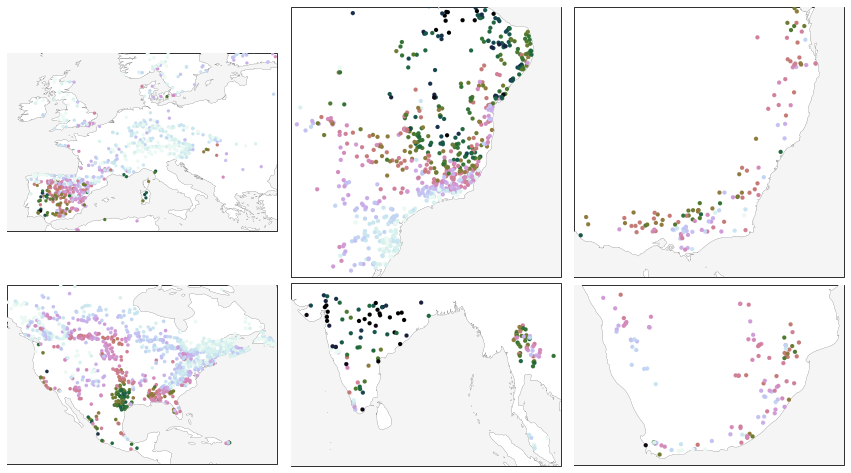

In [43]:
# sr memory method maps
cmap_rdbu1 = cm.get_cmap('cubehelix_r', 13)
cmap_rdbu1 = cmap_rdbu
bounds = np.linspace(0,500,21)
bounds2 = np.linspace(0,500,11)
norm = mpl.colors.BoundaryNorm(bounds, cmap_rdbu1.N)

fig2 = plt.figure(figsize=(6,6))
# plt.subplots_adjust(wspace=0000.1,hspace=-0.4)
ax = fig2.add_subplot(111,projection=ccrs.PlateCarree())
ax.coastlines(linewidth=0.1)
ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
ax.set_global()
ax.set_xlim(-180,180)
ax.set_ylim(-60,90)
s=ax.scatter(test_dfs.lon,test_dfs.lat,s=0.7,c=test_dfs['Sr_m'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu1,norm=norm,zorder=102)
# cbar = plt.colorbar(s, orientation='vertical',spacing='proportional',extend='both', pad=0.02,aspect=15, norm=norm,shrink=0.35)
cbar = plt.colorbar(s, orientation='horizontal',spacing='proportional',extend='max', pad=0.02,aspect=40,norm=norm)
cbar.set_label('$S_\mathrm{r,M}$ (mm)',size=11)
cbar.set_ticks(bounds2)
cbar.set_ticklabels(['0','50','100','150','200','250','300','350','400','450','500'],size=11)
ax.set_title('(a)',size=10,loc='left')
# cbar.set_ticklabels([f'-{int(mae_test_mean)}','0',f'{int(mae_test_mean)}'],size=7)

ax.plot([lon_min_a,lon_max_a],[lat_max_a,lat_max_a],'k--',zorder=101,linewidth=0.5)
ax.plot([lon_min_a,lon_max_a],[lat_min_a,lat_min_a],'k--',zorder=101,linewidth=0.5)
ax.plot([lon_min_a,lon_min_a],[lat_min_a,lat_max_a],'k--',zorder=101,linewidth=0.5)
ax.plot([lon_max_a,lon_max_a],[lat_min_a,lat_max_a],'k--',zorder=101,linewidth=0.5)

ax.plot([lon_min_e,lon_max_e],[lat_max_e,lat_max_e],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_min_e,lon_max_e],[lat_min_e,lat_min_e],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_min_e,lon_min_e],[lat_min_e,lat_max_e],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_max_e,lon_max_e],[lat_min_e,lat_max_e],'k--',linewidth=0.5,zorder=101)

ax.plot([lon_min_u,lon_max_u],[lat_max_u,lat_max_u],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_min_u,lon_max_u],[lat_min_u,lat_min_u],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_min_u,lon_min_u],[lat_min_u,lat_max_u],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_max_u,lon_max_u],[lat_min_u,lat_max_u],'k--',linewidth=0.5,zorder=101)

ax.plot([lon_min_s,lon_max_s],[lat_max_s,lat_max_s],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_min_s,lon_max_s],[lat_min_s,lat_min_s],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_min_s,lon_min_s],[lat_min_s,lat_max_s],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_max_s,lon_max_s],[lat_min_s,lat_max_s],'k--',linewidth=0.5,zorder=101)

ax.plot([lon_min_t,lon_max_t],[lat_max_t,lat_max_t],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_min_t,lon_max_t],[lat_min_t,lat_min_t],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_min_t,lon_min_t],[lat_min_t,lat_max_t],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_max_t,lon_max_t],[lat_min_t,lat_max_t],'k--',linewidth=0.5,zorder=101)

ax.plot([lon_min_f,lon_max_f],[lat_max_f,lat_max_f],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_min_f,lon_max_f],[lat_min_f,lat_min_f],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_min_f,lon_min_f],[lat_min_f,lat_max_f],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_max_f,lon_max_f],[lat_min_f,lat_max_f],'k--',linewidth=0.5,zorder=101)

iax = inset_axes(ax, width="18%", height="28%",loc=3,bbox_transform=ax.transAxes,bbox_to_anchor=(0.07,0.13,1,1))
n=[]
for i in range(len(bounds)):
    if (i<len(bounds)-1):
        nn = len(test_dfs[(test_dfs['Sr_m']<bounds[i+1])&(test_dfs['Sr_m']>=bounds[i])])
    else:
        nn=len(test_dfs[(test_dfs['Sr_m']>=bounds[i])])
    n.append(nn)
plt.setp(list(iax.spines.values()),linewidth=0.5)
bins=bounds
iax.bar([0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20],n,width=1,
        color=[cmap_rdbu1(0),cmap_rdbu1(1),cmap_rdbu1(2),cmap_rdbu1(3),cmap_rdbu1(4),cmap_rdbu1(5),cmap_rdbu1(6),cmap_rdbu1(7),cmap_rdbu1(8),cmap_rdbu1(9),cmap_rdbu1(10),
              cmap_rdbu1(11),cmap_rdbu1(12),cmap_rdbu1(13),cmap_rdbu1(14),cmap_rdbu1(15),cmap_rdbu1(16),cmap_rdbu1(17),cmap_rdbu1(18),cmap_rdbu1(19),cmap_rdbu1(20)])
iax.set_xticks(np.arange(-0.5,20,2))
iax.set_xticklabels(['0','','','','','250','','','','','500'])
iax.set_xlim(-0.5,20.5)
iax.set_yticks([0,250,500])
iax.set_yticklabels(['0','250','500'])
iax.set_xlabel('$S_\mathrm{r,M}$ (mm)',size=7,labelpad=1)
iax.set_ylabel('$n$',size=5,labelpad=1)
iax.tick_params(axis='both',length=1.5, labelsize=7)

fig2.savefig(f'{work_dir}/output/regression/figures/interpretation/sr_m_maps_{mod}.jpg',bbox_inches='tight',dpi=600)

fig2 = plt.figure(figsize=(15,10))
ax = fig2.add_subplot(231,projection=ccrs.PlateCarree())
plt.subplots_adjust(wspace=0.05,hspace=-0.25)
ax.coastlines(linewidth=0.1)
ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
ax.set_global()
ax.set_ylim(lat_min_e,lat_max_e)
ax.set_xlim(lon_min_e,lon_max_e)
# ax.text(lon_min_e+2,lat_max_e-3,f'MAD={int(dfrrt.mad_europe[0])}$\pm${np.round(dfrrt.mad_europe[1],1)} mm',size=14,zorder=101)
s=ax.scatter(test_dfs.lon,test_dfs.lat,s=10,c=test_dfs['Sr_m'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu1,norm=norm,zorder=101)
# ax.set_title('(b)',size=14,loc='left')

# fig2 = plt.figure(figsize=(6,6))
ax = fig2.add_subplot(232,projection=ccrs.PlateCarree())
ax.coastlines(linewidth=0.1)
ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
ax.set_global()
ax.set_ylim(lat_min_s,lat_max_s)
ax.set_xlim(lon_min_s,lon_max_s)
# ax.text(lon_max_s-14,lat_min_s+1,f'MAD={int(dfrrt.mad_southamerica[0])}$\pm${np.round(dfrrt.mad_southamerica[1],1)} mm',size=14,zorder=101)
s=ax.scatter(test_dfs.lon,test_dfs.lat,s=17,c=test_dfs['Sr_m'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu1,norm=norm,zorder=101)
# ax.set_title('(c)',size=14,loc='left')

# fig2 = plt.figure(figsize=(6,6))
ax = fig2.add_subplot(233,projection=ccrs.PlateCarree())
ax.coastlines(linewidth=0.1)
ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
ax.set_global()
ax.set_ylim(lat_min_t,lat_max_t)
ax.set_xlim(lon_min_t,lon_max_t)
# ax.text(lon_min_t+1,lat_max_t-1,f'MAD={int(dfrrt.mad_australia[0])}$\pm${np.round(dfrrt.mad_australia[1],1)} mm',size=14,zorder=101)
s=ax.scatter(test_dfs.lon,test_dfs.lat,s=17,c=test_dfs['Sr_m'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu1,norm=norm,zorder=101)
# ax.set_title('(d)',size=14,loc='left')

# fig2 = plt.figure(figsize=(6,6))
ax = fig2.add_subplot(234,projection=ccrs.PlateCarree())
ax.coastlines(linewidth=0.1)
ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
ax.set_global()
ax.set_ylim(lat_min_u,lat_max_u)
ax.set_xlim(lon_min_u,lon_max_u)
# ax.text(lon_min_u+2,lat_min_u+3,f'MAD={int(dfrrt.mad_northamerica[0])}$\pm${np.round(dfrrt.mad_northamerica[1],1)} mm',size=14,zorder=101)
s=ax.scatter(test_dfs.lon,test_dfs.lat,s=12,c=test_dfs['Sr_m'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu1,norm=norm,zorder=101)
# ax.set_title('(e)',size=14,loc='left')

# fig2 = plt.figure(figsize=(6,6))
ax = fig2.add_subplot(235,projection=ccrs.PlateCarree())
ax.coastlines(linewidth=0.1)
ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
ax.set_global()
ax.set_ylim(lat_min_a,lat_max_a)
ax.set_xlim(lon_min_a,lon_max_a)
# ax.text(lon_min_a+3,lat_min_a+2,f'MAD={int(dfrrt.mad_asia[0])}$\pm${np.round(dfrrt.mad_asia[1],1)} mm',size=14,zorder=101)
s=ax.scatter(test_dfs.lon,test_dfs.lat,s=17,c=test_dfs['Sr_m'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu1,norm=norm,zorder=101)
# ax.set_title('(f)',size=14,loc='left')

# fig2 = plt.figure(figsize=(6,6))
ax = fig2.add_subplot(236,projection=ccrs.PlateCarree())
ax.coastlines(linewidth=0.1)
ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
ax.set_global()
ax.set_ylim(lat_min_f,lat_max_f)
ax.set_xlim(lon_min_f,lon_max_f)
# ax.text(lon_max_f-13,lat_min_f+0.5,f'MAD={int(dfrrt.mad_southafrica[0])}$\pm${np.round(dfrrt.mad_southafrica[1],1)} mm',size=14,zorder=101)
s=ax.scatter(test_dfs.lon,test_dfs.lat,s=17,c=test_dfs['Sr_m'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu1,norm=norm,zorder=101)
# ax.set_title('(g)',size=14,loc='left')

fig2.savefig(f'{work_dir}/output/regression/figures/interpretation/sr_m_maps_zoomed2_{mod}.jpg',bbox_inches='tight',dpi=600)


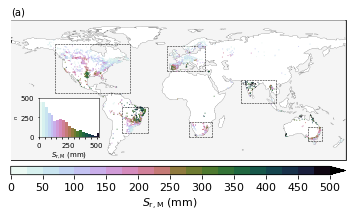

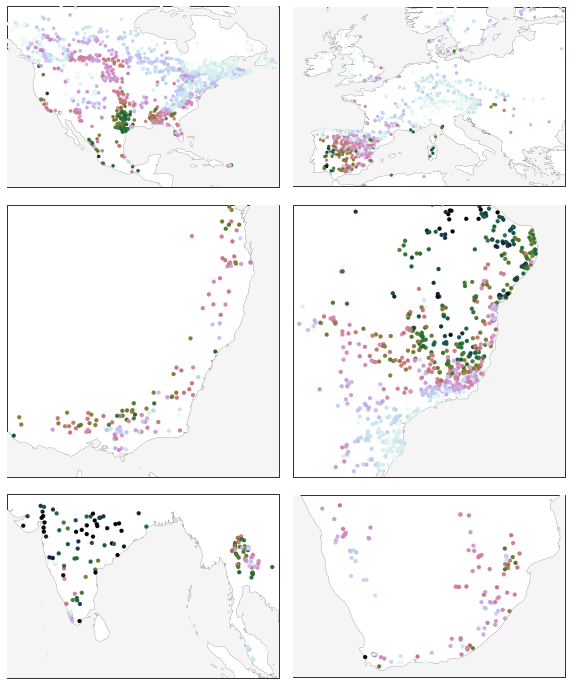

In [44]:
# sr memory method maps
cmap_rdbu1 = cm.get_cmap('cubehelix_r', 13)
cmap_rdbu1 = cmap_rdbu
bounds = np.linspace(0,500,21)
bounds2 = np.linspace(0,500,11)
norm = mpl.colors.BoundaryNorm(bounds, cmap_rdbu1.N)

fig2 = plt.figure(figsize=(6,6))
# plt.subplots_adjust(wspace=0000.1,hspace=-0.4)
ax = fig2.add_subplot(111,projection=ccrs.PlateCarree())
ax.coastlines(linewidth=0.1)
ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
ax.set_global()
ax.set_xlim(-180,180)
ax.set_ylim(-60,90)
s=ax.scatter(test_dfs.lon,test_dfs.lat,s=0.7,c=test_dfs['Sr_m'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu1,norm=norm,zorder=102)
# cbar = plt.colorbar(s, orientation='vertical',spacing='proportional',extend='both', pad=0.02,aspect=15, norm=norm,shrink=0.35)
cbar = plt.colorbar(s, orientation='horizontal',spacing='proportional',extend='max', pad=0.02,aspect=40,norm=norm)
cbar.set_label('$S_\mathrm{r,M}$ (mm)',size=11)
cbar.set_ticks(bounds2)
cbar.set_ticklabels(['0','50','100','150','200','250','300','350','400','450','500'],size=11)
ax.set_title('(a)',size=10,loc='left')
# cbar.set_ticklabels([f'-{int(mae_test_mean)}','0',f'{int(mae_test_mean)}'],size=7)

ax.plot([lon_min_a,lon_max_a],[lat_max_a,lat_max_a],'k--',zorder=101,linewidth=0.5)
ax.plot([lon_min_a,lon_max_a],[lat_min_a,lat_min_a],'k--',zorder=101,linewidth=0.5)
ax.plot([lon_min_a,lon_min_a],[lat_min_a,lat_max_a],'k--',zorder=101,linewidth=0.5)
ax.plot([lon_max_a,lon_max_a],[lat_min_a,lat_max_a],'k--',zorder=101,linewidth=0.5)

ax.plot([lon_min_e,lon_max_e],[lat_max_e,lat_max_e],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_min_e,lon_max_e],[lat_min_e,lat_min_e],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_min_e,lon_min_e],[lat_min_e,lat_max_e],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_max_e,lon_max_e],[lat_min_e,lat_max_e],'k--',linewidth=0.5,zorder=101)

ax.plot([lon_min_u,lon_max_u],[lat_max_u,lat_max_u],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_min_u,lon_max_u],[lat_min_u,lat_min_u],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_min_u,lon_min_u],[lat_min_u,lat_max_u],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_max_u,lon_max_u],[lat_min_u,lat_max_u],'k--',linewidth=0.5,zorder=101)

ax.plot([lon_min_s,lon_max_s],[lat_max_s,lat_max_s],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_min_s,lon_max_s],[lat_min_s,lat_min_s],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_min_s,lon_min_s],[lat_min_s,lat_max_s],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_max_s,lon_max_s],[lat_min_s,lat_max_s],'k--',linewidth=0.5,zorder=101)

ax.plot([lon_min_t,lon_max_t],[lat_max_t,lat_max_t],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_min_t,lon_max_t],[lat_min_t,lat_min_t],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_min_t,lon_min_t],[lat_min_t,lat_max_t],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_max_t,lon_max_t],[lat_min_t,lat_max_t],'k--',linewidth=0.5,zorder=101)

ax.plot([lon_min_f,lon_max_f],[lat_max_f,lat_max_f],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_min_f,lon_max_f],[lat_min_f,lat_min_f],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_min_f,lon_min_f],[lat_min_f,lat_max_f],'k--',linewidth=0.5,zorder=101)
ax.plot([lon_max_f,lon_max_f],[lat_min_f,lat_max_f],'k--',linewidth=0.5,zorder=101)

iax = inset_axes(ax, width="18%", height="28%",loc=3,bbox_transform=ax.transAxes,bbox_to_anchor=(0.07,0.13,1,1))
n=[]
for i in range(len(bounds)):
    if (i<len(bounds)-1):
        nn = len(test_dfs[(test_dfs['Sr_m']<bounds[i+1])&(test_dfs['Sr_m']>=bounds[i])])
    else:
        nn=len(test_dfs[(test_dfs['Sr_m']>=bounds[i])])
    n.append(nn)
plt.setp(list(iax.spines.values()),linewidth=0.5)
bins=bounds
iax.bar([0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20],n,width=1,
        color=[cmap_rdbu1(0),cmap_rdbu1(1),cmap_rdbu1(2),cmap_rdbu1(3),cmap_rdbu1(4),cmap_rdbu1(5),cmap_rdbu1(6),cmap_rdbu1(7),cmap_rdbu1(8),cmap_rdbu1(9),cmap_rdbu1(10),
              cmap_rdbu1(11),cmap_rdbu1(12),cmap_rdbu1(13),cmap_rdbu1(14),cmap_rdbu1(15),cmap_rdbu1(16),cmap_rdbu1(17),cmap_rdbu1(18),cmap_rdbu1(19),cmap_rdbu1(20)])
iax.set_xticks(np.arange(-0.5,20,2))
iax.set_xticklabels(['0','','','','','250','','','','','500'])
iax.set_xlim(-0.5,20.5)
iax.set_yticks([0,250,500])
iax.set_yticklabels(['0','250','500'])
iax.set_xlabel('$S_\mathrm{r,M}$ (mm)',size=7,labelpad=1)
iax.set_ylabel('$n$',size=5,labelpad=1)
iax.tick_params(axis='both',length=1.5, labelsize=7)

fig2.savefig(f'{work_dir}/output/regression/figures/interpretation/sr_m_maps_{mod}.jpg',bbox_inches='tight',dpi=600)

fig2 = plt.figure(figsize=(10,15))
ax = fig2.add_subplot(321,projection=ccrs.PlateCarree())
plt.subplots_adjust(wspace=0.05,hspace=-0.25)
ax.coastlines(linewidth=0.1)
ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
ax.set_global()
ax.set_ylim(lat_min_u,lat_max_u)
ax.set_xlim(lon_min_u,lon_max_u)
# ax.text(lon_min_u+2,lat_min_u+3,f'MAD={int(dfrrt.mad_northamerica[0])}$\pm${np.round(dfrrt.mad_northamerica[1],1)} mm',size=14,zorder=101)
s=ax.scatter(test_dfs.lon,test_dfs.lat,s=12,c=test_dfs['Sr_m'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu1,norm=norm,zorder=101)
# ax.set_title('(e)',size=14,loc='left')

# fig2 = plt.figure(figsize=(6,6))
ax = fig2.add_subplot(322,projection=ccrs.PlateCarree())
ax.coastlines(linewidth=0.1)
ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
ax.set_global()
ax.set_ylim(lat_min_e,lat_max_e)
ax.set_xlim(lon_min_e,lon_max_e)
# ax.text(lon_min_e+2,lat_max_e-3,f'MAD={int(dfrrt.mad_europe[0])}$\pm${np.round(dfrrt.mad_europe[1],1)} mm',size=14,zorder=101)
s=ax.scatter(test_dfs.lon,test_dfs.lat,s=10,c=test_dfs['Sr_m'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu1,norm=norm,zorder=101)
# ax.set_title('(b)',size=14,loc='left')


# fig2 = plt.figure(figsize=(6,6))
ax = fig2.add_subplot(323,projection=ccrs.PlateCarree())
ax.coastlines(linewidth=0.1)
ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
ax.set_global()
ax.set_ylim(lat_min_t,lat_max_t)
ax.set_xlim(lon_min_t,lon_max_t)
# ax.text(lon_min_t+1,lat_max_t-1,f'MAD={int(dfrrt.mad_australia[0])}$\pm${np.round(dfrrt.mad_australia[1],1)} mm',size=14,zorder=101)
s=ax.scatter(test_dfs.lon,test_dfs.lat,s=17,c=test_dfs['Sr_m'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu1,norm=norm,zorder=101)
# ax.set_title('(d)',size=14,loc='left')

# fig2 = plt.figure(figsize=(6,6))
ax = fig2.add_subplot(324,projection=ccrs.PlateCarree())
ax.coastlines(linewidth=0.1)
ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
ax.set_global()
ax.set_ylim(lat_min_s,lat_max_s)
ax.set_xlim(lon_min_s,lon_max_s)
# ax.text(lon_max_s-14,lat_min_s+1,f'MAD={int(dfrrt.mad_southamerica[0])}$\pm${np.round(dfrrt.mad_southamerica[1],1)} mm',size=14,zorder=101)
s=ax.scatter(test_dfs.lon,test_dfs.lat,s=17,c=test_dfs['Sr_m'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu1,norm=norm,zorder=101)
# ax.set_title('(c)',size=14,loc='left')

# fig2 = plt.figure(figsize=(6,6))
ax = fig2.add_subplot(325,projection=ccrs.PlateCarree())
ax.coastlines(linewidth=0.1)
ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
ax.set_global()
ax.set_ylim(lat_min_a,lat_max_a)
ax.set_xlim(lon_min_a,lon_max_a)
# ax.text(lon_min_a+3,lat_min_a+2,f'MAD={int(dfrrt.mad_asia[0])}$\pm${np.round(dfrrt.mad_asia[1],1)} mm',size=14,zorder=101)
s=ax.scatter(test_dfs.lon,test_dfs.lat,s=17,c=test_dfs['Sr_m'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu1,norm=norm,zorder=101)
# ax.set_title('(f)',size=14,loc='left')

# fig2 = plt.figure(figsize=(6,6))
ax = fig2.add_subplot(326,projection=ccrs.PlateCarree())
ax.coastlines(linewidth=0.1)
ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
ax.set_global()
ax.set_ylim(lat_min_f,lat_max_f)
ax.set_xlim(lon_min_f,lon_max_f)
# ax.text(lon_max_f-13,lat_min_f+0.5,f'MAD={int(dfrrt.mad_southafrica[0])}$\pm${np.round(dfrrt.mad_southafrica[1],1)} mm',size=14,zorder=101)
s=ax.scatter(test_dfs.lon,test_dfs.lat,s=17,c=test_dfs['Sr_m'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu1,norm=norm,zorder=101)
# ax.set_title('(g)',size=14,loc='left')

fig2.savefig(f'{work_dir}/output/regression/figures/interpretation/sr_m_maps_zoomed2_{mod}.jpg',bbox_inches='tight',dpi=600)


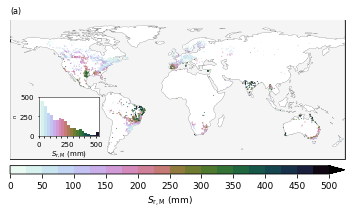

In [45]:
# sr memory method maps
cmap_rdbu1 = cm.get_cmap('cubehelix_r', 13)
cmap_rdbu1 = cmap_rdbu
bounds = np.linspace(0,500,21)
bounds2 = np.linspace(0,500,11)
norm = mpl.colors.BoundaryNorm(bounds, cmap_rdbu1.N)

fig2 = plt.figure(figsize=(6,6))
# plt.subplots_adjust(wspace=0000.1,hspace=-0.4)
ax = fig2.add_subplot(111,projection=ccrs.PlateCarree())
ax.coastlines(linewidth=0.1)
ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
ax.set_global()
ax.set_xlim(-180,180)
ax.set_ylim(-60,90)
s=ax.scatter(test_dfs.lon,test_dfs.lat,s=0.7,c=test_dfs['Sr_m'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu1,norm=norm,zorder=102)
# cbar = plt.colorbar(s, orientation='vertical',spacing='proportional',extend='both', pad=0.02,aspect=15, norm=norm,shrink=0.35)
cbar = plt.colorbar(s, orientation='horizontal',spacing='proportional',extend='max', pad=0.02,aspect=40,norm=norm)
cbar.set_label('$S_\mathrm{r,M}$ (mm)',size=9)
cbar.set_ticks(bounds2)
cbar.set_ticklabels(['0','50','100','150','200','250','300','350','400','450','500'],size=9)
ax.set_title('(a)',size=8,loc='left')
# cbar.set_ticklabels([f'-{int(mae_test_mean)}','0',f'{int(mae_test_mean)}'],size=7)

iax = inset_axes(ax, width="18%", height="28%",loc=3,bbox_transform=ax.transAxes,bbox_to_anchor=(0.07,0.13,1,1))
n=[]
for i in range(len(bounds)):
    if (i<len(bounds)-1):
        nn = len(test_dfs[(test_dfs['Sr_m']<bounds[i+1])&(test_dfs['Sr_m']>=bounds[i])])
    else:
        nn=len(test_dfs[(test_dfs['Sr_m']>=bounds[i])])
    n.append(nn)
plt.setp(list(iax.spines.values()),linewidth=0.5)
bins=bounds
iax.bar([0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20],n,width=1,
        color=[cmap_rdbu1(0),cmap_rdbu1(1),cmap_rdbu1(2),cmap_rdbu1(3),cmap_rdbu1(4),cmap_rdbu1(5),cmap_rdbu1(6),cmap_rdbu1(7),cmap_rdbu1(8),cmap_rdbu1(9),cmap_rdbu1(10),
              cmap_rdbu1(11),cmap_rdbu1(12),cmap_rdbu1(13),cmap_rdbu1(14),cmap_rdbu1(15),cmap_rdbu1(16),cmap_rdbu1(17),cmap_rdbu1(18),cmap_rdbu1(19),cmap_rdbu1(20)])
iax.set_xticks(np.arange(-0.5,20,2))
iax.set_xticklabels(['0','','','','','250','','','','','500'])
iax.set_xlim(-0.5,20.5)
iax.set_yticks([0,250,500])
iax.set_yticklabels(['0','250','500'])
iax.set_xlabel('$S_\mathrm{r,M}$ (mm)',size=7,labelpad=1)
iax.set_ylabel('$n$',size=5,labelpad=1)
iax.tick_params(axis='both',length=1.5, labelsize=7)

fig2.savefig(f'{work_dir}/output/regression/figures/interpretation/sr_m_maps_{mod}.jpg',bbox_inches='tight',dpi=600)


In [46]:
# import matplotlib
# cmap = cm.get_cmap('cubehelix_r',12)
# color_list = [matplotlib.colors.rgb2hex(cmap(i)[:3]) for i in range(cmap.N)]
# cmap_rdbu = ListedColormap(color_list[1:-1])
# cmap_rdbu.set_over(color_list[-1])
# cmap_rdbu.set_under(color_list[0])
# cmap_rdbu

# # sr predicted maps
# cmap_rdbu1 = cm.get_cmap('cubehelix_r', 13)
# cmap_rdbu1 = cmap_rdbu
# bounds = np.linspace(0,500,11)
# bounds2 = np.linspace(0,500,11)
# norm = mpl.colors.BoundaryNorm(bounds, cmap_rdbu1.N)

# fig2 = plt.figure(figsize=(6,6))
# # plt.subplots_adjust(wspace=0000.1,hspace=-0.4)
# ax = fig2.add_subplot(111,projection=ccrs.PlateCarree())
# ax.coastlines(linewidth=0.1)
# ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
# ax.set_global()
# ax.set_xlim(-180,180)
# ax.set_ylim(-60,90)
# s=ax.scatter(test_dfs.lon,test_dfs.lat,s=0.7,c=test_dfs['Sr_p'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu1,norm=norm,zorder=102)
# # cbar = plt.colorbar(s, orientation='vertical',spacing='proportional',extend='both', pad=0.02,aspect=15, norm=norm,shrink=0.35)
# cbar = plt.colorbar(s, orientation='horizontal',spacing='proportional',extend='max', pad=0.02,aspect=40,norm=norm)
# cbar.set_label('$S_\mathrm{r,P}$ (mm)',size=11)
# cbar.set_ticks(bounds2)
# cbar.set_ticklabels(['0','50','100','150','200','250','300','350','400','450','500'],size=11)
# ax.set_title('(a)',size=10,loc='left')
# # cbar.set_ticklabels([f'-{int(mae_test_mean)}','0',f'{int(mae_test_mean)}'],size=7)

# ax.plot([lon_min_a,lon_max_a],[lat_max_a,lat_max_a],'k--',zorder=101,linewidth=0.5)
# ax.plot([lon_min_a,lon_max_a],[lat_min_a,lat_min_a],'k--',zorder=101,linewidth=0.5)
# ax.plot([lon_min_a,lon_min_a],[lat_min_a,lat_max_a],'k--',zorder=101,linewidth=0.5)
# ax.plot([lon_max_a,lon_max_a],[lat_min_a,lat_max_a],'k--',zorder=101,linewidth=0.5)

# ax.plot([lon_min_e,lon_max_e],[lat_max_e,lat_max_e],'k--',linewidth=0.5,zorder=101)
# ax.plot([lon_min_e,lon_max_e],[lat_min_e,lat_min_e],'k--',linewidth=0.5,zorder=101)
# ax.plot([lon_min_e,lon_min_e],[lat_min_e,lat_max_e],'k--',linewidth=0.5,zorder=101)
# ax.plot([lon_max_e,lon_max_e],[lat_min_e,lat_max_e],'k--',linewidth=0.5,zorder=101)

# ax.plot([lon_min_u,lon_max_u],[lat_max_u,lat_max_u],'k--',linewidth=0.5,zorder=101)
# ax.plot([lon_min_u,lon_max_u],[lat_min_u,lat_min_u],'k--',linewidth=0.5,zorder=101)
# ax.plot([lon_min_u,lon_min_u],[lat_min_u,lat_max_u],'k--',linewidth=0.5,zorder=101)
# ax.plot([lon_max_u,lon_max_u],[lat_min_u,lat_max_u],'k--',linewidth=0.5,zorder=101)

# ax.plot([lon_min_s,lon_max_s],[lat_max_s,lat_max_s],'k--',linewidth=0.5,zorder=101)
# ax.plot([lon_min_s,lon_max_s],[lat_min_s,lat_min_s],'k--',linewidth=0.5,zorder=101)
# ax.plot([lon_min_s,lon_min_s],[lat_min_s,lat_max_s],'k--',linewidth=0.5,zorder=101)
# ax.plot([lon_max_s,lon_max_s],[lat_min_s,lat_max_s],'k--',linewidth=0.5,zorder=101)

# ax.plot([lon_min_t,lon_max_t],[lat_max_t,lat_max_t],'k--',linewidth=0.5,zorder=101)
# ax.plot([lon_min_t,lon_max_t],[lat_min_t,lat_min_t],'k--',linewidth=0.5,zorder=101)
# ax.plot([lon_min_t,lon_min_t],[lat_min_t,lat_max_t],'k--',linewidth=0.5,zorder=101)
# ax.plot([lon_max_t,lon_max_t],[lat_min_t,lat_max_t],'k--',linewidth=0.5,zorder=101)

# ax.plot([lon_min_f,lon_max_f],[lat_max_f,lat_max_f],'k--',linewidth=0.5,zorder=101)
# ax.plot([lon_min_f,lon_max_f],[lat_min_f,lat_min_f],'k--',linewidth=0.5,zorder=101)
# ax.plot([lon_min_f,lon_min_f],[lat_min_f,lat_max_f],'k--',linewidth=0.5,zorder=101)
# ax.plot([lon_max_f,lon_max_f],[lat_min_f,lat_max_f],'k--',linewidth=0.5,zorder=101)

# iax = inset_axes(ax, width="18%", height="28%",loc=3,bbox_transform=ax.transAxes,bbox_to_anchor=(0.07,0.13,1,1))
# n1=len(test_dfs[(test_dfs['Sr_p']<bounds[1])&(test_dfs['Sr_p']>=bounds[0])])
# n2=len(test_dfs[(test_dfs['Sr_p']<bounds[2])&(test_dfs['Sr_p']>=bounds[1])])
# n3=len(test_dfs[(test_dfs['Sr_p']<bounds[3])&(test_dfs['Sr_p']>=bounds[2])])
# n4=len(test_dfs[(test_dfs['Sr_p']<bounds[4])&(test_dfs['Sr_p']>=bounds[3])])
# n5=len(test_dfs[(test_dfs['Sr_p']<bounds[5])&(test_dfs['Sr_p']>=bounds[4])])
# n6=len(test_dfs[(test_dfs['Sr_p']<bounds[6])&(test_dfs['Sr_p']>=bounds[5])])
# n7=len(test_dfs[(test_dfs['Sr_p']<bounds[7])&(test_dfs['Sr_p']>=bounds[6])])
# n8=len(test_dfs[(test_dfs['Sr_p']<bounds[8])&(test_dfs['Sr_p']>=bounds[7])])
# n9=len(test_dfs[(test_dfs['Sr_p']<bounds[9])&(test_dfs['Sr_p']>=bounds[8])])
# n10=len(test_dfs[(test_dfs['Sr_p']<bounds[10])&(test_dfs['Sr_p']>=bounds[9])])
# n11=len(test_dfs[(test_dfs['Sr_p']>=bounds[10])])
# n = [n1,n2,n3,n4,n5,n6,n7,n8,n9,n10,n11]
# plt.setp(list(iax.spines.values()),linewidth=0.5)
# bins=bounds
# iax.bar([0,1,2,3,4,5,6,7,8,9,10],n,width=1,color=[cmap_rdbu1(0),cmap_rdbu1(1),cmap_rdbu1(2),cmap_rdbu1(3),cmap_rdbu1(4),cmap_rdbu1(5),cmap_rdbu1(6),cmap_rdbu1(7),cmap_rdbu1(8),cmap_rdbu1(9),cmap_rdbu1(10)])
# iax.set_xticks([-0.5,0.5,1.5,2.5,3.5,4.5,5.5,6.5,7.5,8.5,9.5])
# iax.set_xticklabels(['0','','','','','250','','','','','500'])
# iax.set_xlim(-0.5,10.5)
# iax.set_yticks([0,250,500,750,1000])
# iax.set_yticklabels(['0','','500','',''])
# iax.set_xlabel('$S_\mathrm{r,P}$ (mm)',size=7,labelpad=1)
# iax.set_ylabel('$n$',size=5,labelpad=1)
# iax.tick_params(axis='both',length=1.5, labelsize=7)

# fig2.savefig(f'{work_dir}/output/regression/figures/interpretation/sr_p_maps_{mod}.jpg',bbox_inches='tight',dpi=300)

# fig2 = plt.figure(figsize=(15,10))
# ax = fig2.add_subplot(231,projection=ccrs.PlateCarree())
# plt.subplots_adjust(wspace=0.05,hspace=-0.25)
# ax.coastlines(linewidth=0.1)
# ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
# ax.set_global()
# ax.set_ylim(lat_min_e,lat_max_e)
# ax.set_xlim(lon_min_e,lon_max_e)
# # ax.text(lon_min_e+2,lat_max_e-3,f'MAD={int(dfrrt.mad_europe[0])}$\pm${np.round(dfrrt.mad_europe[1],1)} mm',size=14,zorder=101)
# s=ax.scatter(test_dfs.lon,test_dfs.lat,s=10,c=test_dfs['Sr_p'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu1,norm=norm,zorder=101)
# # ax.set_title('(b)',size=14,loc='left')

# # fig2 = plt.figure(figsize=(6,6))
# ax = fig2.add_subplot(232,projection=ccrs.PlateCarree())
# ax.coastlines(linewidth=0.1)
# ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
# ax.set_global()
# ax.set_ylim(lat_min_s,lat_max_s)
# ax.set_xlim(lon_min_s,lon_max_s)
# # ax.text(lon_max_s-14,lat_min_s+1,f'MAD={int(dfrrt.mad_southamerica[0])}$\pm${np.round(dfrrt.mad_southamerica[1],1)} mm',size=14,zorder=101)
# s=ax.scatter(test_dfs.lon,test_dfs.lat,s=17,c=test_dfs['Sr_p'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu1,norm=norm,zorder=101)
# # ax.set_title('(c)',size=14,loc='left')

# # fig2 = plt.figure(figsize=(6,6))
# ax = fig2.add_subplot(233,projection=ccrs.PlateCarree())
# ax.coastlines(linewidth=0.1)
# ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
# ax.set_global()
# ax.set_ylim(lat_min_t,lat_max_t)
# ax.set_xlim(lon_min_t,lon_max_t)
# # ax.text(lon_min_t+1,lat_max_t-1,f'MAD={int(dfrrt.mad_australia[0])}$\pm${np.round(dfrrt.mad_australia[1],1)} mm',size=14,zorder=101)
# s=ax.scatter(test_dfs.lon,test_dfs.lat,s=17,c=test_dfs['Sr_p'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu1,norm=norm,zorder=101)
# # ax.set_title('(d)',size=14,loc='left')

# # fig2 = plt.figure(figsize=(6,6))
# ax = fig2.add_subplot(234,projection=ccrs.PlateCarree())
# ax.coastlines(linewidth=0.1)
# ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
# ax.set_global()
# ax.set_ylim(lat_min_u,lat_max_u)
# ax.set_xlim(lon_min_u,lon_max_u)
# # ax.text(lon_min_u+2,lat_min_u+3,f'MAD={int(dfrrt.mad_northamerica[0])}$\pm${np.round(dfrrt.mad_northamerica[1],1)} mm',size=14,zorder=101)
# s=ax.scatter(test_dfs.lon,test_dfs.lat,s=12,c=test_dfs['Sr_p'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu1,norm=norm,zorder=101)
# # ax.set_title('(e)',size=14,loc='left')

# # fig2 = plt.figure(figsize=(6,6))
# ax = fig2.add_subplot(235,projection=ccrs.PlateCarree())
# ax.coastlines(linewidth=0.1)
# ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
# ax.set_global()
# ax.set_ylim(lat_min_a,lat_max_a)
# ax.set_xlim(lon_min_a,lon_max_a)
# # ax.text(lon_min_a+3,lat_min_a+2,f'MAD={int(dfrrt.mad_asia[0])}$\pm${np.round(dfrrt.mad_asia[1],1)} mm',size=14,zorder=101)
# s=ax.scatter(test_dfs.lon,test_dfs.lat,s=17,c=test_dfs['Sr_p'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu1,norm=norm,zorder=101)
# # ax.set_title('(f)',size=14,loc='left')

# # fig2 = plt.figure(figsize=(6,6))
# ax = fig2.add_subplot(236,projection=ccrs.PlateCarree())
# ax.coastlines(linewidth=0.1)
# ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
# ax.set_global()
# ax.set_ylim(lat_min_f,lat_max_f)
# ax.set_xlim(lon_min_f,lon_max_f)
# # ax.text(lon_max_f-13,lat_min_f+0.5,f'MAD={int(dfrrt.mad_southafrica[0])}$\pm${np.round(dfrrt.mad_southafrica[1],1)} mm',size=14,zorder=101)
# s=ax.scatter(test_dfs.lon,test_dfs.lat,s=17,c=test_dfs['Sr_p'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu1,norm=norm,zorder=101)
# # ax.set_title('(g)',size=14,loc='left')

# fig2.savefig(f'{work_dir}/output/regression/figures/interpretation/sr_p_maps_zoomed2_{mod}.jpg',bbox_inches='tight',dpi=300)


In [47]:
# # sr memory method maps
# cmap_rdbu1 = cm.get_cmap('cubehelix_r', 13)
# cmap_rdbu1 = cmap_rdbu
# bounds = np.linspace(0,500,21)
# bounds2 = np.linspace(0,500,11)
# norm = mpl.colors.BoundaryNorm(bounds, cmap_rdbu1.N)

# fig2 = plt.figure(figsize=(6,6))
# # plt.subplots_adjust(wspace=0000.1,hspace=-0.4)
# ax = fig2.add_subplot(111,projection=ccrs.PlateCarree())
# ax.coastlines(linewidth=0.1)
# ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
# ax.set_global()
# ax.set_xlim(-180,180)
# ax.set_ylim(-60,90)
# s=ax.scatter(test_dfs.lon,test_dfs.lat,s=0.7,c=test_dfs['Sr_m'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu1,norm=norm,zorder=102)
# # cbar = plt.colorbar(s, orientation='vertical',spacing='proportional',extend='both', pad=0.02,aspect=15, norm=norm,shrink=0.35)
# cbar = plt.colorbar(s, orientation='horizontal',spacing='proportional',extend='max', pad=0.02,aspect=40,norm=norm)
# cbar.set_label('$S_\mathrm{r,M}$ (mm)',size=11)
# cbar.set_ticks(bounds2)
# cbar.set_ticklabels(['0','50','100','150','200','250','300','350','400','450','500'],size=11)
# ax.set_title('(a)',size=10,loc='left')
# # cbar.set_ticklabels([f'-{int(mae_test_mean)}','0',f'{int(mae_test_mean)}'],size=7)

# ax.plot([lon_min_a,lon_max_a],[lat_max_a,lat_max_a],'k--',zorder=101,linewidth=0.5)
# ax.plot([lon_min_a,lon_max_a],[lat_min_a,lat_min_a],'k--',zorder=101,linewidth=0.5)
# ax.plot([lon_min_a,lon_min_a],[lat_min_a,lat_max_a],'k--',zorder=101,linewidth=0.5)
# ax.plot([lon_max_a,lon_max_a],[lat_min_a,lat_max_a],'k--',zorder=101,linewidth=0.5)

# ax.plot([lon_min_e,lon_max_e],[lat_max_e,lat_max_e],'k--',linewidth=0.5,zorder=101)
# ax.plot([lon_min_e,lon_max_e],[lat_min_e,lat_min_e],'k--',linewidth=0.5,zorder=101)
# ax.plot([lon_min_e,lon_min_e],[lat_min_e,lat_max_e],'k--',linewidth=0.5,zorder=101)
# ax.plot([lon_max_e,lon_max_e],[lat_min_e,lat_max_e],'k--',linewidth=0.5,zorder=101)

# ax.plot([lon_min_u,lon_max_u],[lat_max_u,lat_max_u],'k--',linewidth=0.5,zorder=101)
# ax.plot([lon_min_u,lon_max_u],[lat_min_u,lat_min_u],'k--',linewidth=0.5,zorder=101)
# ax.plot([lon_min_u,lon_min_u],[lat_min_u,lat_max_u],'k--',linewidth=0.5,zorder=101)
# ax.plot([lon_max_u,lon_max_u],[lat_min_u,lat_max_u],'k--',linewidth=0.5,zorder=101)

# ax.plot([lon_min_s,lon_max_s],[lat_max_s,lat_max_s],'k--',linewidth=0.5,zorder=101)
# ax.plot([lon_min_s,lon_max_s],[lat_min_s,lat_min_s],'k--',linewidth=0.5,zorder=101)
# ax.plot([lon_min_s,lon_min_s],[lat_min_s,lat_max_s],'k--',linewidth=0.5,zorder=101)
# ax.plot([lon_max_s,lon_max_s],[lat_min_s,lat_max_s],'k--',linewidth=0.5,zorder=101)

# ax.plot([lon_min_t,lon_max_t],[lat_max_t,lat_max_t],'k--',linewidth=0.5,zorder=101)
# ax.plot([lon_min_t,lon_max_t],[lat_min_t,lat_min_t],'k--',linewidth=0.5,zorder=101)
# ax.plot([lon_min_t,lon_min_t],[lat_min_t,lat_max_t],'k--',linewidth=0.5,zorder=101)
# ax.plot([lon_max_t,lon_max_t],[lat_min_t,lat_max_t],'k--',linewidth=0.5,zorder=101)

# ax.plot([lon_min_f,lon_max_f],[lat_max_f,lat_max_f],'k--',linewidth=0.5,zorder=101)
# ax.plot([lon_min_f,lon_max_f],[lat_min_f,lat_min_f],'k--',linewidth=0.5,zorder=101)
# ax.plot([lon_min_f,lon_min_f],[lat_min_f,lat_max_f],'k--',linewidth=0.5,zorder=101)
# ax.plot([lon_max_f,lon_max_f],[lat_min_f,lat_max_f],'k--',linewidth=0.5,zorder=101)

# iax = inset_axes(ax, width="18%", height="28%",loc=3,bbox_transform=ax.transAxes,bbox_to_anchor=(0.07,0.13,1,1))
# n1=len(test_dfs[(test_dfs['Sr_m']<bounds[1])&(test_dfs['Sr_m']>=bounds[0])])
# n2=len(test_dfs[(test_dfs['Sr_m']<bounds[2])&(test_dfs['Sr_m']>=bounds[1])])
# n3=len(test_dfs[(test_dfs['Sr_m']<bounds[3])&(test_dfs['Sr_m']>=bounds[2])])
# n4=len(test_dfs[(test_dfs['Sr_m']<bounds[4])&(test_dfs['Sr_m']>=bounds[3])])
# n5=len(test_dfs[(test_dfs['Sr_m']<bounds[5])&(test_dfs['Sr_m']>=bounds[4])])
# n6=len(test_dfs[(test_dfs['Sr_m']<bounds[6])&(test_dfs['Sr_m']>=bounds[5])])
# n7=len(test_dfs[(test_dfs['Sr_m']<bounds[7])&(test_dfs['Sr_m']>=bounds[6])])
# n8=len(test_dfs[(test_dfs['Sr_m']<bounds[8])&(test_dfs['Sr_m']>=bounds[7])])
# n9=len(test_dfs[(test_dfs['Sr_m']<bounds[9])&(test_dfs['Sr_m']>=bounds[8])])
# n10=len(test_dfs[(test_dfs['Sr_m']<bounds[10])&(test_dfs['Sr_m']>=bounds[9])])
# n11=len(test_dfs[(test_dfs['Sr_m']>=bounds[10])])
# n = [n1,n2,n3,n4,n5,n6,n7,n8,n9,n10,n11]
# plt.setp(list(iax.spines.values()),linewidth=0.5)
# bins=bounds
# iax.bar([0,1,2,3,4,5,6,7,8,9,10],n,width=1,color=[cmap_rdbu1(0),cmap_rdbu1(1),cmap_rdbu1(2),cmap_rdbu1(3),cmap_rdbu1(4),cmap_rdbu1(5),cmap_rdbu1(6),cmap_rdbu1(7),cmap_rdbu1(8),cmap_rdbu1(9),cmap_rdbu1(10)])
# iax.set_xticks([-0.5,0.5,1.5,2.5,3.5,4.5,5.5,6.5,7.5,8.5,9.5])
# iax.set_xticklabels(['0','','','','','250','','','','','500'])
# iax.set_yticks([0,250,500,750,1000])
# iax.set_yticklabels(['0','','500','',''])
# iax.set_xlim(-0.5,10.5)
# iax.set_xlabel('$S_\mathrm{r,M}$ (mm)',size=7,labelpad=1)
# iax.set_ylabel('$n$',size=5,labelpad=1)
# iax.tick_params(axis='both',length=1.5, labelsize=7)

# fig2.savefig(f'{work_dir}/output/regression/figures/interpretation/sr_m_maps_{mod}.jpg',bbox_inches='tight',dpi=300)

# fig2 = plt.figure(figsize=(15,10))
# ax = fig2.add_subplot(231,projection=ccrs.PlateCarree())
# plt.subplots_adjust(wspace=0.05,hspace=-0.25)
# ax.coastlines(linewidth=0.1)
# ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
# ax.set_global()
# ax.set_ylim(lat_min_e,lat_max_e)
# ax.set_xlim(lon_min_e,lon_max_e)
# # ax.text(lon_min_e+2,lat_max_e-3,f'MAD={int(dfrrt.mad_europe[0])}$\pm${np.round(dfrrt.mad_europe[1],1)} mm',size=14,zorder=101)
# s=ax.scatter(test_dfs.lon,test_dfs.lat,s=10,c=test_dfs['Sr_m'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu1,norm=norm,zorder=101)
# # ax.set_title('(b)',size=14,loc='left')

# # fig2 = plt.figure(figsize=(6,6))
# ax = fig2.add_subplot(232,projection=ccrs.PlateCarree())
# ax.coastlines(linewidth=0.1)
# ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
# ax.set_global()
# ax.set_ylim(lat_min_s,lat_max_s)
# ax.set_xlim(lon_min_s,lon_max_s)
# # ax.text(lon_max_s-14,lat_min_s+1,f'MAD={int(dfrrt.mad_southamerica[0])}$\pm${np.round(dfrrt.mad_southamerica[1],1)} mm',size=14,zorder=101)
# s=ax.scatter(test_dfs.lon,test_dfs.lat,s=17,c=test_dfs['Sr_m'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu1,norm=norm,zorder=101)
# # ax.set_title('(c)',size=14,loc='left')

# # fig2 = plt.figure(figsize=(6,6))
# ax = fig2.add_subplot(233,projection=ccrs.PlateCarree())
# ax.coastlines(linewidth=0.1)
# ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
# ax.set_global()
# ax.set_ylim(lat_min_t,lat_max_t)
# ax.set_xlim(lon_min_t,lon_max_t)
# # ax.text(lon_min_t+1,lat_max_t-1,f'MAD={int(dfrrt.mad_australia[0])}$\pm${np.round(dfrrt.mad_australia[1],1)} mm',size=14,zorder=101)
# s=ax.scatter(test_dfs.lon,test_dfs.lat,s=17,c=test_dfs['Sr_m'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu1,norm=norm,zorder=101)
# # ax.set_title('(d)',size=14,loc='left')

# # fig2 = plt.figure(figsize=(6,6))
# ax = fig2.add_subplot(234,projection=ccrs.PlateCarree())
# ax.coastlines(linewidth=0.1)
# ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
# ax.set_global()
# ax.set_ylim(lat_min_u,lat_max_u)
# ax.set_xlim(lon_min_u,lon_max_u)
# # ax.text(lon_min_u+2,lat_min_u+3,f'MAD={int(dfrrt.mad_northamerica[0])}$\pm${np.round(dfrrt.mad_northamerica[1],1)} mm',size=14,zorder=101)
# s=ax.scatter(test_dfs.lon,test_dfs.lat,s=12,c=test_dfs['Sr_m'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu1,norm=norm,zorder=101)
# # ax.set_title('(e)',size=14,loc='left')

# # fig2 = plt.figure(figsize=(6,6))
# ax = fig2.add_subplot(235,projection=ccrs.PlateCarree())
# ax.coastlines(linewidth=0.1)
# ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
# ax.set_global()
# ax.set_ylim(lat_min_a,lat_max_a)
# ax.set_xlim(lon_min_a,lon_max_a)
# # ax.text(lon_min_a+3,lat_min_a+2,f'MAD={int(dfrrt.mad_asia[0])}$\pm${np.round(dfrrt.mad_asia[1],1)} mm',size=14,zorder=101)
# s=ax.scatter(test_dfs.lon,test_dfs.lat,s=17,c=test_dfs['Sr_m'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu1,norm=norm,zorder=101)
# # ax.set_title('(f)',size=14,loc='left')

# # fig2 = plt.figure(figsize=(6,6))
# ax = fig2.add_subplot(236,projection=ccrs.PlateCarree())
# ax.coastlines(linewidth=0.1)
# ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
# ax.set_global()
# ax.set_ylim(lat_min_f,lat_max_f)
# ax.set_xlim(lon_min_f,lon_max_f)
# # ax.text(lon_max_f-13,lat_min_f+0.5,f'MAD={int(dfrrt.mad_southafrica[0])}$\pm${np.round(dfrrt.mad_southafrica[1],1)} mm',size=14,zorder=101)
# s=ax.scatter(test_dfs.lon,test_dfs.lat,s=17,c=test_dfs['Sr_m'],edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu1,norm=norm,zorder=101)
# # ax.set_title('(g)',size=14,loc='left')

# fig2.savefig(f'{work_dir}/output/regression/figures/interpretation/sr_m_maps_zoomed2_{mod}.jpg',bbox_inches='tight',dpi=300)


## ICE plots - test results 5 cvs

In [42]:
# combine all cv's train and test results
grid_resolution=50
ps = []
ics = []
for i in range(5):
    train_ix = cv_train_ix[i]
    test_ix = cv_test_ix[i]

    X_train = dfx[train_ix]
    y_train = dfy[train_ix]
    X_test = dfx[test_ix]
    y_test = dfy[test_ix]

    # save lat lon columns
    lat_train = X_train[:,-3]
    lon_train = X_train[:,-2]
    lat_test = X_test[:,-3]
    lon_test = X_test[:,-2]
    catch_id_train = X_train[:,-1]
    catch_id_test = X_test[:,-1]
    # remove lat lon columns
    X_train = np.delete(X_train,-1,1)
    X_train = np.delete(X_train,-1,1)
    X_train = np.delete(X_train,-1,1)
    X_test = np.delete(X_test,-1,1)
    X_test = np.delete(X_test,-1,1)
    X_test = np.delete(X_test,-1,1)

    rf = RandomForestRegressor(criterion='absolute_error',random_state=42,min_samples_leaf=min_samples_leaf,max_depth=max_depth)
    # rf = RandomForestRegressor(criterion='squared_error',random_state=42,min_samples_leaf=min_samples_leaf,max_depth=max_depth,oob_score=True)
    rf = rf.fit(X_train, y_train)
    train_y_pred = rf.predict(X_train)
    test_y_pred = rf.predict(X_test)
    df_train = pd.DataFrame(index=catch_id_train,columns=['lat','lon','Sr_m','Sr_p','Sr_p-Sr_m','(Sr_p-Sr_m)/Sr_m'])
    df_train['lat'] = lat_train
    df_train['lon'] = lon_train
    df_train['Sr_m'] = y_train
    df_train['Sr_p'] = train_y_pred
    df_train['Sr_p-Sr_m'] = train_y_pred - y_train
    df_train['(Sr_p-Sr_m)/Sr_m'] = (train_y_pred - y_train)/train_y_pred

    df_test = pd.DataFrame(index=catch_id_test,columns=['lat','lon','Sr_m','Sr_p','Sr_p-Sr_m','(Sr_p-Sr_m)/Sr_m'])
    df_test['lat'] = lat_test
    df_test['lon'] = lon_test
    df_test['Sr_m'] = y_test
    df_test['Sr_p'] = test_y_pred
    df_test['Sr_p-Sr_m'] = test_y_pred - y_test
    df_test['(Sr_p-Sr_m)/Sr_m'] = (test_y_pred - y_test)/test_y_pred
    
    pdps=[]
    ices=[]
    for k in range(len(features)):
        a = partial_dependence(rf, features=[k], X=X_test, percentiles=(0.05, 0.95),grid_resolution=grid_resolution, kind='both')
        # a = partial_dependence(rf, features=[k], X=X_test, percentiles=(0, 1),grid_resolution=grid_resolution, kind='both')
        pdpp = pd.DataFrame(index=['average'],data=a['average'],columns=a['values'][0])
        ice = pd.DataFrame(index=df_test.index, data=a['individual'][0],columns=a['values'][0])
        med = pd.DataFrame(index=['median'],data=np.median(a['individual'][0],axis=0).reshape(1,50),columns=a['values'][0])
        p10 = pd.DataFrame(index=['p10'],data=np.quantile(a['individual'][0],0.1,axis=0).reshape(1,50),columns=a['values'][0])
        p90 = pd.DataFrame(index=['p90'],data=np.quantile(a['individual'][0],0.9,axis=0).reshape(1,50),columns=a['values'][0])
        pdp = pd.concat([pdpp,med,p10,p90])
        pdps.append(pdp)
        ices.append(ice)
    ps.append(pdps)
    ics.append(ices)

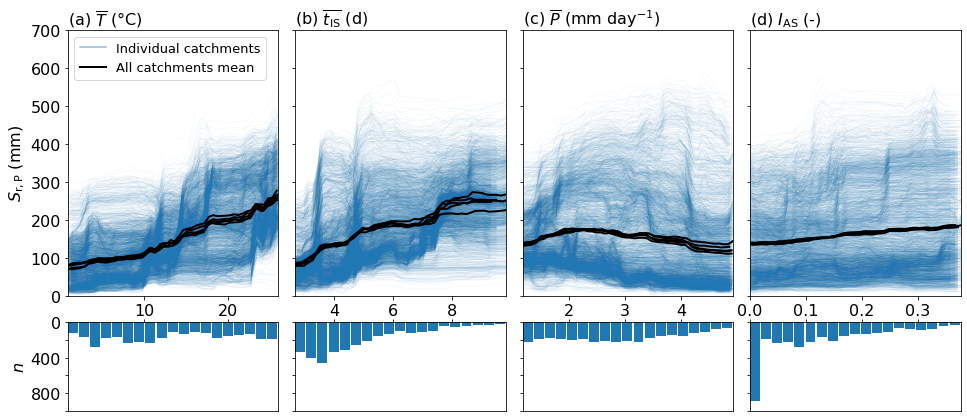

In [43]:
# figure with 0.05 - 0.95 and limited x axis
var = ['$\overline{T}$','$\overline{t_\mathrm{IS}}$','$\overline{P}$','$I_\mathrm{AS}$']
units = ['$\degree$C','d','mm $\mathrm{day}^{-1}$','-']
abcd = ['(a)','(b)','(c)','(d)']

# plot pdp TEST ALL CVS COMBINED
X = np.concatenate([X_train,X_test])
ddf = pd.concat([df_train,df_test])
fig3, ax = plt.subplots(2,len(features), figsize=(16,7),gridspec_kw={'height_ratios': [3, 1]})
plt.subplots_adjust(hspace=0.15,wspace=0.08)
for k in range(len(features)):
    ice0 = ics[0][k]
    ice1 = ics[1][k]
    ice2 = ics[2][k]
    ice3 = ics[3][k]
    ice4 = ics[4][k]
    
    pdp0 = ps[0][k]
    pdp1 = ps[1][k]
    pdp2 = ps[2][k]
    pdp3 = ps[3][k]
    pdp4 = ps[4][k]

    c = 'tab:blue'
    for i in ice0.index:
        ax[0,k].plot(ice0.columns.values, ice0.loc[i],color=c,alpha=0.5,linestyle='-',linewidth=0.05)
    for i in ice1.index:
        ax[0,k].plot(ice1.columns.values, ice1.loc[i],color=c,alpha=0.5,linestyle='-',linewidth=0.05)
    for i in ice2.index:
        ax[0,k].plot(ice2.columns.values, ice2.loc[i],color=c,alpha=0.5,linestyle='-',linewidth=0.05)
    for i in ice3.index:
        ax[0,k].plot(ice3.columns.values, ice3.loc[i],color=c,alpha=0.5,linestyle='-',linewidth=0.05)
    for i in ice4.index:
        ax[0,k].plot(ice4.columns.values, ice4.loc[i],color=c,alpha=0.5,linestyle='-',linewidth=0.05)
    ax[0,k].plot(ice0.columns.values, ice0.iloc[0],color=c,alpha=0.5,linestyle='-',linewidth=1.5,label='Individual catchments')
    ax[0,k].plot(pdp0.columns.values, pdp0.loc['average'],color='k',linestyle='-',linewidth=2, label='All catchments mean')
    ax[0,k].plot(pdp1.columns.values, pdp1.loc['average'],color='k',linestyle='-',linewidth=2)
    ax[0,k].plot(pdp2.columns.values, pdp2.loc['average'],color='k',linestyle='-',linewidth=2)
    ax[0,k].plot(pdp3.columns.values, pdp3.loc['average'],color='k',linestyle='-',linewidth=2)
    ax[0,k].plot(pdp4.columns.values, pdp4.loc['average'],color='k',linestyle='-',linewidth=2)
    ax[0,k].set_title(f'{abcd[k]} {var[k]} ({units[k]})',size=16, loc='left')
    ax[0,0].set_ylabel('$S_\mathrm{r,P}$ (mm)',size=16)
    ax[0,k].set_ylim(0,700)
    ax[0,k].set_xlim(np.quantile(df.loc[:,features[k]],0.05),np.quantile(df.loc[:,features[k]],0.95))
    ax[0,k].tick_params(axis='both',labelsize=16)
    # ax[0,k].set_xticks()
    ax[0,k].set_yticks(ticks=[0,100,200,300,400,500,600,700])
    ax[0,k].set_yticklabels(['','','','','','','',''])
    ax[0,0].set_yticklabels(['0','100','200','300','400','500','600','700'])
    ax[0,0].legend(loc='upper left',fontsize=13)
           
    bins = np.linspace(np.quantile(df.loc[:,features[k]],0.05),np.quantile(df.loc[:,features[k]],0.95),20)
    ax[1,k].hist(df.loc[:,features[k]],bins=bins,width=0.9*(bins[1]-bins[0]),color=c)
    ax[1,k].invert_yaxis()
    ax[1,k].xaxis.tick_top()
    ax[1,k].set_xlim(np.quantile(df.loc[:,features[k]],0.05),np.quantile(df.loc[:,features[k]],0.95))
    ax[1,k].axes.get_xaxis().set_ticklabels([])
    ax[1,0].set_ylabel('$n$',size=16)
    ax[1,k].tick_params(axis='both', labelsize=16)
    ax[1,k].set_ylim(1000,0)
    ax[1,k].set_yticks([0,200,400,600,800,1000])
    ax[1,k].set_yticklabels(['','','','','',''])
    ax[1,0].set_yticklabels(['0','','400','','800',''])
fig3.savefig(f'{work_dir}/output/regression/figures/interpretation/pdp_alltest_{mod}.jpg',bbox_inches='tight',dpi=300)

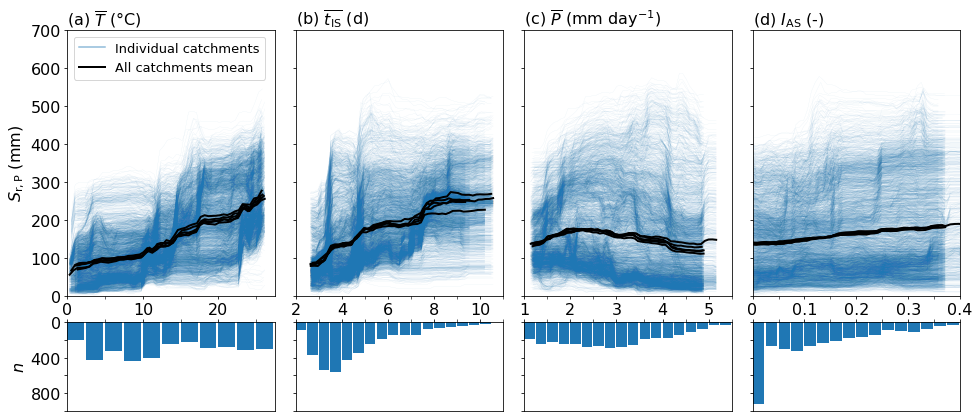

In [44]:
# figure with 0.05 - 0.95 and improved x axis
var = ['$\overline{T}$','$\overline{t_\mathrm{IS}}$','$\overline{P}$','$I_\mathrm{AS}$']
units = ['$\degree$C','d','mm $\mathrm{day}^{-1}$','-']
abcd = ['(a)','(b)','(c)','(d)']

major_t = [0,10,20]
minor_t = [5,15,25]
major_idu = [2,4,6,8,10]
minor_idu = [3,5,7,9,11]
major_p = [1,2,3,4,5]
minor_p = [1.5,2.5,3.6,4.5,5.5]
major_asi = [0,0.1,0.2,0.3,0.4]
minor_asi = [0.05,0.15,0.25,0.35]
majors = [major_t,major_idu,major_p,major_asi]
minors = [minor_t,minor_idu,minor_p,minor_asi]

xlims = [[0,27.5],[2,11],[1,5.5],[0,0.4]]

binst = np.arange(0,30,2.5)
binsidu = np.arange(2,11,0.5)
binsp = np.arange(1,6,0.25)
binsasi = np.arange(0,0.425,0.025)
binslist = [binst,binsidu,binsp,binsasi]

# plot pdp TEST ALL CVS COMBINED
X = np.concatenate([X_train,X_test])
ddf = pd.concat([df_train,df_test])
fig3, ax = plt.subplots(2,len(features), figsize=(16,7),gridspec_kw={'height_ratios': [3, 1]})
plt.subplots_adjust(hspace=0.15,wspace=0.1)
for k in range(len(features)):
    ice0 = ics[0][k]
    ice1 = ics[1][k]
    ice2 = ics[2][k]
    ice3 = ics[3][k]
    ice4 = ics[4][k]
        
    pdp0 = ps[0][k]
    pdp1 = ps[1][k]
    pdp2 = ps[2][k]
    pdp3 = ps[3][k]
    pdp4 = ps[4][k]

    c = 'tab:blue'
    for i in ice0.index:
        ax[0,k].plot(ice0.columns.values, ice0.loc[i],color=c,alpha=0.5,linestyle='-',linewidth=0.05)
    for i in ice1.index:
        ax[0,k].plot(ice1.columns.values, ice1.loc[i],color=c,alpha=0.5,linestyle='-',linewidth=0.05)
    for i in ice2.index:
        ax[0,k].plot(ice2.columns.values, ice2.loc[i],color=c,alpha=0.5,linestyle='-',linewidth=0.05)
    for i in ice3.index:
        ax[0,k].plot(ice3.columns.values, ice3.loc[i],color=c,alpha=0.5,linestyle='-',linewidth=0.05)
    for i in ice4.index:
        ax[0,k].plot(ice4.columns.values, ice4.loc[i],color=c,alpha=0.5,linestyle='-',linewidth=0.05)
    ax[0,k].plot(ice0.columns.values, -1*ice0.iloc[0],color=c,alpha=0.5,linestyle='-',linewidth=1.5,label='Individual catchments')
    ax[0,k].plot(pdp0.columns.values, pdp0.loc['average'],color='k',linestyle='-',linewidth=2, label='All catchments mean')
    ax[0,k].plot(pdp1.columns.values, pdp1.loc['average'],color='k',linestyle='-',linewidth=2)
    ax[0,k].plot(pdp2.columns.values, pdp2.loc['average'],color='k',linestyle='-',linewidth=2)
    ax[0,k].plot(pdp3.columns.values, pdp3.loc['average'],color='k',linestyle='-',linewidth=2)
    ax[0,k].plot(pdp4.columns.values, pdp4.loc['average'],color='k',linestyle='-',linewidth=2)
    # ax[0,k].plot(pdp0.columns.values, pdp0.loc['median'],color='k',linestyle='-',linewidth=2, label='All catchments median')
    # ax[0,k].plot(pdp1.columns.values, pdp1.loc['median'],color='k',linestyle='-',linewidth=2)
    # ax[0,k].plot(pdp2.columns.values, pdp2.loc['median'],color='k',linestyle='-',linewidth=2)
    # ax[0,k].plot(pdp3.columns.values, pdp3.loc['median'],color='k',linestyle='-',linewidth=2)
    # ax[0,k].plot(pdp4.columns.values, pdp4.loc['median'],color='k',linestyle='-',linewidth=2)
    ax[0,k].set_title(f'{abcd[k]} {var[k]} ({units[k]})',size=16, loc='left')
    ax[0,0].set_ylabel('$S_\mathrm{r,P}$ (mm)',size=16)
    ax[0,k].set_ylim(0,700)
    # ax[0,k].set_xlim(np.quantile(df.loc[:,features[k]],0.05),np.quantile(df.loc[:,features[k]],0.95))
    ax[0,k].set_xlim(xlims[k])
    # print(np.quantile(df.loc[:,features[k]],0.05),np.quantile(df.loc[:,features[k]],0.95))
    # print(np.quantile(df.loc[:,features[k]],0.01),np.quantile(df.loc[:,features[k]],0.99))
    ax[0,k].tick_params(axis='both',labelsize=16)
    ax[0,k].tick_params(which='major', length=3)
    ax[0,k].tick_params(which='minor', length=3)
    ax[0,k].set_xticks(ticks=majors[k])
    ax[0,k].set_xticks(ticks=minors[k],minor=True)
    if(k==3):
        ax[0,3].set_xticklabels(['0','0.1','0.2','0.3','0.4'])
    ax[0,k].set_yticks(ticks=[0,100,200,300,400,500,600,700])
    ax[0,k].set_yticklabels(['','','','','','','',''])
    ax[0,0].set_yticklabels(['0','100','200','300','400','500','600','700'])
    ax[0,0].legend(loc='upper left',fontsize=13)
           
    # bins = np.linspace(np.quantile(df.loc[:,features[k]],0.05),np.quantile(df.loc[:,features[k]],0.95),20)
    bins = binslist[k]
    ax[1,k].hist(df.loc[:,features[k]],bins=bins,width=0.9*(bins[1]-bins[0]),color=c)
    ax[1,k].invert_yaxis()
    ax[1,k].xaxis.tick_top()
    # ax[1,k].set_xlim(np.quantile(df.loc[:,features[k]],0.05),np.quantile(df.loc[:,features[k]],0.95))
    ax[1,k].axes.get_xaxis().set_ticklabels([])
    ax[1,0].set_ylabel('$n$',size=16)
    ax[1,k].tick_params(axis='both', labelsize=16)
    ax[1,k].set_ylim(1000,0)
    ax[1,k].set_yticks([0,200,400,600,800,1000])
    ax[1,k].set_yticklabels(['','','','','',''])
    ax[1,0].set_yticklabels(['0','','400','','800',''])
    ax[1,k].set_xlim(xlims[k])
    ax[1,k].set_xticks(ticks=majors[k])
    ax[1,k].set_xticks(ticks=minors[k],minor=True)
    ax[1,k].tick_params(which='major', length=3)
    ax[1,k].tick_params(which='minor', length=3)
    
fig3.savefig(f'{work_dir}/output/regression/figures/interpretation/pdp_alltest_{mod}.jpg',bbox_inches='tight',dpi=300)

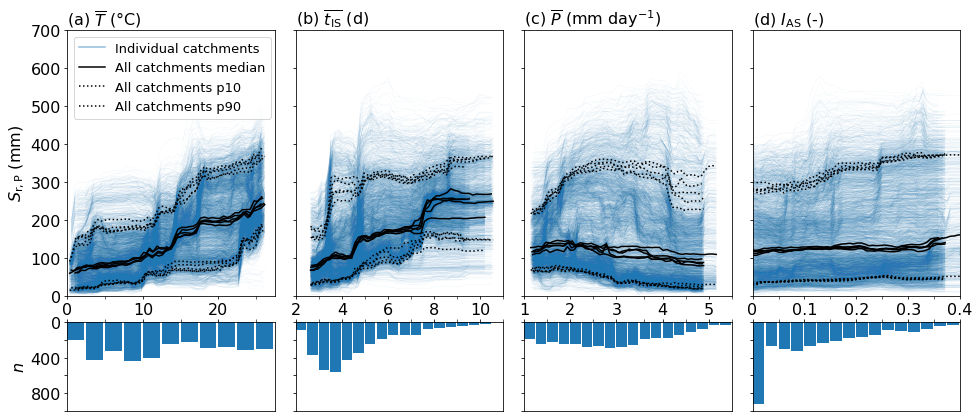

In [45]:
# figure with 0.05 - 0.95 and improved x axis, and median and p10, p90 instead of mean
var = ['$\overline{T}$','$\overline{t_\mathrm{IS}}$','$\overline{P}$','$I_\mathrm{AS}$']
units = ['$\degree$C','d','mm $\mathrm{day}^{-1}$','-']
abcd = ['(a)','(b)','(c)','(d)']

major_t = [0,10,20]
minor_t = [5,15,25]
major_idu = [2,4,6,8,10]
minor_idu = [3,5,7,9,11]
major_p = [1,2,3,4,5]
minor_p = [1.5,2.5,3.6,4.5,5.5]
major_asi = [0,0.1,0.2,0.3,0.4]
minor_asi = [0.05,0.15,0.25,0.35]
majors = [major_t,major_idu,major_p,major_asi]
minors = [minor_t,minor_idu,minor_p,minor_asi]

xlims = [[0,27.5],[2,11],[1,5.5],[0,0.4]]

binst = np.arange(0,30,2.5)
binsidu = np.arange(2,11,0.5)
binsp = np.arange(1,6,0.25)
binsasi = np.arange(0,0.425,0.025)
binslist = [binst,binsidu,binsp,binsasi]

# plot pdp TEST ALL CVS COMBINED
X = np.concatenate([X_train,X_test])
ddf = pd.concat([df_train,df_test])
fig3, ax = plt.subplots(2,len(features), figsize=(16,7),gridspec_kw={'height_ratios': [3, 1]})
plt.subplots_adjust(hspace=0.15,wspace=0.1)
for k in range(len(features)):
    ice0 = ics[0][k]
    ice1 = ics[1][k]
    ice2 = ics[2][k]
    ice3 = ics[3][k]
    ice4 = ics[4][k]
        
    pdp0 = ps[0][k]
    pdp1 = ps[1][k]
    pdp2 = ps[2][k]
    pdp3 = ps[3][k]
    pdp4 = ps[4][k]

    c = 'tab:blue'
    for i in ice0.index:
        ax[0,k].plot(ice0.columns.values, ice0.loc[i],color=c,alpha=0.5,linestyle='-',linewidth=0.05)
    for i in ice1.index:
        ax[0,k].plot(ice1.columns.values, ice1.loc[i],color=c,alpha=0.5,linestyle='-',linewidth=0.05)
    for i in ice2.index:
        ax[0,k].plot(ice2.columns.values, ice2.loc[i],color=c,alpha=0.5,linestyle='-',linewidth=0.05)
    for i in ice3.index:
        ax[0,k].plot(ice3.columns.values, ice3.loc[i],color=c,alpha=0.5,linestyle='-',linewidth=0.05)
    for i in ice4.index:
        ax[0,k].plot(ice4.columns.values, ice4.loc[i],color=c,alpha=0.5,linestyle='-',linewidth=0.05)
    ax[0,k].plot(ice0.columns.values, -1*ice0.iloc[0],color=c,alpha=0.5,linestyle='-',linewidth=1.5,label='Individual catchments')
    # ax[0,k].plot(pdp0.columns.values, pdp0.loc['average'],color='k',linestyle='-',linewidth=2, label='All catchments mean')
    # ax[0,k].plot(pdp1.columns.values, pdp1.loc['average'],color='k',linestyle='-',linewidth=2)
    # ax[0,k].plot(pdp2.columns.values, pdp2.loc['average'],color='k',linestyle='-',linewidth=2)
    # ax[0,k].plot(pdp3.columns.values, pdp3.loc['average'],color='k',linestyle='-',linewidth=2)
    # ax[0,k].plot(pdp4.columns.values, pdp4.loc['average'],color='k',linestyle='-',linewidth=2)
    ax[0,k].plot(pdp0.columns.values, pdp0.loc['median'],color='k',linestyle='-',linewidth=1.5, label='All catchments median')
    ax[0,k].plot(pdp1.columns.values, pdp1.loc['median'],color='k',linestyle='-',linewidth=1.5)
    ax[0,k].plot(pdp2.columns.values, pdp2.loc['median'],color='k',linestyle='-',linewidth=1.5)
    ax[0,k].plot(pdp3.columns.values, pdp3.loc['median'],color='k',linestyle='-',linewidth=1.5)
    ax[0,k].plot(pdp4.columns.values, pdp4.loc['median'],color='k',linestyle='-',linewidth=1.5)
    ax[0,k].plot(pdp0.columns.values, pdp0.loc['p10'],color='k',linestyle=':',linewidth=1.5, label='All catchments p10')
    ax[0,k].plot(pdp1.columns.values, pdp1.loc['p10'],color='k',linestyle=':',linewidth=1.5)
    ax[0,k].plot(pdp2.columns.values, pdp2.loc['p10'],color='k',linestyle=':',linewidth=1.5)
    ax[0,k].plot(pdp3.columns.values, pdp3.loc['p10'],color='k',linestyle=':',linewidth=1.5)
    ax[0,k].plot(pdp4.columns.values, pdp4.loc['p10'],color='k',linestyle=':',linewidth=1.5)
    ax[0,k].plot(pdp0.columns.values, pdp0.loc['p90'],color='k',linestyle=':',linewidth=1.5, label='All catchments p90')
    ax[0,k].plot(pdp1.columns.values, pdp1.loc['p90'],color='k',linestyle=':',linewidth=1.5)
    ax[0,k].plot(pdp2.columns.values, pdp2.loc['p90'],color='k',linestyle=':',linewidth=1.5)
    ax[0,k].plot(pdp3.columns.values, pdp3.loc['p90'],color='k',linestyle=':',linewidth=1.5)
    ax[0,k].plot(pdp4.columns.values, pdp4.loc['p90'],color='k',linestyle=':',linewidth=1.5)
    ax[0,k].set_title(f'{abcd[k]} {var[k]} ({units[k]})',size=16, loc='left')
    ax[0,0].set_ylabel('$S_\mathrm{r,P}$ (mm)',size=16)
    ax[0,k].set_ylim(0,700)
    # ax[0,k].set_xlim(np.quantile(df.loc[:,features[k]],0.05),np.quantile(df.loc[:,features[k]],0.95))
    ax[0,k].set_xlim(xlims[k])
    # print(np.quantile(df.loc[:,features[k]],0.05),np.quantile(df.loc[:,features[k]],0.95))
    # print(np.quantile(df.loc[:,features[k]],0.01),np.quantile(df.loc[:,features[k]],0.99))
    ax[0,k].tick_params(axis='both',labelsize=16)
    ax[0,k].tick_params(which='major', length=3)
    ax[0,k].tick_params(which='minor', length=3)
    ax[0,k].set_xticks(ticks=majors[k])
    ax[0,k].set_xticks(ticks=minors[k],minor=True)
    if(k==3):
        ax[0,3].set_xticklabels(['0','0.1','0.2','0.3','0.4'])
    ax[0,k].set_yticks(ticks=[0,100,200,300,400,500,600,700])
    ax[0,k].set_yticklabels(['','','','','','','',''])
    ax[0,0].set_yticklabels(['0','100','200','300','400','500','600','700'])
    ax[0,0].legend(loc='upper left',fontsize=13)
           
    # bins = np.linspace(np.quantile(df.loc[:,features[k]],0.05),np.quantile(df.loc[:,features[k]],0.95),20)
    bins = binslist[k]
    ax[1,k].hist(df.loc[:,features[k]],bins=bins,width=0.9*(bins[1]-bins[0]),color=c)
    ax[1,k].invert_yaxis()
    ax[1,k].xaxis.tick_top()
    # ax[1,k].set_xlim(np.quantile(df.loc[:,features[k]],0.05),np.quantile(df.loc[:,features[k]],0.95))
    ax[1,k].axes.get_xaxis().set_ticklabels([])
    ax[1,0].set_ylabel('$n$',size=16)
    ax[1,k].tick_params(axis='both', labelsize=16)
    ax[1,k].set_ylim(1000,0)
    ax[1,k].set_yticks([0,200,400,600,800,1000])
    ax[1,k].set_yticklabels(['','','','','',''])
    ax[1,0].set_yticklabels(['0','','400','','800',''])
    ax[1,k].set_xlim(xlims[k])
    ax[1,k].set_xticks(ticks=majors[k])
    ax[1,k].set_xticks(ticks=minors[k],minor=True)
    ax[1,k].tick_params(which='major', length=3)
    ax[1,k].tick_params(which='minor', length=3)
    
fig3.savefig(f'{work_dir}/output/regression/figures/interpretation/pdp_alltest_{mod}_median.jpg',bbox_inches='tight',dpi=300)

In [46]:
# compute ices for 0-1 range instead of 0.05-0.95

# combine all cv's train and test results
grid_resolution=100
ps = []
ics = []
for i in range(5):
    train_ix = cv_train_ix[i]
    test_ix = cv_test_ix[i]

    X_train = dfx[train_ix]
    y_train = dfy[train_ix]
    X_test = dfx[test_ix]
    y_test = dfy[test_ix]

    # save lat lon columns
    lat_train = X_train[:,-3]
    lon_train = X_train[:,-2]
    lat_test = X_test[:,-3]
    lon_test = X_test[:,-2]
    catch_id_train = X_train[:,-1]
    catch_id_test = X_test[:,-1]
    # remove lat lon columns
    X_train = np.delete(X_train,-1,1)
    X_train = np.delete(X_train,-1,1)
    X_train = np.delete(X_train,-1,1)
    X_test = np.delete(X_test,-1,1)
    X_test = np.delete(X_test,-1,1)
    X_test = np.delete(X_test,-1,1)

    rf = RandomForestRegressor(criterion='absolute_error',random_state=42,min_samples_leaf=min_samples_leaf,max_depth=max_depth)
    # rf = RandomForestRegressor(criterion='squared_error',random_state=42,min_samples_leaf=min_samples_leaf,max_depth=max_depth,oob_score=True)
    rf = rf.fit(X_train, y_train)
    train_y_pred = rf.predict(X_train)
    test_y_pred = rf.predict(X_test)
    df_train = pd.DataFrame(index=catch_id_train,columns=['lat','lon','Sr_m','Sr_p','Sr_p-Sr_m','(Sr_p-Sr_m)/Sr_m'])
    df_train['lat'] = lat_train
    df_train['lon'] = lon_train
    df_train['Sr_m'] = y_train
    df_train['Sr_p'] = train_y_pred
    df_train['Sr_p-Sr_m'] = train_y_pred - y_train
    df_train['(Sr_p-Sr_m)/Sr_m'] = (train_y_pred - y_train)/train_y_pred

    df_test = pd.DataFrame(index=catch_id_test,columns=['lat','lon','Sr_m','Sr_p','Sr_p-Sr_m','(Sr_p-Sr_m)/Sr_m'])
    df_test['lat'] = lat_test
    df_test['lon'] = lon_test
    df_test['Sr_m'] = y_test
    df_test['Sr_p'] = test_y_pred
    df_test['Sr_p-Sr_m'] = test_y_pred - y_test
    df_test['(Sr_p-Sr_m)/Sr_m'] = (test_y_pred - y_test)/test_y_pred
    
    pdps=[]
    ices=[]
    for k in range(len(features)):
        # a = partial_dependence(rf, features=[k], X=X_test, percentiles=(0.05, 0.95),grid_resolution=grid_resolution, kind='both')
        a = partial_dependence(rf, features=[k], X=X_test, percentiles=(0, 1),grid_resolution=grid_resolution, kind='both')
        if(k==1):
            a = partial_dependence(rf, features=[k], X=X_test, percentiles=(0, 1),grid_resolution=1000, kind='both') # higher grid resolution for idu mean
        pdpp = pd.DataFrame(index=['average'],data=a['average'],columns=a['values'][0])
        ice = pd.DataFrame(index=df_test.index, data=a['individual'][0],columns=a['values'][0])
        # med = pd.DataFrame(index=['median'],data=np.median(a['individual'][0],axis=0).reshape(1,100),columns=a['values'][0])
        # p10 = pd.DataFrame(index=['p10'],data=np.quantile(a['individual'][0],0.1,axis=0).reshape(1,100),columns=a['values'][0])
        # p90 = pd.DataFrame(index=['p90'],data=np.quantile(a['individual'][0],0.9,axis=0).reshape(1,100),columns=a['values'][0])
        pdp = pd.concat([pdpp,med,p10,p90])
        pdps.append(pdp)
        ices.append(ice)
    ps.append(pdps)
    ics.append(ices)

In [47]:
# interpolate so we get same x axis for all cross validation folds
icsi=[]
for k in range(len(features)):
    ice0 = ics[0][k]
    ice1 = ics[1][k]
    ice2 = ics[2][k]
    ice3 = ics[3][k]
    ice4 = ics[4][k]
    
    x0 = ice0.columns.values
    x1 = ice1.columns.values
    x2 = ice2.columns.values
    x3 = ice3.columns.values
    x4 = ice4.columns.values
    
    mi = np.min([ice0.columns.values[0],ice1.columns.values[0],ice2.columns.values[0],ice3.columns.values[0],ice4.columns.values[0]])
    ma = np.max([ice0.columns.values[-1],ice1.columns.values[-1],ice2.columns.values[-1],ice3.columns.values[-1],ice4.columns.values[-1]])
    
    xx = np.linspace(mi,ma,100)
    if (k==1):
        xx = np.linspace(mi,ma,500)
    
    ice0i = pd.DataFrame(index=ice0.index,columns=xx)
    ice1i = pd.DataFrame(index=ice1.index,columns=xx)
    ice2i = pd.DataFrame(index=ice2.index,columns=xx)
    ice3i = pd.DataFrame(index=ice3.index,columns=xx)
    ice4i = pd.DataFrame(index=ice4.index,columns=xx)
    
    for i in ice0.index:
        y0 = ice0.loc[i].values
        y0i = np.interp(xx,x0,y0)
        ice0i.loc[i] = y0i
    for i in ice1.index:
        y1 = ice1.loc[i].values
        y1i = np.interp(xx,x1,y1)
        ice1i.loc[i] = y1i
    for i in ice2.index:
        y2 = ice2.loc[i].values
        y2i = np.interp(xx,x2,y2)
        ice2i.loc[i] = y2i
    for i in ice3.index:
        y3 = ice3.loc[i].values
        y3i = np.interp(xx,x3,y3)
        ice3i.loc[i] = y3i
    for i in ice4.index:
        y4 = ice4.loc[i].values
        y4i = np.interp(xx,x4,y4)
        ice4i.loc[i] = y4i
    icei = pd.concat([ice0i,ice1i,ice2i,ice3i,ice4i])
    icei = icei.astype(float)
    icsi.append(icei)

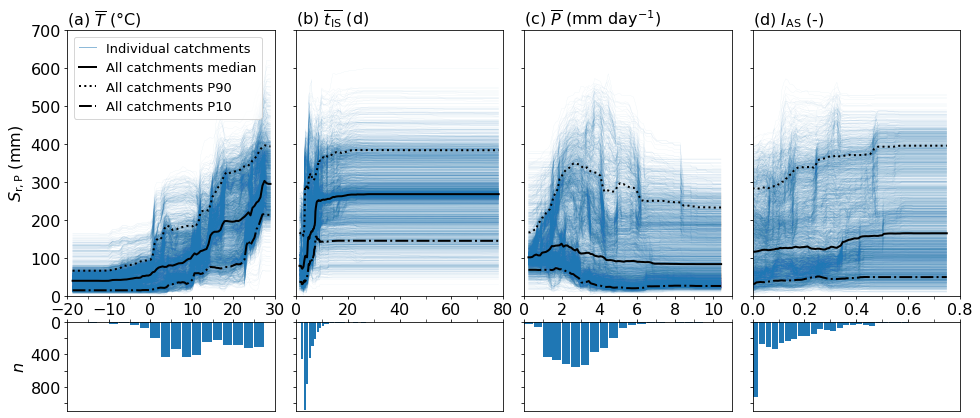

In [48]:
# ices based on 0-1 range, plot full range - interpolated
var = ['$\overline{T}$','$\overline{t_\mathrm{IS}}$','$\overline{P}$','$I_\mathrm{AS}$']
units = ['$\degree$C','d','mm $\mathrm{day}^{-1}$','-']
abcd = ['(a)','(b)','(c)','(d)']

major_t = [-20,-10,0,10,20,30]
minor_t = [-15,-5,5,15,25]
major_idu = [0,20,40,60,80]
minor_idu = [10,30,50,70]
major_p = [0,2,4,6,8,10]
minor_p = [1,3,5,7,9,11]
major_asi = [0,0.2,0.4,0.6,0.8]
minor_asi = [0.1,0.3,0.5,0.7]
majors = [major_t,major_idu,major_p,major_asi]
minors = [minor_t,minor_idu,minor_p,minor_asi]

xlims = [[-20,30],[0,80],[0,11],[0,0.8]]
ylims = [[1100,0],[1100,0],[1100,0],[1100,0]]

binst = np.arange(-20,30,2.5)
binsidu = np.arange(0,80,1)
binsp = np.arange(0,11,0.5)
binsasi = np.arange(0,0.8,0.025)
binslist = [binst,binsidu,binsp,binsasi]

# plot pdp TEST ALL CVS COMBINED
X = np.concatenate([X_train,X_test])
ddf = pd.concat([df_train,df_test])
fig3, ax = plt.subplots(2,len(features), figsize=(16,7),gridspec_kw={'height_ratios': [3, 1]})
plt.subplots_adjust(hspace=0.15,wspace=0.1)
for k in range(len(features)):
    ice0 = icsi[k]

    c = 'tab:blue'
    for i in ice0.index:
        ax[0,k].plot(ice0.columns.values, ice0.loc[i],color=c,alpha=0.5,linestyle='-',linewidth=0.05)    
    
    ax[0,k].plot(ice0.columns.values, -1*ice0.iloc[0],color=c,alpha=0.5,linestyle='-',linewidth=1,label='Individual catchments')
    ax[0,k].plot(ice0.columns.values, ice0.median(axis=0),color='k',linestyle='-',linewidth=2, label='All catchments median')
    ax[0,k].plot(ice0.columns.values, np.quantile(ice0,0.9,axis=0),color='k',linestyle=':',linewidth=2, label='All catchments P90')
    ax[0,k].plot(ice0.columns.values, np.quantile(ice0,0.1,axis=0),color='k',linestyle='-.',linewidth=2, label='All catchments P10')

    ax[0,k].set_title(f'{abcd[k]} {var[k]} ({units[k]})',size=16, loc='left')
    ax[0,0].set_ylabel('$S_\mathrm{r,P}$ (mm)',size=16)
    ax[0,k].set_ylim(0,700)
    # ax[0,k].set_xlim(np.quantile(df.loc[:,features[k]],0.05),np.quantile(df.loc[:,features[k]],0.95))
    ax[0,k].set_xlim(xlims[k])
    # print(np.quantile(df.loc[:,features[k]],0.05),np.quantile(df.loc[:,features[k]],0.95))
    # print(np.quantile(df.loc[:,features[k]],0.01),np.quantile(df.loc[:,features[k]],0.99))
    ax[0,k].tick_params(axis='both',labelsize=16)
    ax[0,k].tick_params(which='major', length=3)
    ax[0,k].tick_params(which='minor', length=3)
    ax[0,k].set_xticks(ticks=majors[k])
    ax[0,k].set_xticks(ticks=minors[k],minor=True)
    # if(k==3):
    #     ax[0,3].set_xticklabels(['0','0.1','0.2','0.3','0.4'])
    ax[0,k].set_yticks(ticks=[0,100,200,300,400,500,600,700])
    ax[0,k].set_yticklabels(['','','','','','','',''])
    ax[0,0].set_yticklabels(['0','100','200','300','400','500','600','700'])
    ax[0,0].legend(loc='upper left',fontsize=13,handlelength=1.3)
           
    # bins = np.linspace(np.quantile(df.loc[:,features[k]],0),np.quantile(df.loc[:,features[k]],1),20)
    bins = binslist[k]
    ax[1,k].hist(df.loc[:,features[k]],bins=bins,width=0.9*(bins[1]-bins[0]),color=c)
    ax[1,k].invert_yaxis()
    ax[1,k].xaxis.tick_top()
    # ax[1,k].set_xlim(np.quantile(df.loc[:,features[k]],0.05),np.quantile(df.loc[:,features[k]],0.95))
    ax[1,k].axes.get_xaxis().set_ticklabels([])
    ax[1,0].set_ylabel('$n$',size=16)
    ax[1,k].tick_params(axis='both', labelsize=16)
    ax[1,k].set_ylim(ylims[k])
    ax[1,k].set_yticks([0,200,400,600,800,1000])
    ax[1,k].set_yticklabels(['','','','','',''])
    ax[1,0].set_yticklabels(['0','','400','','800',''])
    ax[1,k].set_xlim(xlims[k])
    ax[1,k].set_xticks(ticks=majors[k])
    ax[1,k].set_xticks(ticks=minors[k],minor=True)
    ax[1,k].tick_params(which='major', length=3)
    ax[1,k].tick_params(which='minor', length=3)
    
fig3.savefig(f'{work_dir}/output/regression/figures/interpretation/pdp_alltest_{mod}_fullrange.jpg',bbox_inches='tight',dpi=300)

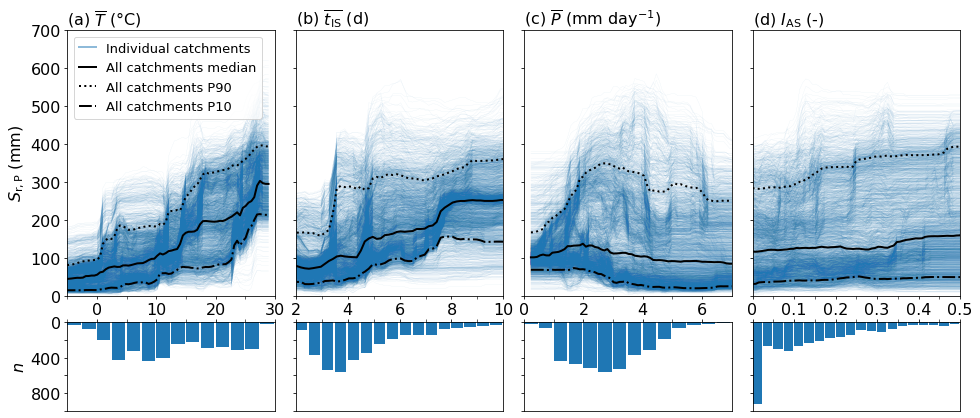

In [50]:
# ices based on 0-1 range, plot limited range - interpolated
var = ['$\overline{T}$','$\overline{t_\mathrm{IS}}$','$\overline{P}$','$I_\mathrm{AS}$']
units = ['$\degree$C','d','mm $\mathrm{day}^{-1}$','-']
abcd = ['(a)','(b)','(c)','(d)']

major_t = [0,10,20,30]
minor_t = [-5,5,15,25]
major_idu = [2,4,6,8,10]
minor_idu = [3,5,7,9]
major_p = [0,2,4,6]
minor_p = [1,3,5]
major_asi = [0,0.1,0.2,0.3,0.4,0.5]
minor_asi = [0.05,0.15,0.25,0.35,0.45]
majors = [major_t,major_idu,major_p,major_asi]
minors = [minor_t,minor_idu,minor_p,minor_asi]

xlims = [[-5,30],[2,10],[0,7],[0,0.5]]

binst = np.arange(-10,32.5,2.5)
binsidu = np.arange(2,10.5,0.5)
binsp = np.arange(0,7.5,0.5)
binsasi = np.arange(0,0.525,0.025)
binslist = [binst,binsidu,binsp,binsasi]

# plot pdp TEST ALL CVS COMBINED
X = np.concatenate([X_train,X_test])
ddf = pd.concat([df_train,df_test])
fig3, ax = plt.subplots(2,len(features), figsize=(16,7),gridspec_kw={'height_ratios': [3, 1]})
plt.subplots_adjust(hspace=0.15,wspace=0.1)
for k in range(len(features)):
    ice0 = icsi[k]

    c = 'tab:blue'
    for i in ice0.index:
        ax[0,k].plot(ice0.columns.values, ice0.loc[i],color=c,alpha=0.5,linestyle='-',linewidth=0.05)    
    
    ax[0,k].plot(ice0.columns.values, -1*ice0.iloc[0],color=c,alpha=0.5,linestyle='-',linewidth=2,label='Individual catchments')
    ax[0,k].plot(ice0.columns.values, ice0.median(axis=0),color='k',linestyle='-',linewidth=2, label='All catchments median')
    ax[0,k].plot(ice0.columns.values, np.quantile(ice0,0.9,axis=0),color='k',linestyle=':',linewidth=2, label='All catchments P90')
    ax[0,k].plot(ice0.columns.values, np.quantile(ice0,0.1,axis=0),color='k',linestyle='-.',linewidth=2, label='All catchments P10')
    
    ax[0,k].set_title(f'{abcd[k]} {var[k]} ({units[k]})',size=16, loc='left')
    ax[0,0].set_ylabel('$S_\mathrm{r,P}$ (mm)',size=16)
    ax[0,k].set_ylim(0,700)
    # ax[0,k].set_xlim(np.quantile(df.loc[:,features[k]],0.05),np.quantile(df.loc[:,features[k]],0.95))
    ax[0,k].set_xlim(xlims[k])
    # print(np.quantile(df.loc[:,features[k]],0.05),np.quantile(df.loc[:,features[k]],0.95))
    # print(np.quantile(df.loc[:,features[k]],0.01),np.quantile(df.loc[:,features[k]],0.99))
    ax[0,k].tick_params(axis='both',labelsize=16)
    ax[0,k].tick_params(which='major', length=3)
    ax[0,k].tick_params(which='minor', length=3)
    ax[0,k].set_xticks(ticks=majors[k])
    ax[0,k].set_xticks(ticks=minors[k],minor=True)
    if(k==3):
        ax[0,3].set_xticklabels(['0','0.1','0.2','0.3','0.4','0.5'])
    ax[0,k].set_yticks(ticks=[0,100,200,300,400,500,600,700])
    ax[0,k].set_yticklabels(['','','','','','','',''])
    ax[0,0].set_yticklabels(['0','100','200','300','400','500','600','700'])
    ax[0,0].legend(loc='upper left',fontsize=13,handlelength=1.3)
           
    # bins = np.linspace(np.quantile(df.loc[:,features[k]],0),np.quantile(df.loc[:,features[k]],1),20)
    bins = binslist[k]
    ax[1,k].hist(df.loc[:,features[k]],bins=bins,width=0.9*(bins[1]-bins[0]),color=c)
    ax[1,k].invert_yaxis()
    ax[1,k].xaxis.tick_top()
    # ax[1,k].set_xlim(np.quantile(df.loc[:,features[k]],0.05),np.quantile(df.loc[:,features[k]],0.95))
    ax[1,k].axes.get_xaxis().set_ticklabels([])
    ax[1,0].set_ylabel('$n$',size=16)
    ax[1,k].tick_params(axis='both', labelsize=16)
    ax[1,k].set_ylim(1000,0)
    ax[1,k].set_yticks([0,200,400,600,800,1000])
    ax[1,k].set_yticklabels(['','','','','',''])
    ax[1,0].set_yticklabels(['0','','400','','800',''])
    ax[1,k].set_xlim(xlims[k])
    ax[1,k].set_xticks(ticks=majors[k])
    ax[1,k].set_xticks(ticks=minors[k],minor=True)
    ax[1,k].tick_params(which='major', length=3)
    ax[1,k].tick_params(which='minor', length=3)
    
# fig3.savefig(f'{work_dir}/output/regression/figures/interpretation/pdp_alltest_{mod}_fullrange_limx.jpg',bbox_inches='tight',dpi=600)
fig3.savefig(f'{fig_dir}/ice_3variables.jpg',bbox_inches='tight',dpi=600)

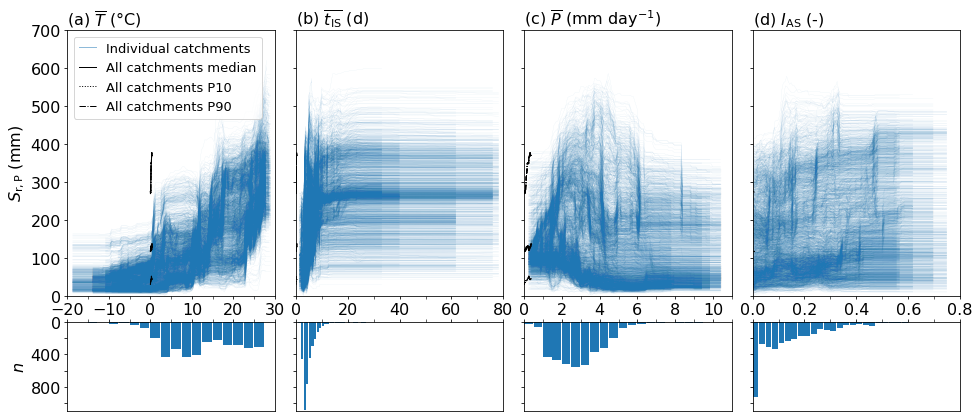

In [56]:
# ices based on 0-1 range, plot full range
var = ['$\overline{T}$','$\overline{t_\mathrm{IS}}$','$\overline{P}$','$I_\mathrm{AS}$']
units = ['$\degree$C','d','mm $\mathrm{day}^{-1}$','-']
abcd = ['(a)','(b)','(c)','(d)']

major_t = [-20,-10,0,10,20,30]
minor_t = [-15,-5,5,15,25]
major_idu = [0,20,40,60,80]
minor_idu = [10,30,50,70]
major_p = [0,2,4,6,8,10]
minor_p = [1,3,5,7,9,11]
major_asi = [0,0.2,0.4,0.6,0.8]
minor_asi = [0.1,0.3,0.5,0.7]
majors = [major_t,major_idu,major_p,major_asi]
minors = [minor_t,minor_idu,minor_p,minor_asi]

xlims = [[-20,30],[0,80],[0,11],[0,0.8]]
ylims = [[1100,0],[1100,0],[1100,0],[1100,0]]

binst = np.arange(-20,30,2.5)
binsidu = np.arange(0,80,1)
binsp = np.arange(0,11,0.5)
binsasi = np.arange(0,0.8,0.025)
binslist = [binst,binsidu,binsp,binsasi]

# plot pdp TEST ALL CVS COMBINED
X = np.concatenate([X_train,X_test])
ddf = pd.concat([df_train,df_test])
fig3, ax = plt.subplots(2,len(features), figsize=(16,7),gridspec_kw={'height_ratios': [3, 1]})
plt.subplots_adjust(hspace=0.15,wspace=0.1)
for k in range(len(features)):
    ice0 = ics[0][k]
    ice1 = ics[1][k]
    ice2 = ics[2][k]
    ice3 = ics[3][k]
    ice4 = ics[4][k]
        
    pdp0 = ps[0][k]
    pdp1 = ps[1][k]
    pdp2 = ps[2][k]
    pdp3 = ps[3][k]
    pdp4 = ps[4][k]

    c = 'tab:blue'
    for i in ice0.index:
        ax[0,k].plot(ice0.columns.values, ice0.loc[i],color=c,alpha=0.5,linestyle='-',linewidth=0.05)
    for i in ice1.index:
        ax[0,k].plot(ice1.columns.values, ice1.loc[i],color=c,alpha=0.5,linestyle='-',linewidth=0.05)
    for i in ice2.index:
        ax[0,k].plot(ice2.columns.values, ice2.loc[i],color=c,alpha=0.5,linestyle='-',linewidth=0.05)
    for i in ice3.index:
        ax[0,k].plot(ice3.columns.values, ice3.loc[i],color=c,alpha=0.5,linestyle='-',linewidth=0.05)
    for i in ice4.index:
        ax[0,k].plot(ice4.columns.values, ice4.loc[i],color=c,alpha=0.5,linestyle='-',linewidth=0.05)
    
    
    ax[0,k].plot(ice0.columns.values, -1*ice0.iloc[0],color=c,alpha=0.5,linestyle='-',linewidth=1,label='Individual catchments')
    ax[0,k].plot(pdp0.columns.values, pdp0.loc['median'],color='k',linestyle='-',linewidth=1, label='All catchments median')
    ax[0,k].plot(pdp1.columns.values, pdp1.loc['median'],color='k',linestyle='-',linewidth=1)
    ax[0,k].plot(pdp2.columns.values, pdp2.loc['median'],color='k',linestyle='-',linewidth=1)
    ax[0,k].plot(pdp3.columns.values, pdp3.loc['median'],color='k',linestyle='-',linewidth=1)
    ax[0,k].plot(pdp4.columns.values, pdp4.loc['median'],color='k',linestyle='-',linewidth=1)
    ax[0,k].plot(pdp0.columns.values, pdp0.loc['p10'],color='k',linestyle=':',linewidth=1, label='All catchments P10')
    ax[0,k].plot(pdp1.columns.values, pdp1.loc['p10'],color='k',linestyle=':',linewidth=1)
    ax[0,k].plot(pdp2.columns.values, pdp2.loc['p10'],color='k',linestyle=':',linewidth=1)
    ax[0,k].plot(pdp3.columns.values, pdp3.loc['p10'],color='k',linestyle=':',linewidth=1)
    ax[0,k].plot(pdp4.columns.values, pdp4.loc['p10'],color='k',linestyle=':',linewidth=1)
    ax[0,k].plot(pdp0.columns.values, pdp0.loc['p90'],color='k',linestyle='-.',linewidth=1, label='All catchments P90')
    ax[0,k].plot(pdp1.columns.values, pdp1.loc['p90'],color='k',linestyle='-.',linewidth=1)
    ax[0,k].plot(pdp2.columns.values, pdp2.loc['p90'],color='k',linestyle='-.',linewidth=1)
    ax[0,k].plot(pdp3.columns.values, pdp3.loc['p90'],color='k',linestyle='-.',linewidth=1)
    ax[0,k].plot(pdp4.columns.values, pdp4.loc['p90'],color='k',linestyle='-.',linewidth=1)
    ax[0,k].set_title(f'{abcd[k]} {var[k]} ({units[k]})',size=16, loc='left')
    ax[0,0].set_ylabel('$S_\mathrm{r,P}$ (mm)',size=16)
    ax[0,k].set_ylim(0,700)
    # ax[0,k].set_xlim(np.quantile(df.loc[:,features[k]],0.05),np.quantile(df.loc[:,features[k]],0.95))
    ax[0,k].set_xlim(xlims[k])
    # print(np.quantile(df.loc[:,features[k]],0.05),np.quantile(df.loc[:,features[k]],0.95))
    # print(np.quantile(df.loc[:,features[k]],0.01),np.quantile(df.loc[:,features[k]],0.99))
    ax[0,k].tick_params(axis='both',labelsize=16)
    ax[0,k].tick_params(which='major', length=3)
    ax[0,k].tick_params(which='minor', length=3)
    ax[0,k].set_xticks(ticks=majors[k])
    ax[0,k].set_xticks(ticks=minors[k],minor=True)
    # if(k==3):
    #     ax[0,3].set_xticklabels(['0','0.1','0.2','0.3','0.4'])
    ax[0,k].set_yticks(ticks=[0,100,200,300,400,500,600,700])
    ax[0,k].set_yticklabels(['','','','','','','',''])
    ax[0,0].set_yticklabels(['0','100','200','300','400','500','600','700'])
    ax[0,0].legend(loc='upper left',fontsize=13,handlelength=1.3)
           
    # bins = np.linspace(np.quantile(df.loc[:,features[k]],0),np.quantile(df.loc[:,features[k]],1),20)
    bins = binslist[k]
    ax[1,k].hist(df.loc[:,features[k]],bins=bins,width=0.9*(bins[1]-bins[0]),color=c)
    ax[1,k].invert_yaxis()
    ax[1,k].xaxis.tick_top()
    # ax[1,k].set_xlim(np.quantile(df.loc[:,features[k]],0.05),np.quantile(df.loc[:,features[k]],0.95))
    ax[1,k].axes.get_xaxis().set_ticklabels([])
    ax[1,0].set_ylabel('$n$',size=16)
    ax[1,k].tick_params(axis='both', labelsize=16)
    ax[1,k].set_ylim(ylims[k])
    ax[1,k].set_yticks([0,200,400,600,800,1000])
    ax[1,k].set_yticklabels(['','','','','',''])
    ax[1,0].set_yticklabels(['0','','400','','800',''])
    ax[1,k].set_xlim(xlims[k])
    ax[1,k].set_xticks(ticks=majors[k])
    ax[1,k].set_xticks(ticks=minors[k],minor=True)
    ax[1,k].tick_params(which='major', length=3)
    ax[1,k].tick_params(which='minor', length=3)
    
fig3.savefig(f'{work_dir}/output/regression/figures/interpretation/pdp_alltest_{mod}_fullrange.jpg',bbox_inches='tight',dpi=300)

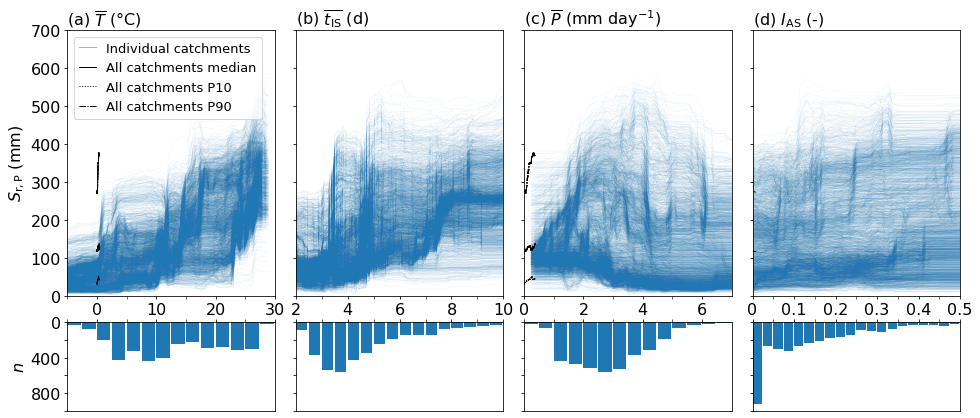

In [57]:
# ices based on 0-1 range, plot limited range
var = ['$\overline{T}$','$\overline{t_\mathrm{IS}}$','$\overline{P}$','$I_\mathrm{AS}$']
units = ['$\degree$C','d','mm $\mathrm{day}^{-1}$','-']
abcd = ['(a)','(b)','(c)','(d)']

major_t = [0,10,20,30]
minor_t = [-5,5,15,25]
major_idu = [2,4,6,8,10]
minor_idu = [3,5,7,9]
major_p = [0,2,4,6]
minor_p = [1,3,5]
major_asi = [0,0.1,0.2,0.3,0.4,0.5]
minor_asi = [0.05,0.15,0.25,0.35,0.45]
majors = [major_t,major_idu,major_p,major_asi]
minors = [minor_t,minor_idu,minor_p,minor_asi]

xlims = [[-5,30],[2,10],[0,7],[0,0.5]]

binst = np.arange(-10,32.5,2.5)
binsidu = np.arange(2,10.5,0.5)
binsp = np.arange(0,7.5,0.5)
binsasi = np.arange(0,0.525,0.025)
binslist = [binst,binsidu,binsp,binsasi]

# plot pdp TEST ALL CVS COMBINED
X = np.concatenate([X_train,X_test])
ddf = pd.concat([df_train,df_test])
fig3, ax = plt.subplots(2,len(features), figsize=(16,7),gridspec_kw={'height_ratios': [3, 1]})
plt.subplots_adjust(hspace=0.15,wspace=0.1)
for k in range(len(features)):
    ice0 = ics[0][k]
    ice1 = ics[1][k]
    ice2 = ics[2][k]
    ice3 = ics[3][k]
    ice4 = ics[4][k]
        
    pdp0 = ps[0][k]
    pdp1 = ps[1][k]
    pdp2 = ps[2][k]
    pdp3 = ps[3][k]
    pdp4 = ps[4][k]

    c = 'tab:blue'
    for i in ice0.index:
        ax[0,k].plot(ice0.columns.values, ice0.loc[i],color=c,alpha=0.5,linestyle='-',linewidth=0.05)
    for i in ice1.index:
        ax[0,k].plot(ice1.columns.values, ice1.loc[i],color=c,alpha=0.5,linestyle='-',linewidth=0.05)
    for i in ice2.index:
        ax[0,k].plot(ice2.columns.values, ice2.loc[i],color=c,alpha=0.5,linestyle='-',linewidth=0.05)
    for i in ice3.index:
        ax[0,k].plot(ice3.columns.values, ice3.loc[i],color=c,alpha=0.5,linestyle='-',linewidth=0.05)
    for i in ice4.index:
        ax[0,k].plot(ice4.columns.values, ice4.loc[i],color=c,alpha=0.5,linestyle='-',linewidth=0.05)
    ax[0,k].plot(ice0.columns.values, -1*ice0.iloc[0],color=c,alpha=0.5,linestyle='-',linewidth=1,label='Individual catchments')
    ax[0,k].plot(pdp0.columns.values, pdp0.loc['median'],color='k',linestyle='-',linewidth=1, label='All catchments median')
    ax[0,k].plot(pdp1.columns.values, pdp1.loc['median'],color='k',linestyle='-',linewidth=1)
    ax[0,k].plot(pdp2.columns.values, pdp2.loc['median'],color='k',linestyle='-',linewidth=1)
    ax[0,k].plot(pdp3.columns.values, pdp3.loc['median'],color='k',linestyle='-',linewidth=1)
    ax[0,k].plot(pdp4.columns.values, pdp4.loc['median'],color='k',linestyle='-',linewidth=1)
    ax[0,k].plot(pdp0.columns.values, pdp0.loc['p10'],color='k',linestyle=':',linewidth=1, label='All catchments P10')
    ax[0,k].plot(pdp1.columns.values, pdp1.loc['p10'],color='k',linestyle=':',linewidth=1)
    ax[0,k].plot(pdp2.columns.values, pdp2.loc['p10'],color='k',linestyle=':',linewidth=1)
    ax[0,k].plot(pdp3.columns.values, pdp3.loc['p10'],color='k',linestyle=':',linewidth=1)
    ax[0,k].plot(pdp4.columns.values, pdp4.loc['p10'],color='k',linestyle=':',linewidth=1)
    ax[0,k].plot(pdp0.columns.values, pdp0.loc['p90'],color='k',linestyle='-.',linewidth=1, label='All catchments P90')
    ax[0,k].plot(pdp1.columns.values, pdp1.loc['p90'],color='k',linestyle='-.',linewidth=1)
    ax[0,k].plot(pdp2.columns.values, pdp2.loc['p90'],color='k',linestyle='-.',linewidth=1)
    ax[0,k].plot(pdp3.columns.values, pdp3.loc['p90'],color='k',linestyle='-.',linewidth=1)
    ax[0,k].plot(pdp4.columns.values, pdp4.loc['p90'],color='k',linestyle='-.',linewidth=1)
    ax[0,k].set_title(f'{abcd[k]} {var[k]} ({units[k]})',size=16, loc='left')
    ax[0,0].set_ylabel('$S_\mathrm{r,P}$ (mm)',size=16)
    ax[0,k].set_ylim(0,700)
    # ax[0,k].set_xlim(np.quantile(df.loc[:,features[k]],0.05),np.quantile(df.loc[:,features[k]],0.95))
    ax[0,k].set_xlim(xlims[k])
    # print(np.quantile(df.loc[:,features[k]],0.05),np.quantile(df.loc[:,features[k]],0.95))
    # print(np.quantile(df.loc[:,features[k]],0.01),np.quantile(df.loc[:,features[k]],0.99))
    ax[0,k].tick_params(axis='both',labelsize=16)
    ax[0,k].tick_params(which='major', length=3)
    ax[0,k].tick_params(which='minor', length=3)
    ax[0,k].set_xticks(ticks=majors[k])
    ax[0,k].set_xticks(ticks=minors[k],minor=True)
    if(k==3):
        ax[0,3].set_xticklabels(['0','0.1','0.2','0.3','0.4','0.5'])
    ax[0,k].set_yticks(ticks=[0,100,200,300,400,500,600,700])
    ax[0,k].set_yticklabels(['','','','','','','',''])
    ax[0,0].set_yticklabels(['0','100','200','300','400','500','600','700'])
    ax[0,0].legend(loc='upper left',fontsize=13,handlelength=1.3)
           
    # bins = np.linspace(np.quantile(df.loc[:,features[k]],0),np.quantile(df.loc[:,features[k]],1),20)
    bins = binslist[k]
    ax[1,k].hist(df.loc[:,features[k]],bins=bins,width=0.9*(bins[1]-bins[0]),color=c)
    ax[1,k].invert_yaxis()
    ax[1,k].xaxis.tick_top()
    # ax[1,k].set_xlim(np.quantile(df.loc[:,features[k]],0.05),np.quantile(df.loc[:,features[k]],0.95))
    ax[1,k].axes.get_xaxis().set_ticklabels([])
    ax[1,0].set_ylabel('$n$',size=16)
    ax[1,k].tick_params(axis='both', labelsize=16)
    ax[1,k].set_ylim(1000,0)
    ax[1,k].set_yticks([0,200,400,600,800,1000])
    ax[1,k].set_yticklabels(['','','','','',''])
    ax[1,0].set_yticklabels(['0','','400','','800',''])
    ax[1,k].set_xlim(xlims[k])
    ax[1,k].set_xticks(ticks=majors[k])
    ax[1,k].set_xticks(ticks=minors[k],minor=True)
    ax[1,k].tick_params(which='major', length=3)
    ax[1,k].tick_params(which='minor', length=3)
    
fig3.savefig(f'{work_dir}/output/regression/figures/interpretation/pdp_alltest_{mod}_fullrange_limx.jpg',bbox_inches='tight',dpi=300)

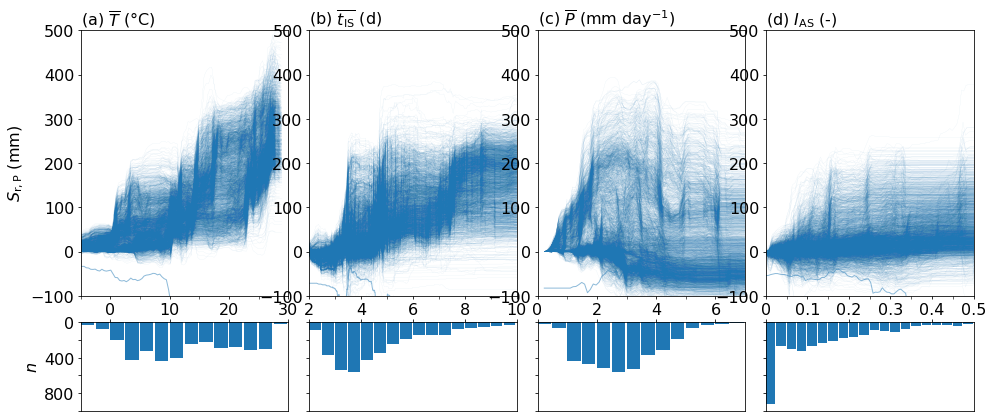

In [58]:
# centered ICE curves 
# ices based on 0-1 range, plot limited range
var = ['$\overline{T}$','$\overline{t_\mathrm{IS}}$','$\overline{P}$','$I_\mathrm{AS}$']
units = ['$\degree$C','d','mm $\mathrm{day}^{-1}$','-']
abcd = ['(a)','(b)','(c)','(d)']

major_t = [0,10,20,30]
minor_t = [-5,5,15,25]
major_idu = [2,4,6,8,10]
minor_idu = [3,5,7,9]
major_p = [0,2,4,6]
minor_p = [1,3,5]
major_asi = [0,0.1,0.2,0.3,0.4,0.5]
minor_asi = [0.05,0.15,0.25,0.35,0.45]
majors = [major_t,major_idu,major_p,major_asi]
minors = [minor_t,minor_idu,minor_p,minor_asi]

xlims = [[-5,30],[2,10],[0,7],[0,0.5]]

binst = np.arange(-10,32.5,2.5)
binsidu = np.arange(2,10.5,0.5)
binsp = np.arange(0,7.5,0.5)
binsasi = np.arange(0,0.525,0.025)
binslist = [binst,binsidu,binsp,binsasi]

# plot pdp TEST ALL CVS COMBINED
X = np.concatenate([X_train,X_test])
ddf = pd.concat([df_train,df_test])
fig3, ax = plt.subplots(2,len(features), figsize=(16,7),gridspec_kw={'height_ratios': [3, 1]})
plt.subplots_adjust(hspace=0.15,wspace=0.1)
for k in range(len(features)):
    ice0 = ics[0][k]
    ice1 = ics[1][k]
    ice2 = ics[2][k]
    ice3 = ics[3][k]
    ice4 = ics[4][k]
        
    pdp0 = ps[0][k]
    pdp1 = ps[1][k]
    pdp2 = ps[2][k]
    pdp3 = ps[3][k]
    pdp4 = ps[4][k]

    c = 'tab:blue'
    for i in ice0.index:
        ax[0,k].plot(ice0.columns.values, ice0.loc[i]-ice0.loc[i].iloc[0],color=c,alpha=0.5,linestyle='-',linewidth=0.05)
    for i in ice1.index:
        ax[0,k].plot(ice1.columns.values, ice1.loc[i]-ice1.loc[i].iloc[0],color=c,alpha=0.5,linestyle='-',linewidth=0.05)
    for i in ice2.index:
        ax[0,k].plot(ice2.columns.values, ice2.loc[i]-ice2.loc[i].iloc[0],color=c,alpha=0.5,linestyle='-',linewidth=0.05)
    for i in ice3.index:
        ax[0,k].plot(ice3.columns.values, ice3.loc[i]-ice3.loc[i].iloc[0],color=c,alpha=0.5,linestyle='-',linewidth=0.05)
    for i in ice4.index:
        ax[0,k].plot(ice4.columns.values, ice4.loc[i]-ice4.loc[i].iloc[0],color=c,alpha=0.5,linestyle='-',linewidth=0.05)
    ax[0,k].plot(ice0.columns.values, -1*ice0.iloc[0],color=c,alpha=0.5,linestyle='-',linewidth=1,label='Individual catchments')
    # ax[0,k].plot(pdp0.columns.values, pdp0.loc['median'],color='k',linestyle='-',linewidth=1, label='All catchments median')
    # ax[0,k].plot(pdp1.columns.values, pdp1.loc['median'],color='k',linestyle='-',linewidth=1)
    # ax[0,k].plot(pdp2.columns.values, pdp2.loc['median'],color='k',linestyle='-',linewidth=1)
    # ax[0,k].plot(pdp3.columns.values, pdp3.loc['median'],color='k',linestyle='-',linewidth=1)
    # ax[0,k].plot(pdp4.columns.values, pdp4.loc['median'],color='k',linestyle='-',linewidth=1)
    # ax[0,k].plot(pdp0.columns.values, pdp0.loc['p10'],color='k',linestyle=':',linewidth=1, label='All catchments P10')
    # ax[0,k].plot(pdp1.columns.values, pdp1.loc['p10'],color='k',linestyle=':',linewidth=1)
    # ax[0,k].plot(pdp2.columns.values, pdp2.loc['p10'],color='k',linestyle=':',linewidth=1)
    # ax[0,k].plot(pdp3.columns.values, pdp3.loc['p10'],color='k',linestyle=':',linewidth=1)
    # ax[0,k].plot(pdp4.columns.values, pdp4.loc['p10'],color='k',linestyle=':',linewidth=1)
    # ax[0,k].plot(pdp0.columns.values, pdp0.loc['p90'],color='k',linestyle='-.',linewidth=1, label='All catchments P90')
    # ax[0,k].plot(pdp1.columns.values, pdp1.loc['p90'],color='k',linestyle='-.',linewidth=1)
    # ax[0,k].plot(pdp2.columns.values, pdp2.loc['p90'],color='k',linestyle='-.',linewidth=1)
    # ax[0,k].plot(pdp3.columns.values, pdp3.loc['p90'],color='k',linestyle='-.',linewidth=1)
    # ax[0,k].plot(pdp4.columns.values, pdp4.loc['p90'],color='k',linestyle='-.',linewidth=1)
    ax[0,k].set_title(f'{abcd[k]} {var[k]} ({units[k]})',size=16, loc='left')
    ax[0,0].set_ylabel('$S_\mathrm{r,P}$ (mm)',size=16)
    ax[0,k].set_ylim(-100,500)
    # ax[0,k].set_xlim(np.quantile(df.loc[:,features[k]],0.05),np.quantile(df.loc[:,features[k]],0.95))
    ax[0,k].set_xlim(xlims[k])
    # print(np.quantile(df.loc[:,features[k]],0.05),np.quantile(df.loc[:,features[k]],0.95))
    # print(np.quantile(df.loc[:,features[k]],0.01),np.quantile(df.loc[:,features[k]],0.99))
    ax[0,k].tick_params(axis='both',labelsize=16)
    ax[0,k].tick_params(which='major', length=3)
    ax[0,k].tick_params(which='minor', length=3)
    ax[0,k].set_xticks(ticks=majors[k])
    ax[0,k].set_xticks(ticks=minors[k],minor=True)
    if(k==3):
        ax[0,3].set_xticklabels(['0','0.1','0.2','0.3','0.4','0.5'])
    # ax[0,k].set_yticks(ticks=[0,100,200,300,400,500,600,700])
    # ax[0,k].set_yticklabels(['','','','','','','',''])
    # ax[0,0].set_yticklabels(['0','100','200','300','400','500','600','700'])
    # ax[0,0].legend(loc='upper left',fontsize=13,handlelength=1.3)
           
    # bins = np.linspace(np.quantile(df.loc[:,features[k]],0),np.quantile(df.loc[:,features[k]],1),20)
    bins = binslist[k]
    ax[1,k].hist(df.loc[:,features[k]],bins=bins,width=0.9*(bins[1]-bins[0]),color=c)
    ax[1,k].invert_yaxis()
    ax[1,k].xaxis.tick_top()
    # ax[1,k].set_xlim(np.quantile(df.loc[:,features[k]],0.05),np.quantile(df.loc[:,features[k]],0.95))
    ax[1,k].axes.get_xaxis().set_ticklabels([])
    ax[1,0].set_ylabel('$n$',size=16)
    ax[1,k].tick_params(axis='both', labelsize=16)
    ax[1,k].set_ylim(1000,0)
    ax[1,k].set_yticks([0,200,400,600,800,1000])
    ax[1,k].set_yticklabels(['','','','','',''])
    ax[1,0].set_yticklabels(['0','','400','','800',''])
    ax[1,k].set_xlim(xlims[k])
    ax[1,k].tick_params(which='major', length=3)
    ax[1,k].tick_params(which='minor', length=3)
    
# fig3.savefig(f'{work_dir}/output/regression/figures/interpretation/pdp_alltest_{mod}_fullrange_limx.jpg',bbox_inches='tight',dpi=300)

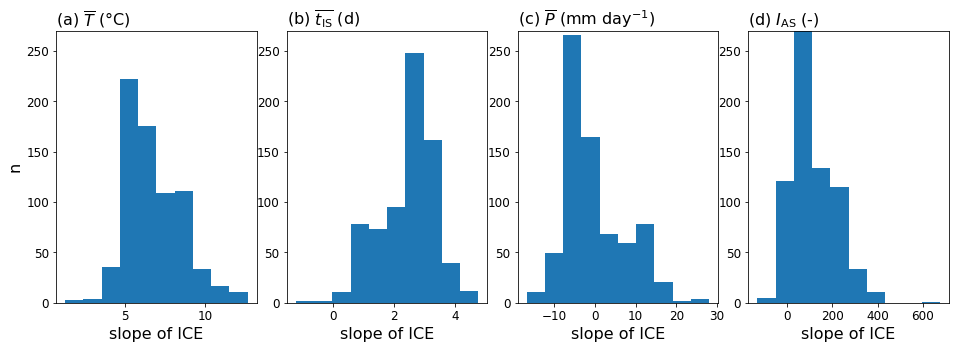

In [59]:
# histograms of ICE slopes --> do different groups really appear?
# plot pdp TEST ALL CVS COMBINED
X = np.concatenate([X_train,X_test])
ddf = pd.concat([df_train,df_test])
fig3, ax = plt.subplots(1,len(features), figsize=(16,5))
plt.subplots_adjust(wspace=0.15)
for k in range(len(features)):
    ice0 = ics[0][k]
    ice1 = ics[1][k]
    ice2 = ics[2][k]
    ice3 = ics[3][k]
    ice4 = ics[4][k]
    
    pdp0 = ps[0][k]
    pdp1 = ps[1][k]
    pdp2 = ps[2][k]
    pdp3 = ps[3][k]
    pdp4 = ps[4][k]

    c = 'tab:blue'
    slp0 = (ice0.iloc[:,-1] - ice0.iloc[:,0])/(ice0.columns[-1] - ice0.columns[0])
    slp1 = (ice1.iloc[:,-1] - ice1.iloc[:,0])/(ice1.columns[-1] - ice1.columns[0])
    slp2 = (ice2.iloc[:,-1] - ice2.iloc[:,0])/(ice2.columns[-1] - ice2.columns[0])
    slp3 = (ice3.iloc[:,-1] - ice3.iloc[:,0])/(ice3.columns[-1] - ice3.columns[0])
    slp4 = (ice4.iloc[:,-1] - ice4.iloc[:,0])/(ice4.columns[-1] - ice4.columns[0])
    
    ax[k].hist(slp0)
    ax[k].set_title(f'{abcd[k]} {var[k]} ({units[k]})',size=16, loc='left')
    ax[0].set_ylabel('n',size=16)
    ax[k].set_xlabel('slope of ICE',size=16)
    ax[k].set_ylim(0,270)
    ax[k].tick_params(axis='both',labelsize=12)



In [60]:
import matplotlib.pyplot as plt
import datashader as ds
import datashader.transfer_functions as tf
from datashader.mpl_ext import dsshow, alpha_colormap

In [61]:
# for the 5cvs the lines have different x-values so we cannot combine them all together in one dataframe and make density plot
# solution might be to fix same min and max point, and calculate pd with percentiles=[0,1] so it is constant
# density figure below is not very clear

In [62]:
# w = ics[0][3]
# points = len(w.columns)
# n = len(w)
# time = np.linspace(0, 1, points)
# w.index = pd.RangeIndex(0,len(w),1)
# w.columns = pd.RangeIndex(0,points,1)

# fig = plt.figure(figsize=(10,10))
# ax = fig.add_subplot(111)
# width = 250
# height = 400
# cvs = ds.Canvas(plot_height=height, plot_width=width)
# agg = cvs.line(w, x=time, y=list(range(points)), agg=ds.count(), axis=1, line_width=0)
# img = tf.shade(agg, how='eq_hist',cmap=cm.get_cmap('YlGnBu'))
# ax.imshow(img.to_pil())
# ax.set_xticks(np.arange(0,width,50))
# ax.set_yticks(np.arange(50,height+50,50))
# ax.set_yticklabels([700,600,500,400,300,200,100,0])

# # ax.set_xticklabels([0,
# fig.savefig(f'{work_dir}/output/regression/figures/interpretation/test.jpg',bbox_inches='tight',dpi=300)


## MAKE MANUAL SPLITS

In [63]:
c1 = '#FF1F5B'
c2 = '#009ADE'
c3 = '#AF58BA'
c4 = '#FFC61E'

In [64]:
def run_pca(gr1,gr2):
    f = f'{work_dir}/output/catchment_characteristics/master_characteristics_{data_sources}.csv'
    dfp = pd.read_csv(f,index_col=0)
    features = ['idu_mean','t_mean','asi','p_mean'] 
    ff = features
    ff.append('sr_20')
    dfp = dfp[ff]
    dfp = dfp.loc[ice.index]
    dfp.loc[gr1,'gr'] = 0
    dfp.loc[gr2,'gr'] = 1

    xx = dfp[features]
    xx = StandardScaler().fit_transform(xx) #standardize all values
    xx = pd.DataFrame(xx,columns=ff)
    pca = PCA(n_components=len(ff))
    components = pca.fit_transform(xx)
    loadings = pca.components_ #eigenvector, length represents variance var explains

    # Create dataframe
    pca_df = pd.DataFrame(data=components[:,0:2],columns=['PC1', 'PC2'])
    pca_df_scaled = pca_df.copy()
    scaler_df = pca_df[['PC1', 'PC2']]
    scaler = 1 / (scaler_df.max() - scaler_df.min()) # WAAROM DIT?

    for index in scaler.index:
        pca_df_scaled[index] *= scaler[index]
    per_var  = np.round(pca.explained_variance_ratio_ * 100, decimals=1)

    xs = loadings[0]
    ys = loadings[1]
    ld_df = pd.DataFrame(index=ff, columns=['xs','ys'])
    ld_df['xs'] = loadings[0]
    ld_df['ys'] = loadings[1]
    ld_df['len'] = np.sqrt(loadings[0]**2+loadings[1]**2)
    return (pca_df_scaled, ld_df, ff,dfp,per_var)

def run_pca2(gr1,gr2,gr3):
    f = f'{work_dir}/output/catchment_characteristics/master_characteristics_{data_sources}.csv'
    dfp = pd.read_csv(f,index_col=0)
    features = ['idu_mean','t_mean','asi','p_mean'] 
    ff = features
    ff.append('sr_20')
    dfp = dfp[ff]
    dfp = dfp.loc[ice.index]
    dfp.loc[gr1,'gr'] = 0
    dfp.loc[gr2,'gr'] = 1
    dfp.loc[gr3,'gr'] = 2

    xx = dfp[features]
    xx = StandardScaler().fit_transform(xx) #standardize all values
    xx = pd.DataFrame(xx,columns=ff)
    pca = PCA(n_components=len(ff))
    components = pca.fit_transform(xx)
    loadings = pca.components_ #eigenvector, length represents variance var explains

    # Create dataframe
    pca_df = pd.DataFrame(data=components[:,0:2],columns=['PC1', 'PC2'])
    pca_df_scaled = pca_df.copy()
    scaler_df = pca_df[['PC1', 'PC2']]
    scaler = 1 / (scaler_df.max() - scaler_df.min()) # WAAROM DIT?

    for index in scaler.index:
        pca_df_scaled[index] *= scaler[index]
    per_var  = np.round(pca.explained_variance_ratio_ * 100, decimals=1)

    xs = loadings[0]
    ys = loadings[1]
    ld_df = pd.DataFrame(index=ff, columns=['xs','ys'])
    ld_df['xs'] = loadings[0]
    ld_df['ys'] = loadings[1]
    ld_df['len'] = np.sqrt(loadings[0]**2+loadings[1]**2)
    return (pca_df_scaled, ld_df, ff,dfp,per_var)

In [65]:
# get ices
# idu_mean
k = 1
ice_idu0 = ics[0][k]
ice_idu1 = ics[1][k]
ice_idu2 = ics[2][k]
ice_idu3 = ics[3][k]
ice_idu4 = ics[4][k]

pdp_idu0 = ps[0][k]
pdp_idu1 = ps[1][k]
pdp_idu2 = ps[2][k]
pdp_idu3 = ps[3][k]
pdp_idu4 = ps[4][k]

# t_mean
k = 0 
ice_t0 = ics[0][k]
ice_t1 = ics[1][k]
ice_t2 = ics[2][k]
ice_t3 = ics[3][k]
ice_t4 = ics[4][k]

pdp_t0 = ps[0][k]
pdp_t1 = ps[1][k]
pdp_t2 = ps[2][k]
pdp_t3 = ps[3][k]
pdp_t4 = ps[4][k]

# asi
k = 3 
ice_asi0 = ics[0][k]
ice_asi1 = ics[1][k]
ice_asi2 = ics[2][k]
ice_asi3 = ics[3][k]
ice_asi4 = ics[4][k]

pdp_asi0 = ps[0][k]
pdp_asi1 = ps[1][k]
pdp_asi2 = ps[2][k]
pdp_asi3 = ps[3][k]
pdp_asi4 = ps[4][k]

# p_mean
k = 2
ice_p0 = ics[0][k]
ice_p1 = ics[1][k]
ice_p2 = ics[2][k]
ice_p3 = ics[3][k]
ice_p4 = ics[4][k]

pdp_p0 = ps[0][k]
pdp_p1 = ps[1][k]
pdp_p2 = ps[2][k]
pdp_p3 = ps[3][k]
pdp_p4 = ps[4][k]


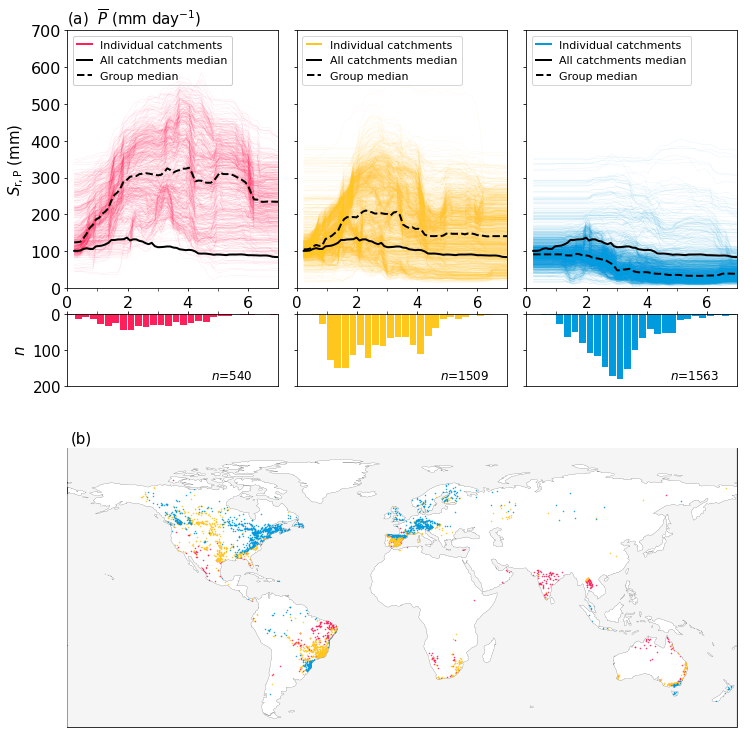

In [66]:
# make plots - ices - pmean - 3 different regimes - interpolated
var = ['t_mean','idu_mean','p_mean','asi']
var2 = ['$\overline{T}$','$I_\mathrm{ISD}$','$\overline{P}$','$I_\mathrm{AS}$']
pcavar = ['$\overline{T}$','$I_\mathrm{ISD}$','$\overline{P}$','$I_\mathrm{AS}$','$S_\mathrm{r}$']

major_t = [0,10,20,30]
minor_t = [-5,5,15,25]
major_idu = [2,4,6,8,10]
minor_idu = [3,5,7,9]
major_p = [0,2,4,6]
minor_p = [1,3,5]
major_asi = [0,0.1,0.2,0.3,0.4,0.5]
minor_asi = [0.05,0.15,0.25,0.35,0.45]
majors = [major_t,major_idu,major_p,major_asi]
minors = [minor_t,minor_idu,minor_p,minor_asi]

xlims = [[-5,30],[2,10],[0,7],[0,0.5]]

binst = np.arange(-10,32.5,2.5)
binsidu = np.arange(2,10.5,0.5)
binsp = np.arange(0,7.5,0.25)
binsasi = np.arange(0,0.525,0.025)
binslist = [binst,binsidu,binsp,binsasi]

m=2
k=2
grs1=[]
grs2=[]
grs3=[]
grs4=[]
fig = plt.figure(figsize=(12,15))
gs = fig.add_gridspec(ncols=3, nrows=5,height_ratios=[2.5,1,0.7,0.2,5],width_ratios=[1,1,1])
ax1 = fig.add_subplot(gs[0, 0])
ax3 = fig.add_subplot(gs[0, 1])
ax7 = fig.add_subplot(gs[0, 2])
ax2 = fig.add_subplot(gs[2:4, 0])
ax4 = fig.add_subplot(gs[2:4, 1])
ax8 = fig.add_subplot(gs[2:4, 2])
ax6 = fig.add_subplot(gs[4,:],projection=ccrs.PlateCarree())

ax1.set_title(f'(a)  {var2[m]} ({units[m]})',size=15, loc='left')
ax1.set_ylabel('$S_\mathrm{r,P}$ (mm)',size=15)
ax1.set_ylim(0,700)
# ax1.set_xlim(np.quantile(df.loc[:,var[m]],0.05),np.quantile(df.loc[:,var[m]],0.95))
ax1.tick_params(axis='both', labelsize=15)  
ax1.set_xlim(xlims[m])
ax1.tick_params(axis='both',labelsize=16)
ax1.tick_params(which='major', length=3)
ax1.tick_params(which='minor', length=3)
ax1.set_xticks(ticks=majors[k])
ax1.set_xticks(ticks=minors[k],minor=True)
ax1.set_yticks([0,100,200,300,400,500,600,700])
ax1.set_yticklabels(['','','','','','','',''])
ax1.set_yticklabels(['0','100','200','300','400','500','600','700'])

ax3.set_ylim(0,700)
# ax3.set_xlim(np.quantile(df.loc[:,var[m]],0.05),np.quantile(df.loc[:,var[m]],0.95))
ax3.tick_params(axis='both', labelsize=15)  
ax3.set_xlim(xlims[m])
ax3.tick_params(axis='both',labelsize=16)
ax3.tick_params(which='major', length=3)
ax3.tick_params(which='minor', length=3)
ax3.set_xticks(ticks=majors[k])
ax3.set_xticks(ticks=minors[k],minor=True)
ax3.tick_params(axis='both', labelsize=15)
ax3.set_yticks([0,100,200,300,400,500,600,700])
ax3.set_yticklabels(['','','','','','','',''])

ax7.set_ylim(0,700)
# ax7.set_xlim(np.quantile(df.loc[:,var[m]],0.05),np.quantile(df.loc[:,var[m]],0.95))
ax7.tick_params(axis='both', labelsize=15)  
ax7.set_xlim(xlims[m])
ax7.tick_params(axis='both',labelsize=16)
ax7.tick_params(which='major', length=3)
ax7.tick_params(which='minor', length=3)
ax7.set_xticks(ticks=majors[k])
ax7.set_xticks(ticks=minors[k],minor=True)
ax7.tick_params(axis='both', labelsize=15)
ax7.set_yticks([0,100,200,300,400,500,600,700])
ax7.set_yticklabels(['','','','','','','',''])

ax6.coastlines(linewidth=0.1)
ax6.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
ax6.set_global()
ax6.set_xlim(-180,180)
ax6.set_ylim(-60,90)
ax6.text(-178,93, f'(b)',zorder=101,size=15)
    
plt.subplots_adjust(wspace=0.09,hspace=-0.2)
ice_p = icsi[m]

# define groups
pos = []
neg = []
slp = (ice_p.iloc[:,-1] - ice_p.iloc[:,0])/(ice_p.columns[-1] - ice_p.columns[0])
for i in ice_p.index:
    if (slp.loc[i]>0):
        pos.append(i)
    if (slp.loc[i]<0):
        neg.append(i)

pm = slp.loc[pos].mean()
nm = slp.loc[neg].mean()
p1 = slp[slp>pm].index
p2 = slp[slp<pm].index

p = ice_p.index
p1 = []
p2 = []
p3 = []
p4 = []
grr = []
r = []
rr = []

for i in p:
    if ((ice_p.loc[i].idxmax()>3.2)&((ice_p.loc[i].iloc[30] - ice_p.loc[i].iloc[0])/(ice_p.columns[30] - ice_p.columns[0]) > 20)&(ice_p.loc[i].iloc[0]>20)):
        p1.append(i)
    else:
        if ((ice_p.loc[i].idxmax()>1.2)&((ice_p.loc[i].iloc[23] - ice_p.loc[i].iloc[0])/(ice_p.columns[23] - ice_p.columns[0]) > 6)):
            p2.append(i)
        else:
            if ((ice_p.loc[i].iloc[12] - ice_p.loc[i].iloc[0])/(ice_p.columns[12] - ice_p.columns[0]) > 8):
                p2.append(i)
            else:
                p3.append(i)
gr1 = p1
gr2 = p2
gr3 = p3
ice = ice_p
ylim = 200
mm = 0
grs1.append(gr1)
grs2.append(gr2)
grs3.append(gr3)
if (len(gr1)>0):
    gr = gr1
    j = 0
    for i in gr:
        ax1.plot(ice.columns.values, ice.loc[i],color=c1,linestyle='-',linewidth=0.08,alpha=0.5,zorder=1)
    ax1.plot(ice.columns.values, ice.loc[gr].median(),color='k',linestyle='--',linewidth=2,zorder=2)
    ax1.plot(ice.columns.values, ice.median(),color='k',linestyle='-',linewidth=2,zorder=2)

if (len(gr2)>0):
    gr = gr2
    j = 1
    for i in gr:
        ax3.plot(ice.columns.values, ice.loc[i],color=c4,linestyle='-',linewidth=0.08,alpha=0.5,zorder=1)
    ax3.plot(ice.columns.values, ice.loc[gr].median(),color='k',linestyle='--',linewidth=2,zorder=2)
    ax3.plot(ice.columns.values, ice.median(),color='k',linestyle='-',linewidth=2,zorder=2)

if (len(gr3)>0):
    gr = gr3
    j = 2
    for i in gr:
        ax7.plot(ice.columns.values, ice.loc[i],color=c2,linestyle='-',linewidth=0.08,alpha=0.5,zorder=1)
    ax7.plot(ice.columns.values, ice.loc[gr].median(),color='k',linestyle='--',linewidth=2,zorder=2)
    ax7.plot(ice.columns.values, ice.median(),color='k',linestyle='-',linewidth=2,zorder=2)

ddf = df.loc[ice.index]
ax6.plot(ddf.loc[gr1].lon, ddf.loc[gr1].lat,'o', markeredgecolor=c1, markerfacecolor=c1,markersize=0.5)
ax6.plot(ddf.loc[gr2].lon, ddf.loc[gr2].lat,'o', markeredgecolor=c4, markerfacecolor=c4,markersize=0.5)
ax6.plot(ddf.loc[gr3].lon, ddf.loc[gr3].lat,'o', markeredgecolor=c2, markerfacecolor=c2,markersize=0.5)

# bins = np.linspace(np.quantile(df.loc[:,var[m]],0.05),np.quantile(df.loc[:,var[m]],0.95),20)
bins = binslist[m]

ax2.hist(df.loc[gr1,features[m]],bins=bins,width=0.9*(bins[1]-bins[0]),color=c1)
ax2.invert_yaxis()
ax2.xaxis.tick_top()
# ax2.set_xlim(np.quantile(df.loc[:,var[m]],0.05),np.quantile(df.loc[:,var[m]],0.95))
ax2.axes.get_xaxis().set_ticklabels([])
ax2.set_ylabel('$n$',size=15)
ax2.tick_params(axis='both', labelsize=15)
ax2.set_ylim(ylim,0)
ax2.text(ice.columns.values[-56],ylim-20,f'$n$={len(gr1)}',size=12,zorder=10)
ax2.set_xlim(xlims[m])
ax2.set_xticks(ticks=majors[m])
ax2.set_xticks(ticks=minors[m],minor=True)
ax2.tick_params(which='major', length=3)
ax2.tick_params(which='minor', length=3)

ax4.hist(df.loc[gr2,features[m]],bins=bins,width=0.9*(bins[1]-bins[0]),color=c4)
ax4.invert_yaxis()
ax4.xaxis.tick_top()
# ax4.set_xlim(np.quantile(df.loc[:,var[m]],0.05),np.quantile(df.loc[:,var[m]],0.95))
ax4.axes.get_xaxis().set_ticklabels([])
ax4.tick_params(axis='both', labelsize=15)
ax4.set_ylim(ylim,0)
ax4.set_yticklabels([])
ax4.text(ice.columns.values[-56],ylim-20,f'$n$={len(gr2)}',size=12,zorder=10)
ax4.set_xlim(xlims[m])
ax4.set_xticks(ticks=majors[m])
ax4.set_xticks(ticks=minors[m],minor=True)
ax4.tick_params(which='major', length=3)
ax4.tick_params(which='minor', length=3)

ax8.hist(df.loc[gr3,features[m]],bins=bins,width=0.9*(bins[1]-bins[0]),color=c2)
ax8.invert_yaxis()
ax8.xaxis.tick_top()
# ax8.set_xlim(np.quantile(df.loc[:,var[m]],0.05),np.quantile(df.loc[:,var[m]],0.95))
ax8.axes.get_xaxis().set_ticklabels([])
ax8.tick_params(axis='both', labelsize=15)
ax8.set_ylim(ylim,0)
ax8.set_yticklabels([])
ax8.text(ice.columns.values[-56],ylim-20,f'$n$={len(gr3)}',size=12,zorder=10)
ax8.set_xlim(xlims[m])
ax8.set_xticks(ticks=majors[m])
ax8.set_xticks(ticks=minors[m],minor=True)
ax8.tick_params(which='major', length=3)
ax8.tick_params(which='minor', length=3)

ax1.plot([-1,-1],[-4,-4],color=c1,linestyle='-',linewidth=2, label='Individual catchments')
ax1.plot([-1,-1],[-4,-4],color='k',linestyle='-',linewidth=2, label='All catchments median')
ax1.plot([-1,-1],[-4,-4],color='k',linestyle='--',linewidth=2, label='Group median')
ax3.plot([-1,-1],[-4,-4],color=c4,linestyle='-',linewidth=2, label='Individual catchments')
ax3.plot([-1,-1],[-4,-4],color='k',linestyle='-',linewidth=2, label='All catchments median')
ax3.plot([-1,-1],[-4,-4],color='k',linestyle='--',linewidth=2, label='Group median')
ax7.plot([-1,-1],[-4,-4],color=c2,linestyle='-',linewidth=2, label='Individual catchments')
ax7.plot([-1,-1],[-4,-4],color='k',linestyle='-',linewidth=2, label='All catchments median')
ax7.plot([-1,-1],[-4,-4],color='k',linestyle='--',linewidth=2, label='Group median')

legend=ax1.legend(loc='upper left',fontsize=11,handlelength=1.3)
legend.get_frame().set_alpha(None)
legend.get_frame().set_facecolor((1, 1, 1, 0))
ax3.legend(loc='upper left',fontsize=11,handlelength=1.3)
ax7.legend(loc='upper left',fontsize=11,handlelength=1.3)
fig.savefig(f'{work_dir}/output/regression/figures/interpretation/ice_splitted_{var[m]}_3splitsv2.jpg',bbox_inches='tight',dpi=300)


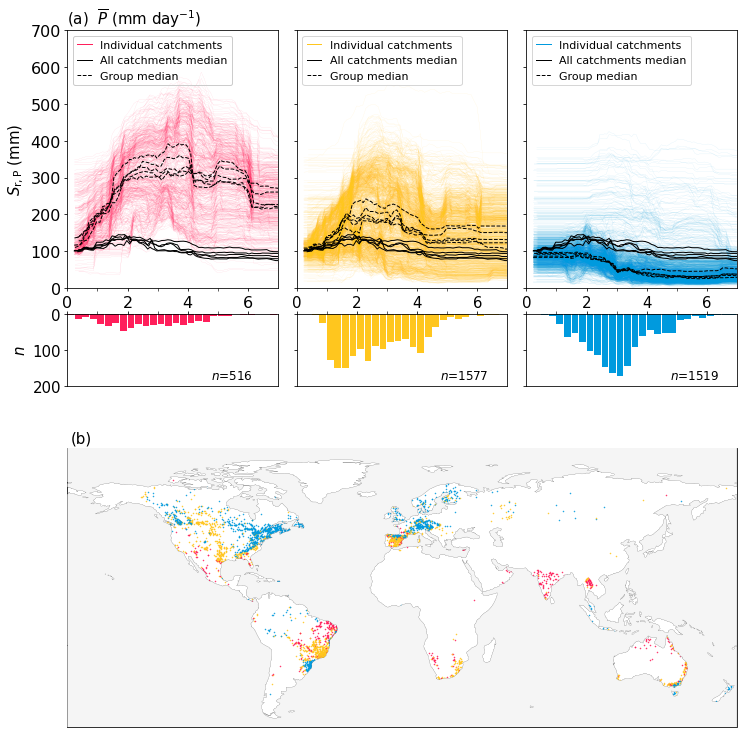

In [67]:
# make plots - ices - pmean - 3 different regimes
var = ['t_mean','idu_mean','p_mean','asi']
var2 = ['$\overline{T}$','$I_\mathrm{ISD}$','$\overline{P}$','$I_\mathrm{AS}$']
pcavar = ['$\overline{T}$','$I_\mathrm{ISD}$','$\overline{P}$','$I_\mathrm{AS}$','$S_\mathrm{r}$']

major_t = [0,10,20,30]
minor_t = [-5,5,15,25]
major_idu = [2,4,6,8,10]
minor_idu = [3,5,7,9]
major_p = [0,2,4,6]
minor_p = [1,3,5]
major_asi = [0,0.1,0.2,0.3,0.4,0.5]
minor_asi = [0.05,0.15,0.25,0.35,0.45]
majors = [major_t,major_idu,major_p,major_asi]
minors = [minor_t,minor_idu,minor_p,minor_asi]

xlims = [[-5,30],[2,10],[0,7],[0,0.5]]

binst = np.arange(-10,32.5,2.5)
binsidu = np.arange(2,10.5,0.5)
binsp = np.arange(0,7.5,0.25)
binsasi = np.arange(0,0.525,0.025)
binslist = [binst,binsidu,binsp,binsasi]

m=2
grs1=[]
grs2=[]
grs3=[]
grs4=[]
fig = plt.figure(figsize=(12,15))
gs = fig.add_gridspec(ncols=3, nrows=5,height_ratios=[2.5,1,0.7,0.2,5],width_ratios=[1,1,1])
ax1 = fig.add_subplot(gs[0, 0])
ax3 = fig.add_subplot(gs[0, 1])
ax7 = fig.add_subplot(gs[0, 2])
ax2 = fig.add_subplot(gs[2:4, 0])
ax4 = fig.add_subplot(gs[2:4, 1])
ax8 = fig.add_subplot(gs[2:4, 2])
ax6 = fig.add_subplot(gs[4,:],projection=ccrs.PlateCarree())

ax1.set_title(f'(a)  {var2[m]} ({units[m]})',size=15, loc='left')
ax1.set_ylabel('$S_\mathrm{r,P}$ (mm)',size=15)
ax1.set_ylim(0,700)
# ax1.set_xlim(np.quantile(df.loc[:,var[m]],0.05),np.quantile(df.loc[:,var[m]],0.95))
ax1.tick_params(axis='both', labelsize=15)  
ax1.set_xlim(xlims[m])
ax1.tick_params(axis='both',labelsize=16)
ax1.tick_params(which='major', length=3)
ax1.tick_params(which='minor', length=3)
ax1.set_xticks(ticks=majors[k])
ax1.set_xticks(ticks=minors[k],minor=True)
ax1.set_yticks([0,100,200,300,400,500,600,700])
ax1.set_yticklabels(['','','','','','','',''])
ax1.set_yticklabels(['0','100','200','300','400','500','600','700'])

ax3.set_ylim(0,700)
# ax3.set_xlim(np.quantile(df.loc[:,var[m]],0.05),np.quantile(df.loc[:,var[m]],0.95))
ax3.tick_params(axis='both', labelsize=15)  
ax3.set_xlim(xlims[m])
ax3.tick_params(axis='both',labelsize=16)
ax3.tick_params(which='major', length=3)
ax3.tick_params(which='minor', length=3)
ax3.set_xticks(ticks=majors[k])
ax3.set_xticks(ticks=minors[k],minor=True)
ax3.tick_params(axis='both', labelsize=15)
ax3.set_yticks([0,100,200,300,400,500,600,700])
ax3.set_yticklabels(['','','','','','','',''])

ax7.set_ylim(0,700)
# ax7.set_xlim(np.quantile(df.loc[:,var[m]],0.05),np.quantile(df.loc[:,var[m]],0.95))
ax7.tick_params(axis='both', labelsize=15)  
ax7.set_xlim(xlims[m])
ax7.tick_params(axis='both',labelsize=16)
ax7.tick_params(which='major', length=3)
ax7.tick_params(which='minor', length=3)
ax7.set_xticks(ticks=majors[k])
ax7.set_xticks(ticks=minors[k],minor=True)
ax7.tick_params(axis='both', labelsize=15)
ax7.set_yticks([0,100,200,300,400,500,600,700])
ax7.set_yticklabels(['','','','','','','',''])

ax6.coastlines(linewidth=0.1)
ax6.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
ax6.set_global()
ax6.set_xlim(-180,180)
ax6.set_ylim(-60,90)
ax6.text(-178,93, f'(b)',zorder=101,size=15)
    
plt.subplots_adjust(wspace=0.09,hspace=-0.2)
for i in range(5):
    if(i==0):
        ice_p = ice_p0
    if(i==1):
        ice_p = ice_p1
    if(i==2):
        ice_p = ice_p2
    if(i==3):
        ice_p = ice_p3
    if(i==4):
        ice_p = ice_p4

    # define groups
    pos = []
    neg = []
    slp = (ice_p.iloc[:,-1] - ice_p.iloc[:,0])/(ice_p.columns[-1] - ice_p.columns[0])
    for i in ice_p.index:
        if (slp.loc[i]>0):
            pos.append(i)
        if (slp.loc[i]<0):
            neg.append(i)

    pm = slp.loc[pos].mean()
    nm = slp.loc[neg].mean()
    p1 = slp[slp>pm].index
    p2 = slp[slp<pm].index

    p = ice_p.index
    p1 = []
    p2 = []
    p3 = []
    p4 = []
    grr = []
    r = []
    rr = []
    
    for i in p:
        if ((ice_p.loc[i].idxmax()>3.2)&((ice_p.loc[i].iloc[30] - ice_p.loc[i].iloc[0])/(ice_p.columns[30] - ice_p.columns[0]) > 20)&(ice_p.loc[i].iloc[0]>20)):
            p1.append(i)
        else:
            if ((ice_p.loc[i].idxmax()>1.2)&((ice_p.loc[i].iloc[23] - ice_p.loc[i].iloc[0])/(ice_p.columns[23] - ice_p.columns[0]) > 6)):
                p2.append(i)
            else:
                if ((ice_p.loc[i].iloc[12] - ice_p.loc[i].iloc[0])/(ice_p.columns[12] - ice_p.columns[0]) > 8):
                    p2.append(i)
                else:
                    p3.append(i)
    gr1 = p1
    gr2 = p2
    gr3 = p3
    ice = ice_p
    ylim = 200
    mm = 0
    grs1.append(gr1)
    grs2.append(gr2)
    grs3.append(gr3)
    if (len(gr1)>0):
        gr = gr1
        j = 0
        for i in gr:
            ax1.plot(ice.columns.values, ice.loc[i],color=c1,linestyle='-',linewidth=0.08,alpha=0.5,zorder=1)
        ax1.plot(ice.columns.values, ice.loc[gr].median(),color='k',linestyle='--',linewidth=1,zorder=2)
        ax1.plot(ice.columns.values, ice.median(),color='k',linestyle='-',linewidth=1,zorder=2)

    if (len(gr2)>0):
        gr = gr2
        j = 1
        for i in gr:
            ax3.plot(ice.columns.values, ice.loc[i],color=c4,linestyle='-',linewidth=0.08,alpha=0.5,zorder=1)
        ax3.plot(ice.columns.values, ice.loc[gr].median(),color='k',linestyle='--',linewidth=1,zorder=2)
        ax3.plot(ice.columns.values, ice.median(),color='k',linestyle='-',linewidth=1,zorder=2)

    if (len(gr3)>0):
        gr = gr3
        j = 2
        for i in gr:
            ax7.plot(ice.columns.values, ice.loc[i],color=c2,linestyle='-',linewidth=0.08,alpha=0.5,zorder=1)
        ax7.plot(ice.columns.values, ice.loc[gr].median(),color='k',linestyle='--',linewidth=1,zorder=2)
        ax7.plot(ice.columns.values, ice.median(),color='k',linestyle='-',linewidth=1,zorder=2)
    
    ddf = df.loc[ice.index]
    ax6.plot(ddf.loc[gr1].lon, ddf.loc[gr1].lat,'o', markeredgecolor=c1, markerfacecolor=c1,markersize=0.5)
    ax6.plot(ddf.loc[gr2].lon, ddf.loc[gr2].lat,'o', markeredgecolor=c4, markerfacecolor=c4,markersize=0.5)
    ax6.plot(ddf.loc[gr3].lon, ddf.loc[gr3].lat,'o', markeredgecolor=c2, markerfacecolor=c2,markersize=0.5)

# bins = np.linspace(np.quantile(df.loc[:,var[m]],0.05),np.quantile(df.loc[:,var[m]],0.95),20)
bins = binslist[m]

ax2.hist(df.loc[np.array(grs1[0]+grs1[1]+grs1[2]+grs1[3]+grs1[4]),features[m]],bins=bins,width=0.9*(bins[1]-bins[0]),color=c1)
ax2.invert_yaxis()
ax2.xaxis.tick_top()
# ax2.set_xlim(np.quantile(df.loc[:,var[m]],0.05),np.quantile(df.loc[:,var[m]],0.95))
ax2.axes.get_xaxis().set_ticklabels([])
ax2.set_ylabel('$n$',size=15)
ax2.tick_params(axis='both', labelsize=15)
ax2.set_ylim(ylim,0)
ax2.text(ice.columns.values[-56],ylim-20,f'$n$={len(np.array(grs1[0]+grs1[1]+grs1[2]+grs1[3]+grs1[4]))}',size=12,zorder=10)
ax2.set_xlim(xlims[m])
ax2.set_xticks(ticks=majors[m])
ax2.set_xticks(ticks=minors[m],minor=True)
ax2.tick_params(which='major', length=3)
ax2.tick_params(which='minor', length=3)

ax4.hist(df.loc[np.concatenate([grs2[0],grs2[1],grs2[2],grs2[3],grs2[4]]),features[m]],bins=bins,width=0.9*(bins[1]-bins[0]),color=c4)
ax4.invert_yaxis()
ax4.xaxis.tick_top()
# ax4.set_xlim(np.quantile(df.loc[:,var[m]],0.05),np.quantile(df.loc[:,var[m]],0.95))
ax4.axes.get_xaxis().set_ticklabels([])
ax4.tick_params(axis='both', labelsize=15)
ax4.set_ylim(ylim,0)
ax4.set_yticklabels([])
ax4.text(ice.columns.values[-56],ylim-20,f'$n$={len(np.concatenate([grs2[0],grs2[1],grs2[2],grs2[3],grs2[4]]))}',size=12,zorder=10)
ax4.set_xlim(xlims[m])
ax4.set_xticks(ticks=majors[m])
ax4.set_xticks(ticks=minors[m],minor=True)
ax4.tick_params(which='major', length=3)
ax4.tick_params(which='minor', length=3)

ax8.hist(df.loc[np.concatenate([grs3[0],grs3[1],grs3[2],grs3[3],grs3[4]]),features[m]],bins=bins,width=0.9*(bins[1]-bins[0]),color=c2)
ax8.invert_yaxis()
ax8.xaxis.tick_top()
# ax8.set_xlim(np.quantile(df.loc[:,var[m]],0.05),np.quantile(df.loc[:,var[m]],0.95))
ax8.axes.get_xaxis().set_ticklabels([])
ax8.tick_params(axis='both', labelsize=15)
ax8.set_ylim(ylim,0)
ax8.set_yticklabels([])
ax8.text(ice.columns.values[-56],ylim-20,f'$n$={len(np.concatenate([grs3[0],grs3[1],grs3[2],grs3[3],grs3[4]]))}',size=12,zorder=10)
ax8.set_xlim(xlims[m])
ax8.set_xticks(ticks=majors[m])
ax8.set_xticks(ticks=minors[m],minor=True)
ax8.tick_params(which='major', length=3)
ax8.tick_params(which='minor', length=3)

ax1.plot([-1,-1],[-4,-4],color=c1,linestyle='-',linewidth=1, label='Individual catchments')
ax1.plot([-1,-1],[-4,-4],color='k',linestyle='-',linewidth=1, label='All catchments median')
ax1.plot([-1,-1],[-4,-4],color='k',linestyle='--',linewidth=1, label='Group median')
ax3.plot([-1,-1],[-4,-4],color=c4,linestyle='-',linewidth=1, label='Individual catchments')
ax3.plot([-1,-1],[-4,-4],color='k',linestyle='-',linewidth=1, label='All catchments median')
ax3.plot([-1,-1],[-4,-4],color='k',linestyle='--',linewidth=1, label='Group median')
ax7.plot([-1,-1],[-4,-4],color=c2,linestyle='-',linewidth=1, label='Individual catchments')
ax7.plot([-1,-1],[-4,-4],color='k',linestyle='-',linewidth=1, label='All catchments median')
ax7.plot([-1,-1],[-4,-4],color='k',linestyle='--',linewidth=1, label='Group median')

legend=ax1.legend(loc='upper left',fontsize=11,handlelength=1.3)
legend.get_frame().set_alpha(None)
legend.get_frame().set_facecolor((1, 1, 1, 0))
ax3.legend(loc='upper left',fontsize=11,handlelength=1.3)
ax7.legend(loc='upper left',fontsize=11,handlelength=1.3)
fig.savefig(f'{work_dir}/output/regression/figures/interpretation/ice_splitted_{var[m]}_3splitsv2.jpg',bbox_inches='tight',dpi=300)


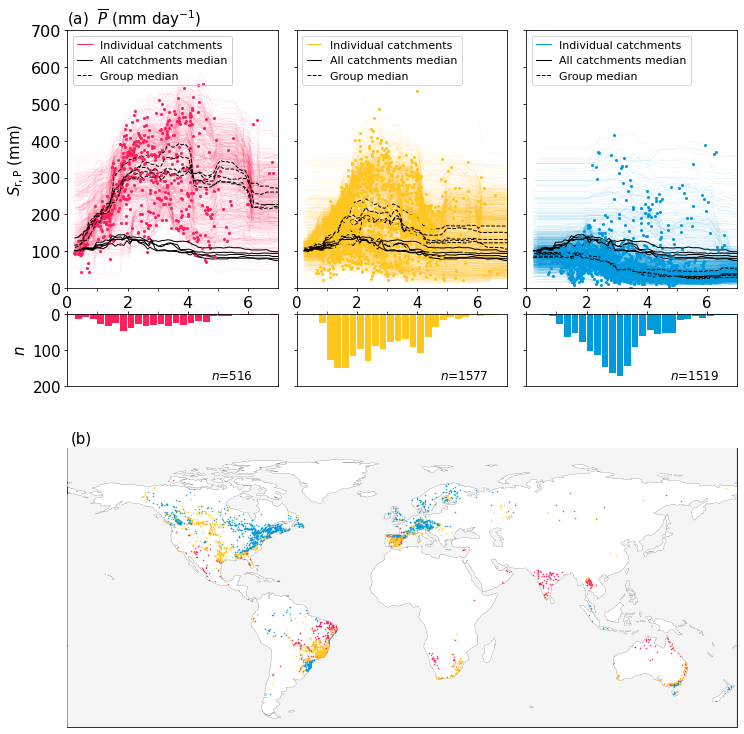

In [68]:
# make plots - ices - pmean - 3 different regimes with points
var = ['t_mean','idu_mean','p_mean','asi']
var2 = ['$\overline{T}$','$I_\mathrm{ISD}$','$\overline{P}$','$I_\mathrm{AS}$']
pcavar = ['$\overline{T}$','$I_\mathrm{ISD}$','$\overline{P}$','$I_\mathrm{AS}$','$S_\mathrm{r}$']

major_t = [0,10,20,30]
minor_t = [-5,5,15,25]
major_idu = [2,4,6,8,10]
minor_idu = [3,5,7,9]
major_p = [0,2,4,6]
minor_p = [1,3,5]
major_asi = [0,0.1,0.2,0.3,0.4,0.5]
minor_asi = [0.05,0.15,0.25,0.35,0.45]
majors = [major_t,major_idu,major_p,major_asi]
minors = [minor_t,minor_idu,minor_p,minor_asi]

xlims = [[-5,30],[2,10],[0,7],[0,0.5]]

binst = np.arange(-10,32.5,2.5)
binsidu = np.arange(2,10.5,0.5)
binsp = np.arange(0,7.5,0.25)
binsasi = np.arange(0,0.525,0.025)
binslist = [binst,binsidu,binsp,binsasi]

m=2
grs1=[]
grs2=[]
grs3=[]
grs4=[]
fig = plt.figure(figsize=(12,15))
gs = fig.add_gridspec(ncols=3, nrows=5,height_ratios=[2.5,1,0.7,0.2,5],width_ratios=[1,1,1])
ax1 = fig.add_subplot(gs[0, 0])
ax3 = fig.add_subplot(gs[0, 1])
ax7 = fig.add_subplot(gs[0, 2])
ax2 = fig.add_subplot(gs[2:4, 0])
ax4 = fig.add_subplot(gs[2:4, 1])
ax8 = fig.add_subplot(gs[2:4, 2])
ax6 = fig.add_subplot(gs[4,:],projection=ccrs.PlateCarree())

ax1.set_title(f'(a)  {var2[m]} ({units[m]})',size=15, loc='left')
ax1.set_ylabel('$S_\mathrm{r,P}$ (mm)',size=15)
ax1.set_ylim(0,700)
# ax1.set_xlim(np.quantile(df.loc[:,var[m]],0.05),np.quantile(df.loc[:,var[m]],0.95))
ax1.tick_params(axis='both', labelsize=15)  
ax1.set_xlim(xlims[m])
ax1.tick_params(axis='both',labelsize=16)
ax1.tick_params(which='major', length=3)
ax1.tick_params(which='minor', length=3)
ax1.set_xticks(ticks=majors[k])
ax1.set_xticks(ticks=minors[k],minor=True)
ax1.set_yticks([0,100,200,300,400,500,600,700])
ax1.set_yticklabels(['','','','','','','',''])
ax1.set_yticklabels(['0','100','200','300','400','500','600','700'])

ax3.set_ylim(0,700)
# ax3.set_xlim(np.quantile(df.loc[:,var[m]],0.05),np.quantile(df.loc[:,var[m]],0.95))
ax3.tick_params(axis='both', labelsize=15)  
ax3.set_xlim(xlims[m])
ax3.tick_params(axis='both',labelsize=16)
ax3.tick_params(which='major', length=3)
ax3.tick_params(which='minor', length=3)
ax3.set_xticks(ticks=majors[k])
ax3.set_xticks(ticks=minors[k],minor=True)
ax3.tick_params(axis='both', labelsize=15)
ax3.set_yticks([0,100,200,300,400,500,600,700])
ax3.set_yticklabels(['','','','','','','',''])

ax7.set_ylim(0,700)
# ax7.set_xlim(np.quantile(df.loc[:,var[m]],0.05),np.quantile(df.loc[:,var[m]],0.95))
ax7.tick_params(axis='both', labelsize=15)  
ax7.set_xlim(xlims[m])
ax7.tick_params(axis='both',labelsize=16)
ax7.tick_params(which='major', length=3)
ax7.tick_params(which='minor', length=3)
ax7.set_xticks(ticks=majors[k])
ax7.set_xticks(ticks=minors[k],minor=True)
ax7.tick_params(axis='both', labelsize=15)
ax7.set_yticks([0,100,200,300,400,500,600,700])
ax7.set_yticklabels(['','','','','','','',''])

ax6.coastlines(linewidth=0.1)
ax6.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
ax6.set_global()
ax6.set_xlim(-180,180)
ax6.set_ylim(-60,90)
ax6.text(-178,93, f'(b)',zorder=101,size=15)
    
plt.subplots_adjust(wspace=0.09,hspace=-0.2)
for i in range(5):
    if(i==0):
        ice_p = ice_p0
    if(i==1):
        ice_p = ice_p1
    if(i==2):
        ice_p = ice_p2
    if(i==3):
        ice_p = ice_p3
    if(i==4):
        ice_p = ice_p4

    # define groups
    pos = []
    neg = []
    slp = (ice_p.iloc[:,-1] - ice_p.iloc[:,0])/(ice_p.columns[-1] - ice_p.columns[0])
    for i in ice_p.index:
        if (slp.loc[i]>0):
            pos.append(i)
        if (slp.loc[i]<0):
            neg.append(i)

    pm = slp.loc[pos].mean()
    nm = slp.loc[neg].mean()
    p1 = slp[slp>pm].index
    p2 = slp[slp<pm].index

    p = ice_p.index
    p1 = []
    p2 = []
    p3 = []
    p4 = []
    grr = []
    r = []
    rr = []
    
    for i in p:
        if ((ice_p.loc[i].idxmax()>3.2)&((ice_p.loc[i].iloc[30] - ice_p.loc[i].iloc[0])/(ice_p.columns[30] - ice_p.columns[0]) > 20)&(ice_p.loc[i].iloc[0]>20)):
            p1.append(i)
        else:
            if ((ice_p.loc[i].idxmax()>1.2)&((ice_p.loc[i].iloc[23] - ice_p.loc[i].iloc[0])/(ice_p.columns[23] - ice_p.columns[0]) > 6)):
                p2.append(i)
            else:
                if ((ice_p.loc[i].iloc[12] - ice_p.loc[i].iloc[0])/(ice_p.columns[12] - ice_p.columns[0]) > 8):
                    p2.append(i)
                else:
                    p3.append(i)
    gr1 = p1
    gr2 = p2
    gr3 = p3
    ice = ice_p
    ylim = 200
    mm = 0
    grs1.append(gr1)
    grs2.append(gr2)
    grs3.append(gr3)
    if (len(gr1)>0):
        gr = gr1
        j = 0
        for i in gr:
            ax1.plot(ice.columns.values, ice.loc[i],color=c1,linestyle='-',linewidth=0.08,alpha=0.5,zorder=1)
            ax1.plot(df.loc[i,'p_mean'],test_dfs.loc[i,'Sr_p'],'o',color=c1,markersize=2)
        ax1.plot(ice.columns.values, ice.loc[gr].median(),color='k',linestyle='--',linewidth=1,zorder=2)
        ax1.plot(ice.columns.values, ice.median(),color='k',linestyle='-',linewidth=1,zorder=2)

    if (len(gr2)>0):
        gr = gr2
        j = 1
        for i in gr:
            ax3.plot(ice.columns.values, ice.loc[i],color=c4,linestyle='-',linewidth=0.08,alpha=0.5,zorder=1)
            ax3.plot(df.loc[i,'p_mean'],test_dfs.loc[i,'Sr_p'],'o',color=c4,markersize=2)
        ax3.plot(ice.columns.values, ice.loc[gr].median(),color='k',linestyle='--',linewidth=1,zorder=2)
        ax3.plot(ice.columns.values, ice.median(),color='k',linestyle='-',linewidth=1,zorder=2)

    if (len(gr3)>0):
        gr = gr3
        j = 2
        for i in gr:
            ax7.plot(ice.columns.values, ice.loc[i],color=c2,linestyle='-',linewidth=0.08,alpha=0.5,zorder=1)
            ax7.plot(df.loc[i,'p_mean'],test_dfs.loc[i,'Sr_p'],'o',color=c2,markersize=2)
        ax7.plot(ice.columns.values, ice.loc[gr].median(),color='k',linestyle='--',linewidth=1,zorder=2)
        ax7.plot(ice.columns.values, ice.median(),color='k',linestyle='-',linewidth=1,zorder=2)
    
    ddf = df.loc[ice.index]
    ax6.plot(ddf.loc[gr1].lon, ddf.loc[gr1].lat,'o', markeredgecolor=c1, markerfacecolor=c1,markersize=0.5)
    ax6.plot(ddf.loc[gr2].lon, ddf.loc[gr2].lat,'o', markeredgecolor=c4, markerfacecolor=c4,markersize=0.5)
    ax6.plot(ddf.loc[gr3].lon, ddf.loc[gr3].lat,'o', markeredgecolor=c2, markerfacecolor=c2,markersize=0.5)

# bins = np.linspace(np.quantile(df.loc[:,var[m]],0.05),np.quantile(df.loc[:,var[m]],0.95),20)
bins = binslist[m]

ax2.hist(df.loc[np.array(grs1[0]+grs1[1]+grs1[2]+grs1[3]+grs1[4]),features[m]],bins=bins,width=0.9*(bins[1]-bins[0]),color=c1)
ax2.invert_yaxis()
ax2.xaxis.tick_top()
# ax2.set_xlim(np.quantile(df.loc[:,var[m]],0.05),np.quantile(df.loc[:,var[m]],0.95))
ax2.axes.get_xaxis().set_ticklabels([])
ax2.set_ylabel('$n$',size=15)
ax2.tick_params(axis='both', labelsize=15)
ax2.set_ylim(ylim,0)
ax2.text(ice.columns.values[-56],ylim-20,f'$n$={len(np.array(grs1[0]+grs1[1]+grs1[2]+grs1[3]+grs1[4]))}',size=12,zorder=10)
ax2.set_xlim(xlims[m])
ax2.tick_params(which='major', length=3)
ax2.tick_params(which='minor', length=3)
ax2.set_xticks(ticks=majors[m])
ax2.set_xticks(ticks=minors[m],minor=True)

ax4.hist(df.loc[np.concatenate([grs2[0],grs2[1],grs2[2],grs2[3],grs2[4]]),features[m]],bins=bins,width=0.9*(bins[1]-bins[0]),color=c4)
ax4.invert_yaxis()
ax4.xaxis.tick_top()
# ax4.set_xlim(np.quantile(df.loc[:,var[m]],0.05),np.quantile(df.loc[:,var[m]],0.95))
ax4.axes.get_xaxis().set_ticklabels([])
ax4.tick_params(axis='both', labelsize=15)
ax4.set_ylim(ylim,0)
ax4.set_yticklabels([])
ax4.text(ice.columns.values[-56],ylim-20,f'$n$={len(np.concatenate([grs2[0],grs2[1],grs2[2],grs2[3],grs2[4]]))}',size=12,zorder=10)
ax4.set_xlim(xlims[m])
ax4.tick_params(which='major', length=3)
ax4.tick_params(which='minor', length=3)
ax4.set_xticks(ticks=majors[m])
ax4.set_xticks(ticks=minors[m],minor=True)

ax8.hist(df.loc[np.concatenate([grs3[0],grs3[1],grs3[2],grs3[3],grs3[4]]),features[m]],bins=bins,width=0.9*(bins[1]-bins[0]),color=c2)
ax8.invert_yaxis()
ax8.xaxis.tick_top()
# ax8.set_xlim(np.quantile(df.loc[:,var[m]],0.05),np.quantile(df.loc[:,var[m]],0.95))
ax8.axes.get_xaxis().set_ticklabels([])
ax8.tick_params(axis='both', labelsize=15)
ax8.set_ylim(ylim,0)
ax8.set_yticklabels([])
ax8.text(ice.columns.values[-56],ylim-20,f'$n$={len(np.concatenate([grs3[0],grs3[1],grs3[2],grs3[3],grs3[4]]))}',size=12,zorder=10)
ax8.set_xlim(xlims[m])
ax8.tick_params(which='major', length=3)
ax8.tick_params(which='minor', length=3)
ax8.set_xticks(ticks=majors[m])
ax8.set_xticks(ticks=minors[m],minor=True)

ax1.plot([-1,-1],[-4,-4],color=c1,linestyle='-',linewidth=1, label='Individual catchments')
ax1.plot([-1,-1],[-4,-4],color='k',linestyle='-',linewidth=1, label='All catchments median')
ax1.plot([-1,-1],[-4,-4],color='k',linestyle='--',linewidth=1, label='Group median')
ax3.plot([-1,-1],[-4,-4],color=c4,linestyle='-',linewidth=1, label='Individual catchments')
ax3.plot([-1,-1],[-4,-4],color='k',linestyle='-',linewidth=1, label='All catchments median')
ax3.plot([-1,-1],[-4,-4],color='k',linestyle='--',linewidth=1, label='Group median')
ax7.plot([-1,-1],[-4,-4],color=c2,linestyle='-',linewidth=1, label='Individual catchments')
ax7.plot([-1,-1],[-4,-4],color='k',linestyle='-',linewidth=1, label='All catchments median')
ax7.plot([-1,-1],[-4,-4],color='k',linestyle='--',linewidth=1, label='Group median')

legend=ax1.legend(loc='upper left',fontsize=11,handlelength=1.3)
legend.get_frame().set_alpha(None)
legend.get_frame().set_facecolor((1, 1, 1, 0))
ax3.legend(loc='upper left',fontsize=11,handlelength=1.3)
ax7.legend(loc='upper left',fontsize=11,handlelength=1.3)
fig.savefig(f'{work_dir}/output/regression/figures/interpretation/ice_splitted_{var[m]}_3splitsv2_points.jpg',bbox_inches='tight',dpi=300)



In [ ]:
cmap = ListedColormap([c1,c4,c2])
df = pd.read_csv(f'{work_dir}/output/catchment_characteristics/master_characteristics_{data_sources}_v2.csv',index_col=0)
df = df.drop(columns=['ppd_l'])
df = df[df.p_mean-df.q_mean < df.ep_mean]
df = df[['p_mean','ep_mean', 't_mean','tdiff_mean','idu_mean', 'si_ep','si_p', 'asi','dtb','ia','slp_mean','el_mean','tc','ntc','nonveg','pclay','psand','lai_mean','lai_rsd','sc_mean','sc_rsd','sr_20','lat','lon']]
df = df.dropna()
features = ['t_mean','idu_mean','p_mean','asi','sr_20']
df.loc[list(itertools.chain.from_iterable(grs1)),'gr'] = 0
df.loc[list(itertools.chain.from_iterable(grs2)),'gr'] = 1
df.loc[list(itertools.chain.from_iterable(grs3)),'gr'] = 2
# df.loc[gr4,'gr'] = 3

xx = df[features]
xx = StandardScaler().fit_transform(xx) #standardize all values
xx = pd.DataFrame(xx,columns=ff)
pca = PCA(n_components=len(ff))
components = pca.fit_transform(xx)
loadings = pca.components_ #eigenvector, length represents variance var explains

# Create dataframe
pca_df = pd.DataFrame(data=components[:,0:2],columns=['PC1', 'PC2'])
pca_df_scaled = pca_df.copy()
scaler_df = pca_df[['PC1', 'PC2']]
scaler = 1 / (scaler_df.max() - scaler_df.min()) # WAAROM DIT?
 
for index in scaler.index:
    pca_df_scaled[index] *= scaler[index]

per_var  = np.round(pca.explained_variance_ratio_ * 100, decimals=1)

xs = loadings[0]
ys = loadings[1]
ld_df = pd.DataFrame(index=ff, columns=['xs','ys'])
ld_df['xs'] = loadings[0]
ld_df['ys'] = loadings[1]
ld_df['len'] = np.sqrt(loadings[0]**2+loadings[1]**2)

fig=plt.figure(figsize=(6,6))
ax = fig.add_subplot(111)
ax.scatter(pca_df_scaled.PC1,pca_df_scaled.PC2,s=1,alpha=0.5,c=df.gr,cmap=cmap)
for i, varnames in enumerate(ff):
    ax.arrow(
        0, 0, # coordinates of arrow base
        ld_df.loc[ff[i]]['xs'], # length of the arrow along x
        ld_df.loc[ff[i]]['ys'], # length of the arrow along y
        color='grey',
        head_width=0.02
        )
    ax.text(ld_df.loc[ff[i]]['xs']+0.02, ld_df.loc[ff[i]]['ys']+0.02, varnames,size=12)
# xticks = np.linspace(-0.5,0.7, num=5)
# yticks = np.linspace(-0.3,0.8, num=5)
# ax.set_xticks(xticks)
# ax.set_yticks(yticks)
ax.tick_params(axis='both', which='major', labelsize=12)
ax.set_xlabel(f'PC1 {per_var[0]}%',size=14)
ax.set_ylabel(f'PC2 {per_var[1]}%',size=14)

fig.savefig(f'{work_dir}/output/regression/figures/interpretation/pca_p_mean_splitted.jpg',bbox_inches='tight',dpi=300)


## KG CLASSIFICATION

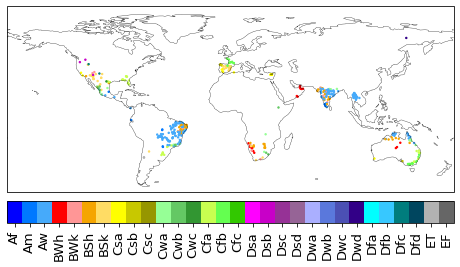

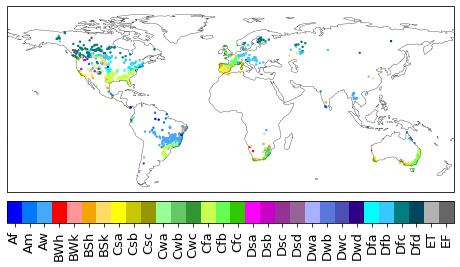

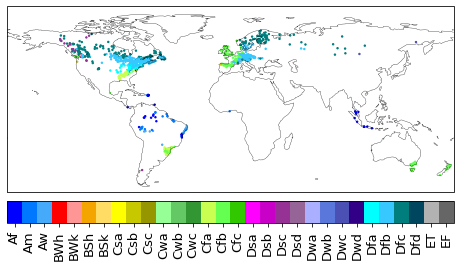

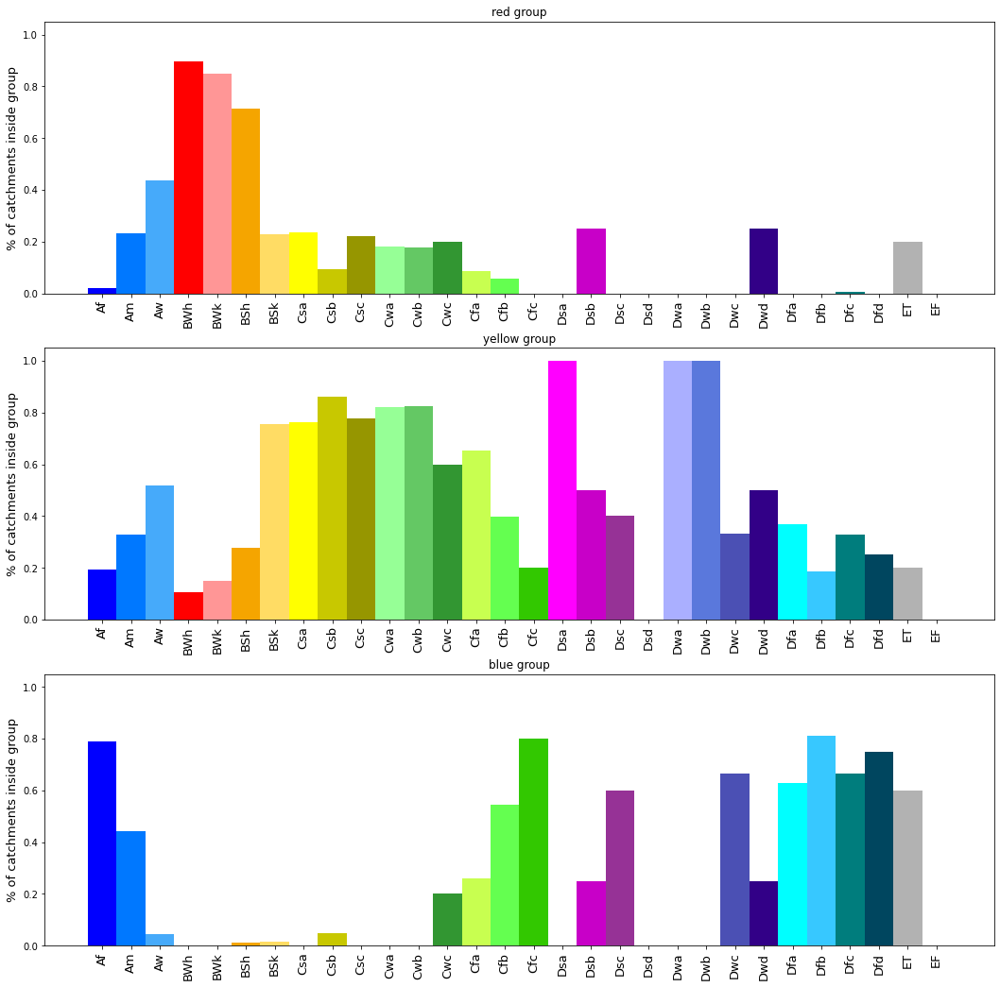

In [204]:
df = pd.read_csv(f'{work_dir}/output/catchment_characteristics/master_characteristics_{data_sources}_v2.csv',index_col=0)
df = df.drop(columns=['ppd_l'])
dfk = pd.read_csv(f'{work_dir}/data/koppen_climates/all_catch_table_kg_climates.csv',index_col=0)
dfk = dfk['median']
df = df[df.p_mean-df.q_mean < df.ep_mean]
df = df[['p_mean','ep_mean', 't_mean','tdiff_mean','idu_mean', 'si_ep','si_p', 'asi','dtb','ia','slp_mean','el_mean','tc','ntc','nonveg','pclay','psand','lai_mean','lai_rsd','sc_mean','sc_rsd','sr_20','lat','lon']]
df = df.dropna()
features = ['t_mean','idu_mean','p_mean','asi','sr_20']
df1 = df.loc[list(itertools.chain.from_iterable(grs1))] 
df2 = df.loc[list(itertools.chain.from_iterable(grs2))] 
df3 = df.loc[list(itertools.chain.from_iterable(grs3))]
df1['kg'] = dfk.loc[df1.index]
df2['kg'] = dfk.loc[df2.index]
df3['kg'] = dfk.loc[df3.index]
a = [df1.index,df2.index,df3.index]
dfkk = pd.DataFrame(dfk.loc[list(itertools.chain.from_iterable(a))],columns=['median'])

c=['Af','Am','Aw','BWh','BWk','BSh','BSk','Csa','Csb','Csc','Cwa','Cwb','Cwc','Cfa','Cfb','Cfc','Dsa','Dsb','Dsc','Dsd','Dwa','Dwb','Dwc','Dwd','Dfa','Dfb','Dfc','Dfd','ET','EF']

bounds = np.linspace(0,30,31)
bounds2 = np.linspace(0,30,31)
norm = mpl.colors.BoundaryNorm(bounds, cm_kg.N)

fig = plt.figure(figsize=(8,8))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.coastlines(linewidth=0.3)
ax.set_xlim(-180,180)
ax.set_ylim(-60,90)
s = ax.scatter(df1.lon,df1.lat,c=df1.kg,s=2,cmap=cm_kg, norm=norm)
cbar = plt.colorbar(s, orientation='horizontal',spacing='proportional',extend='neither', pad=0.02, norm=norm,ticks=bounds2)
cbar.set_ticks(np.arange(0.5,30,1))
cbar.set_ticklabels(c,rotation=90,size=13)
fig.savefig(f'{work_dir}/output/regression/figures/interpretation/red_group_kg.jpg',bbox_inches='tight',dpi=300)

fig = plt.figure(figsize=(8,8))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.coastlines(linewidth=0.3)
ax.set_xlim(-180,180)
ax.set_ylim(-60,90)
s = ax.scatter(df2.lon,df2.lat,c=df2.kg,s=2,cmap=cm_kg, norm=norm)
cbar = plt.colorbar(s, orientation='horizontal',spacing='proportional',extend='neither', pad=0.02, norm=norm,ticks=bounds2)
cbar.set_ticks(np.arange(0.5,30,1))
cbar.set_ticklabels(c,rotation=90,size=13)
fig.savefig(f'{work_dir}/output/regression/figures/interpretation/yellow_group_kg.jpg',bbox_inches='tight',dpi=300)

fig = plt.figure(figsize=(8,8))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.coastlines(linewidth=0.3)
ax.set_xlim(-180,180)
ax.set_ylim(-60,90)
s = ax.scatter(df3.lon,df3.lat,c=df3.kg,s=2,cmap=cm_kg, norm=norm)
cbar = plt.colorbar(s, orientation='horizontal',spacing='proportional',extend='neither', pad=0.02, norm=norm,ticks=bounds2)
cbar.set_ticks(np.arange(0.5,30,1))
cbar.set_ticklabels(c,rotation=90,size=13)
fig.savefig(f'{work_dir}/output/regression/figures/interpretation/blue_group_kg.jpg',bbox_inches='tight',dpi=300)

n1 = []
n2 = []
n3 = []
for i in range(len(c)):
    if (len(dfkk[dfkk['median']==i])>0):
        nn1 = len(df1[df1.kg==i])/len(dfkk[dfkk['median']==i])
        n1.append(nn1)
        nn2 = len(df2[df2.kg==i])/len(dfkk[dfkk['median']==i])
        n2.append(nn2)
        nn3 = len(df3[df3.kg==i])/len(dfkk[dfkk['median']==i])
        n3.append(nn3)
    else:
        n1.append(0)
        n2.append(0)
        n3.append(0)

colors=[]
for i in range(len(c)):
    colors.append(cm_kg(i)) 
    
fig = plt.figure(figsize=(18,18))
ax = fig.add_subplot(311)
ax.bar(np.arange(0,30,1),n1,width=1,color=colors)
ax.set_title('red group')
ax.set_xticks(np.arange(0,30,1))
ax.set_xticklabels(c,rotation=90,size=13)
ax.set_ylabel('% of catchments inside group',size=13)
ax.set_ylim(0,1.05)

ax = fig.add_subplot(312)
ax.bar(np.arange(0,30,1),n2,width=1,color=colors)
ax.set_title('yellow group')
ax.set_xticks(np.arange(0,30,1))
ax.set_xticklabels(c,rotation=90,size=13)
ax.set_ylabel('% of catchments inside group',size=13)
ax.set_ylim(0,1.05)

ax = fig.add_subplot(313)
ax.bar(np.arange(0,30,1),n3,width=1,color=colors)
ax.set_title('blue group')
ax.set_xticks(np.arange(0,30,1))
ax.set_xticklabels(c,rotation=90,size=13)
ax.set_ylabel('% of catchments inside group',size=13)
ax.set_ylim(0,1.05)

fig.savefig(f'{work_dir}/output/regression/figures/interpretation/groups_kg_hist.jpg',bbox_inches='tight',dpi=300)

## TC CLASSIFICATION

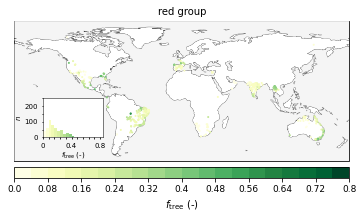

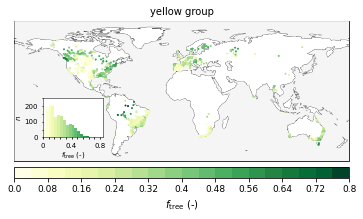

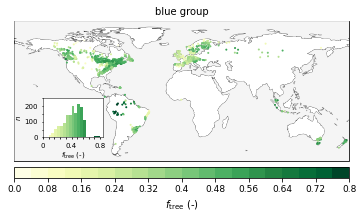

In [87]:
# group by treecover
cmap = ListedColormap([c1,c4,c2])
df = pd.read_csv(f'{work_dir}/output/catchment_characteristics/master_characteristics_{data_sources}_v2.csv',index_col=0)
df = df.drop(columns=['ppd_l'])
df = df[df.p_mean-df.q_mean < df.ep_mean]
df = df[['p_mean','ep_mean', 't_mean','tdiff_mean','idu_mean', 'si_ep','si_p', 'asi','dtb','ia','slp_mean','el_mean','tc','ntc','nonveg','pclay','psand','lai_mean','lai_rsd','sc_mean','sc_rsd','sr_20','lat','lon']]
df = df.dropna()
features = ['t_mean','idu_mean','p_mean','asi','sr_20','tc']
df1 = df.loc[list(itertools.chain.from_iterable(grs1))] 
df2 = df.loc[list(itertools.chain.from_iterable(grs2))] 
df3 = df.loc[list(itertools.chain.from_iterable(grs3))]

n1 = []
n2 = []
n3 = []
for i in range(len(bounds)):
    if (i<(len(bounds)-1)):
        nn1 = len(df1[(df1.tc<bounds[i+1])&(df1.tc>=bounds[i])])
        n1.append(nn1)
        nn2 = len(df2[(df2.tc<bounds[i+1])&(df2.tc>=bounds[i])])
        n2.append(nn2)
        nn3 = len(df3[(df3.tc<bounds[i+1])&(df3.tc>=bounds[i])])
        n3.append(nn3)
    else:
        nn1 = len(df1[(df1.tc>=bounds[i])])
        n1.append(nn1)
        nn2 = len(df2[(df2.tc>=bounds[i])])
        n2.append(nn2)
        nn3 = len(df3[(df3.tc>=bounds[i])])
        n3.append(nn3)

bounds = np.linspace(0,0.8,21)
bounds2 = np.linspace(0,0.8,11)
cmap_ylgn = cm.get_cmap('YlGn',21)
norm = mpl.colors.BoundaryNorm(bounds, cmap_ylgn.N)

colors=[]
for i in range(len(bounds)):
    colors.append(cmap_ylgn(i)) 

# RED
fig = plt.figure(figsize=(6,6))
ax = fig.add_subplot(111,projection=ccrs.PlateCarree())
ax.coastlines(linewidth=0.3)
ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
ax.set_xlim(-180,180)
ax.set_ylim(-60,90)
s = ax.scatter(df1.lon,df1.lat,c=df1['tc'],s=1,cmap=cmap_ylgn, norm=norm,zorder=101)
cbar = plt.colorbar(s, orientation='horizontal',spacing='proportional',extend='neither',aspect=30, pad=0.02, norm=norm,ticks=bounds2, label='$f_\mathrm{tree}$ (-)')
cbar.set_ticklabels(bounds2,size=9)
ax.set_title('red group',size=10)

iax = inset_axes(ax, width="18%", height="28%",loc=3,bbox_transform=ax.transAxes,bbox_to_anchor=(0.07,0.13,1,1))
plt.setp(list(iax.spines.values()),linewidth=0.5)
bins=bounds
iax.bar(np.arange(0,21,1),n1,width=1,color=colors)
iax.set_xticks(np.arange(-0.5,20,2))
iax.set_xticklabels(['0','','','','','0.4','','','','','0.8'])
iax.set_xlim(-0.5,20.5)
iax.set_yticks([0,50,100,150,200,250])
iax.set_yticklabels(['0','','100','','200',''])
iax.set_xlabel('$f_\mathrm{tree}$ (-)',size=7,labelpad=1)
iax.set_ylabel('$n$',size=7,labelpad=1)
iax.tick_params(axis='both',length=1.5, labelsize=7)
fig.savefig(f'{work_dir}/output/regression/figures/interpretation/groups_tc_red.jpg',bbox_inches='tight',dpi=300)


# Yellow
fig = plt.figure(figsize=(6,6))
ax = fig.add_subplot(111,projection=ccrs.PlateCarree())
ax.coastlines(linewidth=0.3)
ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
ax.set_xlim(-180,180)
ax.set_ylim(-60,90)
s = ax.scatter(df2.lon,df2.lat,c=df2['tc'],s=1,cmap=cmap_ylgn, norm=norm,zorder=101)
cbar = plt.colorbar(s, orientation='horizontal',spacing='proportional',extend='neither',aspect=30, pad=0.02, norm=norm,ticks=bounds2, label='$f_\mathrm{tree}$ (-)')
cbar.set_ticklabels(bounds2,size=9)
ax.set_title('yellow group',size=10)

iax = inset_axes(ax, width="18%", height="28%",loc=3,bbox_transform=ax.transAxes,bbox_to_anchor=(0.07,0.13,1,1))
plt.setp(list(iax.spines.values()),linewidth=0.5)
bins=bounds
iax.bar(np.arange(0,21,1),n2,width=1,color=colors)
iax.set_xticks(np.arange(-0.5,20,2))
iax.set_xticklabels(['0','','','','','0.4','','','','','0.8'])
iax.set_xlim(-0.5,20.5)
iax.set_yticks([0,50,100,150,200,250])
iax.set_yticklabels(['0','','100','','200',''])
iax.set_xlabel('$f_\mathrm{tree}$ (-)',size=7,labelpad=1)
iax.set_ylabel('$n$',size=7,labelpad=1)
iax.tick_params(axis='both',length=1.5, labelsize=7)
fig.savefig(f'{work_dir}/output/regression/figures/interpretation/groups_tc_yellow.jpg',bbox_inches='tight',dpi=300)


# BLUE
fig = plt.figure(figsize=(6,6))
ax = fig.add_subplot(111,projection=ccrs.PlateCarree())
ax.coastlines(linewidth=0.3)
ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
ax.set_xlim(-180,180)
ax.set_ylim(-60,90)
s = ax.scatter(df3.lon,df3.lat,c=df3['tc'],s=1,cmap=cmap_ylgn, norm=norm,zorder=101)
cbar = plt.colorbar(s, orientation='horizontal',spacing='proportional',extend='neither',aspect=30, pad=0.02, norm=norm,ticks=bounds2, label='$f_\mathrm{tree}$ (-)')
cbar.set_ticklabels(bounds2,size=9)
ax.set_title('blue group',size=10)

iax = inset_axes(ax, width="18%", height="28%",loc=3,bbox_transform=ax.transAxes,bbox_to_anchor=(0.07,0.13,1,1))
plt.setp(list(iax.spines.values()),linewidth=0.5)
bins=bounds
iax.bar(np.arange(0,21,1),n3,width=1,color=colors)
iax.set_xticks(np.arange(-0.5,20,2))
iax.set_xticklabels(['0','','','','','0.4','','','','','0.8'])
iax.set_xlim(-0.5,20.5)
iax.set_yticks([0,50,100,150,200,250])
iax.set_yticklabels(['0','','100','','200',''])
iax.set_xlabel('$f_\mathrm{tree}$ (-)',size=7,labelpad=1)
iax.set_ylabel('$n$',size=7,labelpad=1)
iax.tick_params(axis='both',length=1.5, labelsize=7)
fig.savefig(f'{work_dir}/output/regression/figures/interpretation/groups_tc_blue.jpg',bbox_inches='tight',dpi=300)

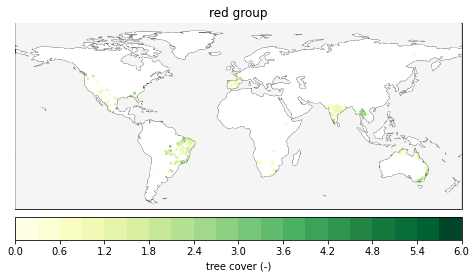

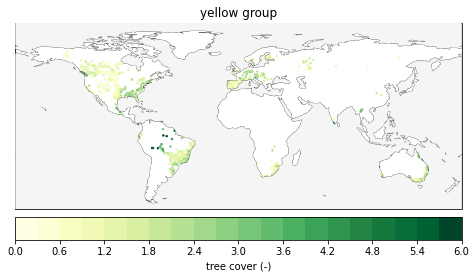

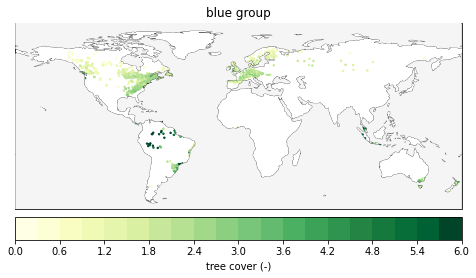

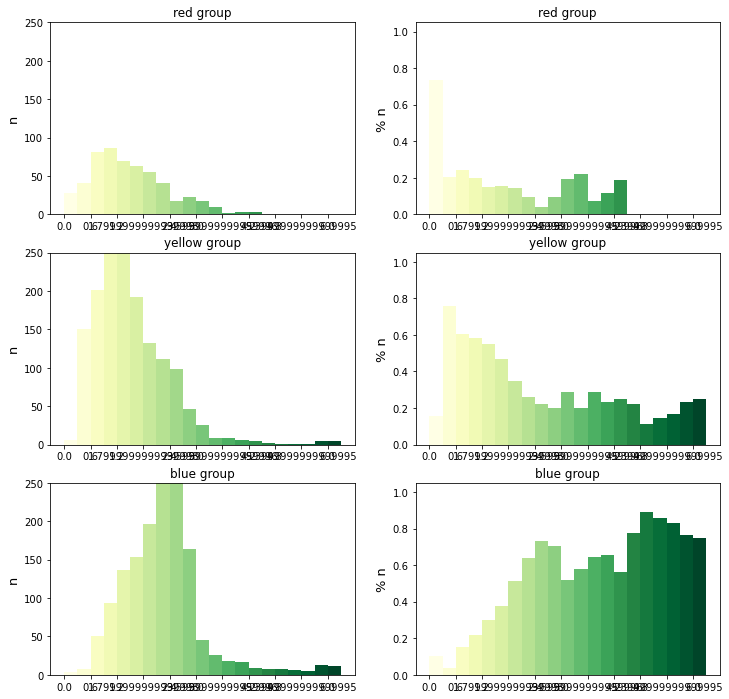

In [63]:
# group by LAI
cmap = ListedColormap([c1,c4,c2])
df = pd.read_csv(f'{work_dir}/output/catchment_characteristics/master_characteristics_{data_sources}_v2.csv',index_col=0)
df = df.drop(columns=['ppd_l'])
df = df[df.p_mean-df.q_mean < df.ep_mean]
df = df[['p_mean','ep_mean', 't_mean','tdiff_mean','idu_mean', 'si_ep','si_p', 'asi','dtb','ia','slp_mean','el_mean','tc','ntc','nonveg','pclay','psand','lai_mean','lai_rsd','sc_mean','sc_rsd','sr_20','lat','lon']]
df = df.dropna()
features = ['t_mean','idu_mean','p_mean','asi','sr_20','lai_mean']
df1 = df.loc[list(itertools.chain.from_iterable(grs1))] 
df2 = df.loc[list(itertools.chain.from_iterable(grs2))] 
df3 = df.loc[list(itertools.chain.from_iterable(grs3))]

bounds = np.linspace(0,6,21)
bounds2 = np.linspace(0,6,11)
cmap_ylgn = cm.get_cmap('YlGn',21)
norm = mpl.colors.BoundaryNorm(bounds, cmap_ylgn.N)

fig = plt.figure(figsize=(8,8))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.coastlines(linewidth=0.3)
ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
ax.set_xlim(-180,180)
ax.set_ylim(-60,90)
s = ax.scatter(df1.lon,df1.lat,c=df1['lai_mean'],s=2,cmap=cmap_ylgn, norm=norm)
cbar = plt.colorbar(s, orientation='horizontal',spacing='proportional',extend='neither', pad=0.02, norm=norm,ticks=bounds2, label='tree cover (-)')
ax.set_title('red group')
fig.savefig(f'{work_dir}/output/regression/figures/interpretation/groups_lai_mean_red.jpg',bbox_inches='tight',dpi=300)

fig = plt.figure(figsize=(8,8))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.coastlines(linewidth=0.3)
ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
ax.set_xlim(-180,180)
ax.set_ylim(-60,90)
s = ax.scatter(df2.lon,df2.lat,c=df2['lai_mean'],s=2,cmap=cmap_ylgn, norm=norm)
cbar = plt.colorbar(s, orientation='horizontal',spacing='proportional',extend='neither', pad=0.02, norm=norm,ticks=bounds2, label='tree cover (-)')
ax.set_title('yellow group')
fig.savefig(f'{work_dir}/output/regression/figures/interpretation/groups_lai_mean_yellow.jpg',bbox_inches='tight',dpi=300)

fig = plt.figure(figsize=(8,8))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.coastlines(linewidth=0.3)
ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
ax.set_xlim(-180,180)
ax.set_ylim(-60,90)
s = ax.scatter(df3.lon,df3.lat,c=df3['lai_mean'],s=2,cmap=cmap_ylgn, norm=norm)
cbar = plt.colorbar(s, orientation='horizontal',spacing='proportional',extend='neither', pad=0.02, norm=norm,ticks=bounds2, label='tree cover (-)')
ax.set_title('blue group')
fig.savefig(f'{work_dir}/output/regression/figures/interpretation/groups_lai_mean_blue.jpg',bbox_inches='tight',dpi=300)

n1 = []
n2 = []
n3 = []
for i in range(len(bounds)):
    if (i<(len(bounds)-1)):
        nn1 = len(df1[(df1.lai_mean<bounds[i+1])&(df1.lai_mean>=bounds[i])])
        n1.append(nn1)
        nn2 = len(df2[(df2.lai_mean<bounds[i+1])&(df2.lai_mean>=bounds[i])])
        n2.append(nn2)
        nn3 = len(df3[(df3.lai_mean<bounds[i+1])&(df3.lai_mean>=bounds[i])])
        n3.append(nn3)
    else:
        nn1 = len(df1[(df1.lai_mean>=bounds[i])])
        n1.append(nn1)
        nn2 = len(df2[(df2.lai_mean>=bounds[i])])
        n2.append(nn2)
        nn3 = len(df3[(df3.lai_mean>=bounds[i])])
        n3.append(nn3)

np1 = []
np2 = []
np3 = []
for i in range(len(bounds)):
    if (i<(len(bounds)-1)):
        if (len(df[(df.lai_mean<bounds[i+1])&(df.lai_mean>=bounds[i])])>0):
            nn1 = len(df1[(df1.lai_mean<bounds[i+1])&(df1.lai_mean>=bounds[i])])/len(df[(df.lai_mean<bounds[i+1])&(df.lai_mean>=bounds[i])])
            np1.append(nn1)
            nn2 = len(df2[(df2.lai_mean<bounds[i+1])&(df2.lai_mean>=bounds[i])])/len(df[(df.lai_mean<bounds[i+1])&(df.lai_mean>=bounds[i])])
            np2.append(nn2)
            nn3 = len(df3[(df3.lai_mean<bounds[i+1])&(df3.lai_mean>=bounds[i])])/len(df[(df.lai_mean<bounds[i+1])&(df.lai_mean>=bounds[i])])
            np3.append(nn3)
        else:
            np1.append(0)
            np2.append(0)
            np3.append(0)
    else:
        if (len(df[(df.lai_mean>=bounds[i])])>0):
            nn1 = len(df1[(df1.lai_mean>=bounds[i])])/len(df[(df.lai_mean>=bounds[i])])
            np1.append(nn1)
            nn2 = len(df2[(df2.lai_mean>=bounds[i])])/len(df[(df.lai_mean>=bounds[i])])
            np2.append(nn2)
            nn3 = len(df3[(df3.lai_mean>=bounds[i])])/len(df[(df.lai_mean>=bounds[i])])
            np3.append(nn3)   
        else:
            np1.append(0)
            np2.append(0)
            np3.append(0)
colors=[]
for i in range(len(bounds)):
    colors.append(cmap_ylgn(i)) 
    
fig = plt.figure(figsize=(12,12))
ax = fig.add_subplot(321)
ax.bar(np.arange(0,21,1),n1,width=1,color=colors)
ax.set_title('red group')
ax.set_xticks(np.arange(-0.5,20.5,2))
ax.set_xticklabels(bounds2.astype(str))
ax.set_ylabel('n',size=13)
ax.set_ylim(0,250)

ax = fig.add_subplot(323)
ax.bar(np.arange(0,21,1),n2,width=1,color=colors)
ax.set_title('yellow group')
ax.set_xticks(np.arange(-0.5,20.5,2))
ax.set_xticklabels(bounds2.astype(str))
ax.set_ylabel('n',size=13)
ax.set_ylim(0,250)

ax = fig.add_subplot(325)
ax.bar(np.arange(0,21,1),n3,width=1,color=colors)
ax.set_title('blue group')
ax.set_xticks(np.arange(-0.5,20.5,2))
ax.set_xticklabels(bounds2.astype(str))
ax.set_ylabel('n',size=13)
ax.set_ylim(0,250)

ax = fig.add_subplot(322)
ax.bar(np.arange(0,21,1),np1,width=1,color=colors)
ax.set_title('red group')
ax.set_xticks(np.arange(-0.5,20.5,2))
ax.set_xticklabels(bounds2.astype(str))
ax.set_ylabel('% n',size=13)
ax.set_ylim(0,1.05)

ax = fig.add_subplot(324)
ax.bar(np.arange(0,21,1),np2,width=1,color=colors)
ax.set_title('yellow group')
ax.set_xticks(np.arange(-0.5,20.5,2))
ax.set_xticklabels(bounds2.astype(str))
ax.set_ylabel('% n',size=13)
ax.set_ylim(0,1.05)

ax = fig.add_subplot(326)
ax.bar(np.arange(0,21,1),np3,width=1,color=colors)
ax.set_title('blue group')
ax.set_xticks(np.arange(-0.5,20.5,2))
ax.set_xticklabels(bounds2.astype(str))
ax.set_ylabel('% n',size=13)
ax.set_ylim(0,1.05)

fig.savefig(f'{work_dir}/output/regression/figures/interpretation/groups_lai_mean_hist.jpg',bbox_inches='tight',dpi=300)

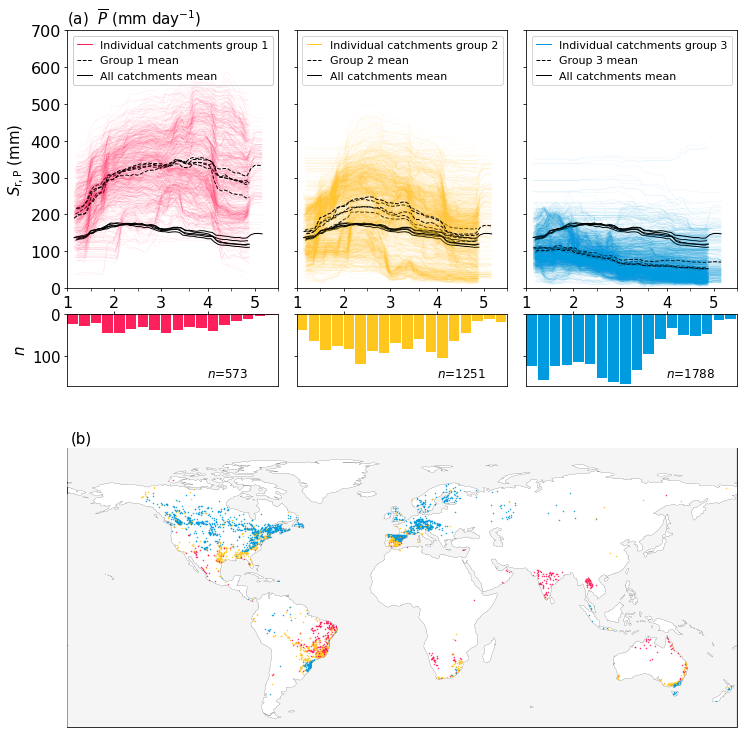

In [63]:
# make plots - ices - pmean - 3 different regimes
var = ['t_mean','idu_mean','p_mean','asi']
var2 = ['$\overline{T}$','$I_\mathrm{ISD}$','$\overline{P}$','$I_\mathrm{AS}$']
pcavar = ['$\overline{T}$','$I_\mathrm{ISD}$','$\overline{P}$','$I_\mathrm{AS}$','$S_\mathrm{r}$']
m=2
grs1=[]
grs2=[]
grs3=[]
grs4=[]
fig = plt.figure(figsize=(12,15))
gs = fig.add_gridspec(ncols=3, nrows=5,height_ratios=[2.5,1,0.7,0.2,5],width_ratios=[1,1,1])
ax1 = fig.add_subplot(gs[0, 0])
ax3 = fig.add_subplot(gs[0, 1])
ax7 = fig.add_subplot(gs[0, 2])
ax2 = fig.add_subplot(gs[2:4, 0])
ax4 = fig.add_subplot(gs[2:4, 1])
ax8 = fig.add_subplot(gs[2:4, 2])
ax6 = fig.add_subplot(gs[4,:],projection=ccrs.PlateCarree())

ax1.set_title(f'(a)  {var2[m]} ({units[m]})',size=15, loc='left')
ax1.set_ylabel('$S_\mathrm{r,P}$ (mm)',size=15)
ax1.set_ylim(0,700)
# ax1.set_xlim(np.quantile(df.loc[:,var[m]],0.05),np.quantile(df.loc[:,var[m]],0.95))
ax1.tick_params(axis='both', labelsize=15)  
ax1.set_xlim(xlims[m])
ax1.tick_params(axis='both',labelsize=16)
ax1.tick_params(which='major', length=3)
ax1.tick_params(which='minor', length=3)
ax1.set_xticks(ticks=majors[k])
ax1.set_xticks(ticks=minors[k],minor=True)
ax1.set_yticks([0,100,200,300,400,500,600,700])
ax1.set_yticklabels(['','','','','','','',''])
ax1.set_yticklabels(['0','100','200','300','400','500','600','700'])

ax3.set_ylim(0,700)
# ax3.set_xlim(np.quantile(df.loc[:,var[m]],0.05),np.quantile(df.loc[:,var[m]],0.95))
ax3.tick_params(axis='both', labelsize=15)  
ax3.set_xlim(xlims[m])
ax3.tick_params(axis='both',labelsize=16)
ax3.tick_params(which='major', length=3)
ax3.tick_params(which='minor', length=3)
ax3.set_xticks(ticks=majors[k])
ax3.set_xticks(ticks=minors[k],minor=True)
ax3.tick_params(axis='both', labelsize=15)
ax3.set_yticks([0,100,200,300,400,500,600,700])
ax3.set_yticklabels(['','','','','','','',''])

ax7.set_ylim(0,700)
# ax7.set_xlim(np.quantile(df.loc[:,var[m]],0.05),np.quantile(df.loc[:,var[m]],0.95))
ax7.tick_params(axis='both', labelsize=15)  
ax7.set_xlim(xlims[m])
ax7.tick_params(axis='both',labelsize=16)
ax7.tick_params(which='major', length=3)
ax7.tick_params(which='minor', length=3)
ax7.set_xticks(ticks=majors[k])
ax7.set_xticks(ticks=minors[k],minor=True)
ax7.tick_params(axis='both', labelsize=15)
ax7.set_yticks([0,100,200,300,400,500,600,700])
ax7.set_yticklabels(['','','','','','','',''])

ax6.coastlines(linewidth=0.1)
ax6.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
ax6.set_global()
ax6.set_xlim(-180,180)
ax6.set_ylim(-60,90)
ax6.text(-178,93, f'(b)',zorder=101,size=15)
    
plt.subplots_adjust(wspace=0.09,hspace=-0.2)
for i in range(5):
    if(i==0):
        ice_p = ice_p0
    if(i==1):
        ice_p = ice_p1
    if(i==2):
        ice_p = ice_p2
    if(i==3):
        ice_p = ice_p3
    if(i==4):
        ice_p = ice_p4

    # define groups
    pos = []
    neg = []
    slp = (ice_p.iloc[:,-1] - ice_p.iloc[:,0])/(ice_p.columns[-1] - ice_p.columns[0])
    for i in ice_p.index:
        if (slp.loc[i]>0):
            pos.append(i)
        if (slp.loc[i]<0):
            neg.append(i)

    pm = slp.loc[pos].mean()
    nm = slp.loc[neg].mean()
    p1 = slp[slp>pm].index
    p2 = slp[slp<pm].index

    p = ice_p.index
    p1 = []
    p2 = []
    p3 = []
    p4 = []
    grr = []
    r = []
    rr = []
    
    for i in p:
        if ((ice_p.loc[i].idxmax()>2.8)&((ice_p.loc[i].iloc[38] - ice_p.loc[i].iloc[0])/(ice_p.columns[38] - ice_p.columns[0]) > 15)):
            p1.append(i)
        else:
            if ((ice_p.loc[i].idxmax()>1.5)&((ice_p.loc[i].iloc[18] - ice_p.loc[i].iloc[0])/(ice_p.columns[18] - ice_p.columns[0]) > 5)):
                p2.append(i)
            else:
                p3.append(i)    
    gr1 = p1
    gr2 = p2
    gr3 = p3
    gr4 = p4
    ice = ice_p
    ylim = 170
    mm = 0
    grs1.append(gr1)
    grs2.append(gr2)
    grs3.append(gr3)
    grs4.append(gr4)
    if (len(gr1)>0):
        gr = gr1
        j = 0
        for i in gr:
            ax1.plot(ice.columns.values, ice.loc[i],color=c1,linestyle='-',linewidth=0.08,alpha=0.5)
        ax1.plot(ice.columns.values, ice.loc[gr].mean(),color='k',linestyle='--',linewidth=1)
        ax1.plot(ice.columns.values, ice.mean(),color='k',linestyle='-',linewidth=1)

    if (len(gr2)>0):
        gr = gr2
        j = 1
        for i in gr:
            ax3.plot(ice.columns.values, ice.loc[i],color=c4,linestyle='-',linewidth=0.08,alpha=0.5)
        ax3.plot(ice.columns.values, ice.loc[gr].mean(),color='k',linestyle='--',linewidth=1)
        ax3.plot(ice.columns.values, ice.mean(),color='k',linestyle='-',linewidth=1)

    if (len(gr3)>0):
        gr = gr3
        j = 2
        for i in gr:
            ax7.plot(ice.columns.values, ice.loc[i],color=c2,linestyle='-',linewidth=0.08,alpha=0.5)
        ax7.plot(ice.columns.values, ice.loc[gr].mean(),color='k',linestyle='--',linewidth=1)
        ax7.plot(ice.columns.values, ice.mean(),color='k',linestyle='-',linewidth=1)
    
    ddf = df.loc[ice.index]
    ax6.plot(ddf.loc[gr1].lon, ddf.loc[gr1].lat,'o', markeredgecolor=c1, markerfacecolor=c1,markersize=0.5)
    ax6.plot(ddf.loc[gr2].lon, ddf.loc[gr2].lat,'o', markeredgecolor=c4, markerfacecolor=c4,markersize=0.5)
    ax6.plot(ddf.loc[gr3].lon, ddf.loc[gr3].lat,'o', markeredgecolor=c2, markerfacecolor=c2,markersize=0.5)

# bins = np.linspace(np.quantile(df.loc[:,var[m]],0.05),np.quantile(df.loc[:,var[m]],0.95),20)
bins = binslist[m]

ax2.hist(df.loc[np.array(grs1[0]+grs1[1]+grs1[2]+grs1[3]+grs1[4]),features[m]],bins=bins,width=0.9*(bins[1]-bins[0]),color=c1)
ax2.invert_yaxis()
ax2.xaxis.tick_top()
# ax2.set_xlim(np.quantile(df.loc[:,var[m]],0.05),np.quantile(df.loc[:,var[m]],0.95))
ax2.axes.get_xaxis().set_ticklabels([])
ax2.set_ylabel('$n$',size=15)
ax2.tick_params(axis='both', labelsize=15)
ax2.set_ylim(ylim,0)
ax2.text(ice.columns.values[-13],ylim-20,f'$n$={len(np.array(grs1[0]+grs1[1]+grs1[2]+grs1[3]+grs1[4]))}',size=12,zorder=10)
ax2.set_xlim(xlims[m])
ax2.tick_params(which='major', length=3)
ax2.tick_params(which='minor', length=3)

ax4.hist(df.loc[np.concatenate([grs2[0],grs2[1],grs2[2],grs2[3],grs2[4]]),features[m]],bins=bins,width=0.9*(bins[1]-bins[0]),color=c4)
ax4.invert_yaxis()
ax4.xaxis.tick_top()
# ax4.set_xlim(np.quantile(df.loc[:,var[m]],0.05),np.quantile(df.loc[:,var[m]],0.95))
ax4.axes.get_xaxis().set_ticklabels([])
ax4.tick_params(axis='both', labelsize=15)
ax4.set_ylim(ylim,0)
ax4.set_yticklabels([])
ax4.text(ice.columns.values[-13],ylim-20,f'$n$={len(np.concatenate([grs2[0],grs2[1],grs2[2],grs2[3],grs2[4]]))}',size=12,zorder=10)
ax4.set_xlim(xlims[m])
ax4.tick_params(which='major', length=3)
ax4.tick_params(which='minor', length=3)

ax8.hist(df.loc[np.concatenate([grs3[0],grs3[1],grs3[2],grs3[3],grs3[4]]),features[m]],bins=bins,width=0.9*(bins[1]-bins[0]),color=c2)
ax8.invert_yaxis()
ax8.xaxis.tick_top()
# ax8.set_xlim(np.quantile(df.loc[:,var[m]],0.05),np.quantile(df.loc[:,var[m]],0.95))
ax8.axes.get_xaxis().set_ticklabels([])
ax8.tick_params(axis='both', labelsize=15)
ax8.set_ylim(ylim,0)
ax8.set_yticklabels([])
ax8.text(ice.columns.values[-13],ylim-20,f'$n$={len(np.concatenate([grs3[0],grs3[1],grs3[2],grs3[3],grs3[4]]))}',size=12,zorder=10)
ax8.set_xlim(xlims[m])
ax8.tick_params(which='major', length=3)
ax8.tick_params(which='minor', length=3)

ax1.plot([-1,-1],[-4,-4],color=c1,linestyle='-',linewidth=1, label='Individual catchments group 1')
ax1.plot([-1,-1],[-4,-4],color='k',linestyle='--',linewidth=1, label='Group 1 mean')
ax1.plot([-1,-1],[-4,-4],color='k',linestyle='-',linewidth=1, label='All catchments mean')
ax3.plot([-1,-1],[-4,-4],color=c4,linestyle='-',linewidth=1, label='Individual catchments group 2')
ax3.plot([-1,-1],[-4,-4],color='k',linestyle='--',linewidth=1, label='Group 2 mean')
ax3.plot([-1,-1],[-4,-4],color='k',linestyle='-',linewidth=1, label='All catchments mean')
ax7.plot([-1,-1],[-4,-4],color=c2,linestyle='-',linewidth=1, label='Individual catchments group 3')
ax7.plot([-1,-1],[-4,-4],color='k',linestyle='--',linewidth=1, label='Group 3 mean')
ax7.plot([-1,-1],[-4,-4],color='k',linestyle='-',linewidth=1, label='All catchments mean')
legend=ax1.legend(loc='upper left',fontsize=11,handlelength=1.3)
legend.get_frame().set_alpha(None)
legend.get_frame().set_facecolor((1, 1, 1, 0))
ax3.legend(loc='upper left',fontsize=11,handlelength=1.3)
ax7.legend(loc='upper left',fontsize=11,handlelength=1.3)
fig.savefig(f'{work_dir}/output/regression/figures/interpretation/ice_splitted_{var[m]}_3splitsv2.jpg',bbox_inches='tight',dpi=300)


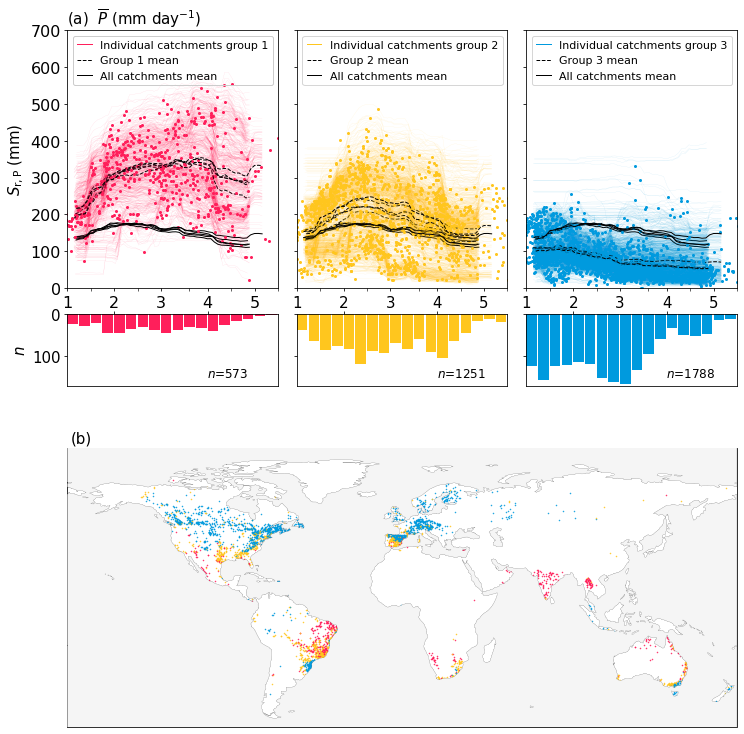

In [65]:
# make plots - ices - pmean - 3 different regimes
var = ['t_mean','idu_mean','p_mean','asi']
var2 = ['$\overline{T}$','$I_\mathrm{ISD}$','$\overline{P}$','$I_\mathrm{AS}$']
pcavar = ['$\overline{T}$','$I_\mathrm{ISD}$','$\overline{P}$','$I_\mathrm{AS}$','$S_\mathrm{r}$']
m=2
grs1=[]
grs2=[]
grs3=[]
grs4=[]
fig = plt.figure(figsize=(12,15))
gs = fig.add_gridspec(ncols=3, nrows=5,height_ratios=[2.5,1,0.7,0.2,5],width_ratios=[1,1,1])
ax1 = fig.add_subplot(gs[0, 0])
ax3 = fig.add_subplot(gs[0, 1])
ax7 = fig.add_subplot(gs[0, 2])
ax2 = fig.add_subplot(gs[2:4, 0])
ax4 = fig.add_subplot(gs[2:4, 1])
ax8 = fig.add_subplot(gs[2:4, 2])
ax6 = fig.add_subplot(gs[4,:],projection=ccrs.PlateCarree())

ax1.set_title(f'(a)  {var2[m]} ({units[m]})',size=15, loc='left')
ax1.set_ylabel('$S_\mathrm{r,P}$ (mm)',size=15)
ax1.set_ylim(0,700)
# ax1.set_xlim(np.quantile(df.loc[:,var[m]],0.05),np.quantile(df.loc[:,var[m]],0.95))
ax1.tick_params(axis='both', labelsize=15)  
ax1.set_xlim(xlims[m])
ax1.tick_params(axis='both',labelsize=16)
ax1.tick_params(which='major', length=3)
ax1.tick_params(which='minor', length=3)
ax1.set_xticks(ticks=majors[k])
ax1.set_xticks(ticks=minors[k],minor=True)
ax1.set_yticks([0,100,200,300,400,500,600,700])
ax1.set_yticklabels(['','','','','','','',''])
ax1.set_yticklabels(['0','100','200','300','400','500','600','700'])

ax3.set_ylim(0,700)
# ax3.set_xlim(np.quantile(df.loc[:,var[m]],0.05),np.quantile(df.loc[:,var[m]],0.95))
ax3.tick_params(axis='both', labelsize=15)  
ax3.set_xlim(xlims[m])
ax3.tick_params(axis='both',labelsize=16)
ax3.tick_params(which='major', length=3)
ax3.tick_params(which='minor', length=3)
ax3.set_xticks(ticks=majors[k])
ax3.set_xticks(ticks=minors[k],minor=True)
ax3.tick_params(axis='both', labelsize=15)
ax3.set_yticks([0,100,200,300,400,500,600,700])
ax3.set_yticklabels(['','','','','','','',''])

ax7.set_ylim(0,700)
# ax7.set_xlim(np.quantile(df.loc[:,var[m]],0.05),np.quantile(df.loc[:,var[m]],0.95))
ax7.tick_params(axis='both', labelsize=15)  
ax7.set_xlim(xlims[m])
ax7.tick_params(axis='both',labelsize=16)
ax7.tick_params(which='major', length=3)
ax7.tick_params(which='minor', length=3)
ax7.set_xticks(ticks=majors[k])
ax7.set_xticks(ticks=minors[k],minor=True)
ax7.tick_params(axis='both', labelsize=15)
ax7.set_yticks([0,100,200,300,400,500,600,700])
ax7.set_yticklabels(['','','','','','','',''])

ax6.coastlines(linewidth=0.1)
ax6.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
ax6.set_global()
ax6.set_xlim(-180,180)
ax6.set_ylim(-60,90)
ax6.text(-178,93, f'(b)',zorder=101,size=15)
    
plt.subplots_adjust(wspace=0.09,hspace=-0.2)
for i in range(5):
    if(i==0):
        ice_p = ice_p0
    if(i==1):
        ice_p = ice_p1
    if(i==2):
        ice_p = ice_p2
    if(i==3):
        ice_p = ice_p3
    if(i==4):
        ice_p = ice_p4

    # define groups
    pos = []
    neg = []
    slp = (ice_p.iloc[:,-1] - ice_p.iloc[:,0])/(ice_p.columns[-1] - ice_p.columns[0])
    for i in ice_p.index:
        if (slp.loc[i]>0):
            pos.append(i)
        if (slp.loc[i]<0):
            neg.append(i)

    pm = slp.loc[pos].mean()
    nm = slp.loc[neg].mean()
    p1 = slp[slp>pm].index
    p2 = slp[slp<pm].index

    p = ice_p.index
    p1 = []
    p2 = []
    p3 = []
    p4 = []
    grr = []
    r = []
    rr = []
    
    for i in p:
        if ((ice_p.loc[i].idxmax()>2.8)&((ice_p.loc[i].iloc[38] - ice_p.loc[i].iloc[0])/(ice_p.columns[38] - ice_p.columns[0]) > 15)):
            p1.append(i)
        else:
            if ((ice_p.loc[i].idxmax()>1.5)&((ice_p.loc[i].iloc[18] - ice_p.loc[i].iloc[0])/(ice_p.columns[18] - ice_p.columns[0]) > 5)):
                p2.append(i)
            else:
                p3.append(i)    
    gr1 = p1
    gr2 = p2
    gr3 = p3
    gr4 = p4
    ice = ice_p
    ylim = 170
    mm = 0
    grs1.append(gr1)
    grs2.append(gr2)
    grs3.append(gr3)
    grs4.append(gr4)
    if (len(gr1)>0):
        gr = gr1
        j = 0
        for i in gr:
            ax1.plot(ice.columns.values, ice.loc[i],color=c1,linestyle='-',linewidth=0.08,alpha=0.5)
            ax1.plot(df.loc[i,'p_mean'],test_dfs.loc[i,'Sr_p'],'o',color=c1,markersize=2)
        ax1.plot(ice.columns.values, ice.loc[gr].mean(),color='k',linestyle='--',linewidth=1)
        ax1.plot(ice.columns.values, ice.mean(),color='k',linestyle='-',linewidth=1)

    if (len(gr2)>0):
        gr = gr2
        j = 1
        for i in gr:
            ax3.plot(ice.columns.values, ice.loc[i],color=c4,linestyle='-',linewidth=0.08,alpha=0.5)
            ax3.plot(df.loc[i,'p_mean'],test_dfs.loc[i,'Sr_p'],'o',color=c4,markersize=2)
        ax3.plot(ice.columns.values, ice.loc[gr].mean(),color='k',linestyle='--',linewidth=1)
        ax3.plot(ice.columns.values, ice.mean(),color='k',linestyle='-',linewidth=1)

    if (len(gr3)>0):
        gr = gr3
        j = 2
        for i in gr:
            ax7.plot(ice.columns.values, ice.loc[i],color=c2,linestyle='-',linewidth=0.08,alpha=0.5)
            ax7.plot(df.loc[i,'p_mean'],test_dfs.loc[i,'Sr_p'],'o',color=c2,markersize=2)
        ax7.plot(ice.columns.values, ice.loc[gr].mean(),color='k',linestyle='--',linewidth=1)
        ax7.plot(ice.columns.values, ice.mean(),color='k',linestyle='-',linewidth=1)
    
    ddf = df.loc[ice.index]
    ax6.plot(ddf.loc[gr1].lon, ddf.loc[gr1].lat,'o', markeredgecolor=c1, markerfacecolor=c1,markersize=0.5)
    ax6.plot(ddf.loc[gr2].lon, ddf.loc[gr2].lat,'o', markeredgecolor=c4, markerfacecolor=c4,markersize=0.5)
    ax6.plot(ddf.loc[gr3].lon, ddf.loc[gr3].lat,'o', markeredgecolor=c2, markerfacecolor=c2,markersize=0.5)

# bins = np.linspace(np.quantile(df.loc[:,var[m]],0.05),np.quantile(df.loc[:,var[m]],0.95),20)
bins = binslist[m]

ax2.hist(df.loc[np.array(grs1[0]+grs1[1]+grs1[2]+grs1[3]+grs1[4]),features[m]],bins=bins,width=0.9*(bins[1]-bins[0]),color=c1)
ax2.invert_yaxis()
ax2.xaxis.tick_top()
# ax2.set_xlim(np.quantile(df.loc[:,var[m]],0.05),np.quantile(df.loc[:,var[m]],0.95))
ax2.axes.get_xaxis().set_ticklabels([])
ax2.set_ylabel('$n$',size=15)
ax2.tick_params(axis='both', labelsize=15)
ax2.set_ylim(ylim,0)
ax2.text(ice.columns.values[-13],ylim-20,f'$n$={len(np.array(grs1[0]+grs1[1]+grs1[2]+grs1[3]+grs1[4]))}',size=12,zorder=10)
ax2.set_xlim(xlims[m])
ax2.tick_params(which='major', length=3)
ax2.tick_params(which='minor', length=3)

ax4.hist(df.loc[np.concatenate([grs2[0],grs2[1],grs2[2],grs2[3],grs2[4]]),features[m]],bins=bins,width=0.9*(bins[1]-bins[0]),color=c4)
ax4.invert_yaxis()
ax4.xaxis.tick_top()
# ax4.set_xlim(np.quantile(df.loc[:,var[m]],0.05),np.quantile(df.loc[:,var[m]],0.95))
ax4.axes.get_xaxis().set_ticklabels([])
ax4.tick_params(axis='both', labelsize=15)
ax4.set_ylim(ylim,0)
ax4.set_yticklabels([])
ax4.text(ice.columns.values[-13],ylim-20,f'$n$={len(np.concatenate([grs2[0],grs2[1],grs2[2],grs2[3],grs2[4]]))}',size=12,zorder=10)
ax4.set_xlim(xlims[m])
ax4.tick_params(which='major', length=3)
ax4.tick_params(which='minor', length=3)

ax8.hist(df.loc[np.concatenate([grs3[0],grs3[1],grs3[2],grs3[3],grs3[4]]),features[m]],bins=bins,width=0.9*(bins[1]-bins[0]),color=c2)
ax8.invert_yaxis()
ax8.xaxis.tick_top()
# ax8.set_xlim(np.quantile(df.loc[:,var[m]],0.05),np.quantile(df.loc[:,var[m]],0.95))
ax8.axes.get_xaxis().set_ticklabels([])
ax8.tick_params(axis='both', labelsize=15)
ax8.set_ylim(ylim,0)
ax8.set_yticklabels([])
ax8.text(ice.columns.values[-13],ylim-20,f'$n$={len(np.concatenate([grs3[0],grs3[1],grs3[2],grs3[3],grs3[4]]))}',size=12,zorder=10)
ax8.set_xlim(xlims[m])
ax8.tick_params(which='major', length=3)
ax8.tick_params(which='minor', length=3)

ax1.plot([-1,-1],[-4,-4],color=c1,linestyle='-',linewidth=1, label='Individual catchments group 1')
ax1.plot([-1,-1],[-4,-4],color='k',linestyle='--',linewidth=1, label='Group 1 mean')
ax1.plot([-1,-1],[-4,-4],color='k',linestyle='-',linewidth=1, label='All catchments mean')
ax3.plot([-1,-1],[-4,-4],color=c4,linestyle='-',linewidth=1, label='Individual catchments group 2')
ax3.plot([-1,-1],[-4,-4],color='k',linestyle='--',linewidth=1, label='Group 2 mean')
ax3.plot([-1,-1],[-4,-4],color='k',linestyle='-',linewidth=1, label='All catchments mean')
ax7.plot([-1,-1],[-4,-4],color=c2,linestyle='-',linewidth=1, label='Individual catchments group 3')
ax7.plot([-1,-1],[-4,-4],color='k',linestyle='--',linewidth=1, label='Group 3 mean')
ax7.plot([-1,-1],[-4,-4],color='k',linestyle='-',linewidth=1, label='All catchments mean')
legend=ax1.legend(loc='upper left',fontsize=11,handlelength=1.3)
legend.get_frame().set_alpha(None)
legend.get_frame().set_facecolor((1, 1, 1, 0))
ax3.legend(loc='upper left',fontsize=11,handlelength=1.3)
ax7.legend(loc='upper left',fontsize=11,handlelength=1.3)
fig.savefig(f'{work_dir}/output/regression/figures/interpretation/ice_splitted_{var[m]}_3splitsv2_points.jpg',bbox_inches='tight',dpi=300)


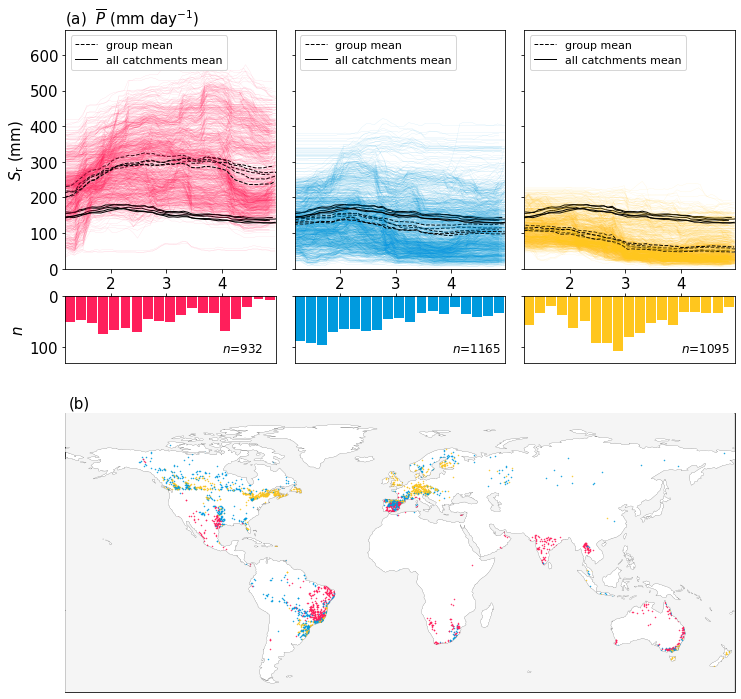

In [158]:
# make plots - ices - pmean
var = ['idu_mean','t_mean','asi','p_mean']
var2 = ['$I_\mathrm{ISD}$','$\overline{T}$','$I_\mathrm{AS}$','$\overline{P}$']
pcavar = ['$I_\mathrm{ISD}$','$\overline{T}$','$I_\mathrm{AS}$','$\overline{P}$','$S_\mathrm{r}$']
m=3
grs1=[]
grs2=[]
grs3=[]

fig = plt.figure(figsize=(12,14))
gs = fig.add_gridspec(ncols=3, nrows=5,height_ratios=[2.5,1,0.7,0.2,5],width_ratios=[1,1,1])
ax1 = fig.add_subplot(gs[0, 0])
ax3 = fig.add_subplot(gs[0, 1])
ax7 = fig.add_subplot(gs[0, 2])
ax2 = fig.add_subplot(gs[2:4, 0])
ax4 = fig.add_subplot(gs[2:4, 1])
ax8 = fig.add_subplot(gs[2:4, 2])
ax6 = fig.add_subplot(gs[4,:],projection=ccrs.PlateCarree())

ax1.set_title(f'(a)  {var2[m]} ({units[m]})',size=15, loc='left')
ax1.set_ylabel('$S_\mathrm{r}$ (mm)',size=15)
ax1.set_ylim(0,670)
ax1.set_xlim(np.quantile(df.loc[:,var[m]],0.05),np.quantile(df.loc[:,var[m]],0.95))
ax1.tick_params(axis='both', labelsize=15)  
ax1.set_yticks([0,100,200,300,400,500,600])
ax1.set_yticklabels(['','','','','','',''])
ax1.set_yticklabels(['0','100','200','300','400','500','600'])

ax3.set_ylim(0,670)
ax3.set_xlim(np.quantile(df.loc[:,var[m]],0.05),np.quantile(df.loc[:,var[m]],0.95))
ax3.tick_params(axis='both', labelsize=15)
ax3.set_yticks([0,100,200,300,400,500,600])
ax3.set_yticklabels(['','','','','','',''])

ax7.set_ylim(0,670)
ax7.set_xlim(np.quantile(df.loc[:,var[m]],0.05),np.quantile(df.loc[:,var[m]],0.95))
ax7.tick_params(axis='both', labelsize=15)
ax7.set_yticks([0,100,200,300,400,500,600])
ax7.set_yticklabels(['','','','','','',''])

ax6.coastlines(linewidth=0.1)
ax6.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
ax6.set_global()
ax6.set_xlim(-180,180)
ax6.set_ylim(-60,90)
ax6.text(-178,93, f'(b)',zorder=101,size=15)
    
plt.subplots_adjust(wspace=0.09,hspace=-0.19)
for i in range(5):
    if(i==0):
        ice_p = ice_p0
    if(i==1):
        ice_p = ice_p1
    if(i==2):
        ice_p = ice_p2
    if(i==3):
        ice_p = ice_p3
    if(i==4):
        ice_p = ice_p4

    # define groups
    pos = []
    neg = []
    slp = (ice_p.iloc[:,-1] - ice_p.iloc[:,0])/(ice_p.columns[-1] - ice_p.columns[0])
    for i in ice_p.index:
        if (slp.loc[i]>0):
            pos.append(i)
        if (slp.loc[i]<0):
            neg.append(i)

    pm = slp.loc[pos].mean()
    nm = slp.loc[neg].mean()
    p1 = slp[slp>pm].index
    p2 = slp[slp<pm].index

    p = ice_p.index
    p1 = []
    p2 = []
    p3 = []
    grr = []
    for i in p:
        if (((ice_p.loc[i].iloc[25] - ice_p.loc[i].iloc[0])/(ice_p.columns[25] - ice_p.columns[0]) > 18)|((((ice_p.loc[i].iloc[40] - ice_p.loc[i].iloc[25])/(ice_p.columns[40] - ice_p.columns[25]) > 10)&(ice_p.loc[i].iloc[0]>220)))):
            p1.append(i)
        else:
            if (((ice_p.loc[i].iloc[49] - ice_p.loc[i].iloc[0])/(ice_p.columns[49] - ice_p.columns[0]) < -8)):
                grr.append(i)
            else:
                p2.append(i)
    p4 = []
    a = []
    for i in grr:
        if (((ice_p.loc[i].iloc[40] - ice_p.loc[i].iloc[25])/(ice_p.columns[40] - ice_p.columns[25]) > 10)&(ice_p.loc[i].iloc[0]>220)):
            a.append(i)
        if (((ice_p.loc[i].iloc[13] - ice_p.loc[i].iloc[0])/(ice_p.columns[13] - ice_p.columns[0]) > 5)):
            p4.append(i)
        else:
            p3.append(i)
    p2 = np.concatenate([p2,p4])    
    
    gr1 = p1
    gr2 = p2
    gr3 = p3
    ice = ice_p
    ylim = 130
    mm = 0
    grs1.append(gr1)
    grs2.append(gr2)
    grs3.append(gr3)

    if (len(gr1)>0):
        gr = gr1
        j = 0
        for i in gr:
            ax1.plot(ice.columns.values, ice.loc[i],color=c1,linestyle='-',linewidth=0.05)
        ax1.plot(ice.columns.values, ice.loc[gr].mean(),color='k',linestyle='--',linewidth=1)
        ax1.plot(ice.columns.values, ice.mean(),color='k',linestyle='-',linewidth=1)

    if (len(gr2)>0):
        gr = gr2
        j = 1
        for i in gr:
            ax3.plot(ice.columns.values, ice.loc[i],color=c2,linestyle='-',linewidth=0.05)
        ax3.plot(ice.columns.values, ice.loc[gr].mean(),color='k',linestyle='--',linewidth=1)
        ax3.plot(ice.columns.values, ice.mean(),color='k',linestyle='-',linewidth=1)


    if (len(gr3)>0):
        gr = gr3
        j = 2
        for i in gr:
            ax7.plot(ice.columns.values, ice.loc[i],color=c4,linestyle='-',linewidth=0.05)
        ax7.plot(ice.columns.values, ice.loc[gr].mean(),color='k',linestyle='--',linewidth=1)
        ax7.plot(ice.columns.values, ice.mean(),color='k',linestyle='-',linewidth=1)

    ddf = df.loc[ice.index]
    ax6.plot(ddf.loc[gr1].lon, ddf.loc[gr1].lat,'o', markeredgecolor=c1, markerfacecolor=c1,markersize=0.5)
    ax6.plot(ddf.loc[gr2].lon, ddf.loc[gr2].lat,'o', markeredgecolor=c2, markerfacecolor=c2,markersize=0.5)
    ax6.plot(ddf.loc[gr3].lon, ddf.loc[gr3].lat,'o', markeredgecolor=c4, markerfacecolor=c2,markersize=0.5)

bins = np.linspace(np.quantile(df.loc[:,var[m]],0.05),np.quantile(df.loc[:,var[m]],0.95),20)

ax2.hist(df.loc[np.array(grs1[0]+grs1[1]+grs1[2]+grs1[3]+grs1[4]),features[m]],bins=bins,width=0.9*(bins[1]-bins[0]),color=c1)
ax2.invert_yaxis()
ax2.xaxis.tick_top()
ax2.set_xlim(np.quantile(df.loc[:,var[m]],0.05),np.quantile(df.loc[:,var[m]],0.95))
ax2.axes.get_xaxis().set_ticklabels([])
ax2.set_ylabel('$n$',size=15)
ax2.tick_params(axis='both', labelsize=15)
ax2.set_ylim(ylim,0)
ax2.text(ice.columns.values[-13],ylim-20,f'$n$={len(np.array(grs1[0]+grs1[1]+grs1[2]+grs1[3]+grs1[4]))}',size=12,zorder=10)

ax4.hist(df.loc[np.concatenate([grs2[0],grs2[1],grs2[2],grs2[3],grs2[4]]),features[m]],bins=bins,width=0.9*(bins[1]-bins[0]),color=c2)
ax4.invert_yaxis()
ax4.xaxis.tick_top()
ax4.set_xlim(np.quantile(df.loc[:,var[m]],0.05),np.quantile(df.loc[:,var[m]],0.95))
ax4.axes.get_xaxis().set_ticklabels([])
ax4.tick_params(axis='both', labelsize=15)
ax4.set_ylim(ylim,0)
ax4.set_yticklabels([])
ax4.text(ice.columns.values[-13],ylim-20,f'$n$={len(np.concatenate([grs2[0],grs2[1],grs2[2],grs2[3],grs2[4]]))}',size=12,zorder=10)

ax8.hist(df.loc[np.array(grs3[0]+grs3[1]+grs3[2]+grs3[3]+grs3[4]),features[m]],bins=bins,width=0.9*(bins[1]-bins[0]),color=c4)
ax8.invert_yaxis()
ax8.xaxis.tick_top()
ax8.set_xlim(np.quantile(df.loc[:,var[m]],0.05),np.quantile(df.loc[:,var[m]],0.95))
ax8.axes.get_xaxis().set_ticklabels([])
ax8.tick_params(axis='both', labelsize=15)
ax8.set_ylim(ylim,0)
ax8.set_yticklabels([])
ax8.text(ice.columns.values[-13],ylim-20,f'$n$={len(np.array(grs3[0]+grs3[1]+grs3[2]+grs3[3]+grs3[4]))}',size=12,zorder=10)

ax1.plot([-1,-1],[-4,-4],color='k',linestyle='--',linewidth=1, label='group mean')
ax1.plot([-1,-1],[-4,-4],color='k',linestyle='-',linewidth=1, label='all catchments mean')
ax3.plot([-1,-1],[-4,-4],color='k',linestyle='--',linewidth=1, label='group mean')
ax3.plot([-1,-1],[-4,-4],color='k',linestyle='-',linewidth=1, label='all catchments mean')
ax7.plot([-1,-1],[-4,-4],color='k',linestyle='--',linewidth=1, label='group mean')
ax7.plot([-1,-1],[-4,-4],color='k',linestyle='-',linewidth=1, label='all catchments mean')
ax1.legend(loc='upper left',fontsize=11)
ax3.legend(loc='upper left',fontsize=11)
ax7.legend(loc='upper left',fontsize=11)
fig.savefig(f'{work_dir}/output/regression/figures/interpretation/ice_splitted_{var[m]}.jpg',bbox_inches='tight',dpi=300)


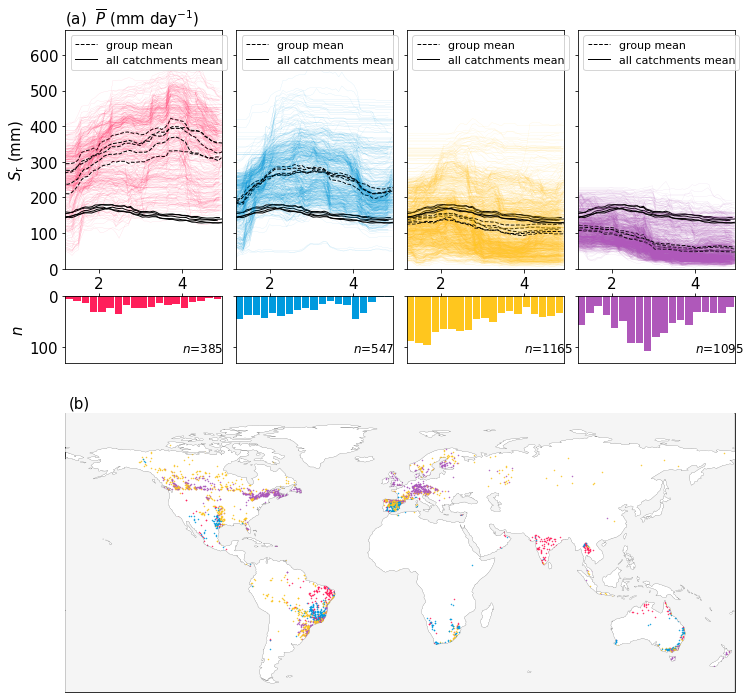

In [159]:
# make plots - ices - pmean - 4 different regimes
var = ['idu_mean','t_mean','asi','p_mean']
var2 = ['$I_\mathrm{ISD}$','$\overline{T}$','$I_\mathrm{AS}$','$\overline{P}$']
pcavar = ['$I_\mathrm{ISD}$','$\overline{T}$','$I_\mathrm{AS}$','$\overline{P}$','$S_\mathrm{r}$']
m=3
grs1=[]
grs2=[]
grs3=[]
grs4=[]
fig = plt.figure(figsize=(12,14))
gs = fig.add_gridspec(ncols=4, nrows=5,height_ratios=[2.5,1,0.7,0.2,5],width_ratios=[1,1,1,1])
ax1 = fig.add_subplot(gs[0, 0])
ax3 = fig.add_subplot(gs[0, 1])
ax7 = fig.add_subplot(gs[0, 2])
ax9 = fig.add_subplot(gs[0, 3])
ax2 = fig.add_subplot(gs[2:4, 0])
ax4 = fig.add_subplot(gs[2:4, 1])
ax8 = fig.add_subplot(gs[2:4, 2])
ax0 = fig.add_subplot(gs[2:4, 3])
ax6 = fig.add_subplot(gs[4,:],projection=ccrs.PlateCarree())

ax1.set_title(f'(a)  {var2[m]} ({units[m]})',size=15, loc='left')
ax1.set_ylabel('$S_\mathrm{r}$ (mm)',size=15)
ax1.set_ylim(0,670)
ax1.set_xlim(np.quantile(df.loc[:,var[m]],0.05),np.quantile(df.loc[:,var[m]],0.95))
ax1.tick_params(axis='both', labelsize=15)  
ax1.set_yticks([0,100,200,300,400,500,600])
ax1.set_yticklabels(['','','','','','',''])
ax1.set_yticklabels(['0','100','200','300','400','500','600'])

ax3.set_ylim(0,670)
ax3.set_xlim(np.quantile(df.loc[:,var[m]],0.05),np.quantile(df.loc[:,var[m]],0.95))
ax3.tick_params(axis='both', labelsize=15)
ax3.set_yticks([0,100,200,300,400,500,600])
ax3.set_yticklabels(['','','','','','',''])

ax7.set_ylim(0,670)
ax7.set_xlim(np.quantile(df.loc[:,var[m]],0.05),np.quantile(df.loc[:,var[m]],0.95))
ax7.tick_params(axis='both', labelsize=15)
ax7.set_yticks([0,100,200,300,400,500,600])
ax7.set_yticklabels(['','','','','','',''])

ax9.set_ylim(0,670)
ax9.set_xlim(np.quantile(df.loc[:,var[m]],0.05),np.quantile(df.loc[:,var[m]],0.95))
ax9.tick_params(axis='both', labelsize=15)
ax9.set_yticks([0,100,200,300,400,500,600])
ax9.set_yticklabels(['','','','','','',''])

ax6.coastlines(linewidth=0.1)
ax6.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
ax6.set_global()
ax6.set_xlim(-180,180)
ax6.set_ylim(-60,90)
ax6.text(-178,93, f'(b)',zorder=101,size=15)
    
plt.subplots_adjust(wspace=0.09,hspace=-0.19)
for i in range(5):
    if(i==0):
        ice_p = ice_p0
    if(i==1):
        ice_p = ice_p1
    if(i==2):
        ice_p = ice_p2
    if(i==3):
        ice_p = ice_p3
    if(i==4):
        ice_p = ice_p4

    # define groups
    pos = []
    neg = []
    slp = (ice_p.iloc[:,-1] - ice_p.iloc[:,0])/(ice_p.columns[-1] - ice_p.columns[0])
    for i in ice_p.index:
        if (slp.loc[i]>0):
            pos.append(i)
        if (slp.loc[i]<0):
            neg.append(i)

    pm = slp.loc[pos].mean()
    nm = slp.loc[neg].mean()
    p1 = slp[slp>pm].index
    p2 = slp[slp<pm].index

    p = ice_p.index
    p1 = []
    p2 = []
    p3 = []
    p4 = []
    grr = []
    r = []
    rr = []
    # for i in p:
    #     if (((ice_p.loc[i].iloc[38] - ice_p.loc[i].iloc[25])/(ice_p.columns[38] - ice_p.columns[25]) > 5)&((ice_p.loc[i].iloc[25] - ice_p.loc[i].iloc[0])/(ice_p.columns[25] - ice_p.columns[0]) > 20)):
    #         p1.append(i)
    #     else:
    #         r.append(i)
    # for i in r:
    #     if (((ice_p.loc[i].iloc[20] - ice_p.loc[i].iloc[0])/(ice_p.columns[20] - ice_p.columns[0]) > 10)):
    #         p2.append(i)
    #     else:
    #         rr.append(i)
    # for i in rr:
    #     if (((ice_p.loc[i].iloc[49] - ice_p.loc[i].iloc[0])/(ice_p.columns[49] - ice_p.columns[0]) < -12)):
    #         p4.append(i)
    #     else:
    #         p3.append(i)
        
    for i in p:
        if (((ice_p.loc[i].iloc[25] - ice_p.loc[i].iloc[0])/(ice_p.columns[25] - ice_p.columns[0]) > 18)|((((ice_p.loc[i].iloc[40] - ice_p.loc[i].iloc[25])/(ice_p.columns[40] - ice_p.columns[25]) > 10)&(ice_p.loc[i].iloc[0]>220)))):
            rr.append(i)
        else:
            if (((ice_p.loc[i].iloc[49] - ice_p.loc[i].iloc[0])/(ice_p.columns[49] - ice_p.columns[0]) < -8)):
                grr.append(i)
            else:
                p3.append(i)
    for i in rr:
        if (((ice_p.loc[i].iloc[35] - ice_p.loc[i].iloc[25])/(ice_p.columns[35] - ice_p.columns[25]) > 0)):
            p1.append(i)
        else:
            p2.append(i)
    p5 = []
    a = []
    for i in grr:
        if (((ice_p.loc[i].iloc[40] - ice_p.loc[i].iloc[25])/(ice_p.columns[40] - ice_p.columns[25]) > 10)&(ice_p.loc[i].iloc[0]>220)):
            a.append(i)
        if (((ice_p.loc[i].iloc[13] - ice_p.loc[i].iloc[0])/(ice_p.columns[13] - ice_p.columns[0]) > 5)):
            p5.append(i)
        else:
            p4.append(i)
    p3 = np.concatenate([p3,p5])    
    
    gr1 = p1
    gr2 = p2
    gr3 = p3
    gr4 = p4
    ice = ice_p
    ylim = 130
    mm = 0
    grs1.append(gr1)
    grs2.append(gr2)
    grs3.append(gr3)
    grs4.append(gr4)
    if (len(gr1)>0):
        gr = gr1
        j = 0
        for i in gr:
            ax1.plot(ice.columns.values, ice.loc[i],color=c1,linestyle='-',linewidth=0.05)
        ax1.plot(ice.columns.values, ice.loc[gr].mean(),color='k',linestyle='--',linewidth=1)
        ax1.plot(ice.columns.values, ice.mean(),color='k',linestyle='-',linewidth=1)

    if (len(gr2)>0):
        gr = gr2
        j = 1
        for i in gr:
            ax3.plot(ice.columns.values, ice.loc[i],color=c2,linestyle='-',linewidth=0.05)
        ax3.plot(ice.columns.values, ice.loc[gr].mean(),color='k',linestyle='--',linewidth=1)
        ax3.plot(ice.columns.values, ice.mean(),color='k',linestyle='-',linewidth=1)


    if (len(gr3)>0):
        gr = gr3
        j = 2
        for i in gr:
            ax7.plot(ice.columns.values, ice.loc[i],color=c4,linestyle='-',linewidth=0.05)
        ax7.plot(ice.columns.values, ice.loc[gr].mean(),color='k',linestyle='--',linewidth=1)
        ax7.plot(ice.columns.values, ice.mean(),color='k',linestyle='-',linewidth=1)
    
    if (len(gr4)>0):
        gr = gr4
        j = 2
        for i in gr:
            ax9.plot(ice.columns.values, ice.loc[i],color=c3,linestyle='-',linewidth=0.05)
        ax9.plot(ice.columns.values, ice.loc[gr].mean(),color='k',linestyle='--',linewidth=1)
        ax9.plot(ice.columns.values, ice.mean(),color='k',linestyle='-',linewidth=1)

    ddf = df.loc[ice.index]
    ax6.plot(ddf.loc[gr1].lon, ddf.loc[gr1].lat,'o', markeredgecolor=c1, markerfacecolor=c1,markersize=0.5)
    ax6.plot(ddf.loc[gr2].lon, ddf.loc[gr2].lat,'o', markeredgecolor=c2, markerfacecolor=c2,markersize=0.5)
    ax6.plot(ddf.loc[gr3].lon, ddf.loc[gr3].lat,'o', markeredgecolor=c4, markerfacecolor=c2,markersize=0.5)
    ax6.plot(ddf.loc[gr4].lon, ddf.loc[gr4].lat,'o', markeredgecolor=c3, markerfacecolor=c2,markersize=0.5)

bins = np.linspace(np.quantile(df.loc[:,var[m]],0.05),np.quantile(df.loc[:,var[m]],0.95),20)

ax2.hist(df.loc[np.array(grs1[0]+grs1[1]+grs1[2]+grs1[3]+grs1[4]),features[m]],bins=bins,width=0.9*(bins[1]-bins[0]),color=c1)
ax2.invert_yaxis()
ax2.xaxis.tick_top()
ax2.set_xlim(np.quantile(df.loc[:,var[m]],0.05),np.quantile(df.loc[:,var[m]],0.95))
ax2.axes.get_xaxis().set_ticklabels([])
ax2.set_ylabel('$n$',size=15)
ax2.tick_params(axis='both', labelsize=15)
ax2.set_ylim(ylim,0)
ax2.text(ice.columns.values[-13],ylim-20,f'$n$={len(np.array(grs1[0]+grs1[1]+grs1[2]+grs1[3]+grs1[4]))}',size=12,zorder=10)

ax4.hist(df.loc[np.concatenate([grs2[0],grs2[1],grs2[2],grs2[3],grs2[4]]),features[m]],bins=bins,width=0.9*(bins[1]-bins[0]),color=c2)
ax4.invert_yaxis()
ax4.xaxis.tick_top()
ax4.set_xlim(np.quantile(df.loc[:,var[m]],0.05),np.quantile(df.loc[:,var[m]],0.95))
ax4.axes.get_xaxis().set_ticklabels([])
ax4.tick_params(axis='both', labelsize=15)
ax4.set_ylim(ylim,0)
ax4.set_yticklabels([])
ax4.text(ice.columns.values[-13],ylim-20,f'$n$={len(np.concatenate([grs2[0],grs2[1],grs2[2],grs2[3],grs2[4]]))}',size=12,zorder=10)

ax8.hist(df.loc[np.concatenate([grs3[0],grs3[1],grs3[2],grs3[3],grs3[4]]),features[m]],bins=bins,width=0.9*(bins[1]-bins[0]),color=c4)
ax8.invert_yaxis()
ax8.xaxis.tick_top()
ax8.set_xlim(np.quantile(df.loc[:,var[m]],0.05),np.quantile(df.loc[:,var[m]],0.95))
ax8.axes.get_xaxis().set_ticklabels([])
ax8.tick_params(axis='both', labelsize=15)
ax8.set_ylim(ylim,0)
ax8.set_yticklabels([])
ax8.text(ice.columns.values[-13],ylim-20,f'$n$={len(np.concatenate([grs3[0],grs3[1],grs3[2],grs3[3],grs3[4]]))}',size=12,zorder=10)

ax0.hist(df.loc[np.array(grs4[0]+grs4[1]+grs4[2]+grs4[3]+grs4[4]),features[m]],bins=bins,width=0.9*(bins[1]-bins[0]),color=c3)
ax0.invert_yaxis()
ax0.xaxis.tick_top()
ax0.set_xlim(np.quantile(df.loc[:,var[m]],0.05),np.quantile(df.loc[:,var[m]],0.95))
ax0.axes.get_xaxis().set_ticklabels([])
ax0.tick_params(axis='both', labelsize=15)
ax0.set_ylim(ylim,0)
ax0.set_yticklabels([])
ax0.text(ice.columns.values[-13],ylim-20,f'$n$={len(np.array(grs4[0]+grs4[1]+grs4[2]+grs4[3]+grs4[4]))}',size=12,zorder=10)


ax1.plot([-1,-1],[-4,-4],color='k',linestyle='--',linewidth=1, label='group mean')
ax1.plot([-1,-1],[-4,-4],color='k',linestyle='-',linewidth=1, label='all catchments mean')
ax3.plot([-1,-1],[-4,-4],color='k',linestyle='--',linewidth=1, label='group mean')
ax3.plot([-1,-1],[-4,-4],color='k',linestyle='-',linewidth=1, label='all catchments mean')
ax7.plot([-1,-1],[-4,-4],color='k',linestyle='--',linewidth=1, label='group mean')
ax7.plot([-1,-1],[-4,-4],color='k',linestyle='-',linewidth=1, label='all catchments mean')
ax9.plot([-1,-1],[-4,-4],color='k',linestyle='--',linewidth=1, label='group mean')
ax9.plot([-1,-1],[-4,-4],color='k',linestyle='-',linewidth=1, label='all catchments mean')
ax1.legend(loc='upper left',fontsize=11)
ax3.legend(loc='upper left',fontsize=11)
ax7.legend(loc='upper left',fontsize=11)
ax9.legend(loc='upper left',fontsize=11)
fig.savefig(f'{work_dir}/output/regression/figures/interpretation/ice_splitted_{var[m]}_4splits.jpg',bbox_inches='tight',dpi=300)


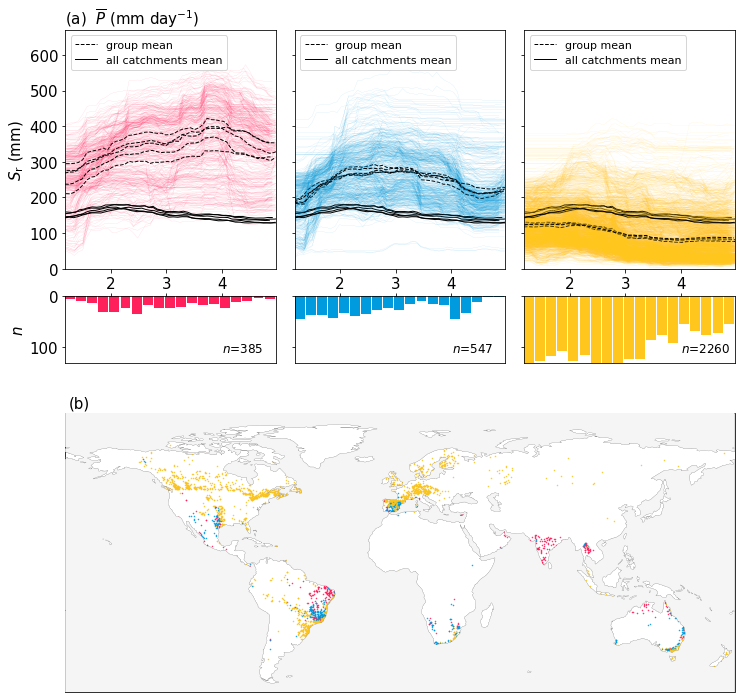

In [160]:
# make plots - ices - pmean - 4 different regimes
var = ['idu_mean','t_mean','asi','p_mean']
var2 = ['$I_\mathrm{ISD}$','$\overline{T}$','$I_\mathrm{AS}$','$\overline{P}$']
pcavar = ['$I_\mathrm{ISD}$','$\overline{T}$','$I_\mathrm{AS}$','$\overline{P}$','$S_\mathrm{r}$']
m=3
grs1=[]
grs2=[]
grs3=[]
grs4=[]
fig = plt.figure(figsize=(12,14))
gs = fig.add_gridspec(ncols=3, nrows=5,height_ratios=[2.5,1,0.7,0.2,5],width_ratios=[1,1,1])
ax1 = fig.add_subplot(gs[0, 0])
ax3 = fig.add_subplot(gs[0, 1])
ax7 = fig.add_subplot(gs[0, 2])
# ax9 = fig.add_subplot(gs[0, 3])
ax2 = fig.add_subplot(gs[2:4, 0])
ax4 = fig.add_subplot(gs[2:4, 1])
ax8 = fig.add_subplot(gs[2:4, 2])
# ax0 = fig.add_subplot(gs[2:4, 3])
ax6 = fig.add_subplot(gs[4,:],projection=ccrs.PlateCarree())

ax1.set_title(f'(a)  {var2[m]} ({units[m]})',size=15, loc='left')
ax1.set_ylabel('$S_\mathrm{r}$ (mm)',size=15)
ax1.set_ylim(0,670)
ax1.set_xlim(np.quantile(df.loc[:,var[m]],0.05),np.quantile(df.loc[:,var[m]],0.95))
ax1.tick_params(axis='both', labelsize=15)  
ax1.set_yticks([0,100,200,300,400,500,600])
ax1.set_yticklabels(['','','','','','',''])
ax1.set_yticklabels(['0','100','200','300','400','500','600'])

ax3.set_ylim(0,670)
ax3.set_xlim(np.quantile(df.loc[:,var[m]],0.05),np.quantile(df.loc[:,var[m]],0.95))
ax3.tick_params(axis='both', labelsize=15)
ax3.set_yticks([0,100,200,300,400,500,600])
ax3.set_yticklabels(['','','','','','',''])

ax7.set_ylim(0,670)
ax7.set_xlim(np.quantile(df.loc[:,var[m]],0.05),np.quantile(df.loc[:,var[m]],0.95))
ax7.tick_params(axis='both', labelsize=15)
ax7.set_yticks([0,100,200,300,400,500,600])
ax7.set_yticklabels(['','','','','','',''])

ax6.coastlines(linewidth=0.1)
ax6.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
ax6.set_global()
ax6.set_xlim(-180,180)
ax6.set_ylim(-60,90)
ax6.text(-178,93, f'(b)',zorder=101,size=15)
    
plt.subplots_adjust(wspace=0.09,hspace=-0.19)
for i in range(5):
    if(i==0):
        ice_p = ice_p0
    if(i==1):
        ice_p = ice_p1
    if(i==2):
        ice_p = ice_p2
    if(i==3):
        ice_p = ice_p3
    if(i==4):
        ice_p = ice_p4

    # define groups
    pos = []
    neg = []
    slp = (ice_p.iloc[:,-1] - ice_p.iloc[:,0])/(ice_p.columns[-1] - ice_p.columns[0])
    for i in ice_p.index:
        if (slp.loc[i]>0):
            pos.append(i)
        if (slp.loc[i]<0):
            neg.append(i)

    pm = slp.loc[pos].mean()
    nm = slp.loc[neg].mean()
    p1 = slp[slp>pm].index
    p2 = slp[slp<pm].index

    p = ice_p.index
    p1 = []
    p2 = []
    p3 = []
    p4 = []
    grr = []
    r = []
    rr = []

    for i in p:
        if (((ice_p.loc[i].iloc[25] - ice_p.loc[i].iloc[0])/(ice_p.columns[25] - ice_p.columns[0]) > 18)|((((ice_p.loc[i].iloc[40] - ice_p.loc[i].iloc[25])/(ice_p.columns[40] - ice_p.columns[25]) > 10)&(ice_p.loc[i].iloc[0]>220)))):
            rr.append(i)
        else:
            if (((ice_p.loc[i].iloc[49] - ice_p.loc[i].iloc[0])/(ice_p.columns[49] - ice_p.columns[0]) < -8)):
                grr.append(i)
            else:
                p3.append(i)
    for i in rr:
        if (((ice_p.loc[i].iloc[35] - ice_p.loc[i].iloc[25])/(ice_p.columns[35] - ice_p.columns[25]) > 0)):
            p1.append(i)
        else:
            p2.append(i)
    p5 = []
    a = []
    for i in grr:
        if (((ice_p.loc[i].iloc[40] - ice_p.loc[i].iloc[25])/(ice_p.columns[40] - ice_p.columns[25]) > 10)&(ice_p.loc[i].iloc[0]>220)):
            a.append(i)
        if (((ice_p.loc[i].iloc[13] - ice_p.loc[i].iloc[0])/(ice_p.columns[13] - ice_p.columns[0]) > 5)):
            p5.append(i)
        else:
            p4.append(i)
    p3 = np.concatenate([p3,p5,p4])    
    
    gr1 = p1
    gr2 = p2
    gr3 = p3
    gr4 = p4
    ice = ice_p
    ylim = 130
    mm = 0
    grs1.append(gr1)
    grs2.append(gr2)
    grs3.append(gr3)
    grs4.append(gr4)
    if (len(gr1)>0):
        gr = gr1
        j = 0
        for i in gr:
            ax1.plot(ice.columns.values, ice.loc[i],color=c1,linestyle='-',linewidth=0.05)
        ax1.plot(ice.columns.values, ice.loc[gr].mean(),color='k',linestyle='--',linewidth=1)
        ax1.plot(ice.columns.values, ice.mean(),color='k',linestyle='-',linewidth=1)

    if (len(gr2)>0):
        gr = gr2
        j = 1
        for i in gr:
            ax3.plot(ice.columns.values, ice.loc[i],color=c2,linestyle='-',linewidth=0.05)
        ax3.plot(ice.columns.values, ice.loc[gr].mean(),color='k',linestyle='--',linewidth=1)
        ax3.plot(ice.columns.values, ice.mean(),color='k',linestyle='-',linewidth=1)


    if (len(gr3)>0):
        gr = gr3
        j = 2
        for i in gr:
            ax7.plot(ice.columns.values, ice.loc[i],color=c4,linestyle='-',linewidth=0.05)
        ax7.plot(ice.columns.values, ice.loc[gr].mean(),color='k',linestyle='--',linewidth=1)
        ax7.plot(ice.columns.values, ice.mean(),color='k',linestyle='-',linewidth=1)
    
    # if (len(gr4)>0):
    #     gr = gr4
    #     j = 2
    #     for i in gr:
    #         ax9.plot(ice.columns.values, ice.loc[i],color=c3,linestyle='-',linewidth=0.05)
    #     ax9.plot(ice.columns.values, ice.loc[gr].mean(),color='k',linestyle='--',linewidth=1)
    #     ax9.plot(ice.columns.values, ice.mean(),color='k',linestyle='-',linewidth=1)

    ddf = df.loc[ice.index]
    ax6.plot(ddf.loc[gr1].lon, ddf.loc[gr1].lat,'o', markeredgecolor=c1, markerfacecolor=c1,markersize=0.5)
    ax6.plot(ddf.loc[gr2].lon, ddf.loc[gr2].lat,'o', markeredgecolor=c2, markerfacecolor=c2,markersize=0.5)
    ax6.plot(ddf.loc[gr3].lon, ddf.loc[gr3].lat,'o', markeredgecolor=c4, markerfacecolor=c2,markersize=0.5)
    # ax6.plot(ddf.loc[gr4].lon, ddf.loc[gr4].lat,'o', markeredgecolor=c3, markerfacecolor=c2,markersize=0.5)

bins = np.linspace(np.quantile(df.loc[:,var[m]],0.05),np.quantile(df.loc[:,var[m]],0.95),20)

ax2.hist(df.loc[np.array(grs1[0]+grs1[1]+grs1[2]+grs1[3]+grs1[4]),features[m]],bins=bins,width=0.9*(bins[1]-bins[0]),color=c1)
ax2.invert_yaxis()
ax2.xaxis.tick_top()
ax2.set_xlim(np.quantile(df.loc[:,var[m]],0.05),np.quantile(df.loc[:,var[m]],0.95))
ax2.axes.get_xaxis().set_ticklabels([])
ax2.set_ylabel('$n$',size=15)
ax2.tick_params(axis='both', labelsize=15)
ax2.set_ylim(ylim,0)
ax2.text(ice.columns.values[-13],ylim-20,f'$n$={len(np.array(grs1[0]+grs1[1]+grs1[2]+grs1[3]+grs1[4]))}',size=12,zorder=10)

ax4.hist(df.loc[np.concatenate([grs2[0],grs2[1],grs2[2],grs2[3],grs2[4]]),features[m]],bins=bins,width=0.9*(bins[1]-bins[0]),color=c2)
ax4.invert_yaxis()
ax4.xaxis.tick_top()
ax4.set_xlim(np.quantile(df.loc[:,var[m]],0.05),np.quantile(df.loc[:,var[m]],0.95))
ax4.axes.get_xaxis().set_ticklabels([])
ax4.tick_params(axis='both', labelsize=15)
ax4.set_ylim(ylim,0)
ax4.set_yticklabels([])
ax4.text(ice.columns.values[-13],ylim-20,f'$n$={len(np.concatenate([grs2[0],grs2[1],grs2[2],grs2[3],grs2[4]]))}',size=12,zorder=10)

ax8.hist(df.loc[np.concatenate([grs3[0],grs3[1],grs3[2],grs3[3],grs3[4]]),features[m]],bins=bins,width=0.9*(bins[1]-bins[0]),color=c4)
ax8.invert_yaxis()
ax8.xaxis.tick_top()
ax8.set_xlim(np.quantile(df.loc[:,var[m]],0.05),np.quantile(df.loc[:,var[m]],0.95))
ax8.axes.get_xaxis().set_ticklabels([])
ax8.tick_params(axis='both', labelsize=15)
ax8.set_ylim(ylim,0)
ax8.set_yticklabels([])
ax8.text(ice.columns.values[-13],ylim-20,f'$n$={len(np.concatenate([grs3[0],grs3[1],grs3[2],grs3[3],grs3[4]]))}',size=12,zorder=10)

# ax0.hist(df.loc[np.array(grs4[0]+grs4[1]+grs4[2]+grs4[3]+grs4[4]),features[m]],bins=bins,width=0.9*(bins[1]-bins[0]),color=c3)
# ax0.invert_yaxis()
# ax0.xaxis.tick_top()
# ax0.set_xlim(np.quantile(df.loc[:,var[m]],0.05),np.quantile(df.loc[:,var[m]],0.95))
# ax0.axes.get_xaxis().set_ticklabels([])
# ax0.tick_params(axis='both', labelsize=15)
# ax0.set_ylim(ylim,0)
# ax0.set_yticklabels([])
# ax0.text(ice.columns.values[-13],ylim-20,f'$n$={len(np.array(grs4[0]+grs4[1]+grs4[2]+grs4[3]+grs4[4]))}',size=12,zorder=10)


ax1.plot([-1,-1],[-4,-4],color='k',linestyle='--',linewidth=1, label='group mean')
ax1.plot([-1,-1],[-4,-4],color='k',linestyle='-',linewidth=1, label='all catchments mean')
ax3.plot([-1,-1],[-4,-4],color='k',linestyle='--',linewidth=1, label='group mean')
ax3.plot([-1,-1],[-4,-4],color='k',linestyle='-',linewidth=1, label='all catchments mean')
ax7.plot([-1,-1],[-4,-4],color='k',linestyle='--',linewidth=1, label='group mean')
ax7.plot([-1,-1],[-4,-4],color='k',linestyle='-',linewidth=1, label='all catchments mean')
# ax9.plot([-1,-1],[-4,-4],color='k',linestyle='--',linewidth=1, label='group mean')
# ax9.plot([-1,-1],[-4,-4],color='k',linestyle='-',linewidth=1, label='all catchments mean')
ax1.legend(loc='upper left',fontsize=11)
ax3.legend(loc='upper left',fontsize=11)
ax7.legend(loc='upper left',fontsize=11)
# ax9.legend(loc='upper left',fontsize=11)
fig.savefig(f'{work_dir}/output/regression/figures/interpretation/ice_splitted_{var[m]}_3splitsv2.jpg',bbox_inches='tight',dpi=300)


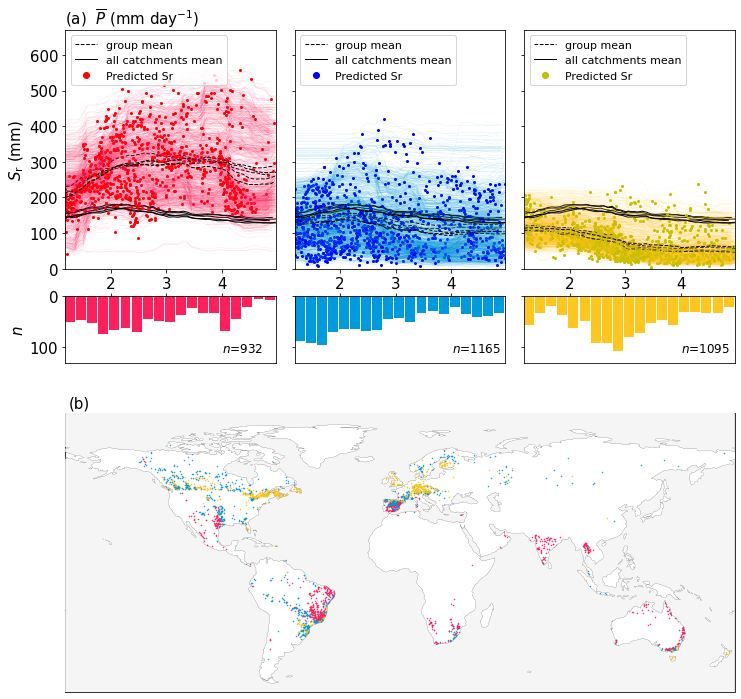

In [161]:
# make plots - ices - pmean - with points
var = ['idu_mean','t_mean','asi','p_mean']
var2 = ['$I_\mathrm{ISD}$','$\overline{T}$','$I_\mathrm{AS}$','$\overline{P}$']
pcavar = ['$I_\mathrm{ISD}$','$\overline{T}$','$I_\mathrm{AS}$','$\overline{P}$','$S_\mathrm{r}$']
m=3
grs1=[]
grs2=[]
grs3=[]

fig = plt.figure(figsize=(12,14))
gs = fig.add_gridspec(ncols=3, nrows=5,height_ratios=[2.5,1,0.7,0.2,5],width_ratios=[1,1,1])
ax1 = fig.add_subplot(gs[0, 0])
ax3 = fig.add_subplot(gs[0, 1])
ax7 = fig.add_subplot(gs[0, 2])
ax2 = fig.add_subplot(gs[2:4, 0])
ax4 = fig.add_subplot(gs[2:4, 1])
ax8 = fig.add_subplot(gs[2:4, 2])
ax6 = fig.add_subplot(gs[4,:],projection=ccrs.PlateCarree())

ax1.set_title(f'(a)  {var2[m]} ({units[m]})',size=15, loc='left')
ax1.set_ylabel('$S_\mathrm{r}$ (mm)',size=15)
ax1.set_ylim(0,670)
ax1.set_xlim(np.quantile(df.loc[:,var[m]],0.05),np.quantile(df.loc[:,var[m]],0.95))
ax1.tick_params(axis='both', labelsize=15)  
ax1.set_yticks([0,100,200,300,400,500,600])
ax1.set_yticklabels(['','','','','','',''])
ax1.set_yticklabels(['0','100','200','300','400','500','600'])

ax3.set_ylim(0,670)
ax3.set_xlim(np.quantile(df.loc[:,var[m]],0.05),np.quantile(df.loc[:,var[m]],0.95))
ax3.tick_params(axis='both', labelsize=15)
ax3.set_yticks([0,100,200,300,400,500,600])
ax3.set_yticklabels(['','','','','','',''])

ax7.set_ylim(0,670)
ax7.set_xlim(np.quantile(df.loc[:,var[m]],0.05),np.quantile(df.loc[:,var[m]],0.95))
ax7.tick_params(axis='both', labelsize=15)
ax7.set_yticks([0,100,200,300,400,500,600])
ax7.set_yticklabels(['','','','','','',''])

ax6.coastlines(linewidth=0.1)
ax6.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
ax6.set_global()
ax6.set_xlim(-180,180)
ax6.set_ylim(-60,90)
ax6.text(-178,93, f'(b)',zorder=101,size=15)
    
plt.subplots_adjust(wspace=0.09,hspace=-0.19)
for i in range(5):
    if(i==0):
        ice_p = ice_p0
    if(i==1):
        ice_p = ice_p1
    if(i==2):
        ice_p = ice_p2
    if(i==3):
        ice_p = ice_p3
    if(i==4):
        ice_p = ice_p4

    # define groups
    pos = []
    neg = []
    slp = (ice_p.iloc[:,-1] - ice_p.iloc[:,0])/(ice_p.columns[-1] - ice_p.columns[0])
    for i in ice_p.index:
        if (slp.loc[i]>0):
            pos.append(i)
        if (slp.loc[i]<0):
            neg.append(i)

    pm = slp.loc[pos].mean()
    nm = slp.loc[neg].mean()
    p1 = slp[slp>pm].index
    p2 = slp[slp<pm].index

    p = ice_p.index
    p1 = []
    p2 = []
    p3 = []
    grr = []
    for i in p:
        if (((ice_p.loc[i].iloc[25] - ice_p.loc[i].iloc[0])/(ice_p.columns[25] - ice_p.columns[0]) > 18)|((((ice_p.loc[i].iloc[40] - ice_p.loc[i].iloc[25])/(ice_p.columns[40] - ice_p.columns[25]) > 10)&(ice_p.loc[i].iloc[0]>220)))):
            p1.append(i)
        else:
            if (((ice_p.loc[i].iloc[49] - ice_p.loc[i].iloc[0])/(ice_p.columns[49] - ice_p.columns[0]) < -8)):
                grr.append(i)
            else:
                p2.append(i)
    p4 = []
    a = []
    for i in grr:
        if (((ice_p.loc[i].iloc[40] - ice_p.loc[i].iloc[25])/(ice_p.columns[40] - ice_p.columns[25]) > 10)&(ice_p.loc[i].iloc[0]>220)):
            a.append(i)
        if (((ice_p.loc[i].iloc[13] - ice_p.loc[i].iloc[0])/(ice_p.columns[13] - ice_p.columns[0]) > 5)):
            p4.append(i)
        else:
            p3.append(i)
    p2 = np.concatenate([p2,p4])    
    
    gr1 = p1
    gr2 = p2
    gr3 = p3
    ice = ice_p
    ylim = 130
    mm = 0
    grs1.append(gr1)
    grs2.append(gr2)
    grs3.append(gr3)

    if (len(gr1)>0):
        gr = gr1
        j = 0
        for i in gr:
            ax1.plot(ice.columns.values, ice.loc[i],color=c1,linestyle='-',linewidth=0.05)
            ax1.plot(df.loc[i,'p_mean'],test_dfs.loc[i,'Sr_p'],'ro',markersize=2)
        ax1.plot(ice.columns.values, ice.loc[gr].mean(),color='k',linestyle='--',linewidth=1)
        ax1.plot(ice.columns.values, ice.mean(),color='k',linestyle='-',linewidth=1)

    if (len(gr2)>0):
        gr = gr2
        j = 1
        for i in gr:
            ax3.plot(ice.columns.values, ice.loc[i],color=c2,linestyle='-',linewidth=0.05)
            ax3.plot(df.loc[i,'p_mean'],test_dfs.loc[i,'Sr_p'],'bo',markersize=2)
        ax3.plot(ice.columns.values, ice.loc[gr].mean(),color='k',linestyle='--',linewidth=1)
        ax3.plot(ice.columns.values, ice.mean(),color='k',linestyle='-',linewidth=1)


    if (len(gr3)>0):
        gr = gr3
        j = 2
        for i in gr:
            ax7.plot(ice.columns.values, ice.loc[i],color=c4,linestyle='-',linewidth=0.05)
            ax7.plot(df.loc[i,'p_mean'],test_dfs.loc[i,'Sr_p'],'yo',markersize=2)
        ax7.plot(ice.columns.values, ice.loc[gr].mean(),color='k',linestyle='--',linewidth=1)
        ax7.plot(ice.columns.values, ice.mean(),color='k',linestyle='-',linewidth=1)

    ddf = df.loc[ice.index]
    ax6.plot(ddf.loc[gr1].lon, ddf.loc[gr1].lat,'o', markeredgecolor=c1, markerfacecolor=c1,markersize=0.5)
    ax6.plot(ddf.loc[gr2].lon, ddf.loc[gr2].lat,'o', markeredgecolor=c2, markerfacecolor=c2,markersize=0.5)
    ax6.plot(ddf.loc[gr3].lon, ddf.loc[gr3].lat,'o', markeredgecolor=c4, markerfacecolor=c2,markersize=0.5)

bins = np.linspace(np.quantile(df.loc[:,var[m]],0.05),np.quantile(df.loc[:,var[m]],0.95),20)

ax2.hist(df.loc[np.array(grs1[0]+grs1[1]+grs1[2]+grs1[3]+grs1[4]),features[m]],bins=bins,width=0.9*(bins[1]-bins[0]),color=c1)
ax2.invert_yaxis()
ax2.xaxis.tick_top()
ax2.set_xlim(np.quantile(df.loc[:,var[m]],0.05),np.quantile(df.loc[:,var[m]],0.95))
ax2.axes.get_xaxis().set_ticklabels([])
ax2.set_ylabel('$n$',size=15)
ax2.tick_params(axis='both', labelsize=15)
ax2.set_ylim(ylim,0)
ax2.text(ice.columns.values[-13],ylim-20,f'$n$={len(np.array(grs1[0]+grs1[1]+grs1[2]+grs1[3]+grs1[4]))}',size=12,zorder=10)

ax4.hist(df.loc[np.concatenate([grs2[0],grs2[1],grs2[2],grs2[3],grs2[4]]),features[m]],bins=bins,width=0.9*(bins[1]-bins[0]),color=c2)
ax4.invert_yaxis()
ax4.xaxis.tick_top()
ax4.set_xlim(np.quantile(df.loc[:,var[m]],0.05),np.quantile(df.loc[:,var[m]],0.95))
ax4.axes.get_xaxis().set_ticklabels([])
ax4.tick_params(axis='both', labelsize=15)
ax4.set_ylim(ylim,0)
ax4.set_yticklabels([])
ax4.text(ice.columns.values[-13],ylim-20,f'$n$={len(np.concatenate([grs2[0],grs2[1],grs2[2],grs2[3],grs2[4]]))}',size=12,zorder=10)

ax8.hist(df.loc[np.array(grs3[0]+grs3[1]+grs3[2]+grs3[3]+grs3[4]),features[m]],bins=bins,width=0.9*(bins[1]-bins[0]),color=c4)
ax8.invert_yaxis()
ax8.xaxis.tick_top()
ax8.set_xlim(np.quantile(df.loc[:,var[m]],0.05),np.quantile(df.loc[:,var[m]],0.95))
ax8.axes.get_xaxis().set_ticklabels([])
ax8.tick_params(axis='both', labelsize=15)
ax8.set_ylim(ylim,0)
ax8.set_yticklabels([])
ax8.text(ice.columns.values[-13],ylim-20,f'$n$={len(np.array(grs3[0]+grs3[1]+grs3[2]+grs3[3]+grs3[4]))}',size=12,zorder=10)

ax1.plot([-1,-1],[-4,-4],color='k',linestyle='--',linewidth=1, label='group mean')
ax1.plot([-1,-1],[-4,-4],color='k',linestyle='-',linewidth=1, label='all catchments mean')
ax3.plot([-1,-1],[-4,-4],color='k',linestyle='--',linewidth=1, label='group mean')
ax3.plot([-1,-1],[-4,-4],color='k',linestyle='-',linewidth=1, label='all catchments mean')
ax7.plot([-1,-1],[-4,-4],color='k',linestyle='--',linewidth=1, label='group mean')
ax7.plot([-1,-1],[-4,-4],color='k',linestyle='-',linewidth=1, label='all catchments mean')
ax1.plot(-1,-1,'ro',label='Predicted Sr')
ax3.plot(-1,-1,'bo',label='Predicted Sr')
ax7.plot(-1,-1,'yo',label='Predicted Sr')
ax1.legend(loc='upper left',fontsize=11)
ax3.legend(loc='upper left',fontsize=11)
ax7.legend(loc='upper left',fontsize=11)
fig.savefig(f'{work_dir}/output/regression/figures/interpretation/ice_splitted_{var[m]}_points.jpg',bbox_inches='tight',dpi=300)


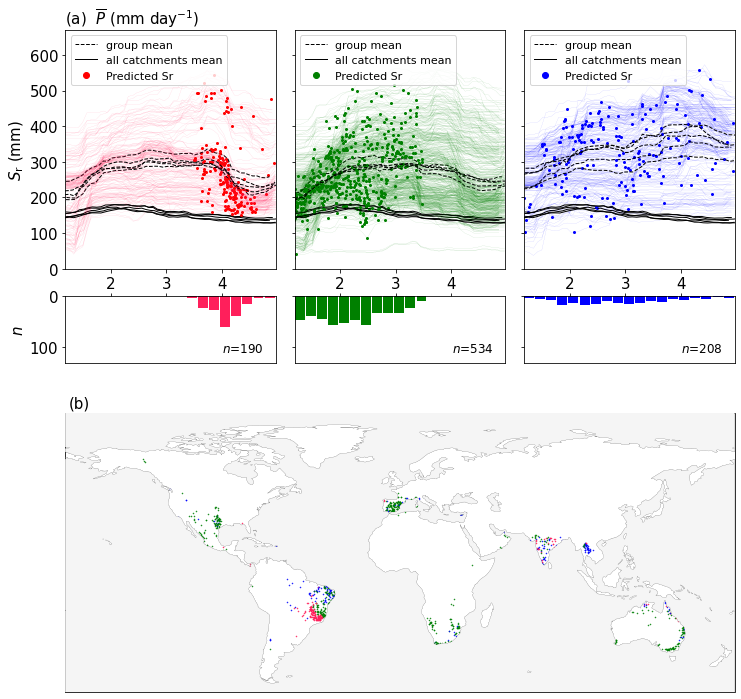

In [162]:
# make plots - ices - pmean - with points
var = ['idu_mean','t_mean','asi','p_mean']
var2 = ['$I_\mathrm{ISD}$','$\overline{T}$','$I_\mathrm{AS}$','$\overline{P}$']
pcavar = ['$I_\mathrm{ISD}$','$\overline{T}$','$I_\mathrm{AS}$','$\overline{P}$','$S_\mathrm{r}$']
m=3
grs1=[]
grs2=[]
grs3=[]

fig = plt.figure(figsize=(12,14))
gs = fig.add_gridspec(ncols=3, nrows=5,height_ratios=[2.5,1,0.7,0.2,5],width_ratios=[1,1,1])
ax1 = fig.add_subplot(gs[0, 0])
ax3 = fig.add_subplot(gs[0, 1])
ax7 = fig.add_subplot(gs[0, 2])
ax2 = fig.add_subplot(gs[2:4, 0])
ax4 = fig.add_subplot(gs[2:4, 1])
ax8 = fig.add_subplot(gs[2:4, 2])
ax6 = fig.add_subplot(gs[4,:],projection=ccrs.PlateCarree())

ax1.set_title(f'(a)  {var2[m]} ({units[m]})',size=15, loc='left')
ax1.set_ylabel('$S_\mathrm{r}$ (mm)',size=15)
ax1.set_ylim(0,670)
ax1.set_xlim(np.quantile(df.loc[:,var[m]],0.05),np.quantile(df.loc[:,var[m]],0.95))
ax1.tick_params(axis='both', labelsize=15)  
ax1.set_yticks([0,100,200,300,400,500,600])
ax1.set_yticklabels(['','','','','','',''])
ax1.set_yticklabels(['0','100','200','300','400','500','600'])

ax3.set_ylim(0,670)
ax3.set_xlim(np.quantile(df.loc[:,var[m]],0.05),np.quantile(df.loc[:,var[m]],0.95))
ax3.tick_params(axis='both', labelsize=15)
ax3.set_yticks([0,100,200,300,400,500,600])
ax3.set_yticklabels(['','','','','','',''])

ax7.set_ylim(0,670)
ax7.set_xlim(np.quantile(df.loc[:,var[m]],0.05),np.quantile(df.loc[:,var[m]],0.95))
ax7.tick_params(axis='both', labelsize=15)
ax7.set_yticks([0,100,200,300,400,500,600])
ax7.set_yticklabels(['','','','','','',''])

ax6.coastlines(linewidth=0.1)
ax6.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
ax6.set_global()
ax6.set_xlim(-180,180)
ax6.set_ylim(-60,90)
ax6.text(-178,93, f'(b)',zorder=101,size=15)
    
plt.subplots_adjust(wspace=0.09,hspace=-0.19)
for i in range(5):
    if(i==0):
        ice_p = ice_p0
    if(i==1):
        ice_p = ice_p1
    if(i==2):
        ice_p = ice_p2
    if(i==3):
        ice_p = ice_p3
    if(i==4):
        ice_p = ice_p4

    # define groups
    pos = []
    neg = []
    slp = (ice_p.iloc[:,-1] - ice_p.iloc[:,0])/(ice_p.columns[-1] - ice_p.columns[0])
    for i in ice_p.index:
        if (slp.loc[i]>0):
            pos.append(i)
        if (slp.loc[i]<0):
            neg.append(i)

    pm = slp.loc[pos].mean()
    nm = slp.loc[neg].mean()
    p1 = slp[slp>pm].index
    p2 = slp[slp<pm].index

    p = ice_p.index
    p1 = []
    p2 = []
    p3 = []
    grr = []
    for i in p:
        if (((ice_p.loc[i].iloc[25] - ice_p.loc[i].iloc[0])/(ice_p.columns[25] - ice_p.columns[0]) > 18)|((((ice_p.loc[i].iloc[40] - ice_p.loc[i].iloc[25])/(ice_p.columns[40] - ice_p.columns[25]) > 10)&(ice_p.loc[i].iloc[0]>220)))):
            p1.append(i)
        else:
            if (((ice_p.loc[i].iloc[49] - ice_p.loc[i].iloc[0])/(ice_p.columns[49] - ice_p.columns[0]) < -8)):
                grr.append(i)
            else:
                p2.append(i)
    p4 = []
    a = []
    for i in grr:
        if (((ice_p.loc[i].iloc[40] - ice_p.loc[i].iloc[25])/(ice_p.columns[40] - ice_p.columns[25]) > 10)&(ice_p.loc[i].iloc[0]>220)):
            a.append(i)
        if (((ice_p.loc[i].iloc[13] - ice_p.loc[i].iloc[0])/(ice_p.columns[13] - ice_p.columns[0]) > 5)):
            p4.append(i)
        else:
            p3.append(i)
    p2 = np.concatenate([p2,p4])    
    
    r=[]
    rr=[]
    h = []
    hh = []
    for i in p1:
        # if (((ice_p.loc[i].iloc[40] - ice_p.loc[i].iloc[30])/(ice_p.columns[40] - ice_p.columns[30]) < -3)):
        if (((ice_p.loc[i].iloc[40] - ice_p.loc[i].iloc[30])/(ice_p.columns[40] - ice_p.columns[30]) < 0)):
            r.append(i)
        else:
            rr.append(i)
    # print(len(rr))
    
    for k in r:
        if (df.loc[k].p_mean>3.5):
            h.append(k)
        else:
            hh.append(k)    
    gr1 = h
    gr2 = hh
    gr3 = rr
    ice = ice_p
    ylim = 130
    mm = 0
    grs1.append(gr1)
    grs2.append(gr2)
    grs3.append(gr3)

    if (len(gr1)>0):
        gr = gr1
        j = 0
        for i in gr:
            ax1.plot(ice.columns.values, ice.loc[i],color=c1,linestyle='-',linewidth=0.05)
            ax1.plot(df.loc[i,'p_mean'],test_dfs.loc[i,'Sr_p'],'ro',markersize=2)
        ax1.plot(ice.columns.values, ice.loc[gr].mean(),color='k',linestyle='--',linewidth=1)
        ax1.plot(ice.columns.values, ice.mean(),color='k',linestyle='-',linewidth=1)

    if (len(gr2)>0):
        gr = gr2
        j = 1
        for i in gr:
            ax3.plot(ice.columns.values, ice.loc[i],color='g',linestyle='-',linewidth=0.05)
            ax3.plot(df.loc[i,'p_mean'],test_dfs.loc[i,'Sr_p'],'go',markersize=2)
        ax3.plot(ice.columns.values, ice.loc[gr].mean(),color='k',linestyle='--',linewidth=1)
        ax3.plot(ice.columns.values, ice.mean(),color='k',linestyle='-',linewidth=1)


    if (len(gr3)>0):
        gr = gr3
        j = 2
        for i in gr:
            ax7.plot(ice.columns.values, ice.loc[i],color='b',linestyle='-',linewidth=0.05)
            ax7.plot(df.loc[i,'p_mean'],test_dfs.loc[i,'Sr_p'],'bo',markersize=2)
        ax7.plot(ice.columns.values, ice.loc[gr].mean(),color='k',linestyle='--',linewidth=1)
        ax7.plot(ice.columns.values, ice.mean(),color='k',linestyle='-',linewidth=1)

    ddf = df.loc[ice.index]
    ax6.plot(ddf.loc[gr1].lon, ddf.loc[gr1].lat,'o', markeredgecolor=c1, markerfacecolor=c1,markersize=0.5)
    ax6.plot(ddf.loc[gr2].lon, ddf.loc[gr2].lat,'o', markeredgecolor='g', markerfacecolor=c2,markersize=0.5)
    ax6.plot(ddf.loc[gr3].lon, ddf.loc[gr3].lat,'o', markeredgecolor='b', markerfacecolor=c2,markersize=0.5)

bins = np.linspace(np.quantile(df.loc[:,var[m]],0.05),np.quantile(df.loc[:,var[m]],0.95),20)

ax2.hist(df.loc[np.array(grs1[0]+grs1[1]+grs1[2]+grs1[3]+grs1[4]),features[m]],bins=bins,width=0.9*(bins[1]-bins[0]),color=c1)
ax2.invert_yaxis()
ax2.xaxis.tick_top()
ax2.set_xlim(np.quantile(df.loc[:,var[m]],0.05),np.quantile(df.loc[:,var[m]],0.95))
ax2.axes.get_xaxis().set_ticklabels([])
ax2.set_ylabel('$n$',size=15)
ax2.tick_params(axis='both', labelsize=15)
ax2.set_ylim(ylim,0)
ax2.text(ice.columns.values[-13],ylim-20,f'$n$={len(np.array(grs1[0]+grs1[1]+grs1[2]+grs1[3]+grs1[4]))}',size=12,zorder=10)

ax4.hist(df.loc[np.concatenate([grs2[0],grs2[1],grs2[2],grs2[3],grs2[4]]),features[m]],bins=bins,width=0.9*(bins[1]-bins[0]),color='g')
ax4.invert_yaxis()
ax4.xaxis.tick_top()
ax4.set_xlim(np.quantile(df.loc[:,var[m]],0.05),np.quantile(df.loc[:,var[m]],0.95))
ax4.axes.get_xaxis().set_ticklabels([])
ax4.tick_params(axis='both', labelsize=15)
ax4.set_ylim(ylim,0)
ax4.set_yticklabels([])
ax4.text(ice.columns.values[-13],ylim-20,f'$n$={len(np.concatenate([grs2[0],grs2[1],grs2[2],grs2[3],grs2[4]]))}',size=12,zorder=10)

ax8.hist(df.loc[np.array(grs3[0]+grs3[1]+grs3[2]+grs3[3]+grs3[4]),features[m]],bins=bins,width=0.9*(bins[1]-bins[0]),color='b')
ax8.invert_yaxis()
ax8.xaxis.tick_top()
ax8.set_xlim(np.quantile(df.loc[:,var[m]],0.05),np.quantile(df.loc[:,var[m]],0.95))
ax8.axes.get_xaxis().set_ticklabels([])
ax8.tick_params(axis='both', labelsize=15)
ax8.set_ylim(ylim,0)
ax8.set_yticklabels([])
ax8.text(ice.columns.values[-13],ylim-20,f'$n$={len(np.array(grs3[0]+grs3[1]+grs3[2]+grs3[3]+grs3[4]))}',size=12,zorder=10)

ax1.plot([-1,-1],[-4,-4],color='k',linestyle='--',linewidth=1, label='group mean')
ax1.plot([-1,-1],[-4,-4],color='k',linestyle='-',linewidth=1, label='all catchments mean')
ax3.plot([-1,-1],[-4,-4],color='k',linestyle='--',linewidth=1, label='group mean')
ax3.plot([-1,-1],[-4,-4],color='k',linestyle='-',linewidth=1, label='all catchments mean')
ax7.plot([-1,-1],[-4,-4],color='k',linestyle='--',linewidth=1, label='group mean')
ax7.plot([-1,-1],[-4,-4],color='k',linestyle='-',linewidth=1, label='all catchments mean')
ax1.plot(-1,-1,'ro',label='Predicted Sr')
ax3.plot(-1,-1,'go',label='Predicted Sr')
ax7.plot(-1,-1,'bo',label='Predicted Sr')
ax1.legend(loc='upper left',fontsize=11)
ax3.legend(loc='upper left',fontsize=11)
ax7.legend(loc='upper left',fontsize=11)
fig.savefig(f'{work_dir}/output/regression/figures/interpretation/ice_splitted_{var[m]}_points2.jpg',bbox_inches='tight',dpi=300)
#

## ICE plots - train - test

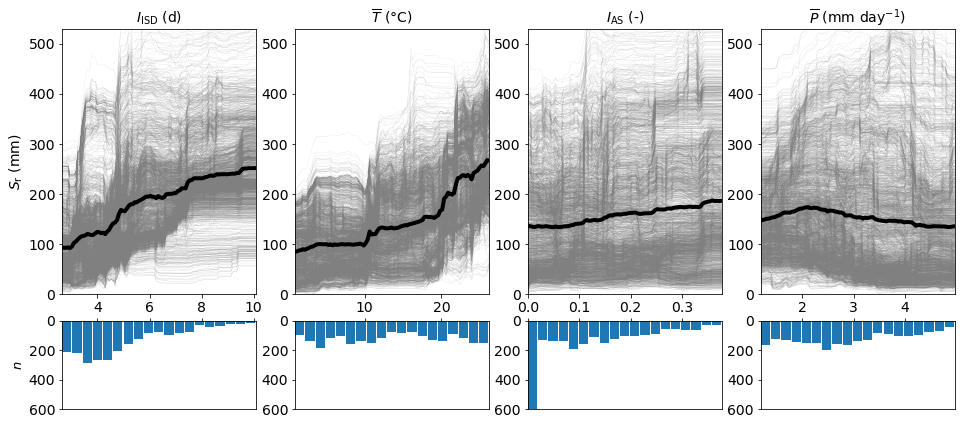

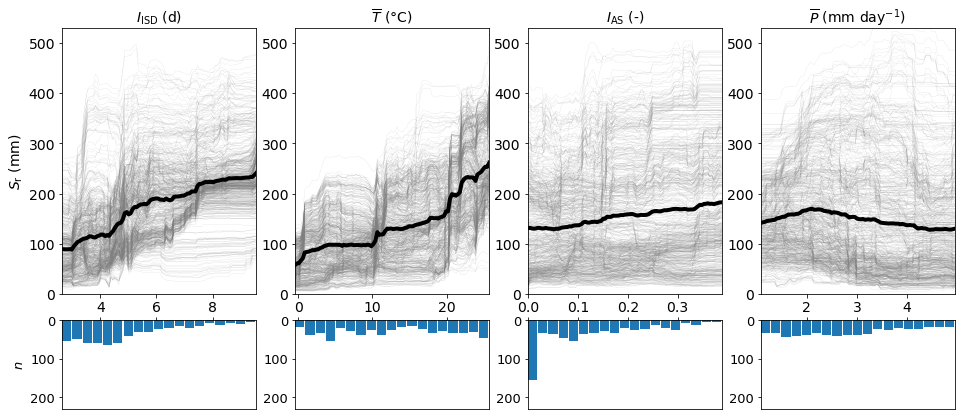

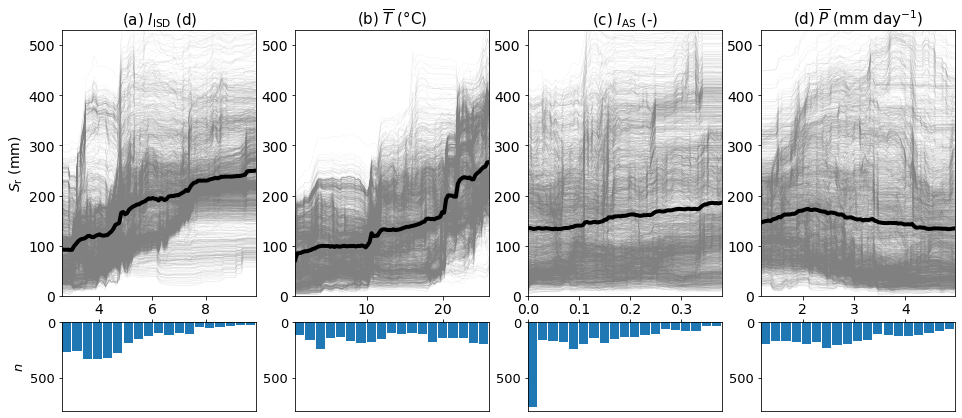

In [27]:
var = ['$I_\mathrm{ISD}$','$\overline{T}$','$I_\mathrm{AS}$','$\overline{P}$']
units = ['d','$\degree$C','-','mm $\mathrm{day}^{-1}$']
abcd = ['(a)','(b)','(c)','(d)']

# plot pdp TRAIN
fig3, ax = plt.subplots(2,len(features), figsize=(16,7),gridspec_kw={'height_ratios': [3, 1]})
plt.subplots_adjust(hspace=0.15)
for k in range(len(features)):
    a = partial_dependence(rf, features=[k], X=X_train, percentiles=(0.05, 0.95), grid_resolution=100, kind='both')
    pdp = pd.DataFrame(index=['average'],data = a['average'],columns=a['values'][0])
    ice = pd.DataFrame(index=df_train.index, data = a['individual'][0],columns=a['values'][0])
    for i in ice.index:
        ax[0,k].plot(ice.columns.values, ice.loc[i],color='grey',linestyle='-',linewidth=0.07)
    ax[0,k].plot(pdp.columns.values, pdp.loc['average'],color='k',linestyle='-',linewidth=4)
    ax[0,k].set_title(f'{var[k]} ({units[k]})',size=14)
    # ax[0,k].xaxis.set_label_position('top')
    ax[0,0].set_ylabel('$S_\mathrm{r}$ (mm)',size=14)
    ax[0,k].set_ylim(0,530)
    ax[0,k].set_xlim(np.quantile(X_train[:,k],0.05),np.quantile(X_train[:,k],0.95))
    ax[0,k].tick_params(axis='both', labelsize=14)
       
    bins = np.linspace(np.quantile(X_train[:,k],0.05),np.quantile(X_train[:,k],0.95),20)
    ax[1,k].hist(X_train[:,k],bins=bins,width=0.9*(bins[1]-bins[0]))
    ax[1,k].invert_yaxis()
    ax[1,k].xaxis.tick_top()
    ax[1,k].set_xlim(np.quantile(X_train[:,k],0.05),np.quantile(X_train[:,k],0.95))
    ax[1,k].axes.get_xaxis().set_ticklabels([])
    ax[1,0].set_ylabel('$n$',size=13)
    ax[1,k].tick_params(axis='both', labelsize=14)
    ax[1,k].set_ylim(600,0)
fig3.savefig(f'{work_dir}/output/regression/figures/interpretation/pdp_train_{mod}.jpg',bbox_inches='tight',dpi=300)

    
# plot pdp TEST
fig3, ax = plt.subplots(2,len(features), figsize=(16,7),gridspec_kw={'height_ratios': [3, 1]})
plt.subplots_adjust(hspace=0.15)
for k in range(len(features)):
    a = partial_dependence(rf, features=[k], X=X_test, percentiles=(0.05, 0.95),grid_resolution=100, kind='both')
    pdp = pd.DataFrame(index=['average'],data = a['average'],columns=a['values'][0])
    ice = pd.DataFrame(index=df_test.index, data = a['individual'][0],columns=a['values'][0])

    for i in ice.index:
        ax[0,k].plot(ice.columns.values, ice.loc[i],color='grey',linestyle='-',linewidth=0.07)
    ax[0,k].plot(pdp.columns.values, pdp.loc['average'],color='k',linestyle='-',linewidth=4)
    ax[0,k].set_title(f'{var[k]} ({units[k]})',size=14)
    # ax[0,k].xaxis.set_label_position('top')
    ax[0,0].set_ylabel('$S_\mathrm{r}$ (mm)',size=14)
    ax[0,k].set_ylim(0,530)
    ax[0,k].set_xlim(np.quantile(X_test[:,k],0.05),np.quantile(X_test[:,k],0.95))
    ax[0,k].tick_params(axis='both', labelsize=14)
       
    bins = np.linspace(np.quantile(X_test[:,k],0.05),np.quantile(X_test[:,k],0.95),20)
    ax[1,k].hist(X_test[:,k],bins=bins,width=0.9*(bins[1]-bins[0]))
    ax[1,k].invert_yaxis()
    ax[1,k].xaxis.tick_top()
    ax[1,k].set_xlim(np.quantile(X_test[:,k],0.05),np.quantile(X_test[:,k],0.95))
    ax[1,k].axes.get_xaxis().set_ticklabels([])
    ax[1,0].set_ylabel('$n$',size=13)
    ax[1,k].tick_params(axis='both', labelsize=13)
    ax[1,k].set_ylim(230,0)
fig3.savefig(f'{work_dir}/output/regression/figures/interpretation/pdp_test_{mod}.jpg',bbox_inches='tight',dpi=300)


# plot pdp TRAIN+TEST
X = np.concatenate([X_train,X_test])
ddf = pd.concat([df_train,df_test])
fig3, ax = plt.subplots(2,len(features), figsize=(16,7),gridspec_kw={'height_ratios': [3, 1]})
plt.subplots_adjust(hspace=0.15)
for k in range(len(features)):
    a = partial_dependence(rf, features=[k], X=X, percentiles=(0.05, 0.95),grid_resolution=100, kind='both')
    pdp = pd.DataFrame(index=['average'],data = a['average'],columns=a['values'][0])
    ice = pd.DataFrame(index=ddf.index, data = a['individual'][0],columns=a['values'][0])

    for i in ice.index:
        ax[0,k].plot(ice.columns.values, ice.loc[i],color='grey',linestyle='-',linewidth=0.05)
    ax[0,k].plot(pdp.columns.values, pdp.loc['average'],color='k',linestyle='-',linewidth=4)
    ax[0,k].set_title(f'{abcd[k]} {var[k]} ({units[k]})',size=15)
    # ax[0,k].xaxis.set_label_position('top')
    ax[0,0].set_ylabel('$S_\mathrm{r}$ (mm)',size=14)
    ax[0,k].set_ylim(0,530)
    ax[0,k].set_xlim(np.quantile(X[:,k],0.05),np.quantile(X[:,k],0.95))
    ax[0,k].tick_params(axis='both', labelsize=14)
       
    bins = np.linspace(np.quantile(X[:,k],0.05),np.quantile(X[:,k],0.95),20)
    ax[1,k].hist(X[:,k],bins=bins,width=0.9*(bins[1]-bins[0]))
    ax[1,k].invert_yaxis()
    ax[1,k].xaxis.tick_top()
    ax[1,k].set_xlim(np.quantile(X[:,k],0.05),np.quantile(X[:,k],0.95))
    ax[1,k].axes.get_xaxis().set_ticklabels([])
    ax[1,0].set_ylabel('$n$',size=13)
    ax[1,k].tick_params(axis='both', labelsize=13)
    ax[1,k].set_ylim(800,0)
fig3.savefig(f'{work_dir}/output/regression/figures/interpretation/pdp_traintest_{mod}.jpg',bbox_inches='tight',dpi=300)

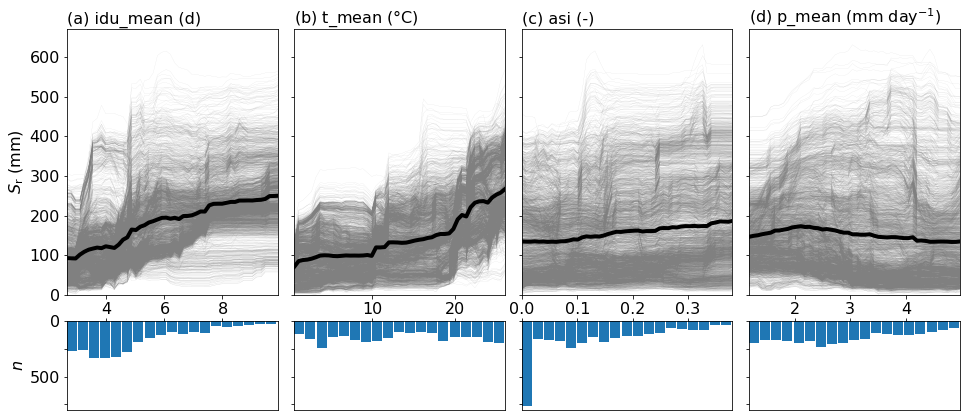

In [60]:
abcd = ['(a)','(b)','(c)','(d)']

# plot pdp TRAIN+TEST
X = np.concatenate([X_train,X_test])
ddf = pd.concat([df_train,df_test])
fig3, ax = plt.subplots(2,len(features), figsize=(16,7),gridspec_kw={'height_ratios': [3, 1]})
plt.subplots_adjust(hspace=0.15,wspace=0.08)
for k in range(len(features)):
    a = partial_dependence(rf, features=[k], X=X, percentiles=(0.05, 0.95),grid_resolution=50, kind='both')
    pdp = pd.DataFrame(index=['average'],data = a['average'],columns=a['values'][0])
    ice = pd.DataFrame(index=ddf.index, data = a['individual'][0],columns=a['values'][0])

    for i in ice.index:
        ax[0,k].plot(ice.columns.values, ice.loc[i],color='grey',linestyle='-',linewidth=0.05)
    ax[0,k].plot(pdp.columns.values, pdp.loc['average'],color='k',linestyle='-',linewidth=4)
    ax[0,k].set_title(f'{abcd[k]} {var[k]} ({units[k]})',size=16, loc='left')
    # ax[0,k].xaxis.set_label_position('top')
    ax[0,0].set_ylabel('$S_\mathrm{r}$ (mm)',size=16)
    ax[0,k].set_ylim(0,670)
    ax[0,k].set_xlim(np.quantile(X[:,k],0.05),np.quantile(X[:,k],0.95))
    ax[0,k].tick_params(axis='both', labelsize=16)
    ax[0,k].set_yticks([0,100,200,300,400,500,600])
    ax[0,k].set_yticklabels(['','','','','','',''])
    ax[0,0].set_yticklabels(['0','100','200','300','400','500','600'])
           
    bins = np.linspace(np.quantile(X[:,k],0.05),np.quantile(X[:,k],0.95),20)
    ax[1,k].hist(X[:,k],bins=bins,width=0.9*(bins[1]-bins[0]))
    ax[1,k].invert_yaxis()
    ax[1,k].xaxis.tick_top()
    ax[1,k].set_xlim(np.quantile(X[:,k],0.05),np.quantile(X[:,k],0.95))
    ax[1,k].axes.get_xaxis().set_ticklabels([])
    ax[1,0].set_ylabel('$n$',size=16)
    ax[1,k].tick_params(axis='both', labelsize=16)
    ax[1,k].set_ylim(800,0)
    ax[1,k].set_yticks([0,250,500,750])
    ax[1,k].set_yticklabels(['','','',''])
    ax[1,0].set_yticklabels(['0','','500',''])
fig3.savefig(f'{work_dir}/output/regression/figures/interpretation/pdp_traintest_{mod}.jpg',bbox_inches='tight',dpi=300)

In [53]:
ddf

,lat,lon,Sr_m,Sr_p,Sr_p-Sr_m,(Sr_p-Sr_m)/Sr_m
cz_0000019,49.7604,16.9729,51.681945,50.578685,-1.103260,-0.021813
br_0001191,-13.3646,-39.0813,173.824040,173.619553,-0.204487,-0.001178
bw_0000006,-21.0896,27.5146,221.777925,218.340612,-3.437313,-0.015743
ca_0001997,48.4062,-81.4521,58.679559,64.280263,5.600703,0.087129
ca_0005679,49.0937,-120.6729,108.511781,100.123518,-8.388264,-0.083779
...,...,...,...,...,...,...
us_0001645,33.1021,-83.7229,39.131138,41.325084,2.193946,0.053090
ca_0001935,53.5062,-60.2896,7.506030,31.853462,24.347432,0.764357
ITSAR236,39.506516,8.62601,284.135194,235.120616,-49.014579,-0.208466
br_0000943,-17.6646,-46.3563,304.908971,244.169328,-60.739643,-0.248760


## MAKE MANUAL SPLITS

In [34]:
c1 = '#FF1F5B'
c2 = '#009ADE'
c3 = '#AF58BA'
c4 = '#FFC61E'

In [35]:
def run_pca(gr1,gr2):
    f = f'{work_dir}/output/catchment_characteristics/master_characteristics_{data_sources}.csv'
    dfp = pd.read_csv(f,index_col=0)
    features = ['idu_mean','t_mean','asi','p_mean'] 
    ff = features
    ff.append('sr_20')
    dfp = dfp[ff]
    dfp = dfp.loc[ice.index]
    dfp.loc[gr1,'gr'] = 0
    dfp.loc[gr2,'gr'] = 1

    xx = dfp[features]
    xx = StandardScaler().fit_transform(xx) #standardize all values
    xx = pd.DataFrame(xx,columns=ff)
    pca = PCA(n_components=len(ff))
    components = pca.fit_transform(xx)
    loadings = pca.components_ #eigenvector, length represents variance var explains

    # Create dataframe
    pca_df = pd.DataFrame(data=components[:,0:2],columns=['PC1', 'PC2'])
    pca_df_scaled = pca_df.copy()
    scaler_df = pca_df[['PC1', 'PC2']]
    scaler = 1 / (scaler_df.max() - scaler_df.min()) # WAAROM DIT?

    for index in scaler.index:
        pca_df_scaled[index] *= scaler[index]
    per_var  = np.round(pca.explained_variance_ratio_ * 100, decimals=1)

    xs = loadings[0]
    ys = loadings[1]
    ld_df = pd.DataFrame(index=ff, columns=['xs','ys'])
    ld_df['xs'] = loadings[0]
    ld_df['ys'] = loadings[1]
    ld_df['len'] = np.sqrt(loadings[0]**2+loadings[1]**2)
    return (pca_df_scaled, ld_df, ff,dfp,per_var)

def run_pca2(gr1,gr2,gr3):
    f = f'{work_dir}/output/catchment_characteristics/master_characteristics_{data_sources}.csv'
    dfp = pd.read_csv(f,index_col=0)
    features = ['idu_mean','t_mean','asi','p_mean'] 
    ff = features
    ff.append('sr_20')
    dfp = dfp[ff]
    dfp = dfp.loc[ice.index]
    dfp.loc[gr1,'gr'] = 0
    dfp.loc[gr2,'gr'] = 1
    dfp.loc[gr3,'gr'] = 2

    xx = dfp[features]
    xx = StandardScaler().fit_transform(xx) #standardize all values
    xx = pd.DataFrame(xx,columns=ff)
    pca = PCA(n_components=len(ff))
    components = pca.fit_transform(xx)
    loadings = pca.components_ #eigenvector, length represents variance var explains

    # Create dataframe
    pca_df = pd.DataFrame(data=components[:,0:2],columns=['PC1', 'PC2'])
    pca_df_scaled = pca_df.copy()
    scaler_df = pca_df[['PC1', 'PC2']]
    scaler = 1 / (scaler_df.max() - scaler_df.min()) # WAAROM DIT?

    for index in scaler.index:
        pca_df_scaled[index] *= scaler[index]
    per_var  = np.round(pca.explained_variance_ratio_ * 100, decimals=1)

    xs = loadings[0]
    ys = loadings[1]
    ld_df = pd.DataFrame(index=ff, columns=['xs','ys'])
    ld_df['xs'] = loadings[0]
    ld_df['ys'] = loadings[1]
    ld_df['len'] = np.sqrt(loadings[0]**2+loadings[1]**2)
    return (pca_df_scaled, ld_df, ff,dfp,per_var)

In [58]:
# get ices
f = f'{work_dir}/output/catchment_characteristics/master_characteristics_{data_sources}.csv'
df = pd.read_csv(f,index_col=0)

# t_mean
k = 1 
a = partial_dependence(rf, features=[k], X=X, percentiles=(0.05, 0.95),grid_resolution=100, kind='both')
pdp_t = pd.DataFrame(index=['average'],data = a['average'],columns=a['values'][0])
ice_t = pd.DataFrame(index=ddf.index, data = a['individual'][0],columns=a['values'][0])

# p_mean
k = 3
a = partial_dependence(rf, features=[k], X=X, percentiles=(0.05, 0.95),grid_resolution=100, kind='both')
pdp_p = pd.DataFrame(index=['average'],data = a['average'],columns=a['values'][0])
ice_p = pd.DataFrame(index=ddf.index, data = a['individual'][0],columns=a['values'][0])

# idu_mean
k = 0
a = partial_dependence(rf, features=[k], X=X, percentiles=(0.05, 0.95),grid_resolution=100, kind='both')
pdp_idu = pd.DataFrame(index=['average'],data = a['average'],columns=a['values'][0])
ice_idu = pd.DataFrame(index=ddf.index, data = a['individual'][0],columns=a['values'][0])

# asi
k = 2 
a = partial_dependence(rf, features=[k], X=X, percentiles=(0.05, 0.95),grid_resolution=100, kind='both')
pdp_asi = pd.DataFrame(index=['average'],data = a['average'],columns=a['values'][0])
ice_asi = pd.DataFrame(index=ddf.index, data = a['individual'][0],columns=a['values'][0])

In [59]:
# make groups
# tmean
pos = []
neg = []
slp = (ice_t.iloc[:,-1] - ice_t.iloc[:,0])/(ice_t.columns[-1] - ice_t.columns[0])
for i in ice_t.index:
    if (slp.loc[i]>0):
        pos.append(i)
    if (slp.loc[i]<0):
        neg.append(i)
pm = slp.loc[pos].mean()
t1 = slp[slp>pm].index
t2 = slp[(slp<=pm) & (slp>0)].index
t1=[]
t2=[]
for i in pos:
    if (((ice_t.loc[i].iloc[50] - ice_t.loc[i].iloc[0])/(ice_t.columns[50] - ice_t.columns[0]) > 5)|((ice_t.loc[i].iloc[15] - ice_t.loc[i].iloc[0])/(ice_t.columns[15] - ice_t.columns[0]) > 10)):
        t1.append(i)
    else:
        t2.append(i)
        
# idumean
pos = []
neg = []
i1 = []
i2 = []
for i in ice_idu.index:
    if (((ice_idu.loc[i].iloc[35] - ice_idu.loc[i].iloc[0])/(ice_idu.columns[35] - ice_idu.columns[0]) > 35))|(((ice_idu.loc[i].iloc[20] - ice_idu.loc[i].iloc[0])/(ice_idu.columns[20] - ice_idu.columns[0]) > 50)):
        i1.append(i)
    else:
        i2.append(i)

# slp = (ice_idu.iloc[:,-1] - ice_idu.iloc[:,0])/(ice_idu.columns[-1] - ice_idu.columns[0])
# for i in ice_idu.index:
#     if (slp.loc[i]>0):
#         pos.append(i)
#     if (slp.loc[i]<0):
#         neg.append(i)

# pm = slp.loc[pos].mean()
# i1 = slp[slp>0.9*pm].index
# i2 = slp[(slp<=0.9*pm) & (slp>0)].index

# asi
pos = []
neg = []
slp = (ice_asi.iloc[:,-1] - ice_asi.iloc[:,0])/(ice_asi.columns[-1] - ice_asi.columns[0])
for i in ice_asi.index:
    if (slp.loc[i]>0):
        pos.append(i)
    if (slp.loc[i]<0):
        neg.append(i)

pm = slp.loc[pos].mean()
a1 = slp[slp>1.15*pm].index
a2 = slp[(slp<=1.15*pm) & (slp>0)].index

# pmean
# define groups
pos = []
neg = []
slp = (ice_p.iloc[:,-1] - ice_p.iloc[:,0])/(ice_p.columns[-1] - ice_p.columns[0])
for i in ice_p.index:
    if (slp.loc[i]>0):
        pos.append(i)
    if (slp.loc[i]<0):
        neg.append(i)

pm = slp.loc[pos].mean()
nm = slp.loc[neg].mean()
p1 = slp[slp>pm].index
p2 = slp[slp<pm].index

p = ice_p.index
p1 = []
p2 = []
p3 = []
grr = []
for i in p:
    if (((ice_p.loc[i].iloc[50] - ice_p.loc[i].iloc[0])/(ice_p.columns[50] - ice_p.columns[0]) > 18)|((((ice_p.loc[i].iloc[80] - ice_p.loc[i].iloc[50])/(ice_p.columns[80] - ice_p.columns[50]) > 10)&(ice_p.loc[i].iloc[0]>220)))):
        p1.append(i)
    else:
        if (((ice_p.loc[i].iloc[99] - ice_p.loc[i].iloc[0])/(ice_p.columns[99] - ice_p.columns[0]) < -8)):
            grr.append(i)
        else:
            p2.append(i)
p4 = []
a = []
for i in grr:
    if (((ice_p.loc[i].iloc[80] - ice_p.loc[i].iloc[50])/(ice_p.columns[80] - ice_p.columns[50]) > 10)&(ice_p.loc[i].iloc[0]>220)):
        a.append(i)
    if (((ice_p.loc[i].iloc[35] - ice_p.loc[i].iloc[0])/(ice_p.columns[35] - ice_p.columns[0]) > 5)):
        p4.append(i)
    else:
        p3.append(i)
p2 = np.concatenate([p2,p4])

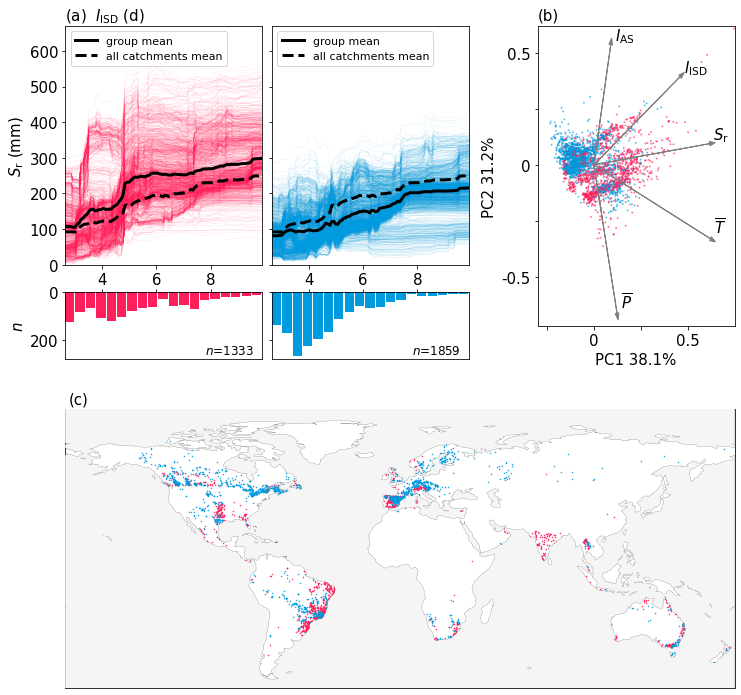

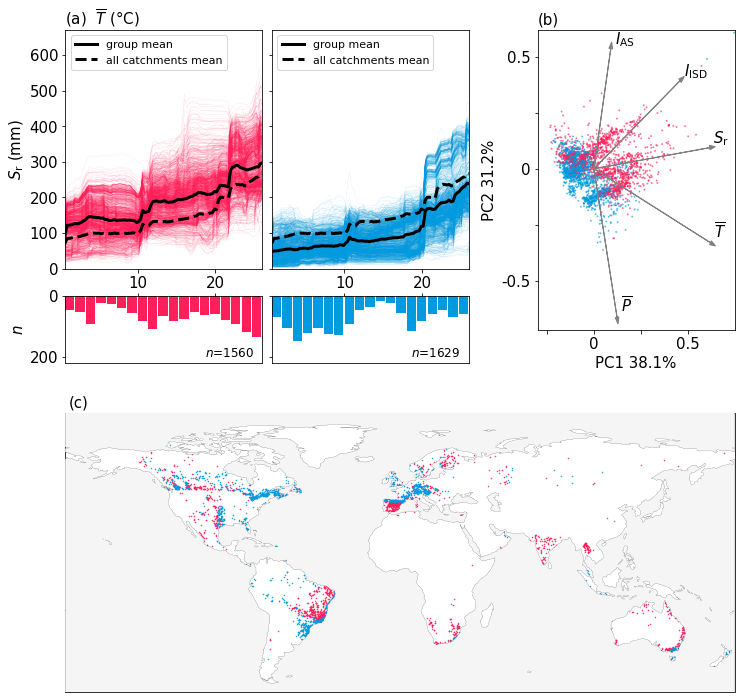

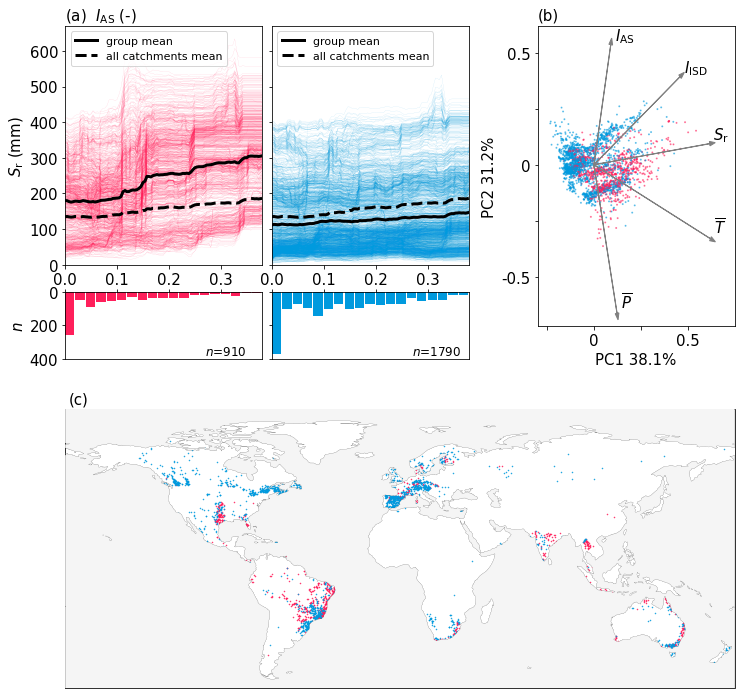

In [38]:
# make plots - ices
var = ['idu_mean','t_mean','asi']
var2 = ['$I_\mathrm{ISD}$','$\overline{T}$','$I_\mathrm{AS}$','$\overline{P}$']
pcavar = ['$I_\mathrm{ISD}$','$\overline{T}$','$I_\mathrm{AS}$','$\overline{P}$','$S_\mathrm{r}$']

for m in range(len(var)):
    if (var[m]=='t_mean'):
        gr1 = t1
        gr2 = t2
        ice = ice_t
        ylim = 220
    if (var[m]=='idu_mean'):
        gr1 = i1
        gr2 = i2
        ice = ice_idu
        ylim = 280
    if (var[m]=='asi'):
        gr1 = a1
        gr2 = a2
        ice = ice_asi
        ylim = 400
    mm = 0
    fig = plt.figure(figsize=(12,14))
    gs = fig.add_gridspec(ncols=4, nrows=5,height_ratios=[2.5,1,0.7,0.2,5],width_ratios=[4,4,1,4])
    ax1 = fig.add_subplot(gs[0, 0])
    ax3 = fig.add_subplot(gs[0, 1])
    ax2 = fig.add_subplot(gs[2:4, 0])
    ax4 = fig.add_subplot(gs[2:4, 1])
    ax5 = fig.add_subplot(gs[0:2, 3])
    ax6 = fig.add_subplot(gs[4,:],projection=ccrs.PlateCarree())
    # ax7 = fig.add_subplot(gs[0, 2])
    plt.subplots_adjust(wspace=0.06,hspace=-0.19)
    
    if (len(gr1)>0):
        gr = gr1
        j = 0
        for i in gr:
            ax1.plot(ice.columns.values, ice.loc[i],color=c1,linestyle='-',linewidth=0.05)
        ax1.plot(ice.columns.values, ice.loc[gr].mean(),color='k',linestyle='-',linewidth=3, label='group mean')
        ax1.plot(ice.columns.values, ice.mean(),color='k',linestyle='--',linewidth=3, label= 'all catchments mean')
        # ax[mm,j].set_title(f'{var2[m]} ({units[m]}), $n$={len(gr)}',size=14)
        ax1.set_title(f'(a)  {var2[m]} ({units[m]})',size=15, loc='left')
        ax1.set_ylabel('$S_\mathrm{r}$ (mm)',size=15)
        ax1.set_ylim(0,670)
        ax1.set_xlim(np.quantile(X[:,m],0.05),np.quantile(X[:,m],0.95))
        ax1.tick_params(axis='both', labelsize=15)  
        ax1.set_yticks([0,100,200,300,400,500,600])
        ax1.set_yticklabels(['','','','','','',''])
        ax1.set_yticklabels(['0','100','200','300','400','500','600'])
        ax1.legend(loc='upper left',fontsize=11)
        
        bins = np.linspace(np.quantile(X[:,m],0.05),np.quantile(X[:,m],0.95),20)
        ax2.hist(df.loc[gr,features[m]],bins=bins,width=0.9*(bins[1]-bins[0]),color=c1)
        ax2.invert_yaxis()
        ax2.xaxis.tick_top()
        ax2.set_xlim(np.quantile(X[:,m],0.05),np.quantile(X[:,m],0.95))
        ax2.axes.get_xaxis().set_ticklabels([])
        ax2.set_ylabel('$n$',size=15)
        ax2.tick_params(axis='both', labelsize=15)
        ax2.set_ylim(ylim,0)
        ax2.text(ice.columns.values[-30],ylim-20,f'$n$={len(gr)}',size=12,zorder=10)

    if (len(gr2)>0):
        gr = gr2
        j = 1
        for i in gr:
            ax3.plot(ice.columns.values, ice.loc[i],color=c2,linestyle='-',linewidth=0.05)
        ax3.plot(ice.columns.values, ice.loc[gr].mean(),color='k',linestyle='-',linewidth=3, label='group mean')
        ax3.plot(ice.columns.values, ice.mean(),color='k',linestyle='--',linewidth=3, label='all catchments mean')
        # ax[mm,j].set_title(f'{var2[m]} ({units[m]}), $n$={len(gr)}',size=14)
        # ax[0,j].set_ylabel('Sr (mm)',size=13)
        ax3.set_ylim(0,670)
        ax3.set_xlim(np.quantile(X[:,m],0.05),np.quantile(X[:,m],0.95))
        ax3.tick_params(axis='both', labelsize=15)
        ax3.set_yticks([0,100,200,300,400,500,600])
        ax3.set_yticklabels(['','','','','','',''])
        ax3.legend(loc='upper left',fontsize=11)
        
        bins = np.linspace(np.quantile(X[:,m],0.05),np.quantile(X[:,m],0.95),20)
        ax4.hist(df.loc[gr,features[m]],bins=bins,width=0.9*(bins[1]-bins[0]),color=c2)
        ax4.invert_yaxis()
        ax4.xaxis.tick_top()
        ax4.set_xlim(np.quantile(X[:,m],0.05),np.quantile(X[:,m],0.95))
        ax4.axes.get_xaxis().set_ticklabels([])
        # ax[1,j].set_ylabel('$n$',size=13)
        ax4.tick_params(axis='both', labelsize=15)
        ax4.set_ylim(ylim,0)
        ax4.set_yticklabels([])
        ax4.text(ice.columns.values[-30],ylim-20,f'$n$={len(gr)}',size=12,zorder=10)
        
    cmap = ListedColormap([c1,c2])
    pca_df_scaled, ld_df, ff, dfp,per_var = run_pca(gr1,gr2)[0], run_pca(gr1,gr2)[1], run_pca(gr1,gr2)[2], run_pca(gr1,gr2)[3], run_pca(gr1,gr2)[4]
    ax5.scatter(pca_df_scaled.PC1,pca_df_scaled.PC2,s=1,alpha=0.5,c=dfp.gr,cmap=cmap)
    for i, varnames in enumerate(ff):
        ax5.arrow(
            0, 0, # coordinates of arrow base
            ld_df.loc[ff[i]]['xs'], # length of the arrow along x
            ld_df.loc[ff[i]]['ys'], # length of the arrow along y
            color='grey',
            head_width=0.02
            )
        ax5.text(ld_df.loc[ff[i]]['xs']+0.02, ld_df.loc[ff[i]]['ys']+0.02, pcavar[i],size=15)
    ax5.tick_params(axis='both', which='major', labelsize=15)
    ax5.set_xlim(-0.3,0.75)
    ax5.set_ylim(-0.72,0.62)
    ax5.set_xlabel(f'PC1 {per_var[0]}%',size=15)
    ax5.set_ylabel(f'PC2 {per_var[1]}%',size=15)
    ax5.set_xticks([-0.25,0,0.25,0.5])
    ax5.set_yticks([-0.5,-0.25,0,0.25,0.5])
    ax5.set_yticklabels(['-0.5','','0','','0.5'])
    ax5.set_xticklabels(['','0','','0.5'])
    ax5.set_title('(b)',size=15,loc='left')
    
    ax6.coastlines(linewidth=0.1)
    ax6.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
    ax6.set_global()
    ax6.set_xlim(-180,180)
    ax6.set_ylim(-60,90)
    ddf = df.loc[ice.index]
    ax6.plot(ddf.loc[gr1].lon, ddf.loc[gr1].lat,'o', markeredgecolor=c1, markerfacecolor=c1,markersize=0.5)
    ax6.plot(ddf.loc[gr2].lon, ddf.loc[gr2].lat,'o', markeredgecolor=c2, markerfacecolor=c2,markersize=0.5)
    ax6.text(-178,93, f'(c)',zorder=101,size=15)
    
    fig.savefig(f'{work_dir}/output/regression/figures/interpretation/ice_splitted_{var[m]}.jpg',bbox_inches='tight',dpi=300)


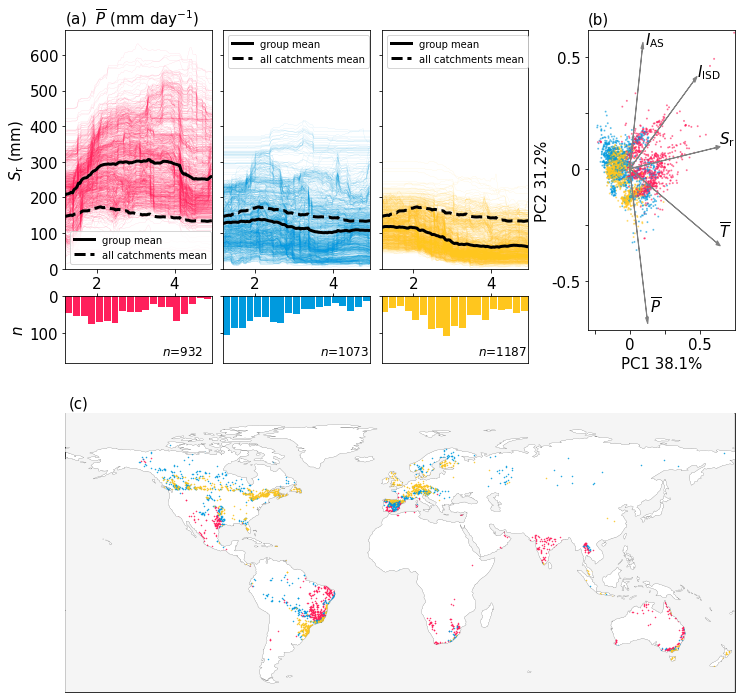

In [39]:
# make plots - ices - pmean
var = ['idu_mean','t_mean','asi','p_mean']
var2 = ['$I_\mathrm{ISD}$','$\overline{T}$','$I_\mathrm{AS}$','$\overline{P}$']
pcavar = ['$I_\mathrm{ISD}$','$\overline{T}$','$I_\mathrm{AS}$','$\overline{P}$','$S_\mathrm{r}$']
for m in range(len(var)):
    if (var[m]=='t_mean'):
        gr1 = t1
        gr2 = t2
        ice = ice_t
        ylim = 220
    if (var[m]=='idu_mean'):
        gr1 = i1
        gr2 = i2
        ice = ice_idu
        ylim = 280
    if (var[m]=='asi'):
        gr1 = a1
        gr2 = a2
        ice = ice_asi
        ylim = 400
    if (var[m]=='p_mean'):
        gr1 = p1
        gr2 = p2
        gr3 = p3
        ice = ice_p
        ylim = 180
        mm = 0

        fig = plt.figure(figsize=(12,14))
        gs = fig.add_gridspec(ncols=5, nrows=5,height_ratios=[2.5,1,0.7,0.2,5],width_ratios=[4,4,4,1,4])
        ax1 = fig.add_subplot(gs[0, 0])
        ax3 = fig.add_subplot(gs[0, 1])
        ax7 = fig.add_subplot(gs[0, 2])
        ax2 = fig.add_subplot(gs[2:4, 0])
        ax4 = fig.add_subplot(gs[2:4, 1])
        ax8 = fig.add_subplot(gs[2:4, 2])
        ax5 = fig.add_subplot(gs[0:2, 4])
        ax6 = fig.add_subplot(gs[4,:],projection=ccrs.PlateCarree())
        # ax7 = fig.add_subplot(gs[0, 2])
        plt.subplots_adjust(wspace=0.09,hspace=-0.19)

        if (len(gr1)>0):
            gr = gr1
            j = 0
            for i in gr:
                ax1.plot(ice.columns.values, ice.loc[i],color=c1,linestyle='-',linewidth=0.05)
            ax1.plot(ice.columns.values, ice.loc[gr].mean(),color='k',linestyle='-',linewidth=3, label='group mean')
            ax1.plot(ice.columns.values, ice.mean(),color='k',linestyle='--',linewidth=3, label= 'all catchments mean')
            # ax[mm,j].set_title(f'{var2[m]} ({units[m]}), $n$={len(gr)}',size=14)
            ax1.set_title(f'(a)  {var2[m]} ({units[m]})',size=15, loc='left')
            ax1.set_ylabel('$S_\mathrm{r}$ (mm)',size=15)
            ax1.set_ylim(0,670)
            ax1.set_xlim(np.quantile(X[:,m],0.05),np.quantile(X[:,m],0.95))
            ax1.tick_params(axis='both', labelsize=15)  
            ax1.set_yticks([0,100,200,300,400,500,600])
            ax1.set_yticklabels(['','','','','','',''])
            ax1.set_yticklabels(['0','100','200','300','400','500','600'])
            ax1.legend(loc='lower left',fontsize=10)

            bins = np.linspace(np.quantile(X[:,m],0.05),np.quantile(X[:,m],0.95),20)
            ax2.hist(df.loc[gr,features[m]],bins=bins,width=0.9*(bins[1]-bins[0]),color=c1)
            ax2.invert_yaxis()
            ax2.xaxis.tick_top()
            ax2.set_xlim(np.quantile(X[:,m],0.05),np.quantile(X[:,m],0.95))
            ax2.axes.get_xaxis().set_ticklabels([])
            ax2.set_ylabel('$n$',size=15)
            ax2.tick_params(axis='both', labelsize=15)
            ax2.set_ylim(ylim,0)
            ax2.text(ice.columns.values[-35],ylim-20,f'$n$={len(gr)}',size=12,zorder=10)

        if (len(gr2)>0):
            gr = gr2
            j = 1
            for i in gr:
                ax3.plot(ice.columns.values, ice.loc[i],color=c2,linestyle='-',linewidth=0.05)
            ax3.plot(ice.columns.values, ice.loc[gr].mean(),color='k',linestyle='-',linewidth=3, label='group mean')
            ax3.plot(ice.columns.values, ice.mean(),color='k',linestyle='--',linewidth=3, label='all catchments mean')
            # ax[mm,j].set_title(f'{var2[m]} ({units[m]}), $n$={len(gr)}',size=14)
            # ax[0,j].set_ylabel('Sr (mm)',size=13)
            ax3.set_ylim(0,670)
            ax3.set_xlim(np.quantile(X[:,m],0.05),np.quantile(X[:,m],0.95))
            ax3.tick_params(axis='both', labelsize=15)
            ax3.set_yticks([0,100,200,300,400,500,600])
            ax3.set_yticklabels(['','','','','','',''])
            ax3.legend(loc='upper left',fontsize=10)

            bins = np.linspace(np.quantile(X[:,m],0.05),np.quantile(X[:,m],0.95),20)
            ax4.hist(df.loc[gr,features[m]],bins=bins,width=0.9*(bins[1]-bins[0]),color=c2)
            ax4.invert_yaxis()
            ax4.xaxis.tick_top()
            ax4.set_xlim(np.quantile(X[:,m],0.05),np.quantile(X[:,m],0.95))
            ax4.axes.get_xaxis().set_ticklabels([])
            # ax[1,j].set_ylabel('$n$',size=13)
            ax4.tick_params(axis='both', labelsize=15)
            ax4.set_ylim(ylim,0)
            ax4.set_yticklabels([])
            ax4.text(ice.columns.values[-35],ylim-20,f'$n$={len(gr)}',size=12,zorder=10)

        if (len(gr3)>0):
            gr = gr3
            j = 2
            for i in gr:
                ax7.plot(ice.columns.values, ice.loc[i],color=c4,linestyle='-',linewidth=0.05)
            ax7.plot(ice.columns.values, ice.loc[gr].mean(),color='k',linestyle='-',linewidth=3, label='group mean')
            ax7.plot(ice.columns.values, ice.mean(),color='k',linestyle='--',linewidth=3, label='all catchments mean')
            # ax[mm,j].set_title(f'{var2[m]} ({units[m]}), $n$={len(gr)}',size=14)
            # ax[0,j].set_ylabel('Sr (mm)',size=13)
            ax7.set_ylim(0,670)
            ax7.set_xlim(np.quantile(X[:,m],0.05),np.quantile(X[:,m],0.95))
            ax7.tick_params(axis='both', labelsize=15)
            ax7.set_yticks([0,100,200,300,400,500,600])
            ax7.set_yticklabels(['','','','','','',''])
            ax7.legend(loc='upper left',fontsize=10)

            bins = np.linspace(np.quantile(X[:,m],0.05),np.quantile(X[:,m],0.95),20)
            ax8.hist(df.loc[gr,features[m]],bins=bins,width=0.9*(bins[1]-bins[0]),color=c4)
            ax8.invert_yaxis()
            ax8.xaxis.tick_top()
            ax8.set_xlim(np.quantile(X[:,m],0.05),np.quantile(X[:,m],0.95))
            ax8.axes.get_xaxis().set_ticklabels([])
            # ax[1,j].set_ylabel('$n$',size=13)
            ax8.tick_params(axis='both', labelsize=15)
            ax8.set_ylim(ylim,0)
            ax8.set_yticklabels([])
            ax8.text(ice.columns.values[-35],ylim-20,f'$n$={len(gr)}',size=12,zorder=10)
        
        pc_df_scaled, ld_df, ff, dfp, per_var = run_pca2(gr1,gr2,gr3)[0], run_pca2(gr1,gr2,gr3)[1], run_pca2(gr1,gr2,gr3)[2], run_pca2(gr1,gr2,gr3)[3], run_pca2(gr1,gr2,gr3)[4]
        cmap = ListedColormap([c1,c2,c4])
        ax5.scatter(pca_df_scaled.PC1,pca_df_scaled.PC2,s=1,alpha=0.5,c=dfp.gr,cmap=cmap)
        for i, varnames in enumerate(ff):
            ax5.arrow(
                0, 0, # coordinates of arrow base
                ld_df.loc[ff[i]]['xs'], # length of the arrow along x
                ld_df.loc[ff[i]]['ys'], # length of the arrow along y
                color='grey',
                head_width=0.02
                )
            ax5.text(ld_df.loc[ff[i]]['xs']+0.02, ld_df.loc[ff[i]]['ys']+0.02, pcavar[i],size=15)
        ax5.tick_params(axis='both', which='major', labelsize=15)
        ax5.set_xlim(-0.3,0.75)
        ax5.set_ylim(-0.72,0.62)
        ax5.set_xlabel(f'PC1 {per_var[0]}%',size=15)
        ax5.set_ylabel(f'PC2 {per_var[1]}%',size=15, labelpad=1)
        ax5.set_xticks([-0.25,0,0.25,0.5])
        ax5.set_yticks([-0.5,-0.25,0,0.25,0.5])
        ax5.set_yticklabels(['-0.5','','0','','0.5'])
        ax5.set_xticklabels(['','0','','0.5'])
        ax5.set_title('(b)',size=15,loc='left')

        ax6.coastlines(linewidth=0.1)
        ax6.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
        ax6.set_global()
        ax6.set_xlim(-180,180)
        ax6.set_ylim(-60,90)
        ddf = df.loc[ice.index]
        ax6.plot(ddf.loc[gr1].lon, ddf.loc[gr1].lat,'o', markeredgecolor=c1, markerfacecolor=c1,markersize=0.5)
        ax6.plot(ddf.loc[gr2].lon, ddf.loc[gr2].lat,'o', markeredgecolor=c2, markerfacecolor=c2,markersize=0.5)
        ax6.plot(ddf.loc[gr3].lon, ddf.loc[gr3].lat,'o', markeredgecolor=c4, markerfacecolor=c2,markersize=0.5)
        ax6.text(-178,93, f'(c)',zorder=101,size=15)

        fig.savefig(f'{work_dir}/output/regression/figures/interpretation/ice_splitted_{var[m]}.jpg',bbox_inches='tight',dpi=300)


In [ ]:
# make plots - ices - pmean - with points
var = ['idu_mean','t_mean','asi','p_mean']
var2 = ['$I_\mathrm{ISD}$','$\overline{T}$','$I_\mathrm{AS}$','$\overline{P}$']
pcavar = ['$I_\mathrm{ISD}$','$\overline{T}$','$I_\mathrm{AS}$','$\overline{P}$','$S_\mathrm{r}$']
for m in range(len(var)):
    if (var[m]=='t_mean'):
        gr1 = t1
        gr2 = t2
        ice = ice_t
        ylim = 220
    if (var[m]=='idu_mean'):
        gr1 = i1
        gr2 = i2
        ice = ice_idu
        ylim = 280
    if (var[m]=='asi'):
        gr1 = a1
        gr2 = a2
        ice = ice_asi
        ylim = 400
    if (var[m]=='p_mean'):
        gr1 = p1
        gr2 = p2
        gr3 = p3
        ice = ice_p
        ylim = 180
        mm = 0

        fig = plt.figure(figsize=(18,18))
        gs = fig.add_gridspec(ncols=5, nrows=5,height_ratios=[2.5,1,0.7,0.2,5],width_ratios=[4,4,4,1,4])
        ax1 = fig.add_subplot(gs[0, 0])
        ax3 = fig.add_subplot(gs[0, 1])
        ax7 = fig.add_subplot(gs[0, 2])
        ax2 = fig.add_subplot(gs[2:4, 0])
        ax4 = fig.add_subplot(gs[2:4, 1])
        ax8 = fig.add_subplot(gs[2:4, 2])
        # ax5 = fig.add_subplot(gs[0:2, 4])
        # ax6 = fig.add_subplot(gs[4,:],projection=ccrs.PlateCarree())
        # ax7 = fig.add_subplot(gs[0, 2])
        plt.subplots_adjust(wspace=0.09,hspace=-0.19)

        if (len(gr1)>0):
            gr = gr1
            j = 0
            for i in gr:
                ax1.plot(ice.columns.values, ice.loc[i],color=c1,linestyle='-',linewidth=0.05)
                # ax1.plot(df.loc[i,'p_mean'],df.loc[i,'sr_20'],'ro')
                ax1.plot(df.loc[i,'p_mean'],ddf.loc[i,'Sr_p'],'ro',markersize=2)
            ax1.plot(ice.columns.values, ice.loc[gr].mean(),color='k',linestyle='-',linewidth=3, label='group mean')
            ax1.plot(ice.columns.values, ice.mean(),color='k',linestyle='--',linewidth=3, label= 'all catchments mean')
            # ax[mm,j].set_title(f'{var2[m]} ({units[m]}), $n$={len(gr)}',size=14)
            ax1.set_title(f'(a)  {var2[m]} ({units[m]})',size=15, loc='left')
            ax1.set_ylabel('$S_\mathrm{r}$ (mm)',size=15)
            ax1.set_ylim(0,670)
            ax1.set_xlim(np.quantile(X[:,m],0.05),np.quantile(X[:,m],0.95))
            ax1.tick_params(axis='both', labelsize=15)  
            ax1.set_yticks([0,100,200,300,400,500,600])
            ax1.set_yticklabels(['','','','','','',''])
            ax1.set_yticklabels(['0','100','200','300','400','500','600'])
            ax1.legend(loc='lower left',fontsize=10)

            bins = np.linspace(np.quantile(X[:,m],0.05),np.quantile(X[:,m],0.95),20)
            ax2.hist(df.loc[gr,features[m]],bins=bins,width=0.9*(bins[1]-bins[0]),color=c1)
            ax2.invert_yaxis()
            ax2.xaxis.tick_top()
            ax2.set_xlim(np.quantile(X[:,m],0.05),np.quantile(X[:,m],0.95))
            ax2.axes.get_xaxis().set_ticklabels([])
            ax2.set_ylabel('$n$',size=15)
            ax2.tick_params(axis='both', labelsize=15)
            ax2.set_ylim(ylim,0)
            ax2.text(ice.columns.values[-35],ylim-20,f'$n$={len(gr)}',size=12,zorder=10)

        if (len(gr2)>0):
            gr = gr2
            j = 1
            for i in gr:
                ax3.plot(ice.columns.values, ice.loc[i],color=c2,linestyle='-',linewidth=0.05)
                ax3.plot(df.loc[i,'p_mean'],ddf.loc[i,'Sr_p'],'bo',markersize=2)
            ax3.plot(ice.columns.values, ice.loc[gr].mean(),color='k',linestyle='-',linewidth=3, label='group mean')
            ax3.plot(ice.columns.values, ice.mean(),color='k',linestyle='--',linewidth=3, label='all catchments mean')
            # ax[mm,j].set_title(f'{var2[m]} ({units[m]}), $n$={len(gr)}',size=14)
            # ax[0,j].set_ylabel('Sr (mm)',size=13)
            ax3.set_ylim(0,670)
            ax3.set_xlim(np.quantile(X[:,m],0.05),np.quantile(X[:,m],0.95))
            ax3.tick_params(axis='both', labelsize=15)
            ax3.set_yticks([0,100,200,300,400,500,600])
            ax3.set_yticklabels(['','','','','','',''])
            ax3.legend(loc='upper left',fontsize=10)

            bins = np.linspace(np.quantile(X[:,m],0.05),np.quantile(X[:,m],0.95),20)
            ax4.hist(df.loc[gr,features[m]],bins=bins,width=0.9*(bins[1]-bins[0]),color=c2)
            ax4.invert_yaxis()
            ax4.xaxis.tick_top()
            ax4.set_xlim(np.quantile(X[:,m],0.05),np.quantile(X[:,m],0.95))
            ax4.axes.get_xaxis().set_ticklabels([])
            # ax[1,j].set_ylabel('$n$',size=13)
            ax4.tick_params(axis='both', labelsize=15)
            ax4.set_ylim(ylim,0)
            ax4.set_yticklabels([])
            ax4.text(ice.columns.values[-35],ylim-20,f'$n$={len(gr)}',size=12,zorder=10)

        if (len(gr3)>0):
            gr = gr3
            j = 2
            for i in gr:
                ax7.plot(ice.columns.values, ice.loc[i],color=c4,linestyle='-',linewidth=0.05)
                ax7.plot(df.loc[i,'p_mean'],ddf.loc[i,'Sr_p'],'yo',markersize=2)
            ax7.plot(ice.columns.values, ice.loc[gr].mean(),color='k',linestyle='-',linewidth=3, label='group mean')
            ax7.plot(ice.columns.values, ice.mean(),color='k',linestyle='--',linewidth=3, label='all catchments mean')
            # ax[mm,j].set_title(f'{var2[m]} ({units[m]}), $n$={len(gr)}',size=14)
            # ax[0,j].set_ylabel('Sr (mm)',size=13)
            ax7.set_ylim(0,670)
            ax7.set_xlim(np.quantile(X[:,m],0.05),np.quantile(X[:,m],0.95))
            ax7.tick_params(axis='both', labelsize=15)
            ax7.set_yticks([0,100,200,300,400,500,600])
            ax7.set_yticklabels(['','','','','','',''])
            ax7.legend(loc='upper left',fontsize=10)

            bins = np.linspace(np.quantile(X[:,m],0.05),np.quantile(X[:,m],0.95),20)
            ax8.hist(df.loc[gr,features[m]],bins=bins,width=0.9*(bins[1]-bins[0]),color=c4)
            ax8.invert_yaxis()
            ax8.xaxis.tick_top()
            ax8.set_xlim(np.quantile(X[:,m],0.05),np.quantile(X[:,m],0.95))
            ax8.axes.get_xaxis().set_ticklabels([])
            # ax[1,j].set_ylabel('$n$',size=13)
            ax8.tick_params(axis='both', labelsize=15)
            ax8.set_ylim(ylim,0)
            ax8.set_yticklabels([])
            ax8.text(ice.columns.values[-35],ylim-20,f'$n$={len(gr)}',size=12,zorder=10)
        
        # pc_df_scaled, ld_df, ff, dfp, per_var = run_pca2(gr1,gr2,gr3)[0], run_pca2(gr1,gr2,gr3)[1], run_pca2(gr1,gr2,gr3)[2], run_pca2(gr1,gr2,gr3)[3], run_pca2(gr1,gr2,gr3)[4]
        # cmap = ListedColormap([c1,c2,c4])
        # ax5.scatter(pca_df_scaled.PC1,pca_df_scaled.PC2,s=1,alpha=0.5,c=dfp.gr,cmap=cmap)
        # for i, varnames in enumerate(ff):
        #     ax5.arrow(
        #         0, 0, # coordinates of arrow base
        #         ld_df.loc[ff[i]]['xs'], # length of the arrow along x
        #         ld_df.loc[ff[i]]['ys'], # length of the arrow along y
        #         color='grey',
        #         head_width=0.02
        #         )
        #     ax5.text(ld_df.loc[ff[i]]['xs']+0.02, ld_df.loc[ff[i]]['ys']+0.02, pcavar[i],size=15)
        # ax5.tick_params(axis='both', which='major', labelsize=15)
        # ax5.set_xlim(-0.3,0.75)
        # ax5.set_ylim(-0.72,0.62)
        # ax5.set_xlabel(f'PC1 {per_var[0]}%',size=15)
        # ax5.set_ylabel(f'PC2 {per_var[1]}%',size=15, labelpad=1)
        # ax5.set_xticks([-0.25,0,0.25,0.5])
        # ax5.set_yticks([-0.5,-0.25,0,0.25,0.5])
        # ax5.set_yticklabels(['-0.5','','0','','0.5'])
        # ax5.set_xticklabels(['','0','','0.5'])
        # ax5.set_title('(b)',size=15,loc='left')

#         ax6.coastlines(linewidth=0.1)
#         ax6.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
#         ax6.set_global()
#         ax6.set_xlim(-180,180)
#         ax6.set_ylim(-60,90)
#         ddf = df.loc[ice.index]
#         ax6.plot(ddf.loc[gr1].lon, ddf.loc[gr1].lat,'o', markeredgecolor=c1, markerfacecolor=c1,markersize=0.5)
#         ax6.plot(ddf.loc[gr2].lon, ddf.loc[gr2].lat,'o', markeredgecolor=c2, markerfacecolor=c2,markersize=0.5)
#         ax6.plot(ddf.loc[gr3].lon, ddf.loc[gr3].lat,'o', markeredgecolor=c4, markerfacecolor=c2,markersize=0.5)
#         ax6.text(-178,93, f'(c)',zorder=101,size=15)

        fig.savefig(f'{work_dir}/output/regression/figures/interpretation/ice_splitted_{var[m]}_points.jpg',bbox_inches='tight',dpi=300)


In [54]:
ddf

,lat,lon,Sr_m,Sr_p,Sr_p-Sr_m,(Sr_p-Sr_m)/Sr_m
cz_0000019,49.7604,16.9729,51.681945,50.578685,-1.103260,-0.021813
br_0001191,-13.3646,-39.0813,173.824040,173.619553,-0.204487,-0.001178
bw_0000006,-21.0896,27.5146,221.777925,218.340612,-3.437313,-0.015743
ca_0001997,48.4062,-81.4521,58.679559,64.280263,5.600703,0.087129
ca_0005679,49.0937,-120.6729,108.511781,100.123518,-8.388264,-0.083779
...,...,...,...,...,...,...
us_0001645,33.1021,-83.7229,39.131138,41.325084,2.193946,0.053090
ca_0001935,53.5062,-60.2896,7.506030,31.853462,24.347432,0.764357
ITSAR236,39.506516,8.62601,284.135194,235.120616,-49.014579,-0.208466
br_0000943,-17.6646,-46.3563,304.908971,244.169328,-60.739643,-0.248760


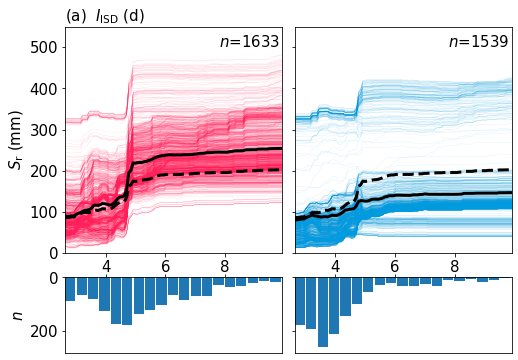

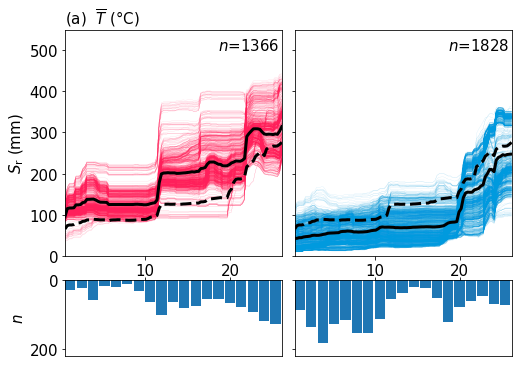

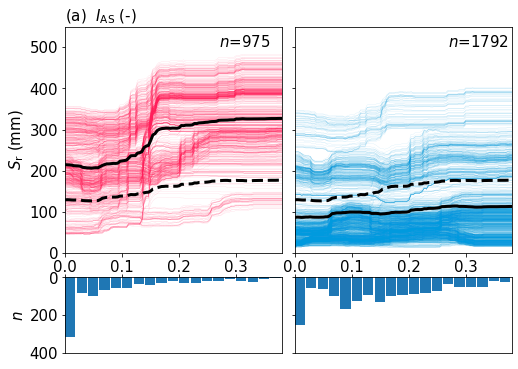

In [137]:
# make plots - ices
var = ['idu_mean','t_mean','asi']
var2 = ['$I_\mathrm{ISD}$','$\overline{T}$','$I_\mathrm{AS}$','$\overline{P}$']
abcd = ['(a)','(b)','(c)','(d)']
# fig, ax = plt.subplots(6,2, figsize=(10,21),gridspec_kw={'height_ratios': [3, 1, 3, 1,3,1]})
# plt.subplots_adjust(wspace=0.08,hspace=0.25)
# plot pdps
cmap_rdbu = cm.get_cmap('PuOr_r', 4)

for m in range(len(var)):
    if (var[m]=='t_mean'):
        gr1 = t1
        gr2 = t2
        ice = ice_t
        ylim = 220
    if (var[m]=='idu_mean'):
        gr1 = i1
        gr2 = i2
        ice = ice_idu
        ylim = 280
    if (var[m]=='asi'):
        gr1 = a1
        gr2 = a2
        ice = ice_asi
        ylim = 400
    mm = 0
    fig, ax = plt.subplots(2,2, figsize=(8,6),gridspec_kw={'height_ratios': [3, 1]})
    plt.subplots_adjust(wspace=0.06,hspace=0.16)
    if (len(gr1)>0):
        gr = gr1
        j = 0
        for i in gr:
            ax[mm,j].plot(ice.columns.values, ice.loc[i],color=c1,linestyle='-',linewidth=0.05)
        ax[mm,j].plot(ice.columns.values, ice.loc[gr].mean(),color='k',linestyle='-',linewidth=3)
        ax[mm,j].plot(ice.columns.values, ice.mean(),color='k',linestyle='--',linewidth=3)
        # ax[mm,j].set_title(f'{var2[m]} ({units[m]}), $n$={len(gr)}',size=14)
        ax[mm,j].set_title(f'(a)  {var2[m]} ({units[m]})',size=15, loc='left')
        ax[mm,0].set_ylabel('$S_\mathrm{r}$ (mm)',size=15)
        ax[mm,j].set_ylim(0,550)
        ax[mm,j].set_xlim(np.quantile(X[:,m],0.05),np.quantile(X[:,m],0.95))
        ax[mm,j].tick_params(axis='both', labelsize=15)  
        ax[mm,j].set_yticks([0,100,200,300,400,500])
        ax[mm,j].set_yticklabels(['','','','','',''])
        ax[mm,0].set_yticklabels(['0','100','200','300','400','500'])
        ax[mm,j].text(ice.columns.values[-30],500,f'$n$={len(gr)}',size=15)
        
        bins = np.linspace(np.quantile(X[:,m],0.05),np.quantile(X[:,m],0.95),20)
        ax[mm+1,j].hist(df.loc[gr,features[m]],bins=bins,width=0.9*(bins[1]-bins[0]))
        ax[mm+1,j].invert_yaxis()
        ax[mm+1,j].xaxis.tick_top()
        ax[mm+1,j].set_xlim(np.quantile(X[:,m],0.05),np.quantile(X[:,m],0.95))
        ax[mm+1,j].axes.get_xaxis().set_ticklabels([])
        ax[mm+1,j].set_ylabel('$n$',size=15)
        ax[mm+1,j].tick_params(axis='both', labelsize=15)
        ax[mm+1,j].set_ylim(ylim,0)
        # ax[mm+1,j].set_yticks([0,250,500,750])
        # ax[mm+1,j].set_yticklabels(['','','',''])
        # ax[mm+1,0].set_yticklabels(['0','','500',''])

    if (len(gr2)>0):
        gr = gr2
        j = 1
        for i in gr:
            ax[mm,j].plot(ice.columns.values, ice.loc[i],color=c2,linestyle='-',linewidth=0.05)
        ax[mm,j].plot(ice.columns.values, ice.loc[gr].mean(),color='k',linestyle='-',linewidth=3)
        ax[mm,j].plot(ice.columns.values, ice.mean(),color='k',linestyle='--',linewidth=3)
        # ax[mm,j].set_title(f'{var2[m]} ({units[m]}), $n$={len(gr)}',size=14)
        # ax[0,j].set_ylabel('Sr (mm)',size=13)
        ax[mm,j].set_ylim(0,550)
        ax[mm,j].set_xlim(np.quantile(X[:,m],0.05),np.quantile(X[:,m],0.95))
        ax[mm,j].tick_params(axis='both', labelsize=15)
        ax[mm,j].set_yticks([0,100,200,300,400,500])
        ax[mm,j].set_yticklabels(['','','','','',''])
        ax[mm,j].text(ice.columns.values[-30],500,f'$n$={len(gr)}',size=15)
        
        bins = np.linspace(np.quantile(X[:,m],0.05),np.quantile(X[:,m],0.95),20)
        ax[mm+1,j].hist(df.loc[gr,features[m]],bins=bins,width=0.9*(bins[1]-bins[0]))
        ax[mm+1,j].invert_yaxis()
        ax[mm+1,j].xaxis.tick_top()
        ax[mm+1,j].set_xlim(np.quantile(X[:,m],0.05),np.quantile(X[:,m],0.95))
        ax[mm+1,j].axes.get_xaxis().set_ticklabels([])
        # ax[1,j].set_ylabel('$n$',size=13)
        ax[mm+1,j].tick_params(axis='both', labelsize=15)
        ax[mm+1,j].set_ylim(ylim,0)
        ax[mm+1,j].set_yticklabels([])

        # ax[mm+1,j].set_yticks([0,250,500,750])
        # ax[mm+1,j].set_yticklabels(['','','',''])
    fig.savefig(f'{work_dir}/output/regression/figures/interpretation/ice_splitted_{var[m]}.jpg',bbox_inches='tight',dpi=300)

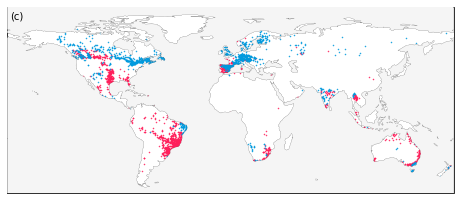

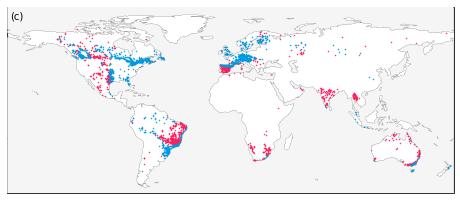

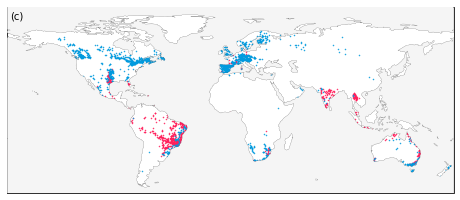

In [146]:
# make plots - maps

for m in range(len(var)):
    if (var[m]=='t_mean'):
        gr1 = t1
        gr2 = t2
        ice = ice_t
        ylim = 220
    if (var[m]=='idu_mean'):
        gr1 = i1
        gr2 = i2
        ice = ice_idu
        ylim = 280
    if (var[m]=='asi'):
        gr1 = a1
        gr2 = a2
        ice = ice_asi
        ylim = 400  
    
    fig2 = plt.figure(figsize=(8,6))
    # plt.subplots_adjust(hspace=-0.7)
    ax3 = fig2.add_subplot(111,projection=ccrs.PlateCarree())
    ax3.coastlines(linewidth=0.1)
    ax3.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
    ax3.set_global()
    ax3.set_xlim(-180,180)
    ax3.set_ylim(-60,90)
    ddf = df.loc[ice.index]
    ax3.plot(ddf.loc[gr1].lon, ddf.loc[gr1].lat,'o', markeredgecolor=c1, markerfacecolor=c1,markersize=0.5)
    ax3.plot(ddf.loc[gr2].lon, ddf.loc[gr2].lat,'o', markeredgecolor=c2, markerfacecolor=c2,markersize=0.5)
    ax3.text(-178,80, f'(c)',zorder=101,size=10)
    fig2.savefig(f'{work_dir}/output/regression/figures/interpretation/ice_splitted_maps_{var[m]}.jpg',bbox_inches='tight',dpi=300)

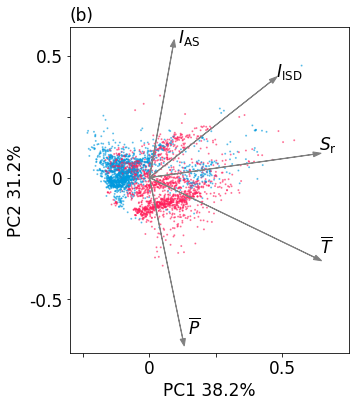

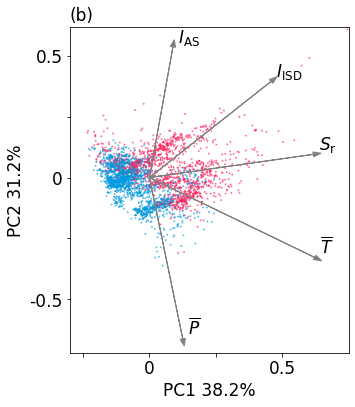

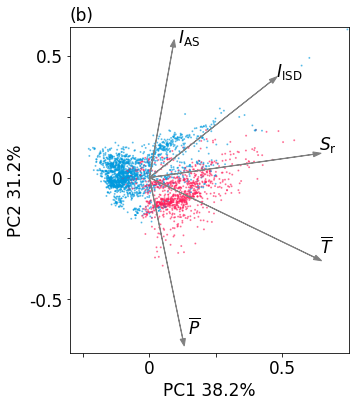

In [140]:
# make plot- pca
pcavar = ['$I_\mathrm{ISD}$','$\overline{T}$','$I_\mathrm{AS}$','$\overline{P}$','$S_\mathrm{r}$']
for m in range(len(var)):
    if (var[m]=='t_mean'):
        gr1 = t1
        gr2 = t2
        ice = ice_t
        ylim = 220
    if (var[m]=='idu_mean'):
        gr1 = i1
        gr2 = i2
        ice = ice_idu
        ylim = 280
    if (var[m]=='asi'):
        gr1 = a1
        gr2 = a2
        ice = ice_asi
        ylim = 400  
        
    cmap = ListedColormap([c1,c2])
    f = f'{work_dir}/output/catchment_characteristics/master_characteristics_gswp-p_gleam-ep_gswp-t.csv'
    dfp = pd.read_csv(f,index_col=0)
    features = ['idu_mean','t_mean','asi','p_mean'] 
    ff = features
    ff.append('sr_20')
    dfp = dfp[ff]
    dfp = dfp.loc[ice.index]
    dfp.loc[gr1,'gr'] = 0
    dfp.loc[gr2,'gr'] = 1

    xx = dfp[features]
    xx = StandardScaler().fit_transform(xx) #standardize all values
    xx = pd.DataFrame(xx,columns=ff)
    pca = PCA(n_components=len(ff))
    components = pca.fit_transform(xx)
    loadings = pca.components_ #eigenvector, length represents variance var explains

    # Create dataframe
    pca_df = pd.DataFrame(data=components[:,0:2],columns=['PC1', 'PC2'])
    pca_df_scaled = pca_df.copy()
    scaler_df = pca_df[['PC1', 'PC2']]
    scaler = 1 / (scaler_df.max() - scaler_df.min()) # WAAROM DIT?

    for index in scaler.index:
        pca_df_scaled[index] *= scaler[index]
    per_var  = np.round(pca.explained_variance_ratio_ * 100, decimals=1)

    xs = loadings[0]
    ys = loadings[1]
    ld_df = pd.DataFrame(index=ff, columns=['xs','ys'])
    ld_df['xs'] = loadings[0]
    ld_df['ys'] = loadings[1]
    ld_df['len'] = np.sqrt(loadings[0]**2+loadings[1]**2)

    fig=plt.figure(figsize=(5,6))
    ax = fig.add_subplot(111)
    ax.scatter(pca_df_scaled.PC1,pca_df_scaled.PC2,s=1,alpha=0.5,c=dfp.gr,cmap=cmap)
    for i, varnames in enumerate(ff):
        ax.arrow(
            0, 0, # coordinates of arrow base
            ld_df.loc[ff[i]]['xs'], # length of the arrow along x
            ld_df.loc[ff[i]]['ys'], # length of the arrow along y
            color='grey',
            head_width=0.02
            )
        ax.text(ld_df.loc[ff[i]]['xs']+0.02, ld_df.loc[ff[i]]['ys']+0.02, pcavar[i],size=17)
    ax.tick_params(axis='both', which='major', labelsize=17)
    ax.set_xlim(-0.3,0.75)
    ax.set_ylim(-0.72,0.62)
    ax.set_xlabel(f'PC1 {per_var[0]}%',size=17)
    ax.set_ylabel(f'PC2 {per_var[1]}%',size=17)
    ax.set_xticks([-0.25,0,0.25,0.5])
    ax.set_yticks([-0.5,-0.25,0,0.25,0.5])
    ax.set_yticklabels(['-0.5','','0','','0.5'])
    ax.set_xticklabels(['','0','','0.5'])
    ax.set_title('(b)',size=17,loc='left')
    fig.savefig(f'{work_dir}/output/regression/figures/interpretation/ice_splitted_pca_{var[m]}.jpg',bbox_inches='tight',dpi=300)

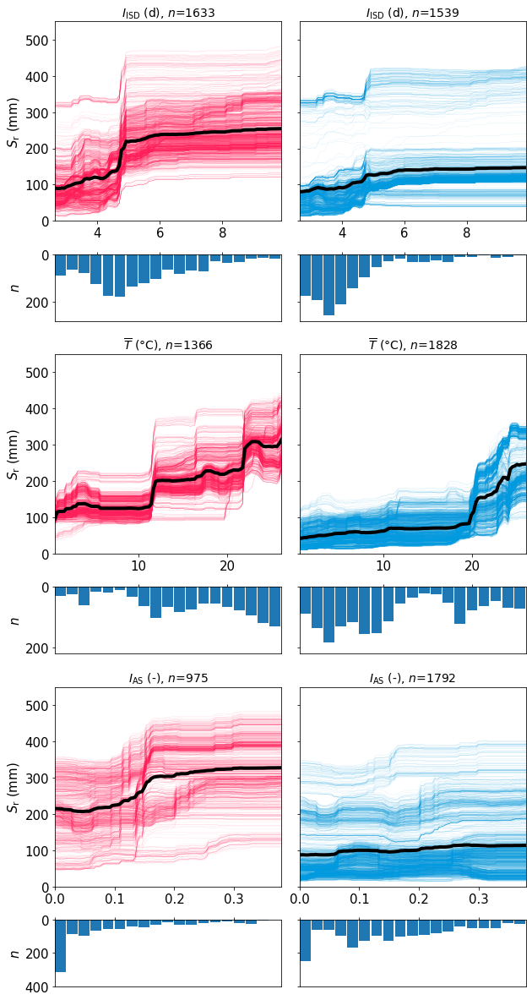

In [101]:
# make plots - ices
var = ['idu_mean','t_mean','asi']
var2 = ['$I_\mathrm{ISD}$','$\overline{T}$','$I_\mathrm{AS}$','$\overline{P}$']
abcd = ['(a)','(b)','(c)','(d)']
fig, ax = plt.subplots(6,2, figsize=(10,21),gridspec_kw={'height_ratios': [3, 1, 3, 1,3,1]})
plt.subplots_adjust(wspace=0.08,hspace=0.25)
# plot pdps
cmap_rdbu = cm.get_cmap('PuOr_r', 4)

for m in range(len(var)):
    if (var[m]=='t_mean'):
        gr1 = t1
        gr2 = t2
        ice = ice_t
        ylim = 220
    if (var[m]=='idu_mean'):
        gr1 = i1
        gr2 = i2
        ice = ice_idu
        ylim = 280
    if (var[m]=='asi'):
        gr1 = a1
        gr2 = a2
        ice = ice_asi
        ylim = 400
    mm = m*2
    if (len(gr1)>0):
        gr = gr1
        j = 0
        for i in gr:
            ax[mm,j].plot(ice.columns.values, ice.loc[i],color=c1,linestyle='-',linewidth=0.05)
        ax[mm,j].plot(ice.columns.values, ice.loc[gr].mean(),color='k',linestyle='-',linewidth=4)
        ax[mm,j].set_title(f'{var2[m]} ({units[m]}), $n$={len(gr)}',size=14)
        ax[mm,0].set_ylabel('$S_\mathrm{r}$ (mm)',size=15)
        ax[mm,j].set_ylim(0,550)
        ax[mm,j].set_xlim(np.quantile(X[:,m],0.05),np.quantile(X[:,m],0.95))
        ax[mm,j].tick_params(axis='both', labelsize=15)  
        ax[mm,j].set_yticks([0,100,200,300,400,500])
        ax[mm,j].set_yticklabels(['','','','','',''])
        ax[mm,0].set_yticklabels(['0','100','200','300','400','500'])
        
        bins = np.linspace(np.quantile(X[:,m],0.05),np.quantile(X[:,m],0.95),20)
        ax[mm+1,j].hist(df.loc[gr,features[m]],bins=bins,width=0.9*(bins[1]-bins[0]))
        ax[mm+1,j].invert_yaxis()
        ax[mm+1,j].xaxis.tick_top()
        ax[mm+1,j].set_xlim(np.quantile(X[:,m],0.05),np.quantile(X[:,m],0.95))
        ax[mm+1,j].axes.get_xaxis().set_ticklabels([])
        ax[mm+1,j].set_ylabel('$n$',size=15)
        ax[mm+1,j].tick_params(axis='both', labelsize=15)
        ax[mm+1,j].set_ylim(ylim,0)
        # ax[mm+1,j].set_yticks([0,250,500,750])
        # ax[mm+1,j].set_yticklabels(['','','',''])
        # ax[mm+1,0].set_yticklabels(['0','','500',''])

    if (len(gr2)>0):
        gr = gr2
        j = 1
        for i in gr:
            ax[mm,j].plot(ice.columns.values, ice.loc[i],color=c2,linestyle='-',linewidth=0.05)
        ax[mm,j].plot(ice.columns.values, ice.loc[gr].mean(),color='k',linestyle='-',linewidth=4)
        ax[mm,j].set_title(f'{var2[m]} ({units[m]}), $n$={len(gr)}',size=14)
        # ax[0,j].set_ylabel('Sr (mm)',size=13)
        ax[mm,j].set_ylim(0,550)
        ax[mm,j].set_xlim(np.quantile(X[:,m],0.05),np.quantile(X[:,m],0.95))
        ax[mm,j].tick_params(axis='both', labelsize=15)
        ax[mm,j].set_yticks([0,100,200,300,400,500])
        ax[mm,j].set_yticklabels(['','','','','',''])

        bins = np.linspace(np.quantile(X[:,m],0.05),np.quantile(X[:,m],0.95),20)
        ax[mm+1,j].hist(df.loc[gr,features[m]],bins=bins,width=0.9*(bins[1]-bins[0]))
        ax[mm+1,j].invert_yaxis()
        ax[mm+1,j].xaxis.tick_top()
        ax[mm+1,j].set_xlim(np.quantile(X[:,m],0.05),np.quantile(X[:,m],0.95))
        ax[mm+1,j].axes.get_xaxis().set_ticklabels([])
        # ax[1,j].set_ylabel('$n$',size=13)
        ax[mm+1,j].tick_params(axis='both', labelsize=15)
        ax[mm+1,j].set_ylim(ylim,0)
        ax[mm+1,j].set_yticklabels([])
        # ax[mm+1,j].set_yticks([0,250,500,750])
        # ax[mm+1,j].set_yticklabels(['','','',''])
fig.savefig(f'{work_dir}/output/regression/figures/interpretation/ice_splitted.jpg',bbox_inches='tight',dpi=300)

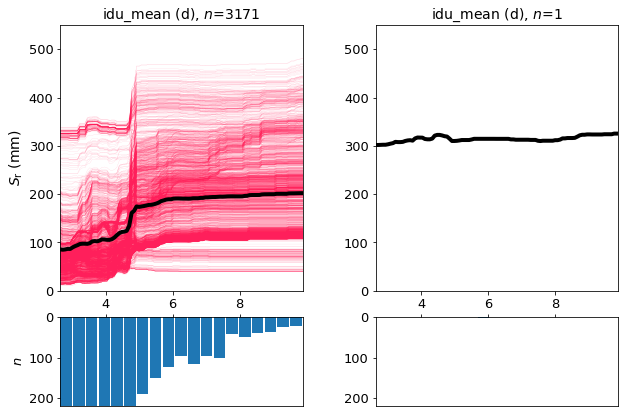

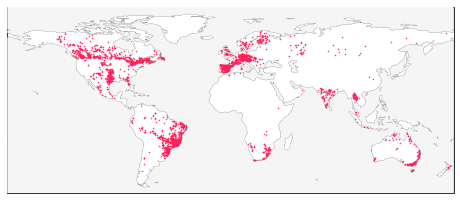

In [99]:
# idu_mean
f = f'{work_dir}/output/catchment_characteristics/master_characteristics_gswp-p_gleam-ep_gswp-t.csv'
df = pd.read_csv(f,index_col=0)

# t_mean
fig, ax = plt.subplots(2,2, figsize=(10,7),gridspec_kw={'height_ratios': [3, 1]})
plt.subplots_adjust(wspace=0.3,hspace=0.15)
k = 0 # 't_mean'
a = partial_dependence(rf, features=[k], X=X, percentiles=(0.05, 0.95),grid_resolution=100, kind='both')
pdp = pd.DataFrame(index=['average'],data = a['average'],columns=a['values'][0])
ice = pd.DataFrame(index=ddf.index, data = a['individual'][0],columns=a['values'][0])

# define groups
pos = []
neg = []
slp = (ice.iloc[:,-1] - ice.iloc[:,0])/(ice.columns[-1] - ice.columns[0])
for i in ice.index:
    if (slp.loc[i]>0):
        pos.append(i)
    if (slp.loc[i]<0):
        neg.append(i)

pm = slp.loc[pos].mean()
gr1 = slp[slp>pm].index
gr2 = slp[(slp<=pm) & (slp>0)].index
gr1=[]
gr2=[]
for i in pos:
    if (((ice.loc[i].iloc[50] - ice.loc[i].iloc[0])/(ice.columns[50] - ice.columns[0]) > 5)|((ice.loc[i].iloc[15] - ice.loc[i].iloc[0])/(ice.columns[15] - ice.columns[0]) > 10)): # (ice.loc[i].iloc[50] - ice.loc[i].iloc[0])/(ice.columns[50] - ice.columns[0])): # 
        gr1.append(i)
    else:
        gr2.append(i)

# plot pdps
cmap_rdbu = cm.get_cmap('PuOr_r', 4)
if (len(gr1)>0):
    gr = gr1
    j = 0
    for i in gr:
        ax[0,j].plot(ice.columns.values, ice.loc[i],color=c1,linestyle='-',linewidth=0.05)
    ax[0,j].plot(ice.columns.values, ice.loc[gr].mean(),color='k',linestyle='-',linewidth=4)
    ax[0,j].set_title(f'{var[k]} ({units[k]}), $n$={len(gr)}',size=14)
    ax[0,0].set_ylabel('$S_\mathrm{r}$ (mm)',size=14)
    ax[0,j].set_ylim(0,550)
    ax[0,j].set_xlim(np.quantile(X[:,k],0.05),np.quantile(X[:,k],0.95))
    ax[0,j].tick_params(axis='both', labelsize=13)
       
    bins = np.linspace(np.quantile(X[:,k],0.05),np.quantile(X[:,k],0.95),20)
    ax[1,j].hist(df.loc[gr,features[k]],bins=bins,width=0.9*(bins[1]-bins[0]))
    ax[1,j].invert_yaxis()
    ax[1,j].xaxis.tick_top()
    ax[1,j].set_xlim(np.quantile(X[:,k],0.05),np.quantile(X[:,k],0.95))
    ax[1,j].axes.get_xaxis().set_ticklabels([])
    ax[1,j].set_ylabel('$n$',size=13)
    ax[1,j].tick_params(axis='both', labelsize=13)
    ax[1,j].set_ylim(220,0)
    
if (len(gr2)>0):
    gr = gr2
    j = 1
    for i in gr:
        ax[0,j].plot(ice.columns.values, ice.loc[i],color=c2,linestyle='-',linewidth=0.05)
    ax[0,j].plot(ice.columns.values, ice.loc[gr].mean(),color='k',linestyle='-',linewidth=4)
    ax[0,j].set_title(f'{var[k]} ({units[k]}), $n$={len(gr)}',size=14)
    # ax[0,j].set_ylabel('Sr (mm)',size=13)
    ax[0,j].set_ylim(0,550)
    ax[0,j].set_xlim(np.quantile(X[:,k],0.05),np.quantile(X[:,k],0.95))
    ax[0,j].tick_params(axis='both', labelsize=13)
       
    bins = np.linspace(np.quantile(X[:,k],0.05),np.quantile(X[:,k],0.95),20)
    ax[1,j].hist(df.loc[gr,features[k]],bins=bins,width=0.9*(bins[1]-bins[0]))
    ax[1,j].invert_yaxis()
    ax[1,j].xaxis.tick_top()
    ax[1,j].set_xlim(np.quantile(X[:,k],0.05),np.quantile(X[:,k],0.95))
    ax[1,j].axes.get_xaxis().set_ticklabels([])
    # ax[1,j].set_ylabel('$n$',size=13)
    ax[1,j].tick_params(axis='both', labelsize=13)
    ax[1,j].set_ylim(220,0)
    
fig.savefig(f'{work_dir}/output/regression/figures/interpretation/pdp_train_{features[k]}_manualsplit.jpg',bbox_inches='tight',dpi=300)

# plot map
fig = plt.figure(figsize=(8,6))
ax = fig.add_subplot(111,projection=ccrs.PlateCarree())
ax.coastlines(linewidth=0.1)
ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
ax.set_global()
ax.set_xlim(-180,180)
ax.set_ylim(-60,90)
ddf = df.loc[ice.index]
ax.plot(ddf.loc[gr1].lon, ddf.loc[gr1].lat,'o', markeredgecolor=c1, markerfacecolor=c1,markersize=0.5)
ax.plot(ddf.loc[gr2].lon, ddf.loc[gr2].lat,'o', markeredgecolor=c2, markerfacecolor=c2,markersize=0.5)
# ax.set_title(f'{features[k]}')

fig.savefig(f'{work_dir}/output/regression/figures/interpretation/pdp_train_{features[k]}_manualsplit_map.jpg',bbox_inches='tight',dpi=300)


In [100]:
ice.iloc[:,0:15]

,2.640000,2.713491,2.786982,2.860473,2.933964,3.007455,3.080945,3.154436,3.227927,3.301418,3.374909,3.448400,3.521891,3.595382,3.668873
ca_0002351,32.214042,32.268168,33.236002,34.001261,34.001261,37.096614,41.580751,44.059743,45.954435,43.339603,43.200117,42.223433,41.757086,42.107907,41.364231
cz_0000019,60.928721,61.174198,62.322303,65.703735,65.703735,69.734697,74.035660,73.445326,74.460946,71.537255,70.609958,58.829026,48.819132,49.028412,48.021068
br_0000469,191.734161,187.952850,187.952850,186.960865,184.464284,186.037403,186.037403,186.037403,200.058887,212.305254,212.305254,222.669026,237.452309,253.184195,253.514010
bw_0000006,84.275411,81.438437,82.317888,81.863148,81.545459,84.630042,87.491858,87.319698,89.115096,93.842725,93.320642,91.239438,100.602103,112.929678,114.427733
br_0003016,36.166900,36.060415,35.999382,38.854564,41.666665,52.325149,56.345811,57.620258,55.909136,54.225999,55.170685,54.529369,54.451638,57.424280,56.616241
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
in_0000255,323.309095,323.309095,323.309095,323.309095,322.001528,322.001528,322.001528,322.001528,329.399488,329.399488,329.399488,340.452245,342.341713,343.885089,344.214904
es_0000031,42.888206,42.265509,42.078620,41.991654,41.442463,38.450687,34.945669,34.498865,35.715512,34.574341,34.714914,36.102366,36.345474,38.402065,37.451122
us_0006039,53.915474,55.174768,55.532513,57.190046,58.311323,60.763220,59.880352,60.202851,59.309469,57.618787,59.059250,58.085669,58.841864,59.641264,58.945250
in_0000089,319.053085,319.053085,319.053085,319.053085,319.053085,319.053085,319.053085,319.053085,326.451045,326.451045,326.451045,335.986686,337.178160,337.178160,337.507975


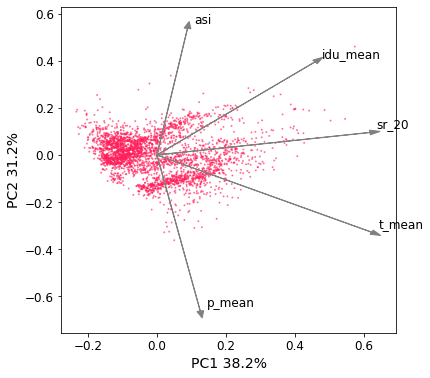

In [101]:
cmap = ListedColormap([c1,c2])

features = ['t_mean','p_mean','idu_mean','asi']
f = f'{work_dir}/output/catchment_characteristics/master_characteristics_gswp-p_gleam-ep_gswp-t.csv'
df = pd.read_csv(f,index_col=0)
ff = features
ff.append('sr_20')
df = df[ff]
df = df.loc[ice.index]
df.loc[gr1,'gr'] = 0
df.loc[gr2,'gr'] = 1
# df.loc[gr3,'gr'] = 2
# df.loc[gr4,'gr'] = 3

xx = df[features]
xx = StandardScaler().fit_transform(xx) #standardize all values
xx = pd.DataFrame(xx,columns=ff)
pca = PCA(n_components=len(ff))
components = pca.fit_transform(xx)
loadings = pca.components_ #eigenvector, length represents variance var explains
 
# Create dataframe
pca_df = pd.DataFrame(data=components[:,0:2],columns=['PC1', 'PC2'])
pca_df_scaled = pca_df.copy()
scaler_df = pca_df[['PC1', 'PC2']]
scaler = 1 / (scaler_df.max() - scaler_df.min()) # WAAROM DIT?
 
for index in scaler.index:
    pca_df_scaled[index] *= scaler[index]
per_var  = np.round(pca.explained_variance_ratio_ * 100, decimals=1)

xs = loadings[0]
ys = loadings[1]
ld_df = pd.DataFrame(index=ff, columns=['xs','ys'])
ld_df['xs'] = loadings[0]
ld_df['ys'] = loadings[1]
ld_df['len'] = np.sqrt(loadings[0]**2+loadings[1]**2)

fig=plt.figure(figsize=(6,6))
ax = fig.add_subplot(111)
ax.scatter(pca_df_scaled.PC1,pca_df_scaled.PC2,s=1,alpha=0.5,c=df.gr,cmap=cmap)
for i, varnames in enumerate(ff):
    ax.arrow(
        0, 0, # coordinates of arrow base
        ld_df.loc[ff[i]]['xs'], # length of the arrow along x
        ld_df.loc[ff[i]]['ys'], # length of the arrow along y
        color='grey',
        head_width=0.02
        )
    ax.text(ld_df.loc[ff[i]]['xs']+0.02, ld_df.loc[ff[i]]['ys']+0.02, varnames,size=12)
ax.tick_params(axis='both', which='major', labelsize=12)
ax.set_xlabel(f'PC1 {per_var[0]}%',size=14)
ax.set_ylabel(f'PC2 {per_var[1]}%',size=14)
fig.savefig(f'{work_dir}/output/regression/figures/interpretation/pca_t_mean_splitted.jpg',bbox_inches='tight',dpi=300)


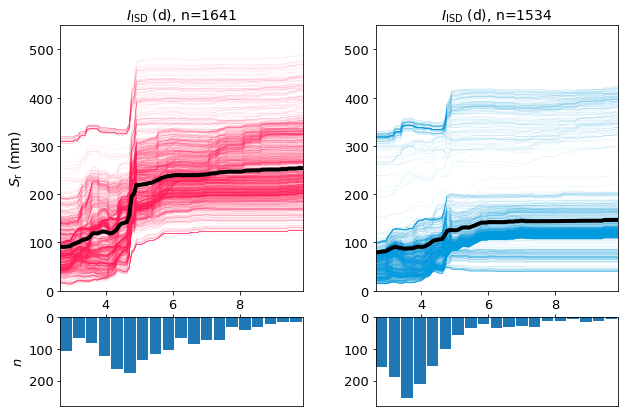

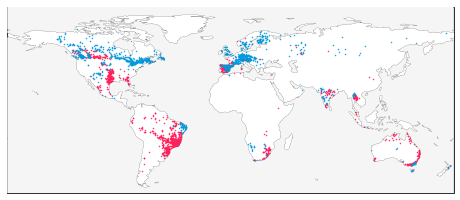

In [97]:
# idu_mean
f = f'{work_dir}/output/catchment_characteristics/master_characteristics_gswp-p_gleam-ep_gswp-t.csv'
df = pd.read_csv(f,index_col=0)

fig, ax = plt.subplots(2,2, figsize=(10,7),gridspec_kw={'height_ratios': [3, 1]})
plt.subplots_adjust(wspace=0.3,hspace=0.15)
k = 2 # 'idu_mean'
a = partial_dependence(rf, features=[k], X=X, percentiles=(0.05, 0.95),grid_resolution=100, kind='both')
pdp = pd.DataFrame(index=['average'],data = a['average'],columns=a['values'][0])
ice = pd.DataFrame(index=ddf.index, data = a['individual'][0],columns=a['values'][0])

# define groups
pos = []
neg = []
slp = (ice.iloc[:,-1] - ice.iloc[:,0])/(ice.columns[-1] - ice.columns[0])
for i in ice.index:
    if (slp.loc[i]>0):
        pos.append(i)
    if (slp.loc[i]<0):
        neg.append(i)

pm = slp.loc[pos].mean()
gr1 = slp[slp>0.9*pm].index
gr2 = slp[(slp<=0.9*pm) & (slp>0)].index
# gr1=[]
# gr2=[]
# for i in pos:
#     if ((ice.loc[i].iloc[50] - ice.loc[i].iloc[0])/(ice.columns[50] - ice.columns[0]) > 4): # (ice.loc[i].iloc[50] - ice.loc[i].iloc[0])/(ice.columns[50] - ice.columns[0])): # 
#         gr1.append(i)
#     else:
#         gr2.append(i)

# plot pdps
cmap_rdbu = cm.get_cmap('coolwarm_r', 4)
if (len(gr1)>0):
    gr = gr1
    j = 0
    for i in gr:
        ax[0,j].plot(ice.columns.values, ice.loc[i],color=c1,linestyle='-',linewidth=0.05)
    ax[0,j].plot(ice.columns.values, ice.loc[gr].mean(),color='k',linestyle='-',linewidth=4)
    ax[0,j].set_title(f'{var[k]} ({units[k]}), n={len(gr)}',size=14)
    ax[0,j].set_ylabel('$S_\mathrm{r}$ (mm)',size=14)
    ax[0,j].set_ylim(0,550)
    ax[0,j].set_xlim(np.quantile(X[:,k],0.05),np.quantile(X[:,k],0.95))
    ax[0,j].tick_params(axis='both', labelsize=13)
       
    bins = np.linspace(np.quantile(X[:,k],0.05),np.quantile(X[:,k],0.95),20)
    ax[1,j].hist(df.loc[gr,features[k]],bins=bins,width=0.9*(bins[1]-bins[0]))
    ax[1,j].invert_yaxis()
    ax[1,j].xaxis.tick_top()
    ax[1,j].set_xlim(np.quantile(X[:,k],0.05),np.quantile(X[:,k],0.95))
    ax[1,j].axes.get_xaxis().set_ticklabels([])
    ax[1,j].set_ylabel('$n$',size=13)
    ax[1,j].tick_params(axis='both', labelsize=13)
    ax[1,j].set_ylim(280,0)
    
if (len(gr2)>0):
    gr = gr2
    j = 1
    for i in gr:
        ax[0,j].plot(ice.columns.values, ice.loc[i],color=c2,linestyle='-',linewidth=0.05)
    ax[0,j].plot(ice.columns.values, ice.loc[gr].mean(),color='k',linestyle='-',linewidth=4)
    ax[0,j].set_title(f'{var[k]} ({units[k]}), n={len(gr)}',size=14)
    # ax[0,j].set_ylabel('Sr (mm)',size=13)
    ax[0,j].set_ylim(0,550)
    ax[0,j].set_xlim(np.quantile(X[:,k],0.05),np.quantile(X[:,k],0.95))
    ax[0,j].tick_params(axis='both', labelsize=13)
       
    bins = np.linspace(np.quantile(X[:,k],0.05),np.quantile(X[:,k],0.95),20)
    ax[1,j].hist(df.loc[gr,features[k]],bins=bins,width=0.9*(bins[1]-bins[0]))
    ax[1,j].invert_yaxis()
    ax[1,j].xaxis.tick_top()
    ax[1,j].set_xlim(np.quantile(X[:,k],0.05),np.quantile(X[:,k],0.95))
    ax[1,j].axes.get_xaxis().set_ticklabels([])
    # ax[1,j].set_ylabel('n',size=13)
    ax[1,j].tick_params(axis='both', labelsize=13)
    ax[1,j].set_ylim(280,0)
    
fig.savefig(f'{work_dir}/output/regression/figures/interpretation/pdp_train_{features[k]}_manualsplit.jpg',bbox_inches='tight',dpi=300)

# plot map
fig = plt.figure(figsize=(8,6))
ax = fig.add_subplot(111,projection=ccrs.PlateCarree())
ax.coastlines(linewidth=0.1)
ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
ax.set_global()
ax.set_xlim(-180,180)
ax.set_ylim(-60,90)
ddf = df.loc[ice.index]
ax.plot(ddf.loc[gr1].lon, ddf.loc[gr1].lat,'o', markeredgecolor=c1, markerfacecolor=c1,markersize=0.5)
ax.plot(ddf.loc[gr2].lon, ddf.loc[gr2].lat,'o', markeredgecolor=c2, markerfacecolor=c2,markersize=0.5)
# ax.set_title(f'{features[k]}')

fig.savefig(f'{work_dir}/output/regression/figures/interpretation/pdp_train_{features[k]}_manualsplit_map.jpg',bbox_inches='tight',dpi=300)

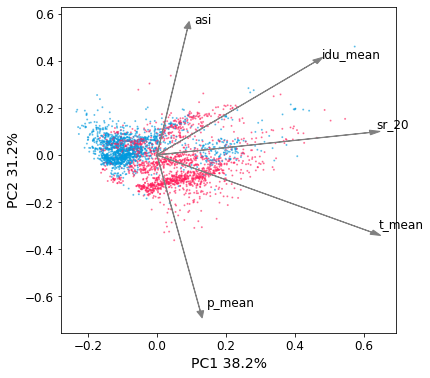

In [81]:
cmap = ListedColormap([c1,c2])

features = ['t_mean','p_mean','idu_mean','asi']
f = f'{work_dir}/output/catchment_characteristics/master_characteristics_gswp-p_gleam-ep_gswp-t.csv'
df = pd.read_csv(f,index_col=0)
ff = features
ff.append('sr_20')
df = df[ff]
df = df.loc[ice.index]
df.loc[gr1,'gr'] = 0
df.loc[gr2,'gr'] = 1
# df.loc[gr3,'gr'] = 2
# df.loc[gr4,'gr'] = 3

xx = df[features]
xx = StandardScaler().fit_transform(xx) #standardize all values
xx = pd.DataFrame(xx,columns=ff)
pca = PCA(n_components=len(ff))
components = pca.fit_transform(xx)
loadings = pca.components_ #eigenvector, length represents variance var explains
 
# Create dataframe
pca_df = pd.DataFrame(data=components[:,0:2],columns=['PC1', 'PC2'])
pca_df_scaled = pca_df.copy()
scaler_df = pca_df[['PC1', 'PC2']]
scaler = 1 / (scaler_df.max() - scaler_df.min()) # WAAROM DIT?
 
for index in scaler.index:
    pca_df_scaled[index] *= scaler[index]
per_var  = np.round(pca.explained_variance_ratio_ * 100, decimals=1)

xs = loadings[0]
ys = loadings[1]
ld_df = pd.DataFrame(index=ff, columns=['xs','ys'])
ld_df['xs'] = loadings[0]
ld_df['ys'] = loadings[1]
ld_df['len'] = np.sqrt(loadings[0]**2+loadings[1]**2)

fig=plt.figure(figsize=(6,6))
ax = fig.add_subplot(111)
ax.scatter(pca_df_scaled.PC1,pca_df_scaled.PC2,s=1,alpha=0.5,c=df.gr,cmap=cmap)
for i, varnames in enumerate(ff):
    ax.arrow(
        0, 0, # coordinates of arrow base
        ld_df.loc[ff[i]]['xs'], # length of the arrow along x
        ld_df.loc[ff[i]]['ys'], # length of the arrow along y
        color='grey',
        head_width=0.02
        )
    ax.text(ld_df.loc[ff[i]]['xs']+0.02, ld_df.loc[ff[i]]['ys']+0.02, varnames,size=12)
ax.tick_params(axis='both', which='major', labelsize=12)
ax.set_xlabel(f'PC1 {per_var[0]}%',size=14)
ax.set_ylabel(f'PC2 {per_var[1]}%',size=14)
fig.savefig(f'{work_dir}/output/regression/figures/interpretation/pca_idu_mean_splitted.jpg',bbox_inches='tight',dpi=300)

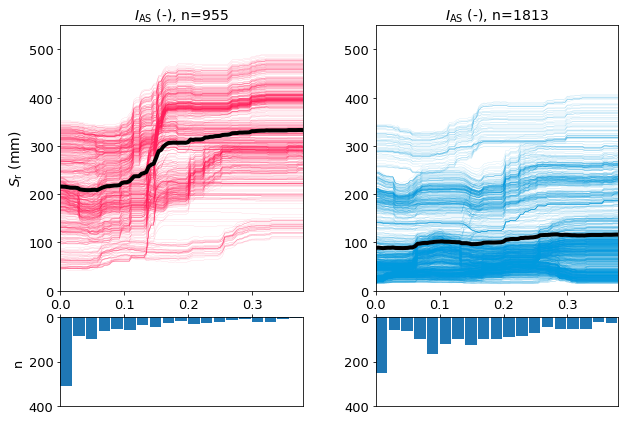

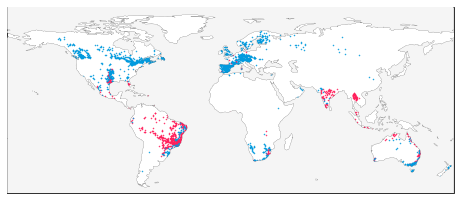

In [100]:
# asi
f = f'{work_dir}/output/catchment_characteristics/master_characteristics_gswp-p_gleam-ep_gswp-t.csv'
df = pd.read_csv(f,index_col=0)

fig, ax = plt.subplots(2,2, figsize=(10,7),gridspec_kw={'height_ratios': [3, 1]})
plt.subplots_adjust(wspace=0.3,hspace=0.15)
k = 3 # asi
a = partial_dependence(rf, features=[k], X=X, percentiles=(0.05, 0.95),grid_resolution=100, kind='both')
pdp = pd.DataFrame(index=['average'],data = a['average'],columns=a['values'][0])
ice = pd.DataFrame(index=ddf.index, data = a['individual'][0],columns=a['values'][0])

# define groups
pos = []
neg = []
slp = (ice.iloc[:,-1] - ice.iloc[:,0])/(ice.columns[-1] - ice.columns[0])
for i in ice.index:
    if (slp.loc[i]>0):
        pos.append(i)
    if (slp.loc[i]<0):
        neg.append(i)

pm = slp.loc[pos].mean()
gr1 = slp[slp>1.1*pm].index
gr2 = slp[(slp<=1.1*pm) & (slp>0)].index

# plot pdps
cmap_rdbu = cm.get_cmap('coolwarm_r', 4)
if (len(gr1)>0):
    gr = gr1
    j = 0
    for i in gr:
        ax[0,j].plot(ice.columns.values, ice.loc[i],color=c1,linestyle='-',linewidth=0.07)
    ax[0,j].plot(ice.columns.values, ice.loc[gr].mean(),color='k',linestyle='-',linewidth=4)
    ax[0,j].set_title(f'{var[k]} ({units[k]}), n={len(gr)}',size=14)
    ax[0,j].set_ylabel('$S_\mathrm{r}$ (mm)',size=14)
    ax[0,j].set_ylim(0,550)
    ax[0,j].set_xlim(np.quantile(X[:,k],0.05),np.quantile(X[:,k],0.95))
    ax[0,j].tick_params(axis='both', labelsize=13)
       
    bins = np.linspace(np.quantile(X[:,k],0.05),np.quantile(X[:,k],0.95),20)
    ax[1,j].hist(df.loc[gr,features[k]],bins=bins,width=0.9*(bins[1]-bins[0]))
    ax[1,j].invert_yaxis()
    ax[1,j].xaxis.tick_top()
    ax[1,j].set_xlim(np.quantile(X[:,k],0.05),np.quantile(X[:,k],0.95))
    ax[1,j].axes.get_xaxis().set_ticklabels([])
    ax[1,j].set_ylabel('n',size=13)
    ax[1,j].tick_params(axis='both', labelsize=13)
    ax[1,j].set_ylim(400,0)
    
if (len(gr2)>0):
    gr = gr2
    j = 1
    for i in gr:
        ax[0,j].plot(ice.columns.values, ice.loc[i],color=c2,linestyle='-',linewidth=0.07)
    ax[0,j].plot(ice.columns.values, ice.loc[gr].mean(),color='k',linestyle='-',linewidth=4)
    ax[0,j].set_title(f'{var[k]} ({units[k]}), n={len(gr)}',size=14)
    # ax[0,j].set_ylabel('Sr (mm)',size=13)
    ax[0,j].set_ylim(0,550)
    ax[0,j].set_xlim(np.quantile(X[:,k],0.05),np.quantile(X[:,k],0.95))
    ax[0,j].tick_params(axis='both', labelsize=13)
       
    bins = np.linspace(np.quantile(X[:,k],0.05),np.quantile(X[:,k],0.95),20)
    ax[1,j].hist(df.loc[gr,features[k]],bins=bins,width=0.9*(bins[1]-bins[0]))
    ax[1,j].invert_yaxis()
    ax[1,j].xaxis.tick_top()
    ax[1,j].set_xlim(np.quantile(X[:,k],0.05),np.quantile(X[:,k],0.95))
    ax[1,j].axes.get_xaxis().set_ticklabels([])
    # ax[1,j].set_ylabel('n',size=13)
    ax[1,j].tick_params(axis='both', labelsize=13)
    ax[1,j].set_ylim(400,0)
    
fig.savefig(f'{work_dir}/output/regression/figures/interpretation/pdp_train_{features[k]}_manualsplit.jpg',bbox_inches='tight',dpi=300)

# plot map
fig = plt.figure(figsize=(8,6))
ax = fig.add_subplot(111,projection=ccrs.PlateCarree())
ax.coastlines(linewidth=0.1)
ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
ax.set_global()
ax.set_xlim(-180,180)
ax.set_ylim(-60,90)
ddf = df.loc[ice.index]
ax.plot(ddf.loc[gr1].lon, ddf.loc[gr1].lat,'o', markeredgecolor=c1, markerfacecolor=c1,markersize=0.5)
ax.plot(ddf.loc[gr2].lon, ddf.loc[gr2].lat,'o', markeredgecolor=c2, markerfacecolor=c2,markersize=0.5)
# ax.set_title(f'{features[k]}')

fig.savefig(f'{work_dir}/output/regression/figures/interpretation/pdp_train_{features[k]}_manualsplit_map.jpg',bbox_inches='tight',dpi=300)

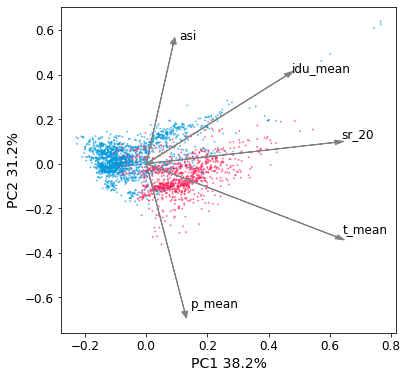

In [83]:
cmap = ListedColormap([c1,c2])

features = ['t_mean','p_mean','idu_mean','asi']
f = f'{work_dir}/output/catchment_characteristics/master_characteristics_gswp-p_gleam-ep_gswp-t.csv'
df = pd.read_csv(f,index_col=0)
ff = features
ff.append('sr_20')
df = df[ff]
df = df.loc[ice.index]
df.loc[gr1,'gr'] = 0
df.loc[gr2,'gr'] = 1
# df.loc[gr3,'gr'] = 2
# df.loc[gr4,'gr'] = 3

xx = df[features]
xx = StandardScaler().fit_transform(xx) #standardize all values
xx = pd.DataFrame(xx,columns=ff)
pca = PCA(n_components=len(ff))
components = pca.fit_transform(xx)
loadings = pca.components_ #eigenvector, length represents variance var explains
 
# Create dataframe
pca_df = pd.DataFrame(data=components[:,0:2],columns=['PC1', 'PC2'])
pca_df_scaled = pca_df.copy()
scaler_df = pca_df[['PC1', 'PC2']]
scaler = 1 / (scaler_df.max() - scaler_df.min()) # WAAROM DIT?
 
for index in scaler.index:
    pca_df_scaled[index] *= scaler[index]
per_var  = np.round(pca.explained_variance_ratio_ * 100, decimals=1)

xs = loadings[0]
ys = loadings[1]
ld_df = pd.DataFrame(index=ff, columns=['xs','ys'])
ld_df['xs'] = loadings[0]
ld_df['ys'] = loadings[1]
ld_df['len'] = np.sqrt(loadings[0]**2+loadings[1]**2)

fig=plt.figure(figsize=(6,6))
ax = fig.add_subplot(111)
ax.scatter(pca_df_scaled.PC1,pca_df_scaled.PC2,s=1,alpha=0.5,c=df.gr,cmap=cmap)
for i, varnames in enumerate(ff):
    ax.arrow(
        0, 0, # coordinates of arrow base
        ld_df.loc[ff[i]]['xs'], # length of the arrow along x
        ld_df.loc[ff[i]]['ys'], # length of the arrow along y
        color='grey',
        head_width=0.02
        )
    ax.text(ld_df.loc[ff[i]]['xs']+0.02, ld_df.loc[ff[i]]['ys']+0.02, varnames,size=12)
ax.tick_params(axis='both', which='major', labelsize=12)
ax.set_xlabel(f'PC1 {per_var[0]}%',size=14)
ax.set_ylabel(f'PC2 {per_var[1]}%',size=14)
fig.savefig(f'{work_dir}/output/regression/figures/interpretation/pca_asi_mean_splitted.jpg',bbox_inches='tight',dpi=300)

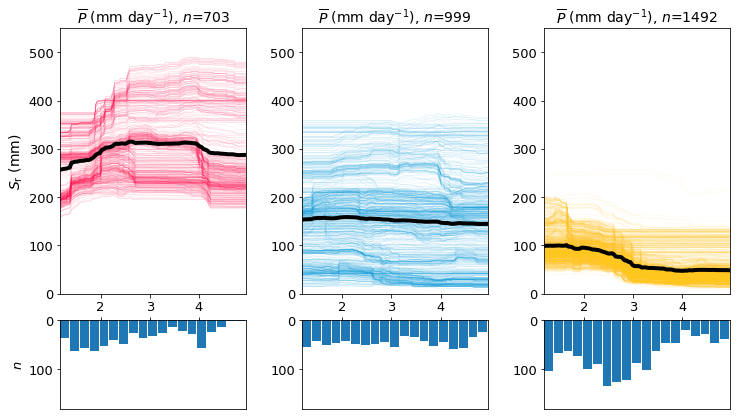

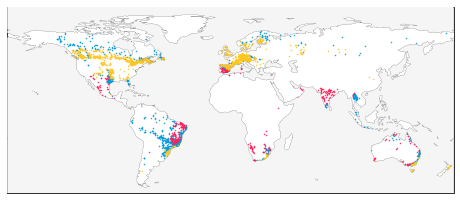

In [77]:
# p_mean
f = f'{work_dir}/output/catchment_characteristics/master_characteristics_gswp-p_gleam-ep_gswp-t.csv'
df = pd.read_csv(f,index_col=0)

fig, ax = plt.subplots(2,3, figsize=(12,7),gridspec_kw={'height_ratios': [3, 1]})
plt.subplots_adjust(wspace=0.3,hspace=0.15)
k = 1 # 'p_mean'
a = partial_dependence(rf, features=[k], X=X, percentiles=(0.05, 0.95),grid_resolution=100, kind='both')
pdp = pd.DataFrame(index=['average'],data = a['average'],columns=a['values'][0])
ice = pd.DataFrame(index=ddf.index, data = a['individual'][0],columns=a['values'][0])

# define groups
pos = []
neg = []
slp = (ice.iloc[:,-1] - ice.iloc[:,0])/(ice.columns[-1] - ice.columns[0])
for i in ice.index:
    if (slp.loc[i]>0):
        pos.append(i)
    if (slp.loc[i]<0):
        neg.append(i)

pm = slp.loc[pos].mean()
nm = slp.loc[neg].mean()
gr1 = slp[slp>pm].index
gr2 = slp[slp<pm].index

p = ice.index
gr1 = []
gr2 = []
gr3 = []
grr = []
for i in p:
    if (((ice.loc[i].iloc[50] - ice.loc[i].iloc[0])/(ice.columns[50] - ice.columns[0]) > 14)):
        gr1.append(i)
    else:
        if (((ice.loc[i].iloc[99] - ice.loc[i].iloc[0])/(ice.columns[99] - ice.columns[0]) < -8)):
            grr.append(i)
        else:
            gr2.append(i)
gr4 = []
for i in grr:
    if (((ice.loc[i].iloc[35] - ice.loc[i].iloc[0])/(ice.columns[35] - ice.columns[0]) > 5)):
        gr4.append(i)
    else:
        gr3.append(i)
gr2 = np.concatenate([gr2,gr4])
# gr2 = slp[(slp<=pm) & (slp>0)].index
# gr3 = slp[(slp>=nm) & (slp<0)].index
# gr4 = slp[slp<nm].index

# gr1 = []
# for i in p:
#     if (((ice.loc[i].iloc[50] - ice.loc[i].iloc[0])/(ice.columns[50] - ice.columns[0]) > 6)):
#         gr1.append(i)
    # else:
    #     gr3.append(i)

# p = np.concatenate([gr2,gr3])
# gr2=[]
# gr3=[]
# for i in p:
#     # if (((ice.loc[i].iloc[40] - ice.loc[i].iloc[0])/(ice.columns[40] - ice.columns[0]) > 0) & ((ice.loc[i].iloc[99] - ice.loc[i].iloc[70])/(ice.columns[99] - ice.columns[70]) < 0)): # (ice.loc[i].iloc[50] - ice.loc[i].iloc[0])/(ice.columns[50] - ice.columns[0]))
#     # if (((ice.loc[i].iloc[23] - ice.loc[i].iloc[0])/(ice.columns[23] - ice.columns[0]) > 20)): # (ice.loc[i].iloc[50] - ice.loc[i].iloc[0])/(ice.columns[50] - ice.columns[0]))
#     if (((ice.loc[i].iloc[23] - ice.loc[i].iloc[0])/(ice.columns[23] - ice.columns[0]) > 0) & ((ice.loc[i].iloc[99] - ice.loc[i].iloc[79])/(ice.columns[99] - ice.columns[79]) < 0)):
#         gr2.append(i)
#     else:
#         gr3.append(i)
# # gr1=[]
# # gr2=[]
# # for i in pos:
# #     if ((ice.loc[i].iloc[50] - ice.loc[i].iloc[0])/(ice.columns[50] - ice.columns[0]) > 4): # (ice.loc[i].iloc[50] - ice.loc[i].iloc[0])/(ice.columns[50] - ice.columns[0])): # 
# #         gr1.append(i)
# #     else:
# #         gr2.append(i)

# # gr3 = np.concatenate([gr3,gr4])
# gr3 = gr4

# plot pdps
cmap_rdbu = cm.get_cmap('coolwarm_r', 4)
if (len(gr1)>0):
    gr = gr1
    j = 0
    for i in gr:
        ax[0,j].plot(ice.columns.values, ice.loc[i],color=c1,linestyle='-',linewidth=0.05)
    ax[0,j].plot(ice.columns.values, ice.loc[gr].mean(),color='k',linestyle='-',linewidth=4)
    ax[0,j].set_title(f'{var[k]} ({units[k]}), $n$={len(gr)}',size=14)
    ax[0,0].set_ylabel('$S_\mathrm{r}$ (mm)',size=14)
    ax[0,j].set_ylim(0,550)
    ax[0,j].set_xlim(np.quantile(X[:,k],0.05),np.quantile(X[:,k],0.95))
    ax[0,j].tick_params(axis='both', labelsize=13)
       
    # bins = np.linspace(np.quantile(df.loc[gr,features[k]],0.05),np.quantile(df.loc[gr,features[k]],0.95),20)
    bins = np.linspace(np.quantile(X[:,k],0.05),np.quantile(X[:,k],0.95),20)
    ax[1,j].hist(df.loc[gr,features[k]],bins=bins,width=0.9*(bins[1]-bins[0]))
    ax[1,j].invert_yaxis()
    ax[1,j].xaxis.tick_top()
    ax[1,j].set_xlim(np.quantile(X[:,k],0.05),np.quantile(X[:,k],0.95))
    ax[1,j].axes.get_xaxis().set_ticklabels([])
    ax[1,j].set_ylabel('$n$',size=13)
    ax[1,j].tick_params(axis='both', labelsize=13)
    ax[1,j].set_ylim(180,0)
if (len(gr2)>0):
    gr = gr2
    j = 1
    for i in gr:
        ax[0,j].plot(ice.columns.values, ice.loc[i],color=c2,linestyle='-',linewidth=0.05)
    ax[0,j].plot(ice.columns.values, ice.loc[gr].mean(),color='k',linestyle='-',linewidth=4)
    ax[0,j].set_title(f'{var[k]} ({units[k]}), $n$={len(gr)}',size=14)
    # ax[0,j].set_ylabel('Sr (mm)',size=13)
    ax[0,j].set_ylim(0,550)
    ax[0,j].set_xlim(np.quantile(X[:,k],0.05),np.quantile(X[:,k],0.95))
    ax[0,j].tick_params(axis='both', labelsize=13)
       
    bins = np.linspace(np.quantile(X[:,k],0.05),np.quantile(X[:,k],0.95),20)
    ax[1,j].hist(df.loc[gr,features[k]],bins=bins,width=0.9*(bins[1]-bins[0]))
    ax[1,j].invert_yaxis()
    ax[1,j].xaxis.tick_top()
    ax[1,j].set_xlim(np.quantile(X[:,k],0.05),np.quantile(X[:,k],0.95))
    ax[1,j].axes.get_xaxis().set_ticklabels([])
    # ax[1,j].set_ylabel('n',size=13)
    ax[1,j].tick_params(axis='both', labelsize=13)
    ax[1,j].set_ylim(180,0)
if (len(gr3)>0):
    gr = gr3
    j = 2
    for i in gr:
        ax[0,j].plot(ice.columns.values, ice.loc[i],color=c4,linestyle='-',linewidth=0.05)
    ax[0,j].plot(ice.columns.values, ice.loc[gr].mean(),color='k',linestyle='-',linewidth=4)
    ax[0,j].set_title(f'{var[k]} ({units[k]}), $n$={len(gr)}',size=14)
    # ax[0,j].set_ylabel('Sr (mm)',size=13)
    ax[0,j].set_ylim(0,550)
    ax[0,j].set_xlim(np.quantile(X[:,k],0.05),np.quantile(X[:,k],0.95))
    ax[0,j].tick_params(axis='both', labelsize=13)
       
    bins = np.linspace(np.quantile(X[:,k],0.05),np.quantile(X[:,k],0.95),20)
    ax[1,j].hist(df.loc[gr,features[k]],bins=bins,width=0.9*(bins[1]-bins[0]))
    ax[1,j].invert_yaxis()
    ax[1,j].xaxis.tick_top()
    ax[1,j].set_xlim(np.quantile(X[:,k],0.05),np.quantile(X[:,k],0.95))
    ax[1,j].axes.get_xaxis().set_ticklabels([])
    # ax[1,j].set_ylabel('n',size=13)
    ax[1,j].tick_params(axis='both', labelsize=13)
    ax[1,j].set_ylim(180,0)
# if (len(gr4)>0):
#     gr = gr4
#     j = 3
#     for i in gr:
#         ax[0,j].plot(ice.columns.values, ice.loc[i],color=c4,linestyle='-',linewidth=0.05)
#     ax[0,j].plot(ice.columns.values, ice.loc[gr].mean(),color='k',linestyle='-',linewidth=4)
#     ax[0,j].set_title(f'{var[k]} ({units[k]}), $n$={len(gr)}',size=14)
#     # ax[0,j].set_ylabel('Sr (mm)',size=13)
#     ax[0,j].set_ylim(0,600)
#     ax[0,j].set_xlim(np.quantile(X[:,k],0.05),np.quantile(X[:,k],0.95))
#     ax[0,j].tick_params(axis='both', labelsize=13)
       
#     bins = np.linspace(np.quantile(X[:,k],0.05),np.quantile(X[:,k],0.95),20)
#     ax[1,j].hist(df.loc[gr,features[k]],bins=bins,width=0.9*(bins[1]-bins[0]))
#     ax[1,j].invert_yaxis()
#     ax[1,j].xaxis.tick_top()
#     ax[1,j].set_xlim(np.quantile(X[:,k],0.05),np.quantile(X[:,k],0.95))
#     ax[1,j].axes.get_xaxis().set_ticklabels([])
#     # ax[1,j].set_ylabel('n',size=13)
#     ax[1,j].tick_params(axis='both', labelsize=13)
#     ax[1,j].set_ylim(150,0)
    
fig.savefig(f'{work_dir}/output/regression/figures/interpretation/pdp_train_{features[k]}_manualsplit.jpg',bbox_inches='tight',dpi=300)

# plot map
fig = plt.figure(figsize=(8,6))
ax = fig.add_subplot(111,projection=ccrs.PlateCarree())
ax.coastlines(linewidth=0.1)
ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
ax.set_global()
ax.set_xlim(-180,180)
ax.set_ylim(-60,90)
ddf = df.loc[ice.index]
ax.plot(ddf.loc[gr1].lon, ddf.loc[gr1].lat,'o', markeredgecolor=c1, markerfacecolor=c1,markersize=0.5)
ax.plot(ddf.loc[gr2].lon, ddf.loc[gr2].lat,'o', markeredgecolor=c2, markerfacecolor=c2,markersize=0.5)
ax.plot(ddf.loc[gr3].lon, ddf.loc[gr3].lat,'o', markeredgecolor=c4, markerfacecolor=c4,markersize=0.5)
# ax.plot(ddf.loc[gr4].lon, ddf.loc[gr4].lat,'o', markeredgecolor='k', markerfacecolor='k',markersize=0.5)
# ax.set_title(f'{features[k]}')

fig.savefig(f'{work_dir}/output/regression/figures/interpretation/pdp_train_{features[k]}_manualsplit_map.jpg',bbox_inches='tight',dpi=300)





In [78]:
ice.iloc[:,0:10]

,1.182214,1.220490,1.258766,1.297042,1.335318,1.373594,1.411869,1.450145,1.488421,1.526697,...,2.139111,2.177387,2.215662,2.253938,2.292214,2.330490,2.368766,2.407042,2.445318,2.483594
ca_0002351,104.030865,103.516654,103.624803,104.740058,104.740058,104.034028,105.000426,102.671662,102.515451,100.341633,...,92.578728,92.578728,92.578728,92.578728,92.578728,91.534353,91.534353,90.169452,90.169452,90.169452
cz_0000019,58.695120,58.695120,58.695120,58.695120,58.695120,58.695120,57.290871,57.290871,57.290871,56.644476,...,56.114977,54.000169,53.609881,51.739678,50.711420,49.765159,48.321271,47.604078,46.250120,44.323111
br_0000469,308.831880,308.831880,308.831880,308.831880,308.831880,308.831880,308.831880,308.831880,308.831880,308.831880,...,309.904163,309.904163,309.904163,313.650996,315.509098,315.132137,316.450234,316.528892,316.528892,316.528892
bw_0000006,191.097624,193.150660,195.554410,196.612054,197.893664,198.455370,205.021435,207.205423,209.977400,209.673136,...,215.905899,217.129589,217.266461,217.266461,218.482362,217.921390,215.917744,215.917744,215.933843,214.946325
br_0003016,83.851712,83.851712,83.851712,83.851712,83.851712,83.851712,83.851712,83.851712,83.851712,83.851712,...,85.208853,85.641091,85.641091,84.483985,83.976433,82.262299,81.445488,80.600504,78.290160,76.125411
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
in_0000255,312.085635,312.085635,312.085635,312.085635,312.085635,312.085635,314.078118,314.078118,314.078118,314.078118,...,361.234650,362.479494,363.605371,370.017281,385.259944,387.677258,387.677258,389.874891,389.874891,390.329798
es_0000031,133.874295,133.874295,133.874295,133.874295,133.874295,133.874295,133.874295,133.874295,133.874295,133.874295,...,136.567351,134.995873,134.118516,132.803455,132.199590,129.770934,125.554164,124.471393,121.973996,118.994975
us_0006039,107.331499,107.331499,107.331499,107.331499,107.052722,107.222362,106.626474,106.548629,106.949404,106.949404,...,108.012632,108.182702,108.812207,107.615398,106.347352,103.113795,99.995325,97.741694,92.477274,89.078292
in_0000089,333.541621,333.541621,333.541621,333.541621,333.541621,333.541621,333.541621,333.541621,333.541621,333.541621,...,381.238663,382.483506,384.482180,395.763508,412.961320,414.136087,414.136087,417.013842,417.013842,417.468749


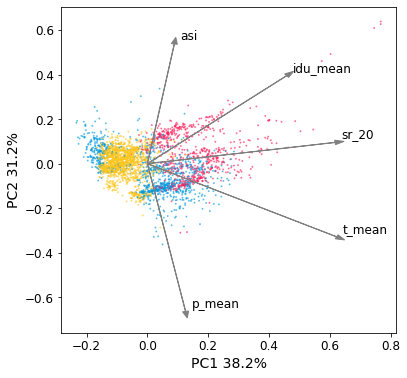

In [79]:
cmap = ListedColormap([c1,c2,c4])

features = ['t_mean','p_mean','idu_mean','asi']
# features = ['tdiff_mean','p_mean','idu_mean','asi']
f = f'{work_dir}/output/catchment_characteristics/master_characteristics_gswp-p_gleam-ep_gswp-t.csv'
df = pd.read_csv(f,index_col=0)
ff = features
ff.append('sr_20')
df = df[ff]
df = df.loc[ice.index]
df.loc[gr1,'gr'] = 0
df.loc[gr2,'gr'] = 1
df.loc[gr3,'gr'] = 2
# df.loc[gr4,'gr'] = 3

xx = df[features]
xx = StandardScaler().fit_transform(xx) #standardize all values
xx = pd.DataFrame(xx,columns=ff)
pca = PCA(n_components=len(ff))
components = pca.fit_transform(xx)
loadings = pca.components_ #eigenvector, length represents variance var explains

# Create dataframe
pca_df = pd.DataFrame(data=components[:,0:2],columns=['PC1', 'PC2'])
pca_df_scaled = pca_df.copy()
scaler_df = pca_df[['PC1', 'PC2']]
scaler = 1 / (scaler_df.max() - scaler_df.min()) # WAAROM DIT?
 
for index in scaler.index:
    pca_df_scaled[index] *= scaler[index]

per_var  = np.round(pca.explained_variance_ratio_ * 100, decimals=1)

xs = loadings[0]
ys = loadings[1]
ld_df = pd.DataFrame(index=ff, columns=['xs','ys'])
ld_df['xs'] = loadings[0]
ld_df['ys'] = loadings[1]
ld_df['len'] = np.sqrt(loadings[0]**2+loadings[1]**2)

fig=plt.figure(figsize=(6,6))
ax = fig.add_subplot(111)
ax.scatter(pca_df_scaled.PC1,pca_df_scaled.PC2,s=1,alpha=0.5,c=df.gr,cmap=cmap)
for i, varnames in enumerate(ff):
    ax.arrow(
        0, 0, # coordinates of arrow base
        ld_df.loc[ff[i]]['xs'], # length of the arrow along x
        ld_df.loc[ff[i]]['ys'], # length of the arrow along y
        color='grey',
        head_width=0.02
        )
    ax.text(ld_df.loc[ff[i]]['xs']+0.02, ld_df.loc[ff[i]]['ys']+0.02, varnames,size=12)
# xticks = np.linspace(-0.5,0.7, num=5)
# yticks = np.linspace(-0.3,0.8, num=5)
# ax.set_xticks(xticks)
# ax.set_yticks(yticks)
ax.tick_params(axis='both', which='major', labelsize=12)
ax.set_xlabel(f'PC1 {per_var[0]}%',size=14)
ax.set_ylabel(f'PC2 {per_var[1]}%',size=14)

fig.savefig(f'{work_dir}/output/regression/figures/interpretation/pca_p_mean_splitted.jpg',bbox_inches='tight',dpi=300)


In [ ]:
# extra scripts

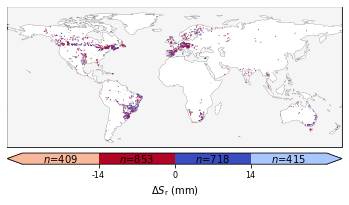

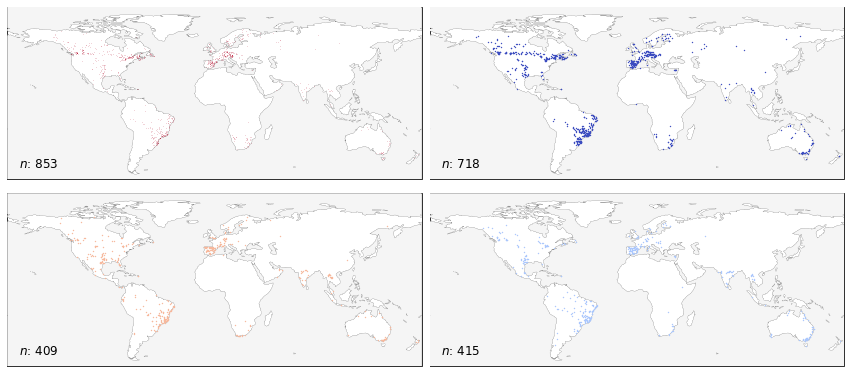

In [23]:
# maps
# cmap_vd2 = cm.get_cmap('RdBu', 21)
# cmap_rdbu = cm.get_cmap('coolwarm_r', 4)
cmap=cmap_rdbu
bounds = np.linspace(0, 4, 5)
bounds2 = bounds
norm = mpl.colors.BoundaryNorm(bounds, cmap_rdbu.N)

# TRAIN
fig2 = plt.figure(figsize=(6,6))
# plt.subplots_adjust(wspace=0000.1,hspace=-0.4)
ax = fig2.add_subplot(111,projection=ccrs.PlateCarree())
ax.coastlines(linewidth=0.1)
ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
ax.set_global()
ax.set_xlim(-180,180)
ax.set_ylim(-60,90)
s=ax.scatter(lon_train,lat_train,s=0.7,c=df_train.group,edgecolors='face',marker='o',linewidths=0.1,cmap=cmap_rdbu,norm=norm,zorder=101)
cbar = plt.colorbar(s, orientation='horizontal',spacing='proportional',extend='both', pad=0.02,aspect=30, norm=norm)
cbar.set_label('$\Delta$$S_\mathrm{r}$ (mm)')
cbar.set_ticks([1,2,3])
cbar.set_ticklabels([f'-{train_mae}','0',f'{train_mae}'],size=8)
for j, lab in enumerate([f'$n$={len(df_train[df_train.group==0])}',f'$n$={len(df_train[df_train.group==1])}',f'$n$={len(df_train[df_train.group==2])}',f'$n$={len(df_train[df_train.group==3])}']):
    cbar.ax.text((j + 0.5), 0.5, lab, ha='center', va='center')

# ax.set_title('train abs error [sr-mm - sr-pred] (mm)')
fig2.savefig(f'{work_dir}/output/regression/figures/interpretation/rf_regression_5var_allcatch_maps.jpg',bbox_inches='tight',dpi=300)

# train maps
fig2 = plt.figure(figsize=(15,12))
plt.subplots_adjust(wspace=0.02,hspace=-0.6)
ax = fig2.add_subplot(221,projection=ccrs.PlateCarree())
ax.coastlines(linewidth=0.1)
ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
ax.set_global()
ax.set_xlim(-180,180)
ax.set_ylim(-60,90)
gr = 1
ax.scatter(df_train[df_train.group==gr].lon,df_train[df_train.group==gr].lat,s=0.1,color=cmap(gr),edgecolors='face',marker='o',linewidths=0.1,cmap=cmap,norm=norm,zorder=101)
ax.text(-170,-50,f'$n$: {len(df_train[df_train.group==gr])}',fontsize=12,zorder=1001)

ax = fig2.add_subplot(222,projection=ccrs.PlateCarree())
ax.coastlines(linewidth=0.1)
ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
ax.set_global()
ax.set_xlim(-180,180)
ax.set_ylim(-60,90)
gr = 2
ax.scatter(df_train[df_train.group==gr].lon,df_train[df_train.group==gr].lat,s=1.5,color=cmap(gr),edgecolors='face',marker='o',linewidths=0.1,cmap=cmap,norm=norm,zorder=101)
ax.text(-170,-50,f'$n$: {len(df_train[df_train.group==gr])}',fontsize=12,zorder=1001)

ax = fig2.add_subplot(223,projection=ccrs.PlateCarree())
ax.coastlines(linewidth=0.1)
ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
ax.set_global()
ax.set_xlim(-180,180)
ax.set_ylim(-60,90)
gr = 0
ax.scatter(df_train[df_train.group==gr].lon,df_train[df_train.group==gr].lat,s=1.5,color=cmap(gr),edgecolors='face',marker='o',linewidths=0.1,cmap=cmap,norm=norm,zorder=101)
ax.text(-170,-50,f'$n$: {len(df_train[df_train.group==gr])}',fontsize=12,zorder=1001)

ax = fig2.add_subplot(224,projection=ccrs.PlateCarree())
ax.coastlines(linewidth=0.1)
ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
ax.set_global()
ax.set_xlim(-180,180)
ax.set_ylim(-60,90)
gr = 3
ax.scatter(df_train[df_train.group==gr].lon,df_train[df_train.group==gr].lat,s=1.5,color=cmap(gr),edgecolors='face',marker='o',linewidths=0.1,cmap=cmap,norm=norm,zorder=101)
ax.text(-170,-50,f'$n$: {len(df_train[df_train.group==gr])}',fontsize=12,zorder=1001)
fig2.savefig(f'{work_dir}/output/regression/figures/interpretation/rf_regression_5var_allcatch_mapsd.jpg',bbox_inches='tight',dpi=300)



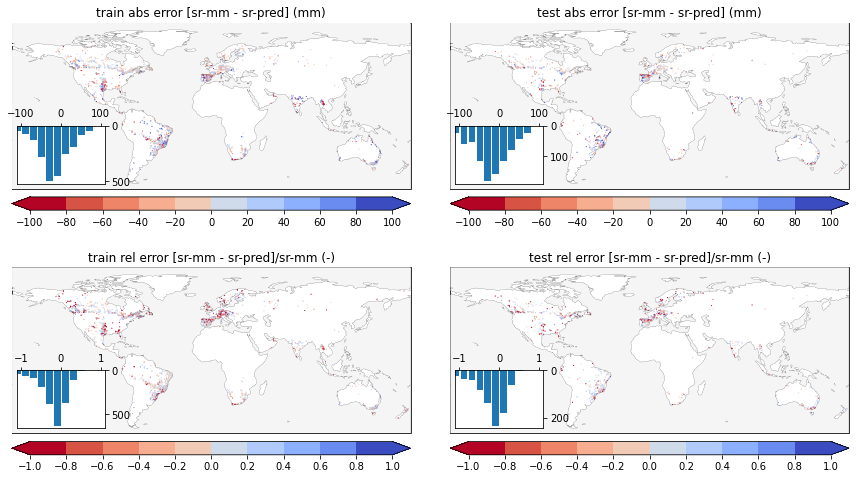

In [17]:
# maps
cmap_vd2 = cm.get_cmap('RdBu', 21)
cmap_rdbu = cm.get_cmap('coolwarm_r', 21)
# cmap_rdbu = cm.get_cmap('RdYlBu', 20)
# cmap_rdbu = cm.get_cmap('RdYlBu', 20)
# cmap_rdbu = ListedColormap([cmap_rdbu(0),cmap_rdbu(1),cmap_rdbu(2),cmap_rdbu(3),cmap_rdbu(4),cmap_rdbu(5),cmap_rdbu(6),cmap_rdbu(7),cmap_rdbu(8),
#                             (144/255,238/255,144/255),(144/255,238/255,144/255),
#                            cmap_rdbu(11),cmap_rdbu(12),cmap_rdbu(13),cmap_rdbu(14),cmap_rdbu(15),cmap_rdbu(16),cmap_rdbu(17),cmap_rdbu(18),cmap_rdbu(19)])

# cmap_rdbu = ListedColormap([cmap_rdbu(2),cmap_rdbu(3)])
bounds = np.linspace(-100,100,11)
bounds2 = np.linspace(-100,100,11)
norm = mpl.colors.BoundaryNorm(bounds, cmap_rdbu.N)

train_er = y_train - train_y_pred
test_er = y_test- test_y_pred
train_err = (y_train - train_y_pred)/y_train
test_err = (y_test- test_y_pred)/y_test
fig2 = plt.figure(figsize=(15,12))
plt.subplots_adjust(wspace=0000.1,hspace=-0.4)
ax = fig2.add_subplot(221,projection=ccrs.PlateCarree())
ax.coastlines(linewidth=0.1)
ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
ax.set_global()
ax.set_xlim(-180,180)
ax.set_ylim(-60,90)
s = ax.scatter(lon_train,lat_train,s=1,c=train_er,norm=norm,cmap=cmap_rdbu,edgecolors='face',marker='o',linewidths=0.1)
cbar = plt.colorbar(s, orientation='horizontal', label='',spacing='proportional',extend='both', pad=0.02,aspect=30, norm=norm,ticks=bounds2)
ax.set_title('train abs error [sr-mm - sr-pred] (mm)')

iax = inset_axes(ax, width="22%", height="35%",loc=3)
iax.hist(train_er,bins=bounds,width=(bounds[0]-bounds[1])*0.85)
iax.invert_yaxis()
iax.yaxis.tick_right()
iax.xaxis.tick_top()

ax = fig2.add_subplot(222,projection=ccrs.PlateCarree())
ax.coastlines(linewidth=0.1)
ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
ax.set_global()
ax.set_xlim(-180,180)
ax.set_ylim(-60,90)
s = ax.scatter(lon_test,lat_test,s=1,c=test_er,cmap=cmap_rdbu, norm=norm,edgecolors='face',marker='o',linewidths=0.1)
cbar = plt.colorbar(s, orientation='horizontal', label='',spacing='proportional',extend='both', pad=0.02,aspect=30, norm=norm,ticks=bounds2)
ax.set_title('test abs error [sr-mm - sr-pred] (mm)')

iax = inset_axes(ax, width="22%", height="35%",loc=3)
iax.hist(test_er,bins=bounds,width=(bounds[0]-bounds[1])*0.85)
iax.invert_yaxis()
iax.yaxis.tick_right()
iax.xaxis.tick_top()

bounds = np.linspace(-1,1,11)
bounds2 = np.linspace(-1,1,11)
norm = mpl.colors.BoundaryNorm(bounds, cmap_rdbu.N)

ax = fig2.add_subplot(223,projection=ccrs.PlateCarree())
ax.coastlines(linewidth=0.1)
ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
ax.set_global()
ax.set_xlim(-180,180)
ax.set_ylim(-60,90)
s = ax.scatter(lon_train,lat_train,s=1,c=train_err,norm=norm,cmap=cmap_rdbu,edgecolors='face',marker='o',linewidths=0.1)
cbar = plt.colorbar(s, orientation='horizontal', label='',spacing='proportional',extend='both', pad=0.02,aspect=30, norm=norm,ticks=bounds2)
ax.set_title('train rel error [sr-mm - sr-pred]/sr-mm (-)')

iax = inset_axes(ax, width="22%", height="35%",loc=3)
iax.hist(train_err,bins=bounds,width=(bounds[0]-bounds[1])*0.85)
iax.invert_yaxis()
iax.yaxis.tick_right()
iax.xaxis.tick_top()

ax = fig2.add_subplot(224,projection=ccrs.PlateCarree())
ax.coastlines(linewidth=0.1)
ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
ax.set_global()
ax.set_xlim(-180,180)
ax.set_ylim(-60,90)
s = ax.scatter(lon_test,lat_test,s=1,c=test_err,cmap=cmap_rdbu, norm=norm,edgecolors='face',marker='o',linewidths=0.1)
cbar = plt.colorbar(s, orientation='horizontal', label='',spacing='proportional',extend='both', pad=0.02,aspect=30, norm=norm,ticks=bounds2)
ax.set_title('test rel error [sr-mm - sr-pred]/sr-mm (-)')

iax = inset_axes(ax, width="22%", height="35%",loc=3)
iax.hist(test_err,bins=bounds,width=(bounds[0]-bounds[1])*0.85)
iax.invert_yaxis()
iax.yaxis.tick_right()
iax.xaxis.tick_top()
fig2.savefig(f'{work_dir}/output/regression/figures/interpretation/rf_regression_5var_allcatch_maps.jpg',bbox_inches='tight',dpi=300)


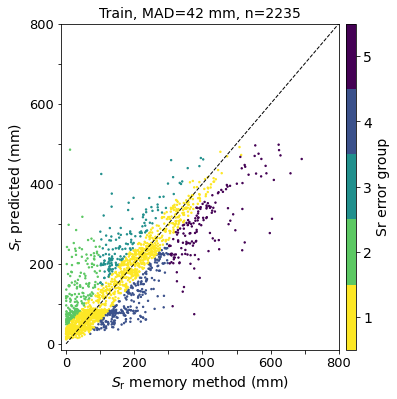

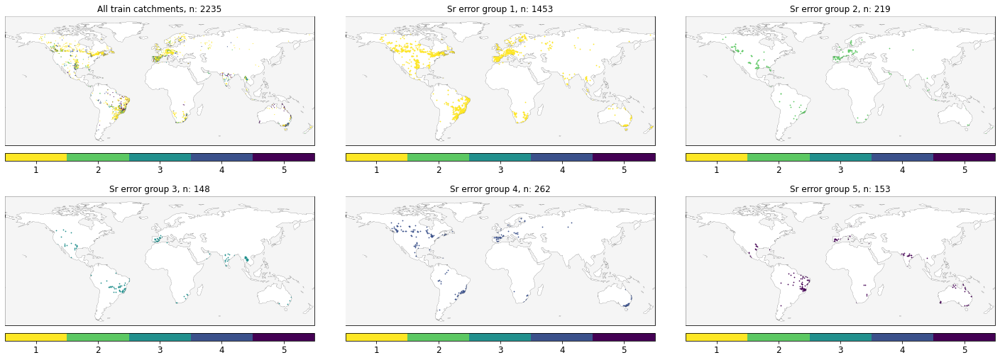

In [10]:
# color catchments in scatter plot based on error and use same colors on a map
df_train['group'] = np.nan
ix1 = df_train[(df_train['Sr_p-Sr_m']<train_mae) | (df_train['Sr_p-Sr_m']>-train_mae)].index
ix2 = df_train[(df_train['Sr_p-Sr_m']>train_mae) & (df_train['Sr_m']<100)].index
ix3 = df_train[(df_train['Sr_p-Sr_m']>train_mae) & (df_train['Sr_m']>100)].index
ix4 = df_train[(df_train['Sr_p-Sr_m']<-train_mae) & (df_train['Sr_m']<300)].index
ix5 = df_train[(df_train['Sr_p-Sr_m']<-train_mae) & (df_train['Sr_m']>300)].index

df_train.loc[ix1,'group'] = 0
df_train.loc[ix2,'group'] = 1
df_train.loc[ix3,'group'] = 2
df_train.loc[ix4,'group'] = 3
df_train.loc[ix5,'group'] = 4

# c2=(230/255,159/255,0/255)
# c3=(86/255,180/255,233/255)
# c4=(0/255,158/255,115/255)
# c5=(240/255,228/255,66/255)
# c6=(0/255,114/255,178/255)
# c7=(213/255,94/255,0/255)
# c8=(204/255,121/255,167/255)
# c = [c2,c4,c3,c5,c6]
# cml = ListedColormap(c)

# define the bins and normalize
bounds = np.linspace(0, 5, 6)
cmap = cm.get_cmap('viridis_r', 5)
norm = mpl.colors.BoundaryNorm(bounds, cmap.N)

fig1 = plt.figure(figsize=(6,6))
ax = fig1.add_subplot(111)
s=ax.scatter(df_train.Sr_m,df_train.Sr_p,c=df_train.group,s=2,cmap=cmap,norm=norm)
ax.plot([0,800],[0,800],'k--',linewidth=1)
ax.set_title(f'Train, MAD={train_mae} mm, n={n_train}',size=14)
ax.set_xlim(-15,800)
ax.set_ylim(-15,800)
ax.set_yticks([0,100,200,300,400,500,600,700,800])
ax.set_xticks([0,100,200,300,400,500,600,700,800])
ax.set_yticklabels([0,'',200,'',400,'',600,'',800])
ax.set_xticklabels([0,'',200,'',400,'',600,'',800])
ax.set_xlabel('$S_\mathrm{r}$ memory method (mm)',size=14)
ax.set_ylabel('$S_\mathrm{r}$ predicted (mm)',size=14)
ax.tick_params(axis='both', labelsize=13)
cbar = plt.colorbar(s, orientation='vertical',spacing='proportional',extend='neither', pad=0.02,aspect=30,norm=norm, ticks=bounds, boundaries=bounds)
cbar.ax.tick_params(labelsize=14)
cbar.ax.set_yticks([0.5,1.5,2.5,3.5,4.5])
cbar.ax.set_yticklabels(['1','2','3','4','5'])
cbar.set_label(label='Sr error group', size=14)
fig1.savefig(f'{work_dir}/output/regression/figures/interpretation/scatter_train_grouped.jpg',bbox_inches='tight',dpi=300)

# maps
fig2 = plt.figure(figsize=(25,25))
ax = fig2.add_subplot(231,projection=ccrs.PlateCarree())
plt.subplots_adjust(wspace=0.1,hspace=-0.77)
ax.coastlines(linewidth=0.1)
ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
s=ax.scatter(lon_train,lat_train,s=1,c=df_train.group,edgecolors='face',marker='o',linewidths=0.1,cmap=cmap,norm=norm)
ax.set_global()
ax.set_xlim(-180,180)
ax.set_ylim(-60,90)
cbar = plt.colorbar(s, ax=ax, orientation='horizontal', label='',spacing='proportional',extend='neither', pad=0.01,aspect=40,norm=norm, ticks=bounds, boundaries=bounds)
cbar.ax.tick_params(labelsize=12)
cbar.ax.set_xticks([0.5,1.5,2.5,3.5,4.5])
cbar.ax.set_xticklabels(['1','2','3','4','5'])
ax.set_title(f'All train catchments, n: {len(df_train)}',size=12)

ax = fig2.add_subplot(232,projection=ccrs.PlateCarree())
ax.coastlines(linewidth=0.1)
ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
ax.set_global()
ax.set_xlim(-180,180)
ax.set_ylim(-60,90)
ax.scatter(df_train[df_train.group==0].lon,df_train[df_train.group==0].lat,s=2.5,color=cmap(0),edgecolors='face',marker='o',linewidths=0.1,cmap=cmap,norm=norm)
cbar = plt.colorbar(s, ax=ax, orientation='horizontal', label='',spacing='proportional',extend='neither', pad=0.01,aspect=40,norm=norm, ticks=bounds, boundaries=bounds)
cbar.ax.tick_params(labelsize=12)
cbar.ax.set_xticks([0.5,1.5,2.5,3.5,4.5])
cbar.ax.set_xticklabels(['1','2','3','4','5'])
ax.set_title(f'Sr error group 1, n: {len(df_train[df_train.group==0])}',size=12)

ax = fig2.add_subplot(233,projection=ccrs.PlateCarree())
ax.coastlines(linewidth=0.1)
ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
ax.set_global()
ax.set_xlim(-180,180)
ax.set_ylim(-60,90)
ax.scatter(df_train[df_train.group==1].lon,df_train[df_train.group==1].lat,s=2.5,color=cmap(1),edgecolors='face',marker='o',linewidths=0.1,cmap=cmap,norm=norm)
cbar = plt.colorbar(s, ax=ax, orientation='horizontal', label='',spacing='proportional',extend='neither', pad=0.01,aspect=40,norm=norm, ticks=bounds, boundaries=bounds)
cbar.ax.tick_params(labelsize=12)
cbar.ax.set_xticks([0.5,1.5,2.5,3.5,4.5])
cbar.ax.set_xticklabels(['1','2','3','4','5'])
ax.set_title(f'Sr error group 2, n: {len(df_train[df_train.group==1])}',size=12)

ax = fig2.add_subplot(234,projection=ccrs.PlateCarree())
ax.coastlines(linewidth=0.1)
ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
ax.set_global()
ax.set_xlim(-180,180)
ax.set_ylim(-60,90)
ax.scatter(df_train[df_train.group==2].lon,df_train[df_train.group==2].lat,s=2.5,color=cmap(2),edgecolors='face',marker='o',linewidths=0.1,cmap=cmap,norm=norm)
cbar = plt.colorbar(s, ax=ax, orientation='horizontal', label='',spacing='proportional',extend='neither', pad=0.01,aspect=40,norm=norm, ticks=bounds, boundaries=bounds)
cbar.ax.tick_params(labelsize=12)
cbar.ax.set_xticks([0.5,1.5,2.5,3.5,4.5])
cbar.ax.set_xticklabels(['1','2','3','4','5'])
ax.set_title(f'Sr error group 3, n: {len(df_train[df_train.group==2])}',size=12)

ax = fig2.add_subplot(235,projection=ccrs.PlateCarree())
ax.coastlines(linewidth=0.1)
ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
ax.set_global()
ax.set_xlim(-180,180)
ax.set_ylim(-60,90)
ax.scatter(df_train[df_train.group==3].lon,df_train[df_train.group==3].lat,s=2.5,color=cmap(3),edgecolors='face',marker='o',linewidths=0.1,cmap=cmap,norm=norm)
cbar = plt.colorbar(s, ax=ax,orientation='horizontal', label='',spacing='proportional',extend='neither', pad=0.01,aspect=40,norm=norm, ticks=bounds, boundaries=bounds)
cbar.ax.tick_params(labelsize=12)
cbar.ax.set_xticks([0.5,1.5,2.5,3.5,4.5])
cbar.ax.set_xticklabels(['1','2','3','4','5'])
ax.set_title(f'Sr error group 4, n: {len(df_train[df_train.group==3])}',size=12)

ax = fig2.add_subplot(236,projection=ccrs.PlateCarree())
ax.coastlines(linewidth=0.1)
ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
ax.set_global()
ax.set_xlim(-180,180)
ax.set_ylim(-60,90)
ax.scatter(df_train[df_train.group==4].lon,df_train[df_train.group==4].lat,s=2.5,color=cmap(4),edgecolors='face',marker='o',linewidths=0.1,cmap=cmap,norm=norm)
cbar = plt.colorbar(s, ax=ax, orientation='horizontal', label='',spacing='proportional',extend='neither', pad=0.01,aspect=40,norm=norm, ticks=bounds, boundaries=bounds)
cbar.ax.tick_params(labelsize=12)
cbar.ax.set_xticks([0.5,1.5,2.5,3.5,4.5])
cbar.ax.set_xticklabels(['1','2','3','4','5'])
ax.set_title(f'Sr error group 5, n: {len(df_train[df_train.group==4])}',size=12)

fig2.savefig(f'{work_dir}/output/regression/figures/interpretation/maps_train_grouped.jpg',bbox_inches='tight',dpi=300)



In [47]:
# select catchments from test data to zoom in
# cid0 = 'za_0000220'
# cid1 = 'us_0005588'
# cid2 = 'ca_0004008'
# cid3 = 'es_0001098'
# cid4 = '410057'
# cid5 = 'br_0000292'

# without resampled points added to test
# cid0='br_0002638'
# cid1='es_0000236'
# cid2='ca_0005958'
# cid3='br_0001272'
# cid4='us_0006149'
# cid5='G8210010'

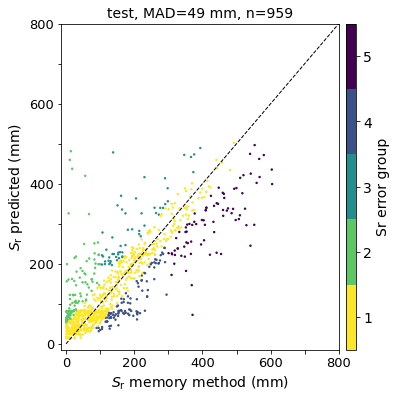

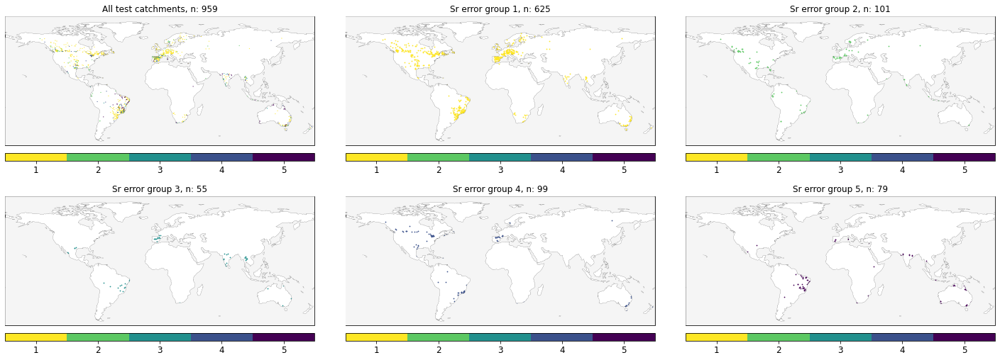

In [48]:
# color catchments in scatter plot based on error and use same colors on a map
df_test['group'] = np.nan
ix1 = df_test[(df_test['Sr_p-Sr_m']<test_mae) | (df_test['Sr_p-Sr_m']>-test_mae)].index
ix2 = df_test[(df_test['Sr_p-Sr_m']>test_mae) & (df_test['Sr_m']<100)].index
ix3 = df_test[(df_test['Sr_p-Sr_m']>test_mae) & (df_test['Sr_m']>100)].index
ix4 = df_test[(df_test['Sr_p-Sr_m']<-test_mae) & (df_test['Sr_m']<300)].index
ix5 = df_test[(df_test['Sr_p-Sr_m']<-test_mae) & (df_test['Sr_m']>300)].index

df_test.loc[ix1,'group'] = 0
df_test.loc[ix2,'group'] = 1
df_test.loc[ix3,'group'] = 2
df_test.loc[ix4,'group'] = 3
df_test.loc[ix5,'group'] = 4

# c2=(230/255,159/255,0/255)
# c3=(86/255,180/255,233/255)
# c4=(0/255,158/255,115/255)
# c5=(240/255,228/255,66/255)
# c6=(0/255,114/255,178/255)
# c7=(213/255,94/255,0/255)
# c8=(204/255,121/255,167/255)
# c = [c2,c4,c3,c5,c6]
# cml = ListedColormap(c)

# define the bins and normalize
bounds = np.linspace(0, 5, 6)
cmap = cm.get_cmap('viridis_r', 5)
norm = mpl.colors.BoundaryNorm(bounds, cmap.N)

fig1 = plt.figure(figsize=(6,6))
ax = fig1.add_subplot(111)
s=ax.scatter(df_test.Sr_m,df_test.Sr_p,c=df_test.group,s=2,cmap=cmap,norm=norm)
ax.plot([0,800],[0,800],'k--',linewidth=1)
ax.set_title(f'test, MAD={test_mae} mm, n={n_test}',size=14)
ax.set_xlim(-15,800)
ax.set_ylim(-15,800)
ax.set_yticks([0,100,200,300,400,500,600,700,800])
ax.set_xticks([0,100,200,300,400,500,600,700,800])
ax.set_yticklabels([0,'',200,'',400,'',600,'',800])
ax.set_xticklabels([0,'',200,'',400,'',600,'',800])
ax.set_xlabel('$S_\mathrm{r}$ memory method (mm)',size=14)
ax.set_ylabel('$S_\mathrm{r}$ predicted (mm)',size=14)
ax.tick_params(axis='both', labelsize=13)
cbar = plt.colorbar(s, orientation='vertical',spacing='proportional',extend='neither', pad=0.02,aspect=30,norm=norm, ticks=bounds, boundaries=bounds)
cbar.ax.tick_params(labelsize=14)
cbar.ax.set_yticks([0.5,1.5,2.5,3.5,4.5])
cbar.ax.set_yticklabels(['1','2','3','4','5'])
cbar.set_label(label='Sr error group', size=14)
fig1.savefig(f'{work_dir}/output/regression/figures/interpretation/scatter_test_grouped.jpg',bbox_inches='tight',dpi=300)

# maps
fig2 = plt.figure(figsize=(25,25))
ax = fig2.add_subplot(231,projection=ccrs.PlateCarree())
plt.subplots_adjust(wspace=0.1,hspace=-0.77)
ax.coastlines(linewidth=0.1)
ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
s=ax.scatter(lon_test,lat_test,s=1,c=df_test.group,edgecolors='face',marker='o',linewidths=0.1,cmap=cmap,norm=norm)
ax.set_global()
ax.set_xlim(-180,180)
ax.set_ylim(-60,90)
cbar = plt.colorbar(s, ax=ax, orientation='horizontal', label='',spacing='proportional',extend='neither', pad=0.01,aspect=40,norm=norm, ticks=bounds, boundaries=bounds)
cbar.ax.tick_params(labelsize=12)
cbar.ax.set_xticks([0.5,1.5,2.5,3.5,4.5])
cbar.ax.set_xticklabels(['1','2','3','4','5'])
ax.set_title(f'All test catchments, n: {len(df_test)}',size=12)

ax = fig2.add_subplot(232,projection=ccrs.PlateCarree())
ax.coastlines(linewidth=0.1)
ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
ax.set_global()
ax.set_xlim(-180,180)
ax.set_ylim(-60,90)
ax.scatter(df_test[df_test.group==0].lon,df_test[df_test.group==0].lat,s=2.5,color=cmap(0),edgecolors='face',marker='o',linewidths=0.1,cmap=cmap,norm=norm)
cbar = plt.colorbar(s, ax=ax, orientation='horizontal', label='',spacing='proportional',extend='neither', pad=0.01,aspect=40,norm=norm, ticks=bounds, boundaries=bounds)
cbar.ax.tick_params(labelsize=12)
cbar.ax.set_xticks([0.5,1.5,2.5,3.5,4.5])
cbar.ax.set_xticklabels(['1','2','3','4','5'])
ax.set_title(f'Sr error group 1, n: {len(df_test[df_test.group==0])}',size=12)

ax = fig2.add_subplot(233,projection=ccrs.PlateCarree())
ax.coastlines(linewidth=0.1)
ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
ax.set_global()
ax.set_xlim(-180,180)
ax.set_ylim(-60,90)
ax.scatter(df_test[df_test.group==1].lon,df_test[df_test.group==1].lat,s=2.5,color=cmap(1),edgecolors='face',marker='o',linewidths=0.1,cmap=cmap,norm=norm)
cbar = plt.colorbar(s, ax=ax, orientation='horizontal', label='',spacing='proportional',extend='neither', pad=0.01,aspect=40,norm=norm, ticks=bounds, boundaries=bounds)
cbar.ax.tick_params(labelsize=12)
cbar.ax.set_xticks([0.5,1.5,2.5,3.5,4.5])
cbar.ax.set_xticklabels(['1','2','3','4','5'])
ax.set_title(f'Sr error group 2, n: {len(df_test[df_test.group==1])}',size=12)

ax = fig2.add_subplot(234,projection=ccrs.PlateCarree())
ax.coastlines(linewidth=0.1)
ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
ax.set_global()
ax.set_xlim(-180,180)
ax.set_ylim(-60,90)
ax.scatter(df_test[df_test.group==2].lon,df_test[df_test.group==2].lat,s=2.5,color=cmap(2),edgecolors='face',marker='o',linewidths=0.1,cmap=cmap,norm=norm)
cbar = plt.colorbar(s, ax=ax, orientation='horizontal', label='',spacing='proportional',extend='neither', pad=0.01,aspect=40,norm=norm, ticks=bounds, boundaries=bounds)
cbar.ax.tick_params(labelsize=12)
cbar.ax.set_xticks([0.5,1.5,2.5,3.5,4.5])
cbar.ax.set_xticklabels(['1','2','3','4','5'])
ax.set_title(f'Sr error group 3, n: {len(df_test[df_test.group==2])}',size=12)

ax = fig2.add_subplot(235,projection=ccrs.PlateCarree())
ax.coastlines(linewidth=0.1)
ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
ax.set_global()
ax.set_xlim(-180,180)
ax.set_ylim(-60,90)
ax.scatter(df_test[df_test.group==3].lon,df_test[df_test.group==3].lat,s=2.5,color=cmap(3),edgecolors='face',marker='o',linewidths=0.1,cmap=cmap,norm=norm)
cbar = plt.colorbar(s, ax=ax,orientation='horizontal', label='',spacing='proportional',extend='neither', pad=0.01,aspect=40,norm=norm, ticks=bounds, boundaries=bounds)
cbar.ax.tick_params(labelsize=12)
cbar.ax.set_xticks([0.5,1.5,2.5,3.5,4.5])
cbar.ax.set_xticklabels(['1','2','3','4','5'])
ax.set_title(f'Sr error group 4, n: {len(df_test[df_test.group==3])}',size=12)

ax = fig2.add_subplot(236,projection=ccrs.PlateCarree())
ax.coastlines(linewidth=0.1)
ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
ax.set_global()
ax.set_xlim(-180,180)
ax.set_ylim(-60,90)
ax.scatter(df_test[df_test.group==4].lon,df_test[df_test.group==4].lat,s=2.5,color=cmap(4),edgecolors='face',marker='o',linewidths=0.1,cmap=cmap,norm=norm)
cbar = plt.colorbar(s, ax=ax, orientation='horizontal', label='',spacing='proportional',extend='neither', pad=0.01,aspect=40,norm=norm, ticks=bounds, boundaries=bounds)
cbar.ax.tick_params(labelsize=12)
cbar.ax.set_xticks([0.5,1.5,2.5,3.5,4.5])
cbar.ax.set_xticklabels(['1','2','3','4','5'])
ax.set_title(f'Sr error group 5, n: {len(df_test[df_test.group==4])}',size=12)

fig2.savefig(f'{work_dir}/output/regression/figures/interpretation/maps_test_grouped.jpg',bbox_inches='tight',dpi=300)


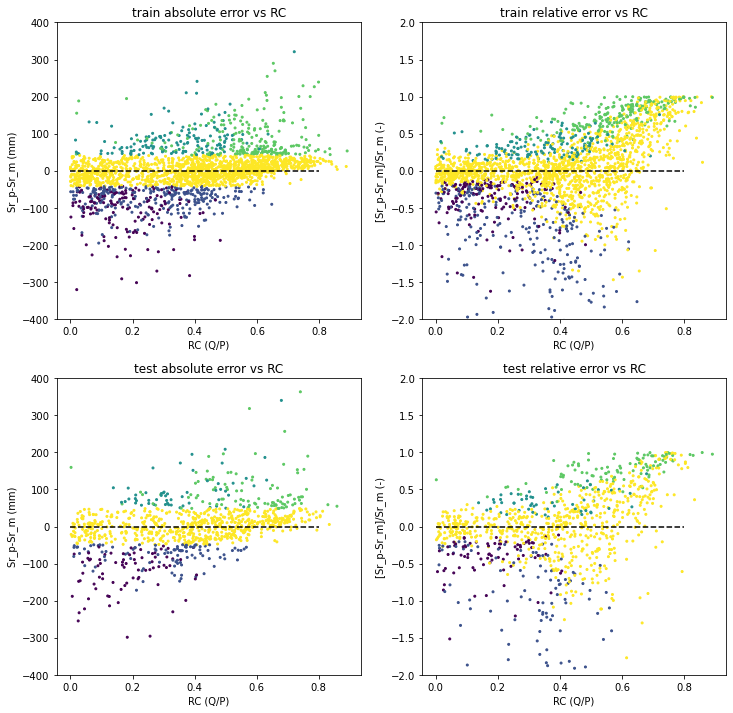

In [49]:
# plot error vs runoff coefficient
dff = pd.read_csv(f'{work_dir}/output/catchment_characteristics/master_characteristics_{data_sources}.csv',index_col=0)

df_test['rc'] = dff['q_mean']/dff['p_mean']
df_train['rc'] = dff['q_mean']/dff['p_mean']

# define the bins and normalize
bounds = np.linspace(0, 5, 6)
cmap = cm.get_cmap('viridis_r', 5)
norm = mpl.colors.BoundaryNorm(bounds, cmap.N)

fig = plt.figure(figsize=(12,12))
ax = fig.add_subplot(221)
ax.scatter(df_train['rc'],df_train['Sr_p-Sr_m'],c=df_train['group'],s=4,cmap=cmap,norm=norm)
ax.plot([0,0.8],[0,0],'k--')
ax.set_ylim(-400,400)
ax.set_xlabel('RC (Q/P)')
ax.set_ylabel('Sr_p-Sr_m (mm)')
ax.set_title('train absolute error vs RC')

ax = fig.add_subplot(222)
ax.scatter(df_train['rc'],df_train['(Sr_p-Sr_m)/Sr_m'],c=df_train['group'],s=4,cmap=cmap,norm=norm)
ax.plot([0,0.8],[0,0],'k--')
ax.set_ylim(-2,2)
ax.set_xlabel('RC (Q/P)')
ax.set_ylabel('[Sr_p-Sr_m]/Sr_m (-)')
ax.set_title('train relative error vs RC')

ax = fig.add_subplot(223)
ax.scatter(df_test['rc'],df_test['Sr_p-Sr_m'],c=df_test['group'],s=4,cmap=cmap,norm=norm)
ax.set_ylim(-400,400)
ax.plot([0,0.8],[0,0],'k--')
ax.set_xlabel('RC (Q/P)')
ax.set_ylabel('Sr_p-Sr_m (mm)')
ax.set_title('test absolute error vs RC')

ax = fig.add_subplot(224)
ax.scatter(df_test['rc'],df_test['(Sr_p-Sr_m)/Sr_m'],c=df_test['group'],s=4,cmap=cmap,norm=norm)
ax.plot([0,0.8],[0,0],'k--')
ax.set_ylim(-2,2)
ax.set_xlabel('RC (Q/P)')
ax.set_ylabel('[Sr_p-Sr_m]/Sr_m (-)')
ax.set_title('test relative error vs RC')

fig.savefig(f'{work_dir}/output/regression/figures/interpretation/error_groups_rc.jpg',bbox_inches='tight',dpi=300)

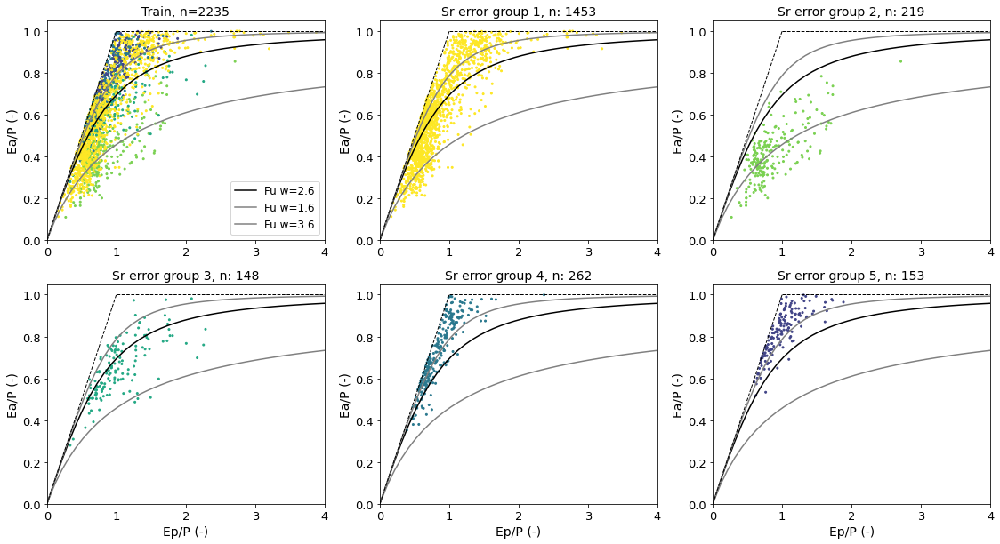

In [50]:
# plot in budyko
dff = pd.read_csv(f'{work_dir}/output/catchment_characteristics/master_characteristics_{data_sources}.csv',index_col=0)

df_train['bud_x'] = dff['ep_mean']/dff['p_mean']
df_train['bud_y'] = (dff['p_mean']-dff['q_mean'])/dff['p_mean']

ai = np.linspace(0.01,5,50)
budy_s = 1-np.exp(-ai)
budy_o = ai*np.tanh(1/ai)
budy_b = np.sqrt(ai*(np.tanh(1/ai)*(1-np.exp(-ai))))
budy_t = 1/(np.sqrt(0.9+((1/ai)**2)))
w=2.6
budy_f = 1 + ai - (1 + ai**w)**(1/w)
w = 1.6
budy_f1 = 1 + ai - (1 + ai**w)**(1/w)
w=3.6
budy_f2 = 1 + ai - (1 + ai**w)**(1/w)

# define the bins and normalize
bounds = np.linspace(0, 6, 7)
cmap = cm.get_cmap('viridis_r', 6)
norm = mpl.colors.BoundaryNorm(bounds, cmap.N)

fig = plt.figure(figsize=(19,10))
ax = fig.add_subplot(231)
ax.scatter(df_train['bud_x'],df_train['bud_y'],c=df_train['group'],s=4,cmap=cmap,norm=norm)
ax.plot(ai,budy_f, label='Fu w=2.6', color='k',linewidth=1.5)
ax.plot(ai,budy_f1, label='Fu w=1.6', color='grey',linewidth=1.5)
ax.plot(ai,budy_f2, label='Fu w=3.6', color='grey',linewidth=1.5)
ax.plot([0,1],[0,1],'k--',linewidth=1)
ax.plot([1,12],[1,1],'k--',linewidth=1)
ax.plot([0,12],[0,0],'k--',linewidth=1)
ax.set_title(f'Train, n={n_train}',size=14)
ax.set_xlim(0,4)
ax.set_ylim(0,1.05)
# ax.set_xlabel('Ep/P (-)',size=14)
ax.set_ylabel('Ea/P (-)',size=14)
ax.tick_params(axis='both', labelsize=13)
ax.legend(fontsize=12)

ax = fig.add_subplot(232)
ax.scatter(df_train[df_train.group==0]['bud_x'],df_train[df_train.group==0]['bud_y'],c=df_train[df_train.group==0]['group'],s=4,cmap=cmap,norm=norm)
ax.plot(ai,budy_f, label='Fu w=2.6', color='k',linewidth=1.5)
ax.plot(ai,budy_f1, label='Fu w=1.6', color='grey',linewidth=1.5)
ax.plot(ai,budy_f2, label='Fu w=3.6', color='grey',linewidth=1.5)
ax.plot([0,1],[0,1],'k--',linewidth=1)
ax.plot([1,12],[1,1],'k--',linewidth=1)
ax.plot([0,12],[0,0],'k--',linewidth=1)
ax.set_title(f'Train, n={n_train}',size=14)
ax.set_xlim(0,4)
ax.set_ylim(0,1.05)
# ax.set_xlabel('Ep/P (-)',size=14)
ax.set_ylabel('Ea/P (-)',size=14)
ax.tick_params(axis='both', labelsize=13)
ax.set_title(f'Sr error group 1, n: {len(df_train[df_train.group==0])}',size=14)

ax = fig.add_subplot(233)
ax.scatter(df_train[df_train.group==1]['bud_x'],df_train[df_train.group==1]['bud_y'],c=df_train[df_train.group==1]['group'],s=4,cmap=cmap,norm=norm)
ax.plot(ai,budy_f, label='Fu w=2.6', color='k',linewidth=1.5)
ax.plot(ai,budy_f1, label='Fu w=1.6', color='grey',linewidth=1.5)
ax.plot(ai,budy_f2, label='Fu w=3.6', color='grey',linewidth=1.5)
ax.plot([0,1],[0,1],'k--',linewidth=1)
ax.plot([1,12],[1,1],'k--',linewidth=1)
ax.plot([0,12],[0,0],'k--',linewidth=1)
ax.set_xlim(0,4)
ax.set_ylim(0,1.05)
# ax.set_xlabel('Ep/P (-)',size=14)
ax.set_ylabel('Ea/P (-)',size=14)
ax.tick_params(axis='both', labelsize=13)
ax.set_title(f'Sr error group 2, n: {len(df_train[df_train.group==1])}',size=14)

ax = fig.add_subplot(234)
ax.scatter(df_train[df_train.group==2]['bud_x'],df_train[df_train.group==2]['bud_y'],c=df_train[df_train.group==2]['group'],s=4,cmap=cmap,norm=norm)
ax.plot(ai,budy_f, label='Fu w=2.6', color='k',linewidth=1.5)
ax.plot(ai,budy_f1, label='Fu w=1.6', color='grey',linewidth=1.5)
ax.plot(ai,budy_f2, label='Fu w=3.6', color='grey',linewidth=1.5)
ax.plot([0,1],[0,1],'k--',linewidth=1)
ax.plot([1,12],[1,1],'k--',linewidth=1)
ax.plot([0,12],[0,0],'k--',linewidth=1)
ax.set_xlim(0,4)
ax.set_ylim(0,1.05)
ax.set_xlabel('Ep/P (-)',size=14)
ax.set_ylabel('Ea/P (-)',size=14)
ax.tick_params(axis='both', labelsize=13)
ax.set_title(f'Sr error group 3, n: {len(df_train[df_train.group==2])}',size=14)

ax = fig.add_subplot(235)
ax.scatter(df_train[df_train.group==3]['bud_x'],df_train[df_train.group==3]['bud_y'],c=df_train[df_train.group==3]['group'],s=4,cmap=cmap,norm=norm)
ax.plot(ai,budy_f, label='Fu w=2.6', color='k',linewidth=1.5)
ax.plot(ai,budy_f1, label='Fu w=1.6', color='grey',linewidth=1.5)
ax.plot(ai,budy_f2, label='Fu w=3.6', color='grey',linewidth=1.5)
ax.plot([0,1],[0,1],'k--',linewidth=1)
ax.plot([1,12],[1,1],'k--',linewidth=1)
ax.plot([0,12],[0,0],'k--',linewidth=1)
ax.set_xlim(0,4)
ax.set_ylim(0,1.05)
ax.set_xlabel('Ep/P (-)',size=14)
ax.set_ylabel('Ea/P (-)',size=14)
ax.tick_params(axis='both', labelsize=13)
ax.set_title(f'Sr error group 4, n: {len(df_train[df_train.group==3])}',size=14)

ax = fig.add_subplot(236)
ax.scatter(df_train[df_train.group==4]['bud_x'],df_train[df_train.group==4]['bud_y'],c=df_train[df_train.group==4]['group'],s=4,cmap=cmap,norm=norm)
ax.plot(ai,budy_f, label='Fu w=2.6', color='k',linewidth=1.5)
ax.plot(ai,budy_f1, label='Fu w=1.6', color='grey',linewidth=1.5)
ax.plot(ai,budy_f2, label='Fu w=3.6', color='grey',linewidth=1.5)
ax.plot([0,1],[0,1],'k--',linewidth=1)
ax.plot([1,12],[1,1],'k--',linewidth=1)
ax.plot([0,12],[0,0],'k--',linewidth=1)
ax.set_xlim(0,4)
ax.set_ylim(0,1.05)
ax.set_xlabel('Ep/P (-)',size=14)
ax.set_ylabel('Ea/P (-)',size=14)
ax.tick_params(axis='both', labelsize=13)
ax.set_title(f'Sr error group 5, n: {len(df_train[df_train.group==4])}',size=14)

fig.savefig(f'{work_dir}/output/regression/figures/interpretation/error_groups_budyko_train.jpg',bbox_inches='tight',dpi=300)


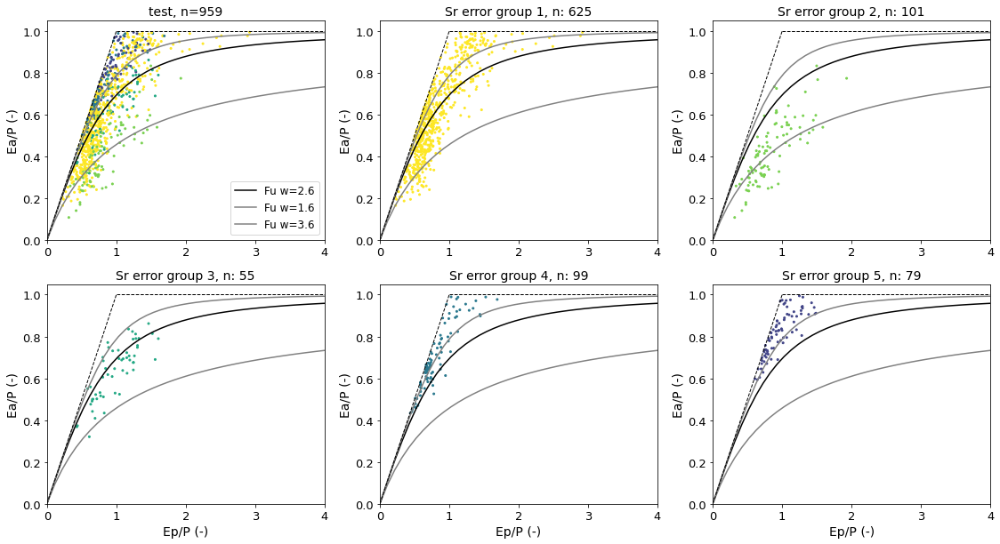

In [51]:
# plot in budyko
dff = pd.read_csv(f'{work_dir}/output/catchment_characteristics/master_characteristics_{data_sources}.csv',index_col=0)

df_test['bud_x'] = dff['ep_mean']/dff['p_mean']
df_test['bud_y'] = (dff['p_mean']-dff['q_mean'])/dff['p_mean']

# define the bins and normalize
bounds = np.linspace(0, 6, 7)
cmap = cm.get_cmap('viridis_r', 6)
norm = mpl.colors.BoundaryNorm(bounds, cmap.N)

fig = plt.figure(figsize=(19,10))
ax = fig.add_subplot(231)
ax.scatter(df_test['bud_x'],df_test['bud_y'],c=df_test['group'],s=4,cmap=cmap,norm=norm)
ax.plot(ai,budy_f, label='Fu w=2.6', color='k',linewidth=1.5)
ax.plot(ai,budy_f1, label='Fu w=1.6', color='grey',linewidth=1.5)
ax.plot(ai,budy_f2, label='Fu w=3.6', color='grey',linewidth=1.5)
ax.plot([0,1],[0,1],'k--',linewidth=1)
ax.plot([1,12],[1,1],'k--',linewidth=1)
ax.plot([0,12],[0,0],'k--',linewidth=1)
ax.set_title(f'test, n={n_test}',size=14)
ax.set_xlim(0,4)
ax.set_ylim(0,1.05)
# ax.set_xlabel('Ep/P (-)',size=14)
ax.set_ylabel('Ea/P (-)',size=14)
ax.tick_params(axis='both', labelsize=13)
ax.legend(fontsize=12)

ax = fig.add_subplot(232)
ax.scatter(df_test[df_test.group==0]['bud_x'],df_test[df_test.group==0]['bud_y'],c=df_test[df_test.group==0]['group'],s=4,cmap=cmap,norm=norm)
ax.plot(ai,budy_f, label='Fu w=2.6', color='k',linewidth=1.5)
ax.plot(ai,budy_f1, label='Fu w=1.6', color='grey',linewidth=1.5)
ax.plot(ai,budy_f2, label='Fu w=3.6', color='grey',linewidth=1.5)
ax.plot([0,1],[0,1],'k--',linewidth=1)
ax.plot([1,12],[1,1],'k--',linewidth=1)
ax.plot([0,12],[0,0],'k--',linewidth=1)
ax.set_title(f'test, n={n_test}',size=14)
ax.set_xlim(0,4)
ax.set_ylim(0,1.05)
# ax.set_xlabel('Ep/P (-)',size=14)
ax.set_ylabel('Ea/P (-)',size=14)
ax.tick_params(axis='both', labelsize=13)
ax.set_title(f'Sr error group 1, n: {len(df_test[df_test.group==0])}',size=14)

ax = fig.add_subplot(233)
ax.scatter(df_test[df_test.group==1]['bud_x'],df_test[df_test.group==1]['bud_y'],c=df_test[df_test.group==1]['group'],s=4,cmap=cmap,norm=norm)
ax.plot(ai,budy_f, label='Fu w=2.6', color='k',linewidth=1.5)
ax.plot(ai,budy_f1, label='Fu w=1.6', color='grey',linewidth=1.5)
ax.plot(ai,budy_f2, label='Fu w=3.6', color='grey',linewidth=1.5)
ax.plot([0,1],[0,1],'k--',linewidth=1)
ax.plot([1,12],[1,1],'k--',linewidth=1)
ax.plot([0,12],[0,0],'k--',linewidth=1)
ax.set_xlim(0,4)
ax.set_ylim(0,1.05)
# ax.set_xlabel('Ep/P (-)',size=14)
ax.set_ylabel('Ea/P (-)',size=14)
ax.tick_params(axis='both', labelsize=13)
ax.set_title(f'Sr error group 2, n: {len(df_test[df_test.group==1])}',size=14)

ax = fig.add_subplot(234)
ax.scatter(df_test[df_test.group==2]['bud_x'],df_test[df_test.group==2]['bud_y'],c=df_test[df_test.group==2]['group'],s=4,cmap=cmap,norm=norm)
ax.plot(ai,budy_f, label='Fu w=2.6', color='k',linewidth=1.5)
ax.plot(ai,budy_f1, label='Fu w=1.6', color='grey',linewidth=1.5)
ax.plot(ai,budy_f2, label='Fu w=3.6', color='grey',linewidth=1.5)
ax.plot([0,1],[0,1],'k--',linewidth=1)
ax.plot([1,12],[1,1],'k--',linewidth=1)
ax.plot([0,12],[0,0],'k--',linewidth=1)
ax.set_xlim(0,4)
ax.set_ylim(0,1.05)
ax.set_xlabel('Ep/P (-)',size=14)
ax.set_ylabel('Ea/P (-)',size=14)
ax.tick_params(axis='both', labelsize=13)
ax.set_title(f'Sr error group 3, n: {len(df_test[df_test.group==2])}',size=14)

ax = fig.add_subplot(235)
ax.scatter(df_test[df_test.group==3]['bud_x'],df_test[df_test.group==3]['bud_y'],c=df_test[df_test.group==3]['group'],s=4,cmap=cmap,norm=norm)
ax.plot(ai,budy_f, label='Fu w=2.6', color='k',linewidth=1.5)
ax.plot(ai,budy_f1, label='Fu w=1.6', color='grey',linewidth=1.5)
ax.plot(ai,budy_f2, label='Fu w=3.6', color='grey',linewidth=1.5)
ax.plot([0,1],[0,1],'k--',linewidth=1)
ax.plot([1,12],[1,1],'k--',linewidth=1)
ax.plot([0,12],[0,0],'k--',linewidth=1)
ax.set_xlim(0,4)
ax.set_ylim(0,1.05)
ax.set_xlabel('Ep/P (-)',size=14)
ax.set_ylabel('Ea/P (-)',size=14)
ax.tick_params(axis='both', labelsize=13)
ax.set_title(f'Sr error group 4, n: {len(df_test[df_test.group==3])}',size=14)

ax = fig.add_subplot(236)
ax.scatter(df_test[df_test.group==4]['bud_x'],df_test[df_test.group==4]['bud_y'],c=df_test[df_test.group==4]['group'],s=4,cmap=cmap,norm=norm)
ax.plot(ai,budy_f, label='Fu w=2.6', color='k',linewidth=1.5)
ax.plot(ai,budy_f1, label='Fu w=1.6', color='grey',linewidth=1.5)
ax.plot(ai,budy_f2, label='Fu w=3.6', color='grey',linewidth=1.5)
ax.plot([0,1],[0,1],'k--',linewidth=1)
ax.plot([1,12],[1,1],'k--',linewidth=1)
ax.plot([0,12],[0,0],'k--',linewidth=1)
ax.set_xlim(0,4)
ax.set_ylim(0,1.05)
ax.set_xlabel('Ep/P (-)',size=14)
ax.set_ylabel('Ea/P (-)',size=14)
ax.tick_params(axis='both', labelsize=13)
ax.set_title(f'Sr error group 5, n: {len(df_test[df_test.group==4])}',size=14)

fig.savefig(f'{work_dir}/output/regression/figures/interpretation/error_groups_budyko_test.jpg',bbox_inches='tight',dpi=300)

In [52]:
def plot_timeseries(cid,df_test):
    ms = pd.read_csv(f'{work_dir}/output/forcing_timeseries/mswep_p/mean_p_1981_2010.csv',index_col=0)
    eph = pd.read_csv(f'{work_dir}/output/forcing_timeseries/ep_hs_mean_catchments.csv',index_col=0)
    df = pd.read_csv(f'{work_dir}/output/catchment_characteristics/master_characteristics_{data_sources}.csv',index_col=0)
    df['mswep_pmean'] = ms.mswep_pmean
    ts = pd.read_csv(f'{work_dir}/output/sr_calculation/sd_catchments/irri/f0.9ia/sd/{cid}_f0.9ia.csv',index_col=0)
    # ts2 = pd.read_csv(f'{work_dir}/output/sr_calculation/sd_catchments/snow/sd/{cid}_nosnow.csv',index_col=0)
    ts.index = pd.to_datetime(ts.index)
    # ts2.index = pd.to_datetime(ts2.index)   
    ts = ts.groupby(pd.Grouper(freq="M")).mean()
    # ts2 = ts2.groupby(pd.Grouper(freq="M")).mean()
    
    sr = int(df_test.loc[cid].Sr_m)
    srp = int(df_test.loc[cid].Sr_p)
    epmhs = int(eph.loc[cid].ep_hs_mean*365)
    
    fig = plt.figure(figsize=(18,7))
    ax = fig.add_subplot(311)
    if ('sd2' in ts.columns):
        ax.plot(ts.index,ts.sd2,label='Sd (mm)')
    else:
        ax.plot(ts.index,ts.Sd,label='Sd (mm)')
    # ax.plot(ts2.index,ts2.Sd,label='Sd no snow (mm)')
    ax.set_title(f'{cid}, Srm: {sr} mm, Srp: {srp} mm, p_m-gswp={int(df.loc[cid].p_mean*365)} mm/y, p_m-mswep={int(df.loc[cid].mswep_pmean*365)} mm/y, q_m={int(df.loc[cid].q_mean*365)} mm/y, ep_m_gleam={int(df.loc[cid].ep_mean*365)} mm/y, ep_m_hs={epmhs}mm/y',size=14)
    ax.legend(fontsize=15)
    ax.tick_params(labelsize=14)

    ax = fig.add_subplot(312)
    ax.plot(ts.index,ts.ep, label='Ep (mm/d)')
    ax.plot(ts.index,ts.Et, label='Et (mm/d)')
    ax.legend(fontsize=15)
    ax.tick_params(labelsize=14)
    
    ax = fig.add_subplot(313)
    ax.plot(ts.index,ts.p, label='P (mm/d)')
    if ('ps' in ts.columns):
        ax.plot(ts.index,ts.ps, label='Ps (mm/d)')
        ax.plot(ts.index,ts.pl, label='Pl (mm/d)')
        ax.plot(ts.index,ts.pm, label='Pm (mm/d)')
    # ax.plot(ts.index,ts.Pe, label='Pe (mm/d)')
    ax.legend(fontsize=15)
    ax.tick_params(labelsize=14)
    fig.savefig(f'{work_dir}/output/regression/figures/interpretation/test_timeseries_{cid}.jpg',bbox_inches='tight',dpi=300)
    
    fig = plt.figure(figsize=(8,8))
    ax = plt.axes(projection=ccrs.PlateCarree())
    ax.coastlines(linewidth=0.1)
    ax.add_feature(cartopy.feature.OCEAN, zorder=100,facecolor='whitesmoke', edgecolor='k',linewidth=0.1)
    ax.set_global()
    ax.set_xlim(-180,180)
    ax.set_ylim(-60,90)
    ax.plot(df.loc[cid].lon,df.loc[cid].lat,'ro',zorder=101)
    sr = int(df.loc[cid].sr_20)
    srp = int(df_test.loc[cid].Sr_p)
    ax.set_title(f'Sr memory method: {sr} mm, Sr predicted: {srp} mm')

In [53]:
# plot_timeseries(cid0,df_test)
# plot_timeseries(cid1,df_test)
# plot_timeseries(cid2,df_test)
# plot_timeseries(cid3,df_test)
# plot_timeseries(cid4,df_test)
# plot_timeseries(cid5,df_test)

Text(0.5, 1.0, '')

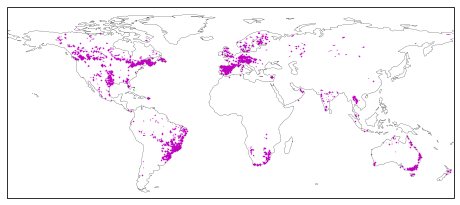

In [106]:
# plot shapes instead of points
sh = gpd.read_file(f'{work_dir}/output/geo_catchments.shp')
sh.index = sh.catch_id
sh = sh.loc[df_train.index]

area = pd.read_csv(f'{work_dir}/output/catchment_area.csv',index_col=0)
area = area.loc[df_train.index]
ixp = area[area.area<1500].index
ixs = area[area.area>1500].index
shp = sh.loc[ixs]
p = df_train.loc[ixp]

fig = plt.figure(figsize=(8,6))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.coastlines(linewidth=0.2)
ax.set_xlim(-180,180)
ax.set_ylim(-60,90)
sh.plot(edgecolor=None,facecolor='m',linewidth=0.05,ax=ax)
ax.plot(p.lon,p.lat,'o', markeredgecolor='m', markerfacecolor='m',markersize=0.5)
ax.set_title(f'',size=20)